# A pipeline which extracts Tiles with Tissue from Whole Slide Pathology Images

In [1]:
# Import Scikit and Keras (for ML Classification/Training) libraries
from scipy import ndimage
from skimage.measure import regionprops
from skimage.segmentation import slic
from keras.models import Model, load_model

Using TensorFlow backend.


# Import OS, Python Utilities

In [2]:
import os
import sys
import json
import time

import numpy as np
import dask
import h5py
from ctk_cli import CLIArgumentParser
import logging
logging.basicConfig(level=logging.CRITICAL)
import matplotlib.pyplot as plt

In [3]:
sys.path.append("/HistomicsTK/server/cli_common/")
import utils as cli_utils

INFO:girder:Created LRU Cache for 'tilesource' with 104 maximum size
INFO:root:Notice: Could not import MapnikTileSource


# Import HistomicsTK libraries

In [4]:
import histomicstk.preprocessing.color_normalization as htk_cnorm
import histomicstk.preprocessing.color_deconvolution as htk_cdeconv
import histomicstk.segmentation as htk_seg

import histomicstk.utils as htk_utils

# Import large_Image library

In [5]:
import large_image

# Get Tile Source from large_image library

In [6]:
img_path= "/data/train/TCGA-AA-3544-01Z-00-DX1.96850cbf-2305-4b65-8f06-db801af51cc3.svs"
ts = large_image.getTileSource(img_path)

INFO:girder:Cannot use memcached for caching.
INFO:girder:Using python for large_image caching


Using python for large_image caching


In [7]:
kwargs = dict(format=large_image.tilesource.TILE_FORMAT_NUMPY)

# Total number of tiles in the image
total_tiles = ts.getSingleTile(**kwargs)['iterator_range']['position']

In [47]:
total_tiles

86275

In [43]:
# MetaData of Tile Source (ts)
ts_metadata=ts.getMetadata()

In [44]:
ts_metadata

{'levels': 10,
 'magnification': 20.0,
 'mm_x': 0.0002325,
 'mm_y': 0.0002325,
 'sizeX': 44800,
 'sizeY': 126208,
 'tileHeight': 256,
 'tileWidth': 256}

# Plotting the extracted tile with tissue

4448


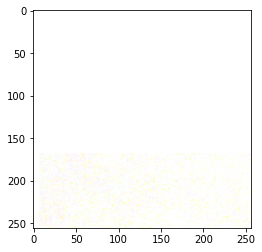

In [9]:
for p in range(0, total_tiles):
    tile = ts.getSingleTile(tile_position=p, **kwargs)['tile']
    unique = np.unique(tile)
    if len(unique) > 1:
        print p
        plt.imshow(tile)
        break

# Getting all white space in tiles

In [10]:
tile.shape

(256, 256, 4)

In [11]:
# Showing Unique tiles
unique

array([195, 196, 197, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209,
       210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222,
       223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235,
       236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248,
       249, 250, 251, 252, 253, 254, 255], dtype=uint8)

# Plotting Non-white tile

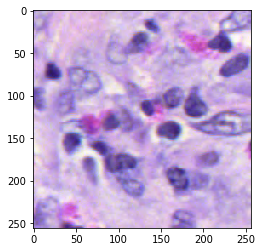

In [12]:
plt.imshow(ts.getSingleTile(tile_position=4999, **kwargs)['tile'])

# Getting Tile Information

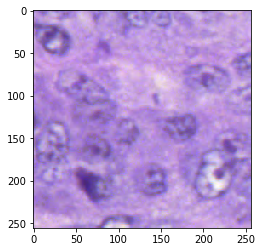

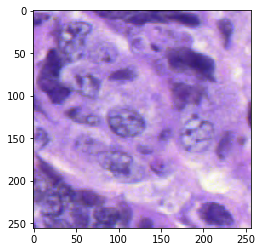

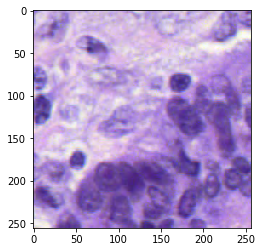

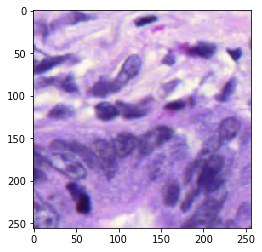

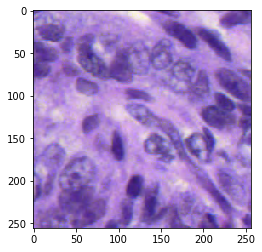

...

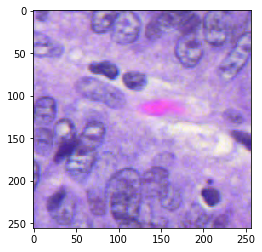

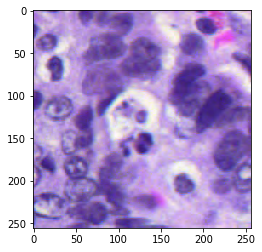

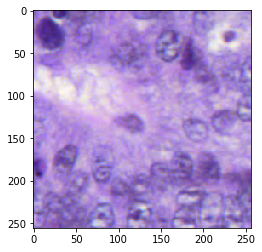

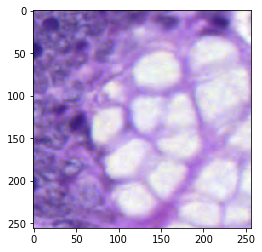

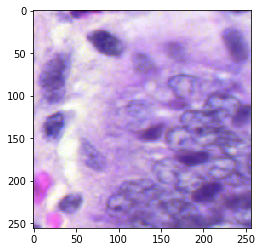

In [79]:
for i, p in enumerate(range(0, total_tiles, 100)):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)
    tile = tile_info['tile']
    avg = np.average(tile)
    if avg < 200 and avg > 125:
        plt.figure()
        plt.imshow(tile)
        plt.show()

In [ ]:
## Saving the tileinfo into a file

In [ ]:
for i, p in enumerate(range(0, total_tiles, 100)):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)
    tile = tile_info['tile']
    avg = np.average(tile)
    if avg < 200 and avg > 125:
        plt.figure()
        plt.imshow(tile)
        plt.show()

In [57]:
tile_info

{'format': 'numpy',
 'gheight': 256.0,
 'gwidth': 256.0,
 'gx': 0.0,
 'gy': 0.0,
 'height': 256,
 'iterator_range': {'level_x_max': 175,
  'level_x_min': 0,
  'level_y_max': 493,
  'level_y_min': 0,
  'position': 86275,
  'region_x_max': 175,
  'region_y_max': 493},
 'level': 9,
 'level_x': 0,
 'level_y': 0,
 'magnification': 20.0,
 'mm_x': 0.0002325,
 'mm_y': 0.0002325,
 'tile': array([[[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]],
 
        [[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]],
 
        [[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]],
 
        .

In [55]:
total_tiles

86275

In [32]:
# fetch the tile
t = tile_info['tile']
t

array([[[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       ...,

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255

In [52]:
type(t)

numpy.ndarray

In [53]:
t.shape

(256, 256, 4)

In [36]:
# get global x and y positions, tile height and width
left = tile_info['gx']
top = tile_info['gy']
print("left:", left)
print("top:", top)

('left:', 0.0)
('top:', 0.0)


In [38]:
# get scale
scale = tile_info['gwidth'] / tile_info['width']
print("scale:", scale)

('scale:', 1.0)


In [35]:
im_tile = tile_info['tile'][:, :, :3]
im_tile

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [39]:
for p in range(0, total_tiles):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)    

In [42]:
tile_info

{'format': 'numpy',
 'gheight': 256.0,
 'gwidth': 256.0,
 'gx': 44544.0,
 'gy': 125952.0,
 'height': 256,
 'iterator_range': {'level_x_max': 175,
  'level_x_min': 0,
  'level_y_max': 493,
  'level_y_min': 0,
  'position': 86275,
  'region_x_max': 175,
  'region_y_max': 493},
 'level': 9,
 'level_x': 174,
 'level_y': 492,
 'magnification': 20.0,
 'mm_x': 0.0002325,
 'mm_y': 0.0002325,
 'tile': array([[[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]],
 
        [[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]],
 
        [[255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         ...,
         [255, 255, 255, 255],
         [255, 255, 255, 255],
         [255, 255, 255, 255]]

In [45]:
tileMeans = []
tileWeights = []
magnification=None
import numpy
# iterate through the tiles at a particular magnification:
for tile in ts.tileIterator(format=large_image.tilesource.TILE_FORMAT_NUMPY,scale={'magnification': magnification},
                                resample=True):
    # The tile image data is in tile['tile'] and is a numpy
    # multi-dimensional array
    mean = numpy.mean(tile['tile'], axis=(0, 1))
    tileMeans.append(mean)                                                          
    tileWeights.append(tile['width'] * tile['height'])
    print('x: %d  y: %d  w: %d  h: %d  mag: %g  color: %g %g %g' % (tile['x'], tile['y'], tile['width'], tile['height'],
                                                                    tile['magnification'], mean[0], mean[1], mean[2]))
    mean = numpy.average(tileMeans, axis=0, weights=tileWeights)
    print('Average color: %g %g %g' % (mean[0], mean[1], mean[2]))

x: 0  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 256  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 512  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1024  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1280  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1536  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1792  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2048  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2304  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2560  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2816  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
A

Average color: 255 255 255
x: 25856  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26112  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26368  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26624  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26880  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27136  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27392  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27648  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27904  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28160  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28416  y: 0  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28672  y: 0  

x: 5888  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6144  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6400  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6656  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6912  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7168  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7424  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7680  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7936  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8192  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8448  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8704  y: 256  w: 256  h: 256 

x: 31488  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31744  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32000  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32256  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32512  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32768  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33024  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33280  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33536  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33792  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34048  y: 256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34304  y: 256  w: 

x: 12032  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12288  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12544  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12800  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13056  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13312  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13568  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13824  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14080  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14336  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14592  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14848  y: 512  w: 

Average color: 255 255 255
x: 37888  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38144  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38400  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38656  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38912  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39168  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39424  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39680  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39936  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40192  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40448  y: 512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 25

x: 19200  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19456  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19712  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19968  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20224  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20480  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20736  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20992  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21248  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21504  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21760  y: 768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22016  y: 768  w: 

x: 512  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1024  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1280  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1536  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1792  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2048  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2304  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2560  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2816  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3072  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3328  y: 1024  w: 25

x: 26112  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26368  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26624  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26880  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27136  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27392  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27648  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27904  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28160  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28416  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28672  y: 1024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28928  

x: 6912  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7168  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7424  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7680  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7936  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8192  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8448  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8704  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8960  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9216  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9472  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9728  y: 1280  w: 

x: 32256  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32512  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32768  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33024  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33280  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33536  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33792  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34048  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34304  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34560  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34816  y: 1280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35072  

x: 12800  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13056  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13312  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13568  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13824  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14080  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14336  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14592  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14848  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15104  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15360  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15616  

x: 39168  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39424  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39680  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39936  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40192  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40448  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40704  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40960  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41216  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41472  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41728  y: 1536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41984  

x: 20480  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20736  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20992  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21248  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21504  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21760  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22016  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22272  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22528  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22784  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23040  y: 1792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23296  

Average color: 255 255 255
x: 512  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1024  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1280  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1536  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1792  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2048  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2304  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2560  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2816  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3072  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 

x: 24832  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25088  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25344  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25600  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25856  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26112  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26368  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26624  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26880  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27136  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27392  y: 2048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27648  

x: 4608  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4864  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5120  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5376  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5632  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5888  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6144  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6400  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6656  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6912  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7168  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7424  y: 2304  w: 

x: 29440  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29696  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29952  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 30208  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 30464  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 30720  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 30976  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31232  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31488  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31744  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32000  y: 2304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32256  

x: 9216  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9472  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9728  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9984  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10240  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10496  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10752  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11008  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11264  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11520  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11776  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12032  y: 2

x: 33792  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34048  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34304  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34560  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 34816  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35072  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35328  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35584  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35840  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36096  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36352  y: 2560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36608  

x: 13568  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13824  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14080  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14336  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14592  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 14848  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15104  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15360  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15616  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15872  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16128  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16384  

Average color: 255 255 255
x: 38656  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38912  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39168  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39424  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39680  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39936  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40192  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40448  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40704  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40960  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41216  y: 2816  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 18176  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 18432  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 18688  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 18944  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19200  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19456  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19712  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19968  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20224  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20480  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20736  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20992  

x: 42752  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43008  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43264  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43520  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43776  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44032  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44288  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44544  y: 3072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 0  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 256  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 512  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 3328  w

x: 22528  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22784  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23040  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23296  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23552  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23808  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24064  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24320  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24576  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24832  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25088  y: 3328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25344  

x: 2304  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2560  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2816  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3072  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3328  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3584  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3840  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4096  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4352  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4608  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4864  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5120  y: 3584  w: 

x: 26880  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27136  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27392  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27648  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27904  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28160  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28416  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28672  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28928  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29184  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29440  y: 3584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29696  

x: 6656  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6912  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7168  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7424  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7680  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7936  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8192  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8448  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8704  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8960  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9216  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9472  y: 3840  w: 

x: 30976  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31232  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31488  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31744  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32000  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32256  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32512  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32768  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33024  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33280  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33536  y: 3840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33792  

x: 10752  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11008  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11264  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11520  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11776  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12032  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12288  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12544  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12800  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13056  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13312  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 13568  

x: 35328  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35584  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 35840  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36096  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36352  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36608  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36864  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37120  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37376  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37632  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37888  y: 4096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38144  

x: 15104  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15360  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15616  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15872  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16128  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16384  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16640  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16896  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17152  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17408  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17664  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17920  

x: 39680  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 39936  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40192  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40448  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40704  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 40960  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41216  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41472  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41728  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41984  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 42240  y: 4352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 42496  

x: 19456  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19712  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19968  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20224  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20480  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20736  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20992  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21248  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21504  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21760  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22016  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22272  

x: 43776  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44032  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44288  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44544  y: 4608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 0  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 256  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 512  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1024  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1280  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1536  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1792  y: 4864  w: 25

x: 23296  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23552  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 23808  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24064  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24320  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24576  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 24832  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25088  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25344  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25600  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 25856  y: 4864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 26112  

x: 2304  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2560  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 2816  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3072  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3328  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3584  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 3840  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4096  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4352  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4608  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 4864  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 5120  y: 5120  w: 

x: 26880  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27136  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27392  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27648  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 27904  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28160  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28416  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28672  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 28928  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29184  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29440  y: 5120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 29696  

x: 6400  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6656  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 6912  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7168  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7424  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7680  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 7936  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8192  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8448  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8704  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 8960  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 9216  y: 5376  w: 

x: 30976  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31232  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31488  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 31744  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32000  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32256  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32512  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 32768  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33024  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33280  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33536  y: 5376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 33792  

x: 9984  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10240  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10496  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 10752  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11008  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11264  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11520  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 11776  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12032  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12288  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12544  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 12800  y

x: 36096  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36352  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36608  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 36864  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37120  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37376  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37632  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 37888  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38144  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38400  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38656  y: 5632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 38912  

x: 14848  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15104  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15360  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15616  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 15872  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16128  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16384  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16640  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 16896  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17152  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17408  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 17664  

Average color: 255 255 255
x: 40960  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41216  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41472  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41728  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 41984  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 42240  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 42496  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 42752  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43008  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43264  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43520  y: 5888  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 19712  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 19968  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20224  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20480  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20736  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 20992  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21248  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21504  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 21760  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22016  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22272  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 22528  

x: 43520  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 43776  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44032  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44288  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 44544  y: 6144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 0  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 256  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 512  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 768  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1024  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1280  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 255 255 255
x: 1536  y: 6400  w: 2

x: 22528  y: 6400  w: 256  h: 256  mag: 20  color: 219.94 204.861 231.954
Average color: 254.964 254.941 254.967
x: 22784  y: 6400  w: 256  h: 256  mag: 20  color: 206.959 191.116 226.181
Average color: 254.953 254.927 254.96
x: 23040  y: 6400  w: 256  h: 256  mag: 20  color: 211.498 195.566 227.816
Average color: 254.944 254.913 254.954
x: 23296  y: 6400  w: 256  h: 256  mag: 20  color: 205.778 190.648 225.312
Average color: 254.933 254.899 254.948
x: 23552  y: 6400  w: 256  h: 256  mag: 20  color: 211.118 196.107 229.546
Average color: 254.923 254.886 254.942
x: 23808  y: 6400  w: 256  h: 256  mag: 20  color: 201.802 186.368 224.023
Average color: 254.911 254.871 254.935
x: 24064  y: 6400  w: 256  h: 256  mag: 20  color: 202.568 185.362 222.738
Average color: 254.899 254.855 254.928
x: 24320  y: 6400  w: 256  h: 256  mag: 20  color: 201.882 184.916 222.784
Average color: 254.887 254.839 254.921
x: 24576  y: 6400  w: 256  h: 256  mag: 20  color: 208.687 193.89 228.379
Average color: 2

x: 43264  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.712
x: 43520  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.712
x: 43776  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.712
x: 44032  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.712
x: 44288  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.712
x: 44544  y: 6400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.591 254.411 254.713
x: 0  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.592 254.411 254.713
x: 256  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.592 254.411 254.713
x: 512  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.592 254.412 254.713
x: 768  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 254.592 254.41

x: 20736  y: 6656  w: 256  h: 256  mag: 20  color: 214.126 189.243 219.592
Average color: 254.587 254.404 254.695
x: 20992  y: 6656  w: 256  h: 256  mag: 20  color: 214.882 179.683 223.174
Average color: 254.579 254.388 254.688
x: 21248  y: 6656  w: 256  h: 256  mag: 20  color: 214.938 184.417 225.311
Average color: 254.57 254.373 254.682
x: 21504  y: 6656  w: 256  h: 256  mag: 20  color: 207.222 176.631 219.988
Average color: 254.56 254.356 254.674
x: 21760  y: 6656  w: 256  h: 256  mag: 20  color: 207.042 175.988 220.009
Average color: 254.55 254.339 254.667
x: 22016  y: 6656  w: 256  h: 256  mag: 20  color: 211.959 186.147 222.086
Average color: 254.54 254.324 254.66
x: 22272  y: 6656  w: 256  h: 256  mag: 20  color: 175.355 145.824 206.872
Average color: 254.523 254.301 254.649
x: 22528  y: 6656  w: 256  h: 256  mag: 20  color: 156.079 124.391 198.957
Average color: 254.502 254.273 254.637
x: 22784  y: 6656  w: 256  h: 256  mag: 20  color: 154.954 124.92 195.261
Average color: 254.

x: 39936  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.919 253.444 254.242
x: 40192  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.919 253.444 254.242
x: 40448  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.92 253.445 254.242
x: 40704  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.92 253.445 254.242
x: 40960  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.92 253.445 254.242
x: 41216  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.92 253.446 254.243
x: 41472  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.921 253.446 254.243
x: 41728  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.921 253.446 254.243
x: 41984  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.921 253.447 254.243
x: 42240  y: 6656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.921 

x: 17408  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.939 253.472 254.256
x: 17664  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.939 253.473 254.256
x: 17920  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.939 253.473 254.256
x: 18176  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.939 253.473 254.256
x: 18432  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.94 253.474 254.256
x: 18688  y: 6912  w: 256  h: 256  mag: 20  color: 253.958 253.739 247.108
Average color: 253.94 253.474 254.255
x: 18944  y: 6912  w: 256  h: 256  mag: 20  color: 253.935 253.93 247.344
Average color: 253.94 253.474 254.253
x: 19200  y: 6912  w: 256  h: 256  mag: 20  color: 254.084 253.905 247.244
Average color: 253.94 253.474 254.252
x: 19456  y: 6912  w: 256  h: 256  mag: 20  color: 253.709 253.456 245.827
Average color: 253.94 253.474 254.25
x: 19712  y: 6912  w: 256  h: 256  mag: 2

x: 36864  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.289 252.554 253.814
x: 37120  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.29 252.555 253.814
x: 37376  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.29 252.555 253.815
x: 37632  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.291 252.556 253.815
x: 37888  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.291 252.556 253.815
x: 38144  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.291 252.557 253.815
x: 38400  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.292 252.557 253.815
x: 38656  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.292 252.558 253.816
x: 38912  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.292 252.558 253.816
x: 39168  y: 6912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.29

x: 14592  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.32 252.598 253.835
x: 14848  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.32 252.598 253.835
x: 15104  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.32 252.599 253.836
x: 15360  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.321 252.599 253.836
x: 15616  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.321 252.6 253.836
x: 15872  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.322 252.6 253.836
x: 16128  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.322 252.601 253.836
x: 16384  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.322 252.601 253.837
x: 16640  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.323 252.602 253.837
x: 16896  y: 7168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 253.323 252

x: 34816  y: 7168  w: 256  h: 256  mag: 20  color: 253.765 253.614 246.966
Average color: 252.681 251.705 253.414
x: 35072  y: 7168  w: 256  h: 256  mag: 20  color: 253.694 253.528 246.522
Average color: 252.681 251.705 253.413
x: 35328  y: 7168  w: 256  h: 256  mag: 20  color: 253.67 253.202 245.816
Average color: 252.682 251.705 253.411
x: 35584  y: 7168  w: 256  h: 256  mag: 20  color: 253.727 253.275 245.764
Average color: 252.682 251.706 253.41
x: 35840  y: 7168  w: 256  h: 256  mag: 20  color: 253.619 253.111 246.018
Average color: 252.682 251.706 253.408
x: 36096  y: 7168  w: 256  h: 256  mag: 20  color: 254.626 254.71 252.996
Average color: 252.682 251.706 253.408
x: 36352  y: 7168  w: 256  h: 256  mag: 20  color: 254.733 254.731 252.911
Average color: 252.683 251.707 253.408
x: 36608  y: 7168  w: 256  h: 256  mag: 20  color: 254.625 254.636 252.42
Average color: 252.683 251.708 253.408
x: 36864  y: 7168  w: 256  h: 256  mag: 20  color: 254.732 254.738 252.725
Average color: 25

x: 11776  y: 7424  w: 256  h: 256  mag: 20  color: 254.306 254.312 250.13
Average color: 252.715 251.754 253.413
x: 12032  y: 7424  w: 256  h: 256  mag: 20  color: 254.217 254.097 249.31
Average color: 252.716 251.755 253.413
x: 12288  y: 7424  w: 256  h: 256  mag: 20  color: 254.18 253.994 249.197
Average color: 252.716 251.755 253.412
x: 12544  y: 7424  w: 256  h: 256  mag: 20  color: 254.299 253.98 251.687
Average color: 252.716 251.756 253.411
x: 12800  y: 7424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 252.717 251.756 253.412
x: 13056  y: 7424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 252.717 251.757 253.412
x: 13312  y: 7424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 252.718 251.758 253.412
x: 13568  y: 7424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 252.718 251.758 253.413
x: 13824  y: 7424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 252.719 251.759 253.413
x: 14080  y: 7424  w: 256  h: 256  mag

x: 31744  y: 7424  w: 256  h: 256  mag: 20  color: 167.943 135.74 206.036
Average color: 252.2 251.032 253.067
x: 32000  y: 7424  w: 256  h: 256  mag: 20  color: 175.481 140.061 211.559
Average color: 252.185 251.011 253.059
x: 32256  y: 7424  w: 256  h: 256  mag: 20  color: 181.903 147.596 214.081
Average color: 252.171 250.991 253.051
x: 32512  y: 7424  w: 256  h: 256  mag: 20  color: 178.278 142.756 211.164
Average color: 252.157 250.97 253.043
x: 32768  y: 7424  w: 256  h: 256  mag: 20  color: 174.988 139.848 208.791
Average color: 252.142 250.949 253.035
x: 33024  y: 7424  w: 256  h: 256  mag: 20  color: 176.22 143.556 209.435
Average color: 252.128 250.928 253.026
x: 33280  y: 7424  w: 256  h: 256  mag: 20  color: 170.637 136.21 203.182
Average color: 252.112 250.906 253.017
x: 33536  y: 7424  w: 256  h: 256  mag: 20  color: 218.752 204.667 225.088
Average color: 252.106 250.897 253.011
x: 33792  y: 7424  w: 256  h: 256  mag: 20  color: 250.869 249.527 243.353
Average color: 252.

x: 8960  y: 7680  w: 256  h: 256  mag: 20  color: 253.797 253.869 247.258
Average color: 252.143 250.952 253.008
x: 9216  y: 7680  w: 256  h: 256  mag: 20  color: 253.519 253.532 246.401
Average color: 252.143 250.952 253.007
x: 9472  y: 7680  w: 256  h: 256  mag: 20  color: 253.474 253.214 245.42
Average color: 252.144 250.952 253.005
x: 9728  y: 7680  w: 256  h: 256  mag: 20  color: 252.783 252.203 244.429
Average color: 252.144 250.953 253.004
x: 9984  y: 7680  w: 256  h: 256  mag: 20  color: 253.353 253.013 245.607
Average color: 252.144 250.953 253.002
x: 10240  y: 7680  w: 256  h: 256  mag: 20  color: 253.747 253.733 247.2
Average color: 252.144 250.954 253.001
x: 10496  y: 7680  w: 256  h: 256  mag: 20  color: 253.544 253.551 246.551
Average color: 252.145 250.954 253
x: 10752  y: 7680  w: 256  h: 256  mag: 20  color: 253.323 253.039 245.279
Average color: 252.145 250.954 252.998
x: 11008  y: 7680  w: 256  h: 256  mag: 20  color: 252.924 252.353 244.941
Average color: 252.145 25

x: 29696  y: 7680  w: 256  h: 256  mag: 20  color: 184.02 157.256 211.515
Average color: 251.699 250.357 252.695
x: 29952  y: 7680  w: 256  h: 256  mag: 20  color: 163.625 134.203 201.603
Average color: 251.683 250.335 252.685
x: 30208  y: 7680  w: 256  h: 256  mag: 20  color: 181.266 152.668 211.202
Average color: 251.67 250.317 252.677
x: 30464  y: 7680  w: 256  h: 256  mag: 20  color: 184.475 157.107 210.957
Average color: 251.657 250.3 252.67
x: 30720  y: 7680  w: 256  h: 256  mag: 20  color: 187.403 164.494 213.087
Average color: 251.645 250.284 252.662
x: 30976  y: 7680  w: 256  h: 256  mag: 20  color: 183.369 159.149 215.703
Average color: 251.633 250.267 252.655
x: 31232  y: 7680  w: 256  h: 256  mag: 20  color: 182.306 152.799 214.58
Average color: 251.62 250.249 252.648
x: 31488  y: 7680  w: 256  h: 256  mag: 20  color: 183.692 148.765 214.035
Average color: 251.607 250.23 252.641
x: 31744  y: 7680  w: 256  h: 256  mag: 20  color: 178.932 145.058 211.641
Average color: 251.59

x: 6400  y: 7936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251.55 250.139 252.592
x: 6656  y: 7936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251.55 250.14 252.592
x: 6912  y: 7936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251.551 250.141 252.593
x: 7168  y: 7936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251.552 250.142 252.593
x: 7424  y: 7936  w: 256  h: 256  mag: 20  color: 254.458 254.363 252.179
Average color: 251.552 250.142 252.593
x: 7680  y: 7936  w: 256  h: 256  mag: 20  color: 253.798 253.51 246.506
Average color: 251.552 250.143 252.592
x: 7936  y: 7936  w: 256  h: 256  mag: 20  color: 253.618 253.46 245.978
Average color: 251.553 250.144 252.591
x: 8192  y: 7936  w: 256  h: 256  mag: 20  color: 253.803 253.659 246.466
Average color: 251.553 250.144 252.59
x: 8448  y: 7936  w: 256  h: 256  mag: 20  color: 253.469 252.936 244.686
Average color: 251.554 250.145 252.588
x: 8704  y: 7936  w: 256  h: 256  mag

x: 27392  y: 7936  w: 256  h: 256  mag: 20  color: 203.428 189.544 219.33
Average color: 251.203 249.667 252.341
x: 27648  y: 7936  w: 256  h: 256  mag: 20  color: 241.348 237.687 236.598
Average color: 251.201 249.665 252.338
x: 27904  y: 7936  w: 256  h: 256  mag: 20  color: 253.405 252.607 244.211
Average color: 251.202 249.665 252.337
x: 28160  y: 7936  w: 256  h: 256  mag: 20  color: 249.001 246.441 241.058
Average color: 251.201 249.665 252.335
x: 28416  y: 7936  w: 256  h: 256  mag: 20  color: 242.344 238.035 237.638
Average color: 251.2 249.663 252.332
x: 28672  y: 7936  w: 256  h: 256  mag: 20  color: 219.761 207.624 228.251
Average color: 251.194 249.655 252.328
x: 28928  y: 7936  w: 256  h: 256  mag: 20  color: 200.528 177.858 217.799
Average color: 251.185 249.642 252.321
x: 29184  y: 7936  w: 256  h: 256  mag: 20  color: 205.798 183.475 220.838
Average color: 251.177 249.63 252.316
x: 29440  y: 7936  w: 256  h: 256  mag: 20  color: 191.575 164.147 213.164
Average color: 25

x: 2560  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.994 249.367 252.188
x: 2816  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.995 249.368 252.189
x: 3072  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.996 249.369 252.189
x: 3328  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.996 249.37 252.19
x: 3584  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.997 249.371 252.19
x: 3840  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.998 249.372 252.191
x: 4096  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.998 249.373 252.191
x: 4352  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.999 249.374 252.192
x: 4608  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251 249.375 252.192
x: 4864  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 251 249.376 252.193
x

x: 23552  y: 8192  w: 256  h: 256  mag: 20  color: 169.255 140.856 208.174
Average color: 250.816 249.131 252.043
x: 23808  y: 8192  w: 256  h: 256  mag: 20  color: 188.311 163.496 213.017
Average color: 250.805 249.116 252.036
x: 24064  y: 8192  w: 256  h: 256  mag: 20  color: 189.282 162.347 212.3
Average color: 250.794 249.1 252.029
x: 24320  y: 8192  w: 256  h: 256  mag: 20  color: 194.712 167.886 216.056
Average color: 250.784 249.086 252.023
x: 24576  y: 8192  w: 256  h: 256  mag: 20  color: 202.439 175.078 220.445
Average color: 250.776 249.073 252.017
x: 24832  y: 8192  w: 256  h: 256  mag: 20  color: 194.126 167.432 217.72
Average color: 250.766 249.059 252.011
x: 25088  y: 8192  w: 256  h: 256  mag: 20  color: 214.478 186.307 225.152
Average color: 250.759 249.048 252.007
x: 25344  y: 8192  w: 256  h: 256  mag: 20  color: 214.186 185.132 225.302
Average color: 250.753 249.037 252.002
x: 25600  y: 8192  w: 256  h: 256  mag: 20  color: 206.251 178.561 221.815
Average color: 250

Average color: 250.431 248.591 251.774
x: 43776  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.432 248.592 251.775
x: 44032  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.433 248.593 251.775
x: 44288  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.433 248.594 251.776
x: 44544  y: 8192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.434 248.595 251.776
x: 0  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.435 248.596 251.777
x: 256  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.436 248.597 251.777
x: 512  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.437 248.598 251.778
x: 768  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.437 248.6 251.778
x: 1024  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 250.438 248.601 251.779
x: 1280  y: 8448  w: 256  h: 256  mag: 20  color: 255 25

x: 19456  y: 8448  w: 256  h: 256  mag: 20  color: 245.12 239.616 239.026
Average color: 250.484 248.667 251.766
x: 19712  y: 8448  w: 256  h: 256  mag: 20  color: 229.93 210.679 229.146
Average color: 250.481 248.66 251.763
x: 19968  y: 8448  w: 256  h: 256  mag: 20  color: 200.672 173.511 214.988
Average color: 250.472 248.647 251.756
x: 20224  y: 8448  w: 256  h: 256  mag: 20  color: 194.823 164.368 214.05
Average color: 250.463 248.633 251.75
x: 20480  y: 8448  w: 256  h: 256  mag: 20  color: 165.189 133.088 199.456
Average color: 250.448 248.613 251.741
x: 20736  y: 8448  w: 256  h: 256  mag: 20  color: 164.826 131.993 198.968
Average color: 250.434 248.593 251.732
x: 20992  y: 8448  w: 256  h: 256  mag: 20  color: 179.198 148.379 207.972
Average color: 250.421 248.576 251.724
x: 21248  y: 8448  w: 256  h: 256  mag: 20  color: 211.172 185.259 225.034
Average color: 250.415 248.565 251.72
x: 21504  y: 8448  w: 256  h: 256  mag: 20  color: 192.103 163.698 215.742
Average color: 250.

x: 40192  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.868 247.807 251.36
x: 40448  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.869 247.809 251.361
x: 40704  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.87 247.81 251.362
x: 40960  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.871 247.811 251.362
x: 41216  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.872 247.812 251.363
x: 41472  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.872 247.813 251.363
x: 41728  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.873 247.815 251.364
x: 41984  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.874 247.816 251.365
x: 42240  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.875 247.817 251.365
x: 42496  y: 8448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.876

x: 16640  y: 8704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.933 247.9 251.372
x: 16896  y: 8704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.934 247.901 251.373
x: 17152  y: 8704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.934 247.902 251.373
x: 17408  y: 8704  w: 256  h: 256  mag: 20  color: 254.207 254.012 248.961
Average color: 249.935 247.903 251.373
x: 17664  y: 8704  w: 256  h: 256  mag: 20  color: 253.992 253.815 246.948
Average color: 249.936 247.904 251.372
x: 17920  y: 8704  w: 256  h: 256  mag: 20  color: 253.944 253.767 246.821
Average color: 249.937 247.905 251.371
x: 18176  y: 8704  w: 256  h: 256  mag: 20  color: 253.752 253.566 246.308
Average color: 249.937 247.906 251.37
x: 18432  y: 8704  w: 256  h: 256  mag: 20  color: 253.806 253.164 245.311
Average color: 249.938 247.907 251.369
x: 18688  y: 8704  w: 256  h: 256  mag: 20  color: 253.773 253.368 246.243
Average color: 249.938 247.908 251.369
x: 18944  y: 

x: 36608  y: 8704  w: 256  h: 256  mag: 20  color: 253.877 253.774 246.663
Average color: 249.333 247.068 250.983
x: 36864  y: 8704  w: 256  h: 256  mag: 20  color: 253.679 253.038 245.2
Average color: 249.334 247.069 250.982
x: 37120  y: 8704  w: 256  h: 256  mag: 20  color: 253.568 253.157 245.86
Average color: 249.335 247.07 250.981
x: 37376  y: 8704  w: 256  h: 256  mag: 20  color: 254.024 253.828 246.937
Average color: 249.336 247.071 250.98
x: 37632  y: 8704  w: 256  h: 256  mag: 20  color: 253.65 253.508 246.274
Average color: 249.336 247.072 250.98
x: 37888  y: 8704  w: 256  h: 256  mag: 20  color: 253.768 253.544 246.361
Average color: 249.337 247.073 250.979
x: 38144  y: 8704  w: 256  h: 256  mag: 20  color: 253.742 253.13 245.397
Average color: 249.338 247.074 250.978
x: 38400  y: 8704  w: 256  h: 256  mag: 20  color: 254.153 253.778 249.02
Average color: 249.339 247.075 250.978
x: 38656  y: 8704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.339 247.076 250

x: 12288  y: 8960  w: 256  h: 256  mag: 20  color: 253.283 252.513 244.58
Average color: 249.399 247.16 250.984
x: 12544  y: 8960  w: 256  h: 256  mag: 20  color: 253.961 253.606 249.261
Average color: 249.399 247.161 250.984
x: 12800  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.4 247.162 250.985
x: 13056  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.401 247.163 250.985
x: 13312  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.402 247.165 250.986
x: 13568  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.403 247.166 250.987
x: 13824  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.404 247.167 250.987
x: 14080  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.405 247.169 250.988
x: 14336  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 249.406 247.17 250.989
x: 14592  y: 8960  w: 256  h: 256  mag: 20  color: 255 255 255


x: 31744  y: 8960  w: 256  h: 256  mag: 20  color: 187.725 155.553 213.052
Average color: 248.907 246.496 250.682
x: 32000  y: 8960  w: 256  h: 256  mag: 20  color: 172.946 142.122 207.4
Average color: 248.895 246.479 250.675
x: 32256  y: 8960  w: 256  h: 256  mag: 20  color: 184.872 157.091 215.962
Average color: 248.885 246.465 250.67
x: 32512  y: 8960  w: 256  h: 256  mag: 20  color: 162.146 126.944 197.851
Average color: 248.871 246.446 250.661
x: 32768  y: 8960  w: 256  h: 256  mag: 20  color: 185.491 157.527 212.415
Average color: 248.861 246.431 250.655
x: 33024  y: 8960  w: 256  h: 256  mag: 20  color: 195.682 156.483 216.486
Average color: 248.852 246.417 250.65
x: 33280  y: 8960  w: 256  h: 256  mag: 20  color: 206.107 163.77 219.755
Average color: 248.845 246.404 250.645
x: 33536  y: 8960  w: 256  h: 256  mag: 20  color: 196.239 154.957 217.688
Average color: 248.837 246.389 250.64
x: 33792  y: 8960  w: 256  h: 256  mag: 20  color: 180.631 144.27 208.148
Average color: 248.8

x: 7168  y: 9216  w: 256  h: 256  mag: 20  color: 253.517 252.981 244.805
Average color: 248.887 246.458 250.645
x: 7424  y: 9216  w: 256  h: 256  mag: 20  color: 253.242 252.56 244.171
Average color: 248.887 246.459 250.644
x: 7680  y: 9216  w: 256  h: 256  mag: 20  color: 253.077 252.727 245.356
Average color: 248.888 246.46 250.643
x: 7936  y: 9216  w: 256  h: 256  mag: 20  color: 253.409 252.849 244.606
Average color: 248.889 246.461 250.642
x: 8192  y: 9216  w: 256  h: 256  mag: 20  color: 253.153 252.323 242.558
Average color: 248.89 246.462 250.641
x: 8448  y: 9216  w: 256  h: 256  mag: 20  color: 253.241 252.189 242.163
Average color: 248.89 246.463 250.639
x: 8704  y: 9216  w: 256  h: 256  mag: 20  color: 252.049 250.637 239.065
Average color: 248.891 246.463 250.637
x: 8960  y: 9216  w: 256  h: 256  mag: 20  color: 109.07 106.244 107.534
Average color: 248.869 246.441 250.615
x: 9216  y: 9216  w: 256  h: 256  mag: 20  color: 221.598 219.934 211.653
Average color: 248.864 246.

x: 26368  y: 9216  w: 256  h: 256  mag: 20  color: 162.736 137.908 202.291
Average color: 248.642 246.126 250.44
x: 26624  y: 9216  w: 256  h: 256  mag: 20  color: 167.605 142.347 205.546
Average color: 248.629 246.11 250.433
x: 26880  y: 9216  w: 256  h: 256  mag: 20  color: 193.252 170.21 218.42
Average color: 248.62 246.098 250.428
x: 27136  y: 9216  w: 256  h: 256  mag: 20  color: 235.598 229.315 236.374
Average color: 248.618 246.096 250.426
x: 27392  y: 9216  w: 256  h: 256  mag: 20  color: 249.119 247.593 242.536
Average color: 248.618 246.096 250.425
x: 27648  y: 9216  w: 256  h: 256  mag: 20  color: 225.668 214.837 228.937
Average color: 248.615 246.091 250.421
x: 27904  y: 9216  w: 256  h: 256  mag: 20  color: 221.848 208.174 225.952
Average color: 248.611 246.085 250.418
x: 28160  y: 9216  w: 256  h: 256  mag: 20  color: 213.137 195.646 223.313
Average color: 248.605 246.077 250.413
x: 28416  y: 9216  w: 256  h: 256  mag: 20  color: 197.178 176.091 216.12
Average color: 248.

Average color: 248.426 245.812 250.288
x: 2560  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.427 245.814 250.289
x: 2816  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.428 245.815 250.29
x: 3072  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.429 245.817 250.29
x: 3328  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.43 245.818 250.291
x: 3584  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.431 245.82 250.292
x: 3840  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.432 245.821 250.293
x: 4096  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.433 245.822 250.293
x: 4352  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.434 245.824 250.294
x: 4608  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.435 245.825 250.295
x: 4864  y: 9472  w: 256  h: 256  mag: 20  color: 255 25

x: 23040  y: 9472  w: 256  h: 256  mag: 20  color: 187.152 158.616 212.886
Average color: 248.301 245.655 250.14
x: 23296  y: 9472  w: 256  h: 256  mag: 20  color: 205.813 180.491 219.279
Average color: 248.294 245.645 250.135
x: 23552  y: 9472  w: 256  h: 256  mag: 20  color: 210.68 185.073 225.091
Average color: 248.288 245.636 250.131
x: 23808  y: 9472  w: 256  h: 256  mag: 20  color: 217.086 191.522 227.315
Average color: 248.284 245.628 250.128
x: 24064  y: 9472  w: 256  h: 256  mag: 20  color: 219.818 192.866 227.389
Average color: 248.279 245.619 250.125
x: 24320  y: 9472  w: 256  h: 256  mag: 20  color: 211.044 184.687 221.494
Average color: 248.274 245.61 250.12
x: 24576  y: 9472  w: 256  h: 256  mag: 20  color: 199.083 175.008 218.213
Average color: 248.266 245.599 250.115
x: 24832  y: 9472  w: 256  h: 256  mag: 20  color: 201.363 179.207 222.103
Average color: 248.259 245.589 250.111
x: 25088  y: 9472  w: 256  h: 256  mag: 20  color: 172.831 144.377 206.56
Average color: 248

x: 43008  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.011 245.225 249.938
x: 43264  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.012 245.227 249.939
x: 43520  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.013 245.228 249.939
x: 43776  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.014 245.23 249.94
x: 44032  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.015 245.231 249.941
x: 44288  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.016 245.233 249.942
x: 44544  y: 9472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.017 245.234 249.943
x: 0  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.018 245.236 249.943
x: 256  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.019 245.237 249.944
x: 512  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 248.02 245.239

x: 18944  y: 9728  w: 256  h: 256  mag: 20  color: 253.741 253.305 245.652
Average color: 247.963 245.205 249.823
x: 19200  y: 9728  w: 256  h: 256  mag: 20  color: 229.195 206.091 229.184
Average color: 247.96 245.2 249.82
x: 19456  y: 9728  w: 256  h: 256  mag: 20  color: 202.702 161.182 215.833
Average color: 247.953 245.187 249.815
x: 19712  y: 9728  w: 256  h: 256  mag: 20  color: 194.14 164.628 210.596
Average color: 247.945 245.175 249.809
x: 19968  y: 9728  w: 256  h: 256  mag: 20  color: 196.008 170.305 216.375
Average color: 247.937 245.164 249.804
x: 20224  y: 9728  w: 256  h: 256  mag: 20  color: 189.031 163.747 209.926
Average color: 247.929 245.152 249.798
x: 20480  y: 9728  w: 256  h: 256  mag: 20  color: 190.947 165.902 209.398
Average color: 247.92 245.14 249.792
x: 20736  y: 9728  w: 256  h: 256  mag: 20  color: 206.504 177.815 219.581
Average color: 247.914 245.13 249.787
x: 20992  y: 9728  w: 256  h: 256  mag: 20  color: 196.811 170.838 215.535
Average color: 247.90

x: 38144  y: 9728  w: 256  h: 256  mag: 20  color: 253.663 253.035 245.237
Average color: 247.506 244.554 249.516
x: 38400  y: 9728  w: 256  h: 256  mag: 20  color: 253.971 253.503 248.352
Average color: 247.507 244.555 249.516
x: 38656  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.508 244.557 249.517
x: 38912  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.51 244.558 249.517
x: 39168  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.511 244.56 249.518
x: 39424  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.512 244.561 249.519
x: 39680  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.513 244.563 249.52
x: 39936  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.514 244.564 249.521
x: 40192  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.515 244.566 249.521
x: 40448  y: 9728  w: 256  h: 256  mag: 20  color: 255 255 25

x: 14592  y: 9984  w: 256  h: 256  mag: 20  color: 254.564 254.559 251.933
Average color: 247.432 244.507 249.38
x: 14848  y: 9984  w: 256  h: 256  mag: 20  color: 254.469 254.339 251.887
Average color: 247.433 244.509 249.381
x: 15104  y: 9984  w: 256  h: 256  mag: 20  color: 254.904 254.9 254.402
Average color: 247.434 244.51 249.381
x: 15360  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.435 244.512 249.382
x: 15616  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.436 244.513 249.383
x: 15872  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.437 244.515 249.384
x: 16128  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.438 244.516 249.385
x: 16384  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.44 244.518 249.385
x: 16640  y: 9984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 247.441 244.519 249.386
x: 16896  y: 9984  w: 256  h: 256  mag: 20  color: 

Average color: 247.024 243.908 249.101
x: 34816  y: 9984  w: 256  h: 256  mag: 20  color: 241.107 235.787 235.975
Average color: 247.023 243.907 249.099
x: 35072  y: 9984  w: 256  h: 256  mag: 20  color: 170.815 137.124 197.546
Average color: 247.012 243.892 249.092
x: 35328  y: 9984  w: 256  h: 256  mag: 20  color: 217.349 203.67 224.102
Average color: 247.008 243.886 249.088
x: 35584  y: 9984  w: 256  h: 256  mag: 20  color: 253.607 253.047 245.632
Average color: 247.009 243.887 249.088
x: 35840  y: 9984  w: 256  h: 256  mag: 20  color: 253.403 252.996 246.381
Average color: 247.01 243.889 249.088
x: 36096  y: 9984  w: 256  h: 256  mag: 20  color: 253.973 253.913 248.243
Average color: 247.011 243.89 249.087
x: 36352  y: 9984  w: 256  h: 256  mag: 20  color: 254.098 253.951 248.093
Average color: 247.012 243.892 249.087
x: 36608  y: 9984  w: 256  h: 256  mag: 20  color: 253.892 253.621 247.092
Average color: 247.013 243.893 249.087
x: 36864  y: 9984  w: 256  h: 256  mag: 20  color: 2

x: 9472  y: 10240  w: 256  h: 256  mag: 20  color: 239.982 236.626 226.645
Average color: 246.874 243.775 248.905
x: 9728  y: 10240  w: 256  h: 256  mag: 20  color: 248.859 246.204 234.756
Average color: 246.874 243.775 248.903
x: 9984  y: 10240  w: 256  h: 256  mag: 20  color: 252.433 251.114 241.402
Average color: 246.875 243.776 248.902
x: 10240  y: 10240  w: 256  h: 256  mag: 20  color: 253.335 252.979 243.866
Average color: 246.876 243.777 248.901
x: 10496  y: 10240  w: 256  h: 256  mag: 20  color: 253.328 253.034 244.214
Average color: 246.877 243.779 248.9
x: 10752  y: 10240  w: 256  h: 256  mag: 20  color: 253.142 252.47 243.434
Average color: 246.878 243.78 248.9
x: 11008  y: 10240  w: 256  h: 256  mag: 20  color: 252.857 251.847 243.629
Average color: 246.879 243.781 248.899
x: 11264  y: 10240  w: 256  h: 256  mag: 20  color: 253.166 252.598 244.707
Average color: 246.88 243.782 248.898
x: 11520  y: 10240  w: 256  h: 256  mag: 20  color: 253.636 253.507 246.395
Average color:

x: 28160  y: 10240  w: 256  h: 256  mag: 20  color: 171.417 142.758 203.12
Average color: 246.716 243.538 248.758
x: 28416  y: 10240  w: 256  h: 256  mag: 20  color: 200.098 175.502 219.862
Average color: 246.709 243.529 248.754
x: 28672  y: 10240  w: 256  h: 256  mag: 20  color: 186.829 159.117 212.874
Average color: 246.701 243.517 248.749
x: 28928  y: 10240  w: 256  h: 256  mag: 20  color: 182.99 151.89 210.892
Average color: 246.692 243.504 248.743
x: 29184  y: 10240  w: 256  h: 256  mag: 20  color: 164.341 131.841 199.513
Average color: 246.681 243.488 248.736
x: 29440  y: 10240  w: 256  h: 256  mag: 20  color: 151.42 119.75 192.172
Average color: 246.667 243.471 248.728
x: 29696  y: 10240  w: 256  h: 256  mag: 20  color: 147.481 116.438 191.814
Average color: 246.653 243.453 248.72
x: 29952  y: 10240  w: 256  h: 256  mag: 20  color: 157.513 128.63 199.009
Average color: 246.641 243.437 248.713
x: 30208  y: 10240  w: 256  h: 256  mag: 20  color: 162.649 132.708 203.126
Average col

x: 4608  y: 10496  w: 256  h: 256  mag: 20  color: 253.503 253.309 245.193
Average color: 246.51 243.246 248.627
x: 4864  y: 10496  w: 256  h: 256  mag: 20  color: 253.213 252.547 244.454
Average color: 246.511 243.247 248.626
x: 5120  y: 10496  w: 256  h: 256  mag: 20  color: 253.453 253.074 245.209
Average color: 246.512 243.249 248.626
x: 5376  y: 10496  w: 256  h: 256  mag: 20  color: 253.374 253.09 245.025
Average color: 246.513 243.25 248.625
x: 5632  y: 10496  w: 256  h: 256  mag: 20  color: 253.297 253.049 244.161
Average color: 246.514 243.251 248.625
x: 5888  y: 10496  w: 256  h: 256  mag: 20  color: 252.981 252.628 243.368
Average color: 246.515 243.253 248.624
x: 6144  y: 10496  w: 256  h: 256  mag: 20  color: 252.952 251.993 243.162
Average color: 246.516 243.254 248.623
x: 6400  y: 10496  w: 256  h: 256  mag: 20  color: 253.099 252.432 242.952
Average color: 246.517 243.255 248.622
x: 6656  y: 10496  w: 256  h: 256  mag: 20  color: 236.023 233.666 224.065
Average color: 2

x: 24832  y: 10496  w: 256  h: 256  mag: 20  color: 230.991 224.965 233.774
Average color: 246.17 242.85 248.276
x: 25088  y: 10496  w: 256  h: 256  mag: 20  color: 203.97 184.25 220.279
Average color: 246.164 242.842 248.272
x: 25344  y: 10496  w: 256  h: 256  mag: 20  color: 220.462 198.399 226.826
Average color: 246.16 242.836 248.269
x: 25600  y: 10496  w: 256  h: 256  mag: 20  color: 196.381 174.988 216.452
Average color: 246.154 242.827 248.265
x: 25856  y: 10496  w: 256  h: 256  mag: 20  color: 202.49 180.993 219.978
Average color: 246.148 242.818 248.261
x: 26112  y: 10496  w: 256  h: 256  mag: 20  color: 213.421 196.339 228.392
Average color: 246.143 242.812 248.258
x: 26368  y: 10496  w: 256  h: 256  mag: 20  color: 236.557 228.485 234.709
Average color: 246.142 242.81 248.256
x: 26624  y: 10496  w: 256  h: 256  mag: 20  color: 252.069 250.818 242.753
Average color: 246.143 242.811 248.255
x: 26880  y: 10496  w: 256  h: 256  mag: 20  color: 250.374 248.604 242.05
Average colo

Average color: 245.904 242.477 248.106
x: 256  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.905 242.478 248.106
x: 512  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.906 242.48 248.107
x: 768  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.908 242.482 248.108
x: 1024  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.909 242.484 248.109
x: 1280  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.91 242.485 248.11
x: 1536  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.911 242.487 248.111
x: 1792  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.913 242.489 248.112
x: 2048  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.914 242.49 248.113
x: 2304  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.915 242.492 248.114
x: 2560  y: 10752  w: 256  h: 256  mag: 20  color:

x: 19968  y: 10752  w: 256  h: 256  mag: 20  color: 233.422 219.426 235.413
Average color: 245.61 242.194 247.758
x: 20224  y: 10752  w: 256  h: 256  mag: 20  color: 226.285 204.23 229.836
Average color: 245.607 242.188 247.755
x: 20480  y: 10752  w: 256  h: 256  mag: 20  color: 218.334 189.518 224.679
Average color: 245.603 242.181 247.752
x: 20736  y: 10752  w: 256  h: 256  mag: 20  color: 205.672 175.975 218.369
Average color: 245.598 242.172 247.748
x: 20992  y: 10752  w: 256  h: 256  mag: 20  color: 215.308 192.17 225.782
Average color: 245.594 242.166 247.745
x: 21248  y: 10752  w: 256  h: 256  mag: 20  color: 214.002 192.314 226.386
Average color: 245.59 242.159 247.742
x: 21504  y: 10752  w: 256  h: 256  mag: 20  color: 191.758 165.153 213.071
Average color: 245.582 242.149 247.738
x: 21760  y: 10752  w: 256  h: 256  mag: 20  color: 180.353 151.779 206.066
Average color: 245.574 242.136 247.732
x: 22016  y: 10752  w: 256  h: 256  mag: 20  color: 185.924 152.837 209.699
Average 

Average color: 245.224 241.647 247.509
x: 40704  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.226 241.648 247.51
x: 40960  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.227 241.65 247.511
x: 41216  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.228 241.652 247.512
x: 41472  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.23 241.654 247.513
x: 41728  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.231 241.655 247.514
x: 41984  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.232 241.657 247.515
x: 42240  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.234 241.659 247.516
x: 42496  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.235 241.661 247.517
x: 42752  y: 10752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 245.236 241.663 247.518
x: 43008  y: 10752  w: 256  h: 256  m

x: 15360  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.865 241.308 247.099
x: 15616  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.866 241.31 247.1
x: 15872  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.868 241.312 247.101
x: 16128  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.869 241.314 247.102
x: 16384  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.87 241.316 247.103
x: 16640  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.872 241.317 247.104
x: 16896  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.873 241.319 247.105
x: 17152  y: 11008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 244.874 241.321 247.106
x: 17408  y: 11008  w: 256  h: 256  mag: 20  color: 253.932 253.692 249.74
Average color: 244.876 241.323 247.107
x: 17664  y: 11008  w: 256  h: 256  mag: 20  color: 254.021 254.03

x: 35328  y: 11008  w: 256  h: 256  mag: 20  color: 186.968 164.376 207.151
Average color: 244.46 240.726 246.836
x: 35584  y: 11008  w: 256  h: 256  mag: 20  color: 249.247 247.667 241.06
Average color: 244.461 240.726 246.835
x: 35840  y: 11008  w: 256  h: 256  mag: 20  color: 253.122 252.472 245.43
Average color: 244.462 240.728 246.835
x: 36096  y: 11008  w: 256  h: 256  mag: 20  color: 253.969 253.948 247.872
Average color: 244.463 240.73 246.835
x: 36352  y: 11008  w: 256  h: 256  mag: 20  color: 253.78 253.743 247.332
Average color: 244.465 240.731 246.835
x: 36608  y: 11008  w: 256  h: 256  mag: 20  color: 253.832 253.455 246.114
Average color: 244.466 240.733 246.835
x: 36864  y: 11008  w: 256  h: 256  mag: 20  color: 253.345 252.766 245.464
Average color: 244.467 240.735 246.835
x: 37120  y: 11008  w: 256  h: 256  mag: 20  color: 253.578 253.269 246.263
Average color: 244.468 240.736 246.835
x: 37376  y: 11008  w: 256  h: 256  mag: 20  color: 254.042 254.041 248.244
Average c

x: 11008  y: 11264  w: 256  h: 256  mag: 20  color: 251.653 249.375 237.613
Average color: 244.072 240.364 246.402
x: 11264  y: 11264  w: 256  h: 256  mag: 20  color: 252.715 251.603 240.629
Average color: 244.074 240.365 246.401
x: 11520  y: 11264  w: 256  h: 256  mag: 20  color: 253.186 252.993 243.888
Average color: 244.075 240.367 246.401
x: 11776  y: 11264  w: 256  h: 256  mag: 20  color: 253.016 252.939 243.558
Average color: 244.076 240.368 246.4
x: 12032  y: 11264  w: 256  h: 256  mag: 20  color: 252.778 252.262 242.46
Average color: 244.077 240.37 246.4
x: 12288  y: 11264  w: 256  h: 256  mag: 20  color: 252.587 251.587 242.69
Average color: 244.078 240.371 246.399
x: 12544  y: 11264  w: 256  h: 256  mag: 20  color: 253.424 253.019 245.354
Average color: 244.079 240.373 246.399
x: 12800  y: 11264  w: 256  h: 256  mag: 20  color: 253.545 253.649 246.677
Average color: 244.081 240.375 246.399
x: 13056  y: 11264  w: 256  h: 256  mag: 20  color: 253.555 253.413 245.793
Average col

x: 31232  y: 11264  w: 256  h: 256  mag: 20  color: 167.351 137.357 204.451
Average color: 243.831 240.006 246.23
x: 31488  y: 11264  w: 256  h: 256  mag: 20  color: 176.453 144.937 209.202
Average color: 243.822 239.994 246.225
x: 31744  y: 11264  w: 256  h: 256  mag: 20  color: 152.881 118.249 192.529
Average color: 243.81 239.978 246.218
x: 32000  y: 11264  w: 256  h: 256  mag: 20  color: 191.373 155.928 216.839
Average color: 243.804 239.967 246.215
x: 32256  y: 11264  w: 256  h: 256  mag: 20  color: 184.022 154.226 214.556
Average color: 243.796 239.956 246.211
x: 32512  y: 11264  w: 256  h: 256  mag: 20  color: 195.318 162.715 217.639
Average color: 243.79 239.947 246.207
x: 32768  y: 11264  w: 256  h: 256  mag: 20  color: 183.554 153.622 210.946
Average color: 243.782 239.936 246.202
x: 33024  y: 11264  w: 256  h: 256  mag: 20  color: 186.399 152.6 212.805
Average color: 243.775 239.924 246.198
x: 33280  y: 11264  w: 256  h: 256  mag: 20  color: 193.637 161.829 215.938
Average c

x: 6912  y: 11520  w: 256  h: 256  mag: 20  color: 7.29192 7.17955 13.5751
Average color: 243.635 239.784 246.048
x: 7168  y: 11520  w: 256  h: 256  mag: 20  color: 6.78598 6.3811 13.4447
Average color: 243.605 239.755 246.018
x: 7424  y: 11520  w: 256  h: 256  mag: 20  color: 11.3534 9.24988 19.79
Average color: 243.576 239.725 245.99
x: 7680  y: 11520  w: 256  h: 256  mag: 20  color: 11.8332 9.85915 21.0493
Average color: 243.547 239.696 245.961
x: 7936  y: 11520  w: 256  h: 256  mag: 20  color: 13.0648 10.4325 20.08
Average color: 243.517 239.667 245.933
x: 8192  y: 11520  w: 256  h: 256  mag: 20  color: 14.5767 11.4946 19.8609
Average color: 243.488 239.638 245.904
x: 8448  y: 11520  w: 256  h: 256  mag: 20  color: 14.9239 12.3926 20.4592
Average color: 243.46 239.61 245.876
x: 8704  y: 11520  w: 256  h: 256  mag: 20  color: 16.3841 14.4521 22.8539
Average color: 243.431 239.581 245.847
x: 8960  y: 11520  w: 256  h: 256  mag: 20  color: 18.575 16.1193 26.0477
Average color: 243.402

x: 27136  y: 11520  w: 256  h: 256  mag: 20  color: 210.228 188.367 222.78
Average color: 243.098 239.182 245.536
x: 27392  y: 11520  w: 256  h: 256  mag: 20  color: 214.804 193.382 228.492
Average color: 243.094 239.177 245.534
x: 27648  y: 11520  w: 256  h: 256  mag: 20  color: 221.413 198.597 227.541
Average color: 243.092 239.172 245.532
x: 27904  y: 11520  w: 256  h: 256  mag: 20  color: 217.181 196.285 225.766
Average color: 243.088 239.166 245.529
x: 28160  y: 11520  w: 256  h: 256  mag: 20  color: 217.441 196.161 227.306
Average color: 243.085 239.161 245.527
x: 28416  y: 11520  w: 256  h: 256  mag: 20  color: 208.144 185.727 224
Average color: 243.081 239.154 245.524
x: 28672  y: 11520  w: 256  h: 256  mag: 20  color: 205.752 181.21 224.339
Average color: 243.076 239.147 245.522
x: 28928  y: 11520  w: 256  h: 256  mag: 20  color: 190.618 162.371 214.999
Average color: 243.069 239.137 245.518
x: 29184  y: 11520  w: 256  h: 256  mag: 20  color: 146.122 119.708 188.904
Average co

x: 2560  y: 11776  w: 256  h: 256  mag: 20  color: 254.259 254.307 251.918
Average color: 242.929 238.941 245.439
x: 2816  y: 11776  w: 256  h: 256  mag: 20  color: 253.563 253.422 246.389
Average color: 242.93 238.943 245.44
x: 3072  y: 11776  w: 256  h: 256  mag: 20  color: 253.261 252.992 245.093
Average color: 242.932 238.945 245.44
x: 3328  y: 11776  w: 256  h: 256  mag: 20  color: 253.223 252.555 244.19
Average color: 242.933 238.947 245.439
x: 3584  y: 11776  w: 256  h: 256  mag: 20  color: 253.257 252.403 244.461
Average color: 242.934 238.948 245.439
x: 3840  y: 11776  w: 256  h: 256  mag: 20  color: 253.087 252.77 244.797
Average color: 242.935 238.95 245.439
x: 4096  y: 11776  w: 256  h: 256  mag: 20  color: 253.259 252.72 244.404
Average color: 242.937 238.952 245.439
x: 4352  y: 11776  w: 256  h: 256  mag: 20  color: 252.697 252.19 242.867
Average color: 242.938 238.953 245.439
x: 4608  y: 11776  w: 256  h: 256  mag: 20  color: 181.73 175.714 179.26
Average color: 242.93 2

x: 21248  y: 11776  w: 256  h: 256  mag: 20  color: 191.185 165.766 210.98
Average color: 242.314 238.322 244.797
x: 21504  y: 11776  w: 256  h: 256  mag: 20  color: 194.941 160.25 212.85
Average color: 242.308 238.313 244.793
x: 21760  y: 11776  w: 256  h: 256  mag: 20  color: 181.472 151.257 207.18
Average color: 242.301 238.302 244.788
x: 22016  y: 11776  w: 256  h: 256  mag: 20  color: 180.395 154.591 205.575
Average color: 242.293 238.292 244.783
x: 22272  y: 11776  w: 256  h: 256  mag: 20  color: 209.924 189.19 221.415
Average color: 242.289 238.286 244.781
x: 22528  y: 11776  w: 256  h: 256  mag: 20  color: 178.365 150.562 204.947
Average color: 242.281 238.275 244.776
x: 22784  y: 11776  w: 256  h: 256  mag: 20  color: 198.53 167.098 215.167
Average color: 242.276 238.266 244.772
x: 23040  y: 11776  w: 256  h: 256  mag: 20  color: 217.325 191.069 225.786
Average color: 242.273 238.26 244.77
x: 23296  y: 11776  w: 256  h: 256  mag: 20  color: 166.068 131.727 203.389
Average colo

x: 41216  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.008 237.872 244.606
x: 41472  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.009 237.875 244.608
x: 41728  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.011 237.877 244.609
x: 41984  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.012 237.879 244.61
x: 42240  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.014 237.881 244.611
x: 42496  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.016 237.883 244.613
x: 42752  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.017 237.885 244.614
x: 43008  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.019 237.887 244.615
x: 43264  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.02 237.889 244.616
x: 43520  y: 11776  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 15616  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.339 237.229 243.909
x: 15872  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 237.231 243.91
x: 16128  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.342 237.234 243.912
x: 16384  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.343 237.236 243.913
x: 16640  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.345 237.238 243.914
x: 16896  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.347 237.24 243.916
x: 17152  y: 12032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.348 237.242 243.917
x: 17408  y: 12032  w: 256  h: 256  mag: 20  color: 254.119 254.02 250.121
Average color: 241.35 237.244 243.918
x: 17664  y: 12032  w: 256  h: 256  mag: 20  color: 254.049 254.042 248.022
Average color: 241.351 237.246 243.918
x: 17920  y: 12032  w: 256  h: 256  mag: 20  color: 25

Average color: 241.004 236.729 243.704
x: 35072  y: 12032  w: 256  h: 256  mag: 20  color: 198.28 181.938 213.659
Average color: 240.999 236.722 243.7
x: 35328  y: 12032  w: 256  h: 256  mag: 20  color: 180.817 152.592 206.166
Average color: 240.992 236.712 243.695
x: 35584  y: 12032  w: 256  h: 256  mag: 20  color: 212.969 200.417 220.917
Average color: 240.988 236.708 243.693
x: 35840  y: 12032  w: 256  h: 256  mag: 20  color: 253.347 252.554 245.024
Average color: 240.99 236.71 243.693
x: 36096  y: 12032  w: 256  h: 256  mag: 20  color: 253.951 253.938 247.649
Average color: 240.991 236.712 243.693
x: 36352  y: 12032  w: 256  h: 256  mag: 20  color: 253.807 253.835 247.212
Average color: 240.993 236.714 243.694
x: 36608  y: 12032  w: 256  h: 256  mag: 20  color: 253.883 253.661 246.453
Average color: 240.994 236.716 243.694
x: 36864  y: 12032  w: 256  h: 256  mag: 20  color: 253.413 252.872 245.286
Average color: 240.996 236.718 243.694
x: 37120  y: 12032  w: 256  h: 256  mag: 20  c

x: 10496  y: 12288  w: 256  h: 256  mag: 20  color: 12.8343 9.98428 19.0786
Average color: 240.46 236.207 243.142
x: 10752  y: 12288  w: 256  h: 256  mag: 20  color: 11.4524 8.48056 18.1768
Average color: 240.433 236.18 243.116
x: 11008  y: 12288  w: 256  h: 256  mag: 20  color: 13.9369 10.9527 20.229
Average color: 240.406 236.153 243.089
x: 11264  y: 12288  w: 256  h: 256  mag: 20  color: 25.0502 18.3736 31.0541
Average color: 240.381 236.127 243.064
x: 11520  y: 12288  w: 256  h: 256  mag: 20  color: 19.2158 15.2391 26.0536
Average color: 240.355 236.101 243.039
x: 11776  y: 12288  w: 256  h: 256  mag: 20  color: 14.0997 12.1781 19.9975
Average color: 240.328 236.075 243.012
x: 12032  y: 12288  w: 256  h: 256  mag: 20  color: 16.1203 14.2548 21.4451
Average color: 240.301 236.048 242.986
x: 12288  y: 12288  w: 256  h: 256  mag: 20  color: 59.5602 59.4532 65.0315
Average color: 240.28 236.027 242.965
x: 12544  y: 12288  w: 256  h: 256  mag: 20  color: 253.085 252.482 243.091
Average 

x: 29952  y: 12288  w: 256  h: 256  mag: 20  color: 177.112 150.072 211.021
Average color: 240.131 235.784 242.862
x: 30208  y: 12288  w: 256  h: 256  mag: 20  color: 192.527 165.719 215.869
Average color: 240.126 235.776 242.859
x: 30464  y: 12288  w: 256  h: 256  mag: 20  color: 202.909 173.43 221.887
Average color: 240.121 235.768 242.857
x: 30720  y: 12288  w: 256  h: 256  mag: 20  color: 160.099 131.015 197.551
Average color: 240.112 235.756 242.851
x: 30976  y: 12288  w: 256  h: 256  mag: 20  color: 170.617 142.656 206.235
Average color: 240.104 235.745 242.847
x: 31232  y: 12288  w: 256  h: 256  mag: 20  color: 161.572 130.155 200.996
Average color: 240.095 235.733 242.842
x: 31488  y: 12288  w: 256  h: 256  mag: 20  color: 163.452 132.223 200.741
Average color: 240.086 235.721 242.837
x: 31744  y: 12288  w: 256  h: 256  mag: 20  color: 163.781 130.952 201.473
Average color: 240.077 235.708 242.832
x: 32000  y: 12288  w: 256  h: 256  mag: 20  color: 177.988 144.554 208.12
Averag

x: 5376  y: 12544  w: 256  h: 256  mag: 20  color: 30.0033 22.5976 38.7
Average color: 239.958 235.568 242.731
x: 5632  y: 12544  w: 256  h: 256  mag: 20  color: 18.1106 14.8785 22.6871
Average color: 239.932 235.542 242.706
x: 5888  y: 12544  w: 256  h: 256  mag: 20  color: 10.051 8.55983 16.6765
Average color: 239.905 235.516 242.679
x: 6144  y: 12544  w: 256  h: 256  mag: 20  color: 6.15524 6.47348 13.5267
Average color: 239.878 235.489 242.653
x: 6400  y: 12544  w: 256  h: 256  mag: 20  color: 6.74525 6.95961 15.8432
Average color: 239.851 235.462 242.626
x: 6656  y: 12544  w: 256  h: 256  mag: 20  color: 12.6007 10.7866 20.2185
Average color: 239.824 235.436 242.6
x: 6912  y: 12544  w: 256  h: 256  mag: 20  color: 13.5399 11.1447 19.7097
Average color: 239.798 235.41 242.574
x: 7168  y: 12544  w: 256  h: 256  mag: 20  color: 10.7454 8.19157 18.513
Average color: 239.772 235.384 242.548
x: 7424  y: 12544  w: 256  h: 256  mag: 20  color: 11.9146 9.52405 20.016
Average color: 239.745

x: 25344  y: 12544  w: 256  h: 256  mag: 20  color: 208.825 184.917 222.112
Average color: 239.209 234.775 242.004
x: 25600  y: 12544  w: 256  h: 256  mag: 20  color: 217.001 194.915 225.798
Average color: 239.207 234.77 242.002
x: 25856  y: 12544  w: 256  h: 256  mag: 20  color: 201.428 172.645 219.155
Average color: 239.202 234.763 242
x: 26112  y: 12544  w: 256  h: 256  mag: 20  color: 220.348 208.355 228.835
Average color: 239.2 234.76 241.998
x: 26368  y: 12544  w: 256  h: 256  mag: 20  color: 193.046 176.52 214.226
Average color: 239.195 234.754 241.995
x: 26624  y: 12544  w: 256  h: 256  mag: 20  color: 170.812 143.329 203.475
Average color: 239.187 234.743 241.991
x: 26880  y: 12544  w: 256  h: 256  mag: 20  color: 191.664 164.229 214.984
Average color: 239.182 234.735 241.987
x: 27136  y: 12544  w: 256  h: 256  mag: 20  color: 190.886 167.827 215.713
Average color: 239.176 234.727 241.984
x: 27392  y: 12544  w: 256  h: 256  mag: 20  color: 179.972 155.156 213.117
Average color

x: 512  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.028 234.506 241.912
x: 768  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.03 234.509 241.913
x: 1024  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.032 234.511 241.915
x: 1280  y: 12800  w: 256  h: 256  mag: 20  color: 254.885 254.82 254.551
Average color: 239.033 234.513 241.916
x: 1536  y: 12800  w: 256  h: 256  mag: 20  color: 254.082 253.849 250.011
Average color: 239.035 234.515 241.917
x: 1792  y: 12800  w: 256  h: 256  mag: 20  color: 254.262 254.23 250.549
Average color: 239.037 234.518 241.918
x: 2048  y: 12800  w: 256  h: 256  mag: 20  color: 254.317 254.288 250.108
Average color: 239.039 234.52 241.919
x: 2304  y: 12800  w: 256  h: 256  mag: 20  color: 254.254 254.093 249.565
Average color: 239.04 234.522 241.92
x: 2560  y: 12800  w: 256  h: 256  mag: 20  color: 253.685 253.345 248.124
Average color: 239.042 234.524 241.921
x: 2816  y: 12800 

x: 20224  y: 12800  w: 256  h: 256  mag: 20  color: 236.116 219.463 231.946
Average color: 238.281 233.773 241.137
x: 20480  y: 12800  w: 256  h: 256  mag: 20  color: 227.537 202.972 227.566
Average color: 238.28 233.769 241.135
x: 20736  y: 12800  w: 256  h: 256  mag: 20  color: 244.782 239.519 239.506
Average color: 238.281 233.77 241.135
x: 20992  y: 12800  w: 256  h: 256  mag: 20  color: 195.487 164.893 211.388
Average color: 238.276 233.762 241.132
x: 21248  y: 12800  w: 256  h: 256  mag: 20  color: 191.689 154.861 211.117
Average color: 238.271 233.753 241.128
x: 21504  y: 12800  w: 256  h: 256  mag: 20  color: 214.536 184.136 222.565
Average color: 238.268 233.748 241.126
x: 21760  y: 12800  w: 256  h: 256  mag: 20  color: 205.44 175.111 219.088
Average color: 238.264 233.741 241.124
x: 22016  y: 12800  w: 256  h: 256  mag: 20  color: 194.499 163.761 215.981
Average color: 238.259 233.733 241.121
x: 22272  y: 12800  w: 256  h: 256  mag: 20  color: 189.308 158.821 212.893
Average

Average color: 238.01 233.348 240.974
x: 40704  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.012 233.35 240.976
x: 40960  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.014 233.352 240.978
x: 41216  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.016 233.355 240.979
x: 41472  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.018 233.357 240.981
x: 41728  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.019 233.36 240.982
x: 41984  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.021 233.362 240.984
x: 42240  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.023 233.365 240.985
x: 42496  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.025 233.367 240.987
x: 42752  y: 12800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.027 233.369 240.989
x: 43008  y: 12800  w: 256  h: 256  m

x: 15104  y: 13056  w: 256  h: 256  mag: 20  color: 253.844 253.855 247.427
Average color: 237.279 232.641 240.222
x: 15360  y: 13056  w: 256  h: 256  mag: 20  color: 253.676 253.824 247.27
Average color: 237.28 232.643 240.223
x: 15616  y: 13056  w: 256  h: 256  mag: 20  color: 253.714 253.681 246.758
Average color: 237.282 232.645 240.224
x: 15872  y: 13056  w: 256  h: 256  mag: 20  color: 253.293 253.113 245.579
Average color: 237.284 232.648 240.224
x: 16128  y: 13056  w: 256  h: 256  mag: 20  color: 253.328 252.811 245.2
Average color: 237.286 232.65 240.225
x: 16384  y: 13056  w: 256  h: 256  mag: 20  color: 254.736 254.665 253.542
Average color: 237.288 232.652 240.227
x: 16640  y: 13056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.29 232.655 240.228
x: 16896  y: 13056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.292 232.657 240.23
x: 17152  y: 13056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.294 232.66 240.231
x: 17408 

x: 35072  y: 13056  w: 256  h: 256  mag: 20  color: 185.215 153.742 212.833
Average color: 237.04 232.252 240.083
x: 35328  y: 13056  w: 256  h: 256  mag: 20  color: 189.313 167.389 211.234
Average color: 237.034 232.244 240.079
x: 35584  y: 13056  w: 256  h: 256  mag: 20  color: 220.171 211.115 224.981
Average color: 237.033 232.242 240.078
x: 35840  y: 13056  w: 256  h: 256  mag: 20  color: 253.421 252.417 244.512
Average color: 237.034 232.244 240.078
x: 36096  y: 13056  w: 256  h: 256  mag: 20  color: 253.885 253.62 246.768
Average color: 237.036 232.247 240.079
x: 36352  y: 13056  w: 256  h: 256  mag: 20  color: 253.858 253.743 246.658
Average color: 237.038 232.249 240.08
x: 36608  y: 13056  w: 256  h: 256  mag: 20  color: 254.002 253.867 246.887
Average color: 237.04 232.251 240.08
x: 36864  y: 13056  w: 256  h: 256  mag: 20  color: 253.718 253.171 245.347
Average color: 237.042 232.254 240.081
x: 37120  y: 13056  w: 256  h: 256  mag: 20  color: 253.756 253.183 245.629
Average c

x: 11008  y: 13312  w: 256  h: 256  mag: 20  color: 7.55585 6.92542 11.9579
Average color: 236.434 231.672 239.456
x: 11264  y: 13312  w: 256  h: 256  mag: 20  color: 26.7399 20.5186 33.127
Average color: 236.411 231.649 239.434
x: 11520  y: 13312  w: 256  h: 256  mag: 20  color: 17.2935 14.2259 23.9259
Average color: 236.387 231.625 239.41
x: 11776  y: 13312  w: 256  h: 256  mag: 20  color: 14.6816 12.228 20.3365
Average color: 236.362 231.601 239.386
x: 12032  y: 13312  w: 256  h: 256  mag: 20  color: 16.7733 13.6952 21.5553
Average color: 236.338 231.578 239.362
x: 12288  y: 13312  w: 256  h: 256  mag: 20  color: 16.5757 13.1002 22.9773
Average color: 236.314 231.554 239.339
x: 12544  y: 13312  w: 256  h: 256  mag: 20  color: 109.834 109.12 111.375
Average color: 236.301 231.54 239.325
x: 12800  y: 13312  w: 256  h: 256  mag: 20  color: 241.846 240.767 232.23
Average color: 236.301 231.541 239.324
x: 13056  y: 13312  w: 256  h: 256  mag: 20  color: 252.789 252.33 242.872
Average col

x: 30720  y: 13312  w: 256  h: 256  mag: 20  color: 150.273 117.121 191.509
Average color: 236.191 231.348 239.25
x: 30976  y: 13312  w: 256  h: 256  mag: 20  color: 175.716 148.125 211.197
Average color: 236.184 231.339 239.247
x: 31232  y: 13312  w: 256  h: 256  mag: 20  color: 189.897 158.452 217.484
Average color: 236.179 231.331 239.245
x: 31488  y: 13312  w: 256  h: 256  mag: 20  color: 177.871 144.734 207.372
Average color: 236.173 231.322 239.241
x: 31744  y: 13312  w: 256  h: 256  mag: 20  color: 176.425 145.14 206.047
Average color: 236.166 231.313 239.238
x: 32000  y: 13312  w: 256  h: 256  mag: 20  color: 179.402 149.899 208.875
Average color: 236.16 231.304 239.235
x: 32256  y: 13312  w: 256  h: 256  mag: 20  color: 186.147 162.672 214.726
Average color: 236.155 231.296 239.232
x: 32512  y: 13312  w: 256  h: 256  mag: 20  color: 166.728 133.814 202.978
Average color: 236.147 231.286 239.228
x: 32768  y: 13312  w: 256  h: 256  mag: 20  color: 165.67 133.151 201.447
Average 

x: 5632  y: 13568  w: 256  h: 256  mag: 20  color: 6.70418 6.43515 13.2836
Average color: 235.971 231.103 239.061
x: 5888  y: 13568  w: 256  h: 256  mag: 20  color: 8.20697 7.08475 15.7546
Average color: 235.947 231.079 239.037
x: 6144  y: 13568  w: 256  h: 256  mag: 20  color: 9.83186 8.00618 18.7569
Average color: 235.922 231.055 239.013
x: 6400  y: 13568  w: 256  h: 256  mag: 20  color: 10.7555 8.88089 20.4556
Average color: 235.898 231.031 238.99
x: 6656  y: 13568  w: 256  h: 256  mag: 20  color: 10.3458 8.31483 19.1203
Average color: 235.874 231.007 238.966
x: 6912  y: 13568  w: 256  h: 256  mag: 20  color: 11.2647 8.46211 18.8136
Average color: 235.85 230.983 238.942
x: 7168  y: 13568  w: 256  h: 256  mag: 20  color: 12.385 9.3674 19.506
Average color: 235.826 230.959 238.919
x: 7424  y: 13568  w: 256  h: 256  mag: 20  color: 13.172 10.3139 20.4703
Average color: 235.802 230.935 238.895
x: 7680  y: 13568  w: 256  h: 256  mag: 20  color: 14.0423 11.6954 21.637
Average color: 235.7

x: 24832  y: 13568  w: 256  h: 256  mag: 20  color: 202.744 177.251 219.962
Average color: 235.336 230.453 238.419
x: 25088  y: 13568  w: 256  h: 256  mag: 20  color: 213.928 186.646 224.398
Average color: 235.333 230.449 238.417
x: 25344  y: 13568  w: 256  h: 256  mag: 20  color: 201.874 173.326 216.962
Average color: 235.33 230.443 238.415
x: 25600  y: 13568  w: 256  h: 256  mag: 20  color: 194.396 167.374 215.999
Average color: 235.325 230.436 238.413
x: 25856  y: 13568  w: 256  h: 256  mag: 20  color: 205.243 178.283 220.535
Average color: 235.322 230.43 238.411
x: 26112  y: 13568  w: 256  h: 256  mag: 20  color: 219.626 203.789 226.211
Average color: 235.321 230.427 238.41
x: 26368  y: 13568  w: 256  h: 256  mag: 20  color: 221.741 199.922 227.267
Average color: 235.319 230.424 238.408
x: 26624  y: 13568  w: 256  h: 256  mag: 20  color: 217.091 188.143 224.439
Average color: 235.317 230.42 238.407
x: 26880  y: 13568  w: 256  h: 256  mag: 20  color: 207.169 180.587 220.383
Average 

x: 44544  y: 13568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.203 230.234 238.359
x: 0  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.205 230.237 238.361
x: 256  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.207 230.239 238.362
x: 512  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.209 230.242 238.364
x: 768  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.211 230.245 238.366
x: 1024  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.213 230.247 238.368
x: 1280  y: 13824  w: 256  h: 256  mag: 20  color: 254.848 254.858 254.445
Average color: 235.215 230.25 238.369
x: 1536  y: 13824  w: 256  h: 256  mag: 20  color: 253.288 252.847 245.313
Average color: 235.217 230.252 238.37
x: 1792  y: 13824  w: 256  h: 256  mag: 20  color: 253.684 253.568 246.368
Average color: 235.219 230.255 238.371
x: 2048  y: 13824  w: 256  h: 256  mag: 20  color: 25

x: 19456  y: 13824  w: 256  h: 256  mag: 20  color: 253.674 253.348 245.928
Average color: 234.446 229.503 237.578
x: 19712  y: 13824  w: 256  h: 256  mag: 20  color: 253.315 252.816 245.489
Average color: 234.448 229.506 237.579
x: 19968  y: 13824  w: 256  h: 256  mag: 20  color: 253.516 253.132 245.772
Average color: 234.45 229.508 237.58
x: 20224  y: 13824  w: 256  h: 256  mag: 20  color: 253.759 253.689 246.972
Average color: 234.452 229.511 237.581
x: 20480  y: 13824  w: 256  h: 256  mag: 20  color: 253.755 253.369 245.87
Average color: 234.454 229.513 237.582
x: 20736  y: 13824  w: 256  h: 256  mag: 20  color: 253.35 252.729 244.834
Average color: 234.456 229.516 237.582
x: 20992  y: 13824  w: 256  h: 256  mag: 20  color: 240.334 229.156 235.692
Average color: 234.456 229.516 237.582
x: 21248  y: 13824  w: 256  h: 256  mag: 20  color: 221.807 184.503 227.083
Average color: 234.455 229.511 237.581
x: 21504  y: 13824  w: 256  h: 256  mag: 20  color: 209.153 175.639 221.499
Average 

x: 38912  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.252 229.192 237.47
x: 39168  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.254 229.195 237.472
x: 39424  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.256 229.198 237.474
x: 39680  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.259 229.2 237.476
x: 39936  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.261 229.203 237.478
x: 40192  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.263 229.206 237.479
x: 40448  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.265 229.208 237.481
x: 40704  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.267 229.211 237.483
x: 40960  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.269 229.214 237.485
x: 41216  y: 13824  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 14080  y: 14080  w: 256  h: 256  mag: 20  color: 253.737 253.584 246.239
Average color: 233.497 228.463 236.703
x: 14336  y: 14080  w: 256  h: 256  mag: 20  color: 253.807 253.609 246.099
Average color: 233.499 228.466 236.704
x: 14592  y: 14080  w: 256  h: 256  mag: 20  color: 253.369 253.125 244.855
Average color: 233.501 228.468 236.705
x: 14848  y: 14080  w: 256  h: 256  mag: 20  color: 253.335 252.633 244.224
Average color: 233.503 228.471 236.706
x: 15104  y: 14080  w: 256  h: 256  mag: 20  color: 253.838 253.564 246.727
Average color: 233.505 228.473 236.707
x: 15360  y: 14080  w: 256  h: 256  mag: 20  color: 253.699 253.622 246.598
Average color: 233.507 228.476 236.708
x: 15616  y: 14080  w: 256  h: 256  mag: 20  color: 253.823 253.698 246.577
Average color: 233.509 228.479 236.709
x: 15872  y: 14080  w: 256  h: 256  mag: 20  color: 253.503 253.185 245.432
Average color: 233.512 228.481 236.71
x: 16128  y: 14080  w: 256  h: 256  mag: 20  color: 253.415 252.542 244.593
Avera

x: 34304  y: 14080  w: 256  h: 256  mag: 20  color: 184.649 156.443 212.746
Average color: 233.346 228.218 236.628
x: 34560  y: 14080  w: 256  h: 256  mag: 20  color: 230.492 218.087 231.471
Average color: 233.346 228.217 236.627
x: 34816  y: 14080  w: 256  h: 256  mag: 20  color: 197.685 175.724 222.655
Average color: 233.342 228.211 236.626
x: 35072  y: 14080  w: 256  h: 256  mag: 20  color: 166.022 135.611 206.949
Average color: 233.336 228.202 236.623
x: 35328  y: 14080  w: 256  h: 256  mag: 20  color: 171.785 142.282 207.319
Average color: 233.329 228.193 236.62
x: 35584  y: 14080  w: 256  h: 256  mag: 20  color: 182.432 154.762 207.614
Average color: 233.324 228.185 236.617
x: 35840  y: 14080  w: 256  h: 256  mag: 20  color: 238.53 231.332 237.401
Average color: 233.325 228.186 236.617
x: 36096  y: 14080  w: 256  h: 256  mag: 20  color: 253.871 253.56 246.688
Average color: 233.327 228.188 236.618
x: 36352  y: 14080  w: 256  h: 256  mag: 20  color: 253.462 253.287 246.017
Average

Average color: 232.864 227.752 236.136
x: 9728  y: 14336  w: 256  h: 256  mag: 20  color: 14.3737 10.8667 20.0167
Average color: 232.842 227.73 236.114
x: 9984  y: 14336  w: 256  h: 256  mag: 20  color: 13.9605 11.298 21.1606
Average color: 232.819 227.708 236.092
x: 10240  y: 14336  w: 256  h: 256  mag: 20  color: 12.9537 10.4399 21.1519
Average color: 232.797 227.686 236.07
x: 10496  y: 14336  w: 256  h: 256  mag: 20  color: 11.7314 9.12396 19.1244
Average color: 232.774 227.664 236.048
x: 10752  y: 14336  w: 256  h: 256  mag: 20  color: 11.7486 8.73871 19.0673
Average color: 232.752 227.642 236.026
x: 11008  y: 14336  w: 256  h: 256  mag: 20  color: 11.3847 8.78239 19.53
Average color: 232.73 227.62 236.004
x: 11264  y: 14336  w: 256  h: 256  mag: 20  color: 10.8944 8.8035 20.1093
Average color: 232.707 227.597 235.982
x: 11520  y: 14336  w: 256  h: 256  mag: 20  color: 11.7412 9.50146 19.9734
Average color: 232.685 227.575 235.96
x: 11776  y: 14336  w: 256  h: 256  mag: 20  color: 

x: 29696  y: 14336  w: 256  h: 256  mag: 20  color: 146.61 116.766 192.888
Average color: 232.523 227.364 235.827
x: 29952  y: 14336  w: 256  h: 256  mag: 20  color: 190.086 163.906 217.912
Average color: 232.518 227.358 235.825
x: 30208  y: 14336  w: 256  h: 256  mag: 20  color: 179.825 149.086 208.247
Average color: 232.513 227.35 235.822
x: 30464  y: 14336  w: 256  h: 256  mag: 20  color: 172.077 141.081 203.635
Average color: 232.507 227.341 235.819
x: 30720  y: 14336  w: 256  h: 256  mag: 20  color: 193.693 162.576 216.447
Average color: 232.503 227.335 235.817
x: 30976  y: 14336  w: 256  h: 256  mag: 20  color: 197.028 173.773 219.256
Average color: 232.5 227.329 235.815
x: 31232  y: 14336  w: 256  h: 256  mag: 20  color: 192.289 169.108 216.12
Average color: 232.496 227.323 235.813
x: 31488  y: 14336  w: 256  h: 256  mag: 20  color: 201.931 177.155 218.775
Average color: 232.492 227.318 235.812
x: 31744  y: 14336  w: 256  h: 256  mag: 20  color: 196.741 169.728 215.954
Average c

Average color: 232.344 227.15 235.677
x: 5120  y: 14592  w: 256  h: 256  mag: 20  color: 11.5138 9.48474 20.5669
Average color: 232.322 227.128 235.656
x: 5376  y: 14592  w: 256  h: 256  mag: 20  color: 12.6907 10.0705 20.4076
Average color: 232.3 227.106 235.634
x: 5632  y: 14592  w: 256  h: 256  mag: 20  color: 13.0018 9.58063 19.5491
Average color: 232.278 227.084 235.613
x: 5888  y: 14592  w: 256  h: 256  mag: 20  color: 12.8861 9.50102 19.5944
Average color: 232.256 227.063 235.591
x: 6144  y: 14592  w: 256  h: 256  mag: 20  color: 13.7509 10.4955 20.4352
Average color: 232.234 227.041 235.57
x: 6400  y: 14592  w: 256  h: 256  mag: 20  color: 13.7356 11.0328 21.0311
Average color: 232.212 227.019 235.548
x: 6656  y: 14592  w: 256  h: 256  mag: 20  color: 14.1855 11.4938 20.7101
Average color: 232.191 226.998 235.527
x: 6912  y: 14592  w: 256  h: 256  mag: 20  color: 13.9574 10.1448 19.4118
Average color: 232.169 226.976 235.505
x: 7168  y: 14592  w: 256  h: 256  mag: 20  color: 14

x: 25088  y: 14592  w: 256  h: 256  mag: 20  color: 200.771 180.563 215.217
Average color: 231.682 226.471 235.02
x: 25344  y: 14592  w: 256  h: 256  mag: 20  color: 213.004 195.814 221.513
Average color: 231.68 226.468 235.018
x: 25600  y: 14592  w: 256  h: 256  mag: 20  color: 237.27 228.284 233.99
Average color: 231.681 226.468 235.018
x: 25856  y: 14592  w: 256  h: 256  mag: 20  color: 222.853 208.074 226.384
Average color: 231.68 226.466 235.017
x: 26112  y: 14592  w: 256  h: 256  mag: 20  color: 195.102 168.925 213.066
Average color: 231.677 226.461 235.015
x: 26368  y: 14592  w: 256  h: 256  mag: 20  color: 185.13 157.443 208.054
Average color: 231.672 226.454 235.013
x: 26624  y: 14592  w: 256  h: 256  mag: 20  color: 192.397 165.131 212.83
Average color: 231.668 226.448 235.01
x: 26880  y: 14592  w: 256  h: 256  mag: 20  color: 193.354 168.718 215.883
Average color: 231.664 226.442 235.008
x: 27136  y: 14592  w: 256  h: 256  mag: 20  color: 191.101 165.48 214.082
Average color

x: 256  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.595 226.305 234.993
x: 512  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.597 226.308 234.995
x: 768  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.6 226.311 234.997
x: 1024  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.602 226.314 234.999
x: 1280  y: 14848  w: 256  h: 256  mag: 20  color: 254.991 254.992 254.953
Average color: 231.604 226.316 235.001
x: 1536  y: 14848  w: 256  h: 256  mag: 20  color: 253.346 252.892 244.453
Average color: 231.606 226.319 235.002
x: 1792  y: 14848  w: 256  h: 256  mag: 20  color: 253.23 253.212 244.925
Average color: 231.609 226.322 235.003
x: 2048  y: 14848  w: 256  h: 256  mag: 20  color: 253.295 252.857 243.544
Average color: 231.611 226.324 235.004
x: 2304  y: 14848  w: 256  h: 256  mag: 20  color: 252.611 251.968 242.243
Average color: 231.613 226.327 235.005
x: 2560  y: 14848  w: 256  h

x: 20736  y: 14848  w: 256  h: 256  mag: 20  color: 247.897 244.853 240.556
Average color: 230.86 225.596 234.235
x: 20992  y: 14848  w: 256  h: 256  mag: 20  color: 216.292 190.33 222.671
Average color: 230.859 225.593 234.233
x: 21248  y: 14848  w: 256  h: 256  mag: 20  color: 222.882 190.79 229.076
Average color: 230.858 225.589 234.233
x: 21504  y: 14848  w: 256  h: 256  mag: 20  color: 220.49 189.108 226.692
Average color: 230.857 225.586 234.232
x: 21760  y: 14848  w: 256  h: 256  mag: 20  color: 233.691 209.029 231.902
Average color: 230.857 225.584 234.232
x: 22016  y: 14848  w: 256  h: 256  mag: 20  color: 195.045 170.187 210.933
Average color: 230.854 225.579 234.23
x: 22272  y: 14848  w: 256  h: 256  mag: 20  color: 199.462 167.167 215.991
Average color: 230.851 225.573 234.228
x: 22528  y: 14848  w: 256  h: 256  mag: 20  color: 202.388 170.549 218.383
Average color: 230.848 225.568 234.226
x: 22784  y: 14848  w: 256  h: 256  mag: 20  color: 179.514 151.386 205.866
Average c

x: 40960  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.666 225.279 234.141
x: 41216  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.668 225.282 234.143
x: 41472  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.671 225.285 234.145
x: 41728  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.673 225.288 234.147
x: 41984  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.675 225.29 234.149
x: 42240  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.678 225.293 234.151
x: 42496  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.68 225.296 234.153
x: 42752  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.682 225.299 234.155
x: 43008  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.685 225.302 234.157
x: 43264  y: 14848  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 16384  y: 15104  w: 256  h: 256  mag: 20  color: 254.624 254.536 252.854
Average color: 229.957 224.597 233.413
x: 16640  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.96 224.6 233.415
x: 16896  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.962 224.603 233.417
x: 17152  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.965 224.606 233.419
x: 17408  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.967 224.609 233.421
x: 17664  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.969 224.612 233.424
x: 17920  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.972 224.615 233.426
x: 18176  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.974 224.618 233.428
x: 18432  y: 15104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.977 224.621 233.43
x: 18688  y: 15104  w: 256  h: 256  mag: 20  color: 254.023 253.9

x: 35840  y: 15104  w: 256  h: 256  mag: 20  color: 250.588 249.177 242.789
Average color: 229.763 224.27 233.319
x: 36096  y: 15104  w: 256  h: 256  mag: 20  color: 253.644 253.42 246.307
Average color: 229.765 224.272 233.32
x: 36352  y: 15104  w: 256  h: 256  mag: 20  color: 253.395 253.08 245.106
Average color: 229.767 224.275 233.322
x: 36608  y: 15104  w: 256  h: 256  mag: 20  color: 253.358 252.74 244.32
Average color: 229.769 224.278 233.323
x: 36864  y: 15104  w: 256  h: 256  mag: 20  color: 253.43 252.649 244.758
Average color: 229.772 224.28 233.324
x: 37120  y: 15104  w: 256  h: 256  mag: 20  color: 253.538 253.117 245.853
Average color: 229.774 224.283 233.325
x: 37376  y: 15104  w: 256  h: 256  mag: 20  color: 253.801 253.629 246.706
Average color: 229.776 224.286 233.326
x: 37632  y: 15104  w: 256  h: 256  mag: 20  color: 253.473 253.34 245.885
Average color: 229.778 224.289 233.327
x: 37888  y: 15104  w: 256  h: 256  mag: 20  color: 253.559 253.003 245.073
Average color

Average color: 229.243 223.778 232.779
x: 10752  y: 15360  w: 256  h: 256  mag: 20  color: 10.0099 7.73125 17.7312
Average color: 229.222 223.758 232.759
x: 11008  y: 15360  w: 256  h: 256  mag: 20  color: 8.70747 7.43857 17.0461
Average color: 229.201 223.737 232.738
x: 11264  y: 15360  w: 256  h: 256  mag: 20  color: 9.31633 8.05917 18.8852
Average color: 229.181 223.717 232.718
x: 11520  y: 15360  w: 256  h: 256  mag: 20  color: 9.24855 7.89021 18.7314
Average color: 229.16 223.697 232.698
x: 11776  y: 15360  w: 256  h: 256  mag: 20  color: 8.96277 7.37933 16.5916
Average color: 229.139 223.676 232.677
x: 12032  y: 15360  w: 256  h: 256  mag: 20  color: 17.4522 13.8398 22.9802
Average color: 229.119 223.656 232.657
x: 12288  y: 15360  w: 256  h: 256  mag: 20  color: 20.9719 17.472 28.4402
Average color: 229.099 223.637 232.638
x: 12544  y: 15360  w: 256  h: 256  mag: 20  color: 164.976 164.82 164.617
Average color: 229.093 223.631 232.632
x: 12800  y: 15360  w: 256  h: 256  mag: 20 

Average color: 229.051 223.53 232.617
x: 29440  y: 15360  w: 256  h: 256  mag: 20  color: 202.847 179.885 221.137
Average color: 229.048 223.525 232.615
x: 29696  y: 15360  w: 256  h: 256  mag: 20  color: 186.505 159.497 212.675
Average color: 229.044 223.519 232.614
x: 29952  y: 15360  w: 256  h: 256  mag: 20  color: 159.934 128.195 197.857
Average color: 229.038 223.51 232.61
x: 30208  y: 15360  w: 256  h: 256  mag: 20  color: 157.638 124.887 196.484
Average color: 229.031 223.501 232.607
x: 30464  y: 15360  w: 256  h: 256  mag: 20  color: 158.85 126.004 196.409
Average color: 229.024 223.492 232.603
x: 30720  y: 15360  w: 256  h: 256  mag: 20  color: 162.673 129.819 198.463
Average color: 229.018 223.483 232.6
x: 30976  y: 15360  w: 256  h: 256  mag: 20  color: 156.456 125.732 195.682
Average color: 229.011 223.474 232.597
x: 31232  y: 15360  w: 256  h: 256  mag: 20  color: 165.16 129.668 202.703
Average color: 229.005 223.465 232.594
x: 31488  y: 15360  w: 256  h: 256  mag: 20  col

Average color: 228.82 223.257 232.424
x: 5376  y: 15616  w: 256  h: 256  mag: 20  color: 15.1342 13.5933 21.7858
Average color: 228.8 223.238 232.404
x: 5632  y: 15616  w: 256  h: 256  mag: 20  color: 15.015 12.5411 20.1918
Average color: 228.78 223.218 232.384
x: 5888  y: 15616  w: 256  h: 256  mag: 20  color: 15.0974 12.3642 20.1574
Average color: 228.76 223.198 232.365
x: 6144  y: 15616  w: 256  h: 256  mag: 20  color: 14.8291 12.2952 20.79
Average color: 228.74 223.178 232.345
x: 6400  y: 15616  w: 256  h: 256  mag: 20  color: 15.0961 13.4293 21.6789
Average color: 228.72 223.159 232.325
x: 6656  y: 15616  w: 256  h: 256  mag: 20  color: 15.5333 13.9983 21.4419
Average color: 228.7 223.139 232.305
x: 6912  y: 15616  w: 256  h: 256  mag: 20  color: 17.4077 14.8714 21.2708
Average color: 228.681 223.12 232.286
x: 7168  y: 15616  w: 256  h: 256  mag: 20  color: 10.0467 8.43423 15.0117
Average color: 228.66 223.1 232.265
x: 7424  y: 15616  w: 256  h: 256  mag: 20  color: 16.96 14.6367 

Average color: 228.323 222.749 231.917
x: 24576  y: 15616  w: 256  h: 256  mag: 20  color: 214.817 188.644 223.278
Average color: 228.321 222.745 231.916
x: 24832  y: 15616  w: 256  h: 256  mag: 20  color: 183.641 158.104 210.711
Average color: 228.317 222.739 231.914
x: 25088  y: 15616  w: 256  h: 256  mag: 20  color: 221.675 208.542 227.946
Average color: 228.317 222.738 231.914
x: 25344  y: 15616  w: 256  h: 256  mag: 20  color: 222.363 208.407 226.566
Average color: 228.316 222.737 231.913
x: 25600  y: 15616  w: 256  h: 256  mag: 20  color: 206.674 187.183 218.193
Average color: 228.314 222.734 231.912
x: 25856  y: 15616  w: 256  h: 256  mag: 20  color: 215.162 188.101 224.257
Average color: 228.313 222.73 231.911
x: 26112  y: 15616  w: 256  h: 256  mag: 20  color: 194.612 167.497 215.37
Average color: 228.31 222.725 231.91
x: 26368  y: 15616  w: 256  h: 256  mag: 20  color: 193.854 164.891 214.48
Average color: 228.306 222.72 231.908
x: 26624  y: 15616  w: 256  h: 256  mag: 20  co

x: 43520  y: 15616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.193 222.536 231.871
x: 43776  y: 15616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.195 222.539 231.873
x: 44032  y: 15616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.197 222.541 231.875
x: 44288  y: 15616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.2 222.544 231.877
x: 44544  y: 15616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.202 222.547 231.879
x: 0  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.205 222.55 231.881
x: 256  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.207 222.553 231.883
x: 512  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.21 222.556 231.886
x: 768  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.212 222.559 231.888
x: 1024  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.215 2

x: 18688  y: 15872  w: 256  h: 256  mag: 20  color: 254.222 254.046 249.858
Average color: 227.537 221.908 231.194
x: 18944  y: 15872  w: 256  h: 256  mag: 20  color: 254.021 253.825 247.045
Average color: 227.539 221.911 231.196
x: 19200  y: 15872  w: 256  h: 256  mag: 20  color: 253.891 253.72 246.767
Average color: 227.542 221.914 231.197
x: 19456  y: 15872  w: 256  h: 256  mag: 20  color: 253.922 253.823 246.73
Average color: 227.544 221.917 231.198
x: 19712  y: 15872  w: 256  h: 256  mag: 20  color: 253.77 253.036 245.121
Average color: 227.546 221.92 231.2
x: 19968  y: 15872  w: 256  h: 256  mag: 20  color: 253.523 252.94 245.528
Average color: 227.549 221.922 231.201
x: 20224  y: 15872  w: 256  h: 256  mag: 20  color: 250.652 246.899 242.828
Average color: 227.551 221.925 231.202
x: 20480  y: 15872  w: 256  h: 256  mag: 20  color: 221.834 198.468 223.617
Average color: 227.55 221.923 231.201
x: 20736  y: 15872  w: 256  h: 256  mag: 20  color: 239.081 220.55 235.272
Average color

x: 37632  y: 15872  w: 256  h: 256  mag: 20  color: 253.498 253.429 245.824
Average color: 227.348 221.595 231.103
x: 37888  y: 15872  w: 256  h: 256  mag: 20  color: 253.856 253.191 245.747
Average color: 227.351 221.598 231.104
x: 38144  y: 15872  w: 256  h: 256  mag: 20  color: 253.564 252.498 244.928
Average color: 227.353 221.601 231.106
x: 38400  y: 15872  w: 256  h: 256  mag: 20  color: 253.61 252.864 245.927
Average color: 227.355 221.603 231.107
x: 38656  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.358 221.606 231.109
x: 38912  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.36 221.61 231.111
x: 39168  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.363 221.613 231.113
x: 39424  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.365 221.616 231.116
x: 39680  y: 15872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.368 221.619 231.118
x: 39936  y: 15872  w: 256  

x: 13312  y: 16128  w: 256  h: 256  mag: 20  color: 253.098 252.187 243.058
Average color: 226.711 220.989 230.449
x: 13568  y: 16128  w: 256  h: 256  mag: 20  color: 253.237 252.155 243.483
Average color: 226.713 220.992 230.451
x: 13824  y: 16128  w: 256  h: 256  mag: 20  color: 253.249 253.206 245.822
Average color: 226.716 220.995 230.452
x: 14080  y: 16128  w: 256  h: 256  mag: 20  color: 253.611 253.199 245.232
Average color: 226.718 220.997 230.453
x: 14336  y: 16128  w: 256  h: 256  mag: 20  color: 252.974 252.7 244.334
Average color: 226.721 221 230.455
x: 14592  y: 16128  w: 256  h: 256  mag: 20  color: 253.32 252.645 244.445
Average color: 226.723 221.003 230.456
x: 14848  y: 16128  w: 256  h: 256  mag: 20  color: 253.4 252.817 244.842
Average color: 226.725 221.006 230.457
x: 15104  y: 16128  w: 256  h: 256  mag: 20  color: 253.452 253.563 246.361
Average color: 226.728 221.009 230.458
x: 15360  y: 16128  w: 256  h: 256  mag: 20  color: 253.521 253.319 245.509
Average color

x: 33536  y: 16128  w: 256  h: 256  mag: 20  color: 174.996 138.532 205.016
Average color: 226.599 220.78 230.406
x: 33792  y: 16128  w: 256  h: 256  mag: 20  color: 168.881 137.181 202.113
Average color: 226.594 220.773 230.404
x: 34048  y: 16128  w: 256  h: 256  mag: 20  color: 165.529 131.5 198.82
Average color: 226.589 220.765 230.401
x: 34304  y: 16128  w: 256  h: 256  mag: 20  color: 167.5 134.632 201.457
Average color: 226.584 220.757 230.398
x: 34560  y: 16128  w: 256  h: 256  mag: 20  color: 169.74 140.691 202.139
Average color: 226.578 220.75 230.396
x: 34816  y: 16128  w: 256  h: 256  mag: 20  color: 156.406 127.349 197.733
Average color: 226.572 220.741 230.393
x: 35072  y: 16128  w: 256  h: 256  mag: 20  color: 164.808 136.011 197.963
Average color: 226.567 220.734 230.39
x: 35328  y: 16128  w: 256  h: 256  mag: 20  color: 168.618 140.711 200.017
Average color: 226.561 220.727 230.387
x: 35584  y: 16128  w: 256  h: 256  mag: 20  color: 171.744 142.27 203.773
Average color:

Average color: 226.142 220.333 229.951
x: 9728  y: 16384  w: 256  h: 256  mag: 20  color: 14.2601 10.9112 19.7356
Average color: 226.123 220.315 229.932
x: 9984  y: 16384  w: 256  h: 256  mag: 20  color: 13.2686 10.7402 20.5104
Average color: 226.104 220.296 229.913
x: 10240  y: 16384  w: 256  h: 256  mag: 20  color: 12.8975 10.8773 20.9592
Average color: 226.085 220.277 229.895
x: 10496  y: 16384  w: 256  h: 256  mag: 20  color: 10.076 8.11455 18.4039
Average color: 226.066 220.259 229.876
x: 10752  y: 16384  w: 256  h: 256  mag: 20  color: 7.3492 6.81078 14.757
Average color: 226.047 220.24 229.857
x: 11008  y: 16384  w: 256  h: 256  mag: 20  color: 6.62465 6.62578 13.7551
Average color: 226.027 220.221 229.838
x: 11264  y: 16384  w: 256  h: 256  mag: 20  color: 7.07812 7.11501 15.2811
Average color: 226.008 220.202 229.818
x: 11520  y: 16384  w: 256  h: 256  mag: 20  color: 10.1077 8.53233 18.979
Average color: 225.988 220.183 229.8
x: 11776  y: 16384  w: 256  h: 256  mag: 20  color

x: 28416  y: 16384  w: 256  h: 256  mag: 20  color: 182.751 155.09 210.329
Average color: 225.959 220.107 229.783
x: 28672  y: 16384  w: 256  h: 256  mag: 20  color: 205.831 179.064 221.276
Average color: 225.957 220.103 229.782
x: 28928  y: 16384  w: 256  h: 256  mag: 20  color: 203.057 170.066 218.893
Average color: 225.955 220.098 229.781
x: 29184  y: 16384  w: 256  h: 256  mag: 20  color: 197.322 166.318 215.621
Average color: 225.953 220.094 229.78
x: 29440  y: 16384  w: 256  h: 256  mag: 20  color: 178.902 149.038 206.746
Average color: 225.949 220.087 229.778
x: 29696  y: 16384  w: 256  h: 256  mag: 20  color: 164.622 133.848 201.231
Average color: 225.943 220.08 229.775
x: 29952  y: 16384  w: 256  h: 256  mag: 20  color: 151.739 120.102 192.108
Average color: 225.937 220.071 229.772
x: 30208  y: 16384  w: 256  h: 256  mag: 20  color: 164.062 132.127 198.467
Average color: 225.931 220.063 229.769
x: 30464  y: 16384  w: 256  h: 256  mag: 20  color: 176.372 142.641 207.303
Average

x: 4352  y: 16640  w: 256  h: 256  mag: 20  color: 19.643 16.3452 23.5412
Average color: 225.798 219.903 229.664
x: 4608  y: 16640  w: 256  h: 256  mag: 20  color: 19.6913 16.1964 22.8902
Average color: 225.78 219.885 229.645
x: 4864  y: 16640  w: 256  h: 256  mag: 20  color: 19.242 16.1583 23.2418
Average color: 225.762 219.867 229.627
x: 5120  y: 16640  w: 256  h: 256  mag: 20  color: 20.107 16.8208 25.5035
Average color: 225.744 219.849 229.609
x: 5376  y: 16640  w: 256  h: 256  mag: 20  color: 20.1873 16.6435 25.7743
Average color: 225.726 219.832 229.592
x: 5632  y: 16640  w: 256  h: 256  mag: 20  color: 19.4142 15.5825 23.1669
Average color: 225.708 219.814 229.573
x: 5888  y: 16640  w: 256  h: 256  mag: 20  color: 19.9109 16.0498 22.8403
Average color: 225.69 219.796 229.555
x: 6144  y: 16640  w: 256  h: 256  mag: 20  color: 16.929 15.1805 21.9413
Average color: 225.672 219.778 229.537
x: 6400  y: 16640  w: 256  h: 256  mag: 20  color: 16.6369 15.3409 23.2183
Average color: 225.

x: 24320  y: 16640  w: 256  h: 256  mag: 20  color: 207.133 175.706 219.737
Average color: 225.318 219.415 229.183
x: 24576  y: 16640  w: 256  h: 256  mag: 20  color: 207.378 178.181 219.89
Average color: 225.316 219.412 229.182
x: 24832  y: 16640  w: 256  h: 256  mag: 20  color: 205.897 176.388 221.088
Average color: 225.314 219.408 229.181
x: 25088  y: 16640  w: 256  h: 256  mag: 20  color: 211.323 181.813 223.889
Average color: 225.313 219.405 229.181
x: 25344  y: 16640  w: 256  h: 256  mag: 20  color: 205.096 175.609 218.218
Average color: 225.311 219.401 229.18
x: 25600  y: 16640  w: 256  h: 256  mag: 20  color: 198.691 171.186 217.224
Average color: 225.309 219.397 229.179
x: 25856  y: 16640  w: 256  h: 256  mag: 20  color: 195.484 170.003 215.704
Average color: 225.307 219.392 229.178
x: 26112  y: 16640  w: 256  h: 256  mag: 20  color: 183.227 162.818 209.474
Average color: 225.303 219.387 229.176
x: 26368  y: 16640  w: 256  h: 256  mag: 20  color: 190.938 164.957 213.935
Averag

x: 0  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.238 219.255 229.174
x: 256  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.24 219.258 229.176
x: 512  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.243 219.261 229.178
x: 768  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.246 219.265 229.18
x: 1024  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.248 219.268 229.183
x: 1280  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.251 219.271 229.185
x: 1536  y: 16896  w: 256  h: 256  mag: 20  color: 253.325 252.952 245.465
Average color: 225.253 219.274 229.186
x: 1792  y: 16896  w: 256  h: 256  mag: 20  color: 253.402 252.992 244.438
Average color: 225.256 219.277 229.188
x: 2048  y: 16896  w: 256  h: 256  mag: 20  color: 253.111 252.599 243.237
Average color: 225.258 219.279 229.189
x: 2304  y: 16896  w: 256  h: 256  mag: 20  color: 212

Average color: 224.693 218.741 228.604
x: 19712  y: 16896  w: 256  h: 256  mag: 20  color: 253.481 252.522 244.699
Average color: 224.695 218.744 228.606
x: 19968  y: 16896  w: 256  h: 256  mag: 20  color: 252.238 250.6 244.069
Average color: 224.698 218.747 228.607
x: 20224  y: 16896  w: 256  h: 256  mag: 20  color: 224.664 200.748 227.475
Average color: 224.698 218.745 228.607
x: 20480  y: 16896  w: 256  h: 256  mag: 20  color: 230.971 203.017 230.216
Average color: 224.698 218.744 228.607
x: 20736  y: 16896  w: 256  h: 256  mag: 20  color: 212.797 178.829 223.332
Average color: 224.697 218.741 228.607
x: 20992  y: 16896  w: 256  h: 256  mag: 20  color: 195.908 166.822 215.381
Average color: 224.695 218.736 228.606
x: 21248  y: 16896  w: 256  h: 256  mag: 20  color: 195.9 160.441 217.209
Average color: 224.692 218.731 228.605
x: 21504  y: 16896  w: 256  h: 256  mag: 20  color: 189.191 149.407 211.792
Average color: 224.689 218.725 228.603
x: 21760  y: 16896  w: 256  h: 256  mag: 20  

x: 39424  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.53 218.46 228.54
x: 39680  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.532 218.463 228.542
x: 39936  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.535 218.466 228.544
x: 40192  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.538 218.469 228.546
x: 40448  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.54 218.472 228.549
x: 40704  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.543 218.475 228.551
x: 40960  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.545 218.479 228.553
x: 41216  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.548 218.482 228.555
x: 41472  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.551 218.485 228.558
x: 41728  y: 16896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 15360  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.028 217.993 228.013
x: 15616  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.031 217.996 228.016
x: 15872  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.034 217.999 228.018
x: 16128  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.036 218.002 228.02
x: 16384  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.039 218.005 228.022
x: 16640  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.042 218.008 228.025
x: 16896  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.044 218.012 228.027
x: 17152  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.047 218.015 228.029
x: 17408  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.049 218.018 228.032
x: 17664  y: 17152  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 35328  y: 17152  w: 256  h: 256  mag: 20  color: 180.246 150.356 207.619
Average color: 223.89 217.743 227.964
x: 35584  y: 17152  w: 256  h: 256  mag: 20  color: 177.444 146.874 207.089
Average color: 223.886 217.737 227.962
x: 35840  y: 17152  w: 256  h: 256  mag: 20  color: 183.024 150.155 209.345
Average color: 223.882 217.731 227.961
x: 36096  y: 17152  w: 256  h: 256  mag: 20  color: 226.111 216.731 230.727
Average color: 223.882 217.731 227.961
x: 36352  y: 17152  w: 256  h: 256  mag: 20  color: 253.92 253.739 247.609
Average color: 223.885 217.734 227.963
x: 36608  y: 17152  w: 256  h: 256  mag: 20  color: 253.863 253.465 246.5
Average color: 223.887 217.737 227.964
x: 36864  y: 17152  w: 256  h: 256  mag: 20  color: 253.555 253.004 245.648
Average color: 223.89 217.74 227.966
x: 37120  y: 17152  w: 256  h: 256  mag: 20  color: 253.429 253.011 246.098
Average color: 223.892 217.743 227.967
x: 37376  y: 17152  w: 256  h: 256  mag: 20  color: 253.96 253.785 247.865
Average col

x: 9984  y: 17408  w: 256  h: 256  mag: 20  color: 8.95671 7.90842 17.5471
Average color: 223.489 217.368 227.547
x: 10240  y: 17408  w: 256  h: 256  mag: 20  color: 4.22398 5.31123 10.1129
Average color: 223.47 217.35 227.529
x: 10496  y: 17408  w: 256  h: 256  mag: 20  color: 2.87877 4.21715 6.5228
Average color: 223.452 217.332 227.51
x: 10752  y: 17408  w: 256  h: 256  mag: 20  color: 6.74039 7.70503 12.3132
Average color: 223.434 217.315 227.492
x: 11008  y: 17408  w: 256  h: 256  mag: 20  color: 60.1423 56.5455 67.9728
Average color: 223.42 217.301 227.479
x: 11264  y: 17408  w: 256  h: 256  mag: 20  color: 53.2888 49.8253 63.7094
Average color: 223.406 217.287 227.465
x: 11520  y: 17408  w: 256  h: 256  mag: 20  color: 234.63 234.702 228.405
Average color: 223.407 217.289 227.465
x: 11776  y: 17408  w: 256  h: 256  mag: 20  color: 253.023 252.982 244.55
Average color: 223.409 217.292 227.467
x: 12032  y: 17408  w: 256  h: 256  mag: 20  color: 253.232 252.629 243.992
Average colo

x: 28672  y: 17408  w: 256  h: 256  mag: 20  color: 182.476 151.765 212.167
Average color: 223.425 217.266 227.5
x: 28928  y: 17408  w: 256  h: 256  mag: 20  color: 210.872 180.233 223.772
Average color: 223.424 217.263 227.499
x: 29184  y: 17408  w: 256  h: 256  mag: 20  color: 216.157 192.532 227.975
Average color: 223.424 217.261 227.499
x: 29440  y: 17408  w: 256  h: 256  mag: 20  color: 194.446 170.015 215.346
Average color: 223.421 217.257 227.498
x: 29696  y: 17408  w: 256  h: 256  mag: 20  color: 171.343 138.215 206.721
Average color: 223.417 217.25 227.497
x: 29952  y: 17408  w: 256  h: 256  mag: 20  color: 173.533 144.284 207.414
Average color: 223.413 217.244 227.495
x: 30208  y: 17408  w: 256  h: 256  mag: 20  color: 159.305 127.5 197.896
Average color: 223.407 217.237 227.492
x: 30464  y: 17408  w: 256  h: 256  mag: 20  color: 147.366 113.064 189.297
Average color: 223.401 217.228 227.489
x: 30720  y: 17408  w: 256  h: 256  mag: 20  color: 154.811 123.718 195.131
Average c

Average color: 223.284 217.091 227.405
x: 4608  y: 17664  w: 256  h: 256  mag: 20  color: 19.1779 16.0791 22.4645
Average color: 223.267 217.074 227.388
x: 4864  y: 17664  w: 256  h: 256  mag: 20  color: 19.5654 16.4466 23.3591
Average color: 223.25 217.057 227.371
x: 5120  y: 17664  w: 256  h: 256  mag: 20  color: 20.586 17.0091 25.5685
Average color: 223.234 217.041 227.354
x: 5376  y: 17664  w: 256  h: 256  mag: 20  color: 21.6521 17.0451 26.614
Average color: 223.217 217.024 227.338
x: 5632  y: 17664  w: 256  h: 256  mag: 20  color: 23.1169 16.9261 24.9225
Average color: 223.2 217.008 227.321
x: 5888  y: 17664  w: 256  h: 256  mag: 20  color: 20.2539 15.6004 22.8667
Average color: 223.184 216.991 227.304
x: 6144  y: 17664  w: 256  h: 256  mag: 20  color: 19.1258 16.1606 23.3988
Average color: 223.167 216.975 227.287
x: 6400  y: 17664  w: 256  h: 256  mag: 20  color: 25.6573 22.5596 31.3645
Average color: 223.15 216.958 227.271
x: 6656  y: 17664  w: 256  h: 256  mag: 20  color: 21.6

x: 23808  y: 17664  w: 256  h: 256  mag: 20  color: 201.515 179.337 220.505
Average color: 222.926 216.734 227.038
x: 24064  y: 17664  w: 256  h: 256  mag: 20  color: 200.583 173.04 218.127
Average color: 222.924 216.731 227.037
x: 24320  y: 17664  w: 256  h: 256  mag: 20  color: 210.992 188.418 222.86
Average color: 222.923 216.728 227.037
x: 24576  y: 17664  w: 256  h: 256  mag: 20  color: 208.36 184.163 220.29
Average color: 222.922 216.726 227.036
x: 24832  y: 17664  w: 256  h: 256  mag: 20  color: 206.578 184.268 221.614
Average color: 222.921 216.723 227.036
x: 25088  y: 17664  w: 256  h: 256  mag: 20  color: 217.829 194.757 228.783
Average color: 222.92 216.721 227.036
x: 25344  y: 17664  w: 256  h: 256  mag: 20  color: 204.398 176.891 219.272
Average color: 222.919 216.718 227.035
x: 25600  y: 17664  w: 256  h: 256  mag: 20  color: 183.736 157.205 210.085
Average color: 222.916 216.713 227.034
x: 25856  y: 17664  w: 256  h: 256  mag: 20  color: 175.988 147.26 205.093
Average co

Average color: 222.839 216.574 227.027
x: 43520  y: 17664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.842 216.577 227.029
x: 43776  y: 17664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.844 216.581 227.032
x: 44032  y: 17664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.847 216.584 227.034
x: 44288  y: 17664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.85 216.587 227.036
x: 44544  y: 17664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.852 216.59 227.039
x: 0  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.855 216.593 227.041
x: 256  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.858 216.596 227.043
x: 512  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.86 216.599 227.045
x: 768  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.863 216.602 227.048
x: 1024  y: 17920  w: 256  h: 256  mag: 20  col

x: 19456  y: 17920  w: 256  h: 256  mag: 20  color: 253.557 252.935 244.816
Average color: 222.434 216.202 226.59
x: 19712  y: 17920  w: 256  h: 256  mag: 20  color: 253.603 252.841 244.902
Average color: 222.437 216.205 226.592
x: 19968  y: 17920  w: 256  h: 256  mag: 20  color: 253.332 252.926 245.42
Average color: 222.439 216.208 226.593
x: 20224  y: 17920  w: 256  h: 256  mag: 20  color: 251.557 248.6 243.35
Average color: 222.442 216.211 226.595
x: 20480  y: 17920  w: 256  h: 256  mag: 20  color: 236.202 221.165 231.799
Average color: 222.443 216.211 226.595
x: 20736  y: 17920  w: 256  h: 256  mag: 20  color: 213.553 190.3 221.04
Average color: 222.442 216.209 226.595
x: 20992  y: 17920  w: 256  h: 256  mag: 20  color: 214.42 188.511 225.321
Average color: 222.441 216.207 226.595
x: 21248  y: 17920  w: 256  h: 256  mag: 20  color: 203.116 181.723 221.661
Average color: 222.44 216.204 226.594
x: 21504  y: 17920  w: 256  h: 256  mag: 20  color: 196.989 174.749 217.888
Average color:

x: 38400  y: 17920  w: 256  h: 256  mag: 20  color: 253.624 252.973 245.588
Average color: 222.288 215.955 226.535
x: 38656  y: 17920  w: 256  h: 256  mag: 20  color: 254.987 254.99 254.88
Average color: 222.291 215.958 226.537
x: 38912  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.293 215.961 226.54
x: 39168  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.296 215.965 226.542
x: 39424  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.298 215.968 226.544
x: 39680  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.301 215.971 226.547
x: 39936  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.304 215.974 226.549
x: 40192  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.306 215.977 226.551
x: 40448  y: 17920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.309 215.98 226.553
x: 40704  y: 17920  w: 256  h: 256  mag: 20  color: 2

x: 13568  y: 18176  w: 256  h: 256  mag: 20  color: 253.58 253.217 245.94
Average color: 221.898 215.597 226.122
x: 13824  y: 18176  w: 256  h: 256  mag: 20  color: 253.307 252.951 246.037
Average color: 221.901 215.6 226.124
x: 14080  y: 18176  w: 256  h: 256  mag: 20  color: 253.972 253.943 248.09
Average color: 221.904 215.603 226.126
x: 14336  y: 18176  w: 256  h: 256  mag: 20  color: 253.878 253.76 246.89
Average color: 221.906 215.606 226.127
x: 14592  y: 18176  w: 256  h: 256  mag: 20  color: 253.5 253.372 245.993
Average color: 221.909 215.609 226.129
x: 14848  y: 18176  w: 256  h: 256  mag: 20  color: 253.578 253.187 245.943
Average color: 221.911 215.612 226.131
x: 15104  y: 18176  w: 256  h: 256  mag: 20  color: 253.853 253.455 249.281
Average color: 221.914 215.615 226.132
x: 15360  y: 18176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.916 215.618 226.135
x: 15616  y: 18176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.919 215.621 226.13

x: 32512  y: 18176  w: 256  h: 256  mag: 20  color: 164.954 130.37 202.798
Average color: 221.857 215.487 226.13
x: 32768  y: 18176  w: 256  h: 256  mag: 20  color: 134.967 103.84 180.097
Average color: 221.85 215.478 226.127
x: 33024  y: 18176  w: 256  h: 256  mag: 20  color: 125.222 89.7089 170.806
Average color: 221.842 215.468 226.122
x: 33280  y: 18176  w: 256  h: 256  mag: 20  color: 134.404 100.334 177.22
Average color: 221.835 215.459 226.118
x: 33536  y: 18176  w: 256  h: 256  mag: 20  color: 156.636 122.861 194.923
Average color: 221.83 215.452 226.116
x: 33792  y: 18176  w: 256  h: 256  mag: 20  color: 164.185 130.848 200.106
Average color: 221.826 215.445 226.114
x: 34048  y: 18176  w: 256  h: 256  mag: 20  color: 150.072 116.407 191.433
Average color: 221.82 215.437 226.111
x: 34304  y: 18176  w: 256  h: 256  mag: 20  color: 152.358 118.464 192.094
Average color: 221.814 215.429 226.108
x: 34560  y: 18176  w: 256  h: 256  mag: 20  color: 159.961 132.415 196.138
Average col

x: 6912  y: 18432  w: 256  h: 256  mag: 20  color: 18.0187 15.783 22.2879
Average color: 221.637 215.262 225.919
x: 7168  y: 18432  w: 256  h: 256  mag: 20  color: 17.0643 15.1812 21.2548
Average color: 221.62 215.246 225.903
x: 7424  y: 18432  w: 256  h: 256  mag: 20  color: 15.7884 14.4649 21.2373
Average color: 221.604 215.23 225.887
x: 7680  y: 18432  w: 256  h: 256  mag: 20  color: 16.9432 15.7858 24.1176
Average color: 221.588 215.215 225.871
x: 7936  y: 18432  w: 256  h: 256  mag: 20  color: 21.004 16.9856 26.3854
Average color: 221.572 215.199 225.855
x: 8192  y: 18432  w: 256  h: 256  mag: 20  color: 20.8645 15.4109 24.2235
Average color: 221.556 215.183 225.839
x: 8448  y: 18432  w: 256  h: 256  mag: 20  color: 16.1267 14.1225 21.0895
Average color: 221.54 215.167 225.823
x: 8704  y: 18432  w: 256  h: 256  mag: 20  color: 13.4992 11.1664 20.5127
Average color: 221.523 215.151 225.807
x: 8960  y: 18432  w: 256  h: 256  mag: 20  color: 12.1839 10.2168 20.0895
Average color: 221

Average color: 221.471 215.081 225.761
x: 26112  y: 18432  w: 256  h: 256  mag: 20  color: 195.974 174.31 217.885
Average color: 221.469 215.077 225.76
x: 26368  y: 18432  w: 256  h: 256  mag: 20  color: 187.206 162.542 213.303
Average color: 221.466 215.073 225.759
x: 26624  y: 18432  w: 256  h: 256  mag: 20  color: 190.195 165.429 213.768
Average color: 221.464 215.069 225.758
x: 26880  y: 18432  w: 256  h: 256  mag: 20  color: 207.323 186.907 221.895
Average color: 221.463 215.067 225.758
x: 27136  y: 18432  w: 256  h: 256  mag: 20  color: 209.626 187.022 222.765
Average color: 221.462 215.065 225.758
x: 27392  y: 18432  w: 256  h: 256  mag: 20  color: 204.659 184.639 223.152
Average color: 221.461 215.063 225.757
x: 27648  y: 18432  w: 256  h: 256  mag: 20  color: 205.773 181.021 223.582
Average color: 221.459 215.06 225.757
x: 27904  y: 18432  w: 256  h: 256  mag: 20  color: 189.757 163.035 213.047
Average color: 221.457 215.056 225.756
x: 28160  y: 18432  w: 256  h: 256  mag: 20 

x: 1024  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.443 214.995 225.788
x: 1280  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.445 214.998 225.79
x: 1536  y: 18688  w: 256  h: 256  mag: 20  color: 253.625 253.327 246.835
Average color: 221.448 215.001 225.792
x: 1792  y: 18688  w: 256  h: 256  mag: 20  color: 253.617 253.354 245.283
Average color: 221.45 215.004 225.793
x: 2048  y: 18688  w: 256  h: 256  mag: 20  color: 253.439 253.027 244.553
Average color: 221.453 215.007 225.795
x: 2304  y: 18688  w: 256  h: 256  mag: 20  color: 253.079 252.79 244.004
Average color: 221.455 215.01 225.796
x: 2560  y: 18688  w: 256  h: 256  mag: 20  color: 252.872 251.669 241.489
Average color: 221.458 215.013 225.797
x: 2816  y: 18688  w: 256  h: 256  mag: 20  color: 196.625 192.875 194.154
Average color: 221.456 215.011 225.795
x: 3072  y: 18688  w: 256  h: 256  mag: 20  color: 50.4306 45.2869 55.9446
Average color: 221.442 214.998 225.782
x:

Average color: 221.102 214.683 225.415
x: 20992  y: 18688  w: 256  h: 256  mag: 20  color: 197.315 166.867 215.901
Average color: 221.1 214.679 225.414
x: 21248  y: 18688  w: 256  h: 256  mag: 20  color: 198.726 176.472 220.267
Average color: 221.098 214.676 225.414
x: 21504  y: 18688  w: 256  h: 256  mag: 20  color: 199.927 174.785 219.002
Average color: 221.097 214.673 225.413
x: 21760  y: 18688  w: 256  h: 256  mag: 20  color: 189.99 163.098 213.415
Average color: 221.094 214.669 225.412
x: 22016  y: 18688  w: 256  h: 256  mag: 20  color: 179.53 149.824 210.451
Average color: 221.091 214.664 225.411
x: 22272  y: 18688  w: 256  h: 256  mag: 20  color: 193.925 164.851 217.159
Average color: 221.089 214.66 225.41
x: 22528  y: 18688  w: 256  h: 256  mag: 20  color: 177.501 149.967 212.117
Average color: 221.086 214.655 225.409
x: 22784  y: 18688  w: 256  h: 256  mag: 20  color: 186.717 150.901 211.801
Average color: 221.083 214.65 225.408
x: 23040  y: 18688  w: 256  h: 256  mag: 20  col

x: 39680  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.965 214.441 225.373
x: 39936  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.967 214.444 225.375
x: 40192  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.97 214.447 225.377
x: 40448  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.973 214.451 225.38
x: 40704  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.975 214.454 225.382
x: 40960  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.978 214.457 225.384
x: 41216  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.98 214.46 225.387
x: 41472  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.983 214.463 225.389
x: 41728  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.986 214.466 225.391
x: 41984  y: 18688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 14848  y: 18944  w: 256  h: 256  mag: 20  color: 253.573 253.029 245.091
Average color: 220.674 214.186 225.052
x: 15104  y: 18944  w: 256  h: 256  mag: 20  color: 253.542 253.85 248.849
Average color: 220.676 214.189 225.054
x: 15360  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.679 214.192 225.056
x: 15616  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.682 214.195 225.059
x: 15872  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.684 214.198 225.061
x: 16128  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.687 214.201 225.063
x: 16384  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.689 214.204 225.066
x: 16640  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.692 214.208 225.068
x: 16896  y: 18944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.695 214.211 225.07
x: 17152  y: 18944  w: 256  h: 256  mag: 20  color:

x: 34560  y: 18944  w: 256  h: 256  mag: 20  color: 179.084 133.575 205.702
Average color: 220.565 213.98 225.024
x: 34816  y: 18944  w: 256  h: 256  mag: 20  color: 176.918 132.307 204.315
Average color: 220.562 213.974 225.022
x: 35072  y: 18944  w: 256  h: 256  mag: 20  color: 183.024 143.192 209.284
Average color: 220.559 213.968 225.021
x: 35328  y: 18944  w: 256  h: 256  mag: 20  color: 187.145 137.662 206.913
Average color: 220.556 213.963 225.019
x: 35584  y: 18944  w: 256  h: 256  mag: 20  color: 191.806 135.725 207.164
Average color: 220.554 213.957 225.018
x: 35840  y: 18944  w: 256  h: 256  mag: 20  color: 202.592 152.206 215.212
Average color: 220.553 213.952 225.017
x: 36096  y: 18944  w: 256  h: 256  mag: 20  color: 193.322 146.723 212.495
Average color: 220.551 213.947 225.016
x: 36352  y: 18944  w: 256  h: 256  mag: 20  color: 229.746 217.594 234.694
Average color: 220.551 213.947 225.017
x: 36608  y: 18944  w: 256  h: 256  mag: 20  color: 253.715 253.298 246.17
Averag

x: 9216  y: 19200  w: 256  h: 256  mag: 20  color: 121.025 116.108 123.814
Average color: 220.301 213.729 224.747
x: 9472  y: 19200  w: 256  h: 256  mag: 20  color: 201.654 196.896 196.245
Average color: 220.299 213.728 224.745
x: 9728  y: 19200  w: 256  h: 256  mag: 20  color: 241.238 240.026 232.03
Average color: 220.301 213.73 224.745
x: 9984  y: 19200  w: 256  h: 256  mag: 20  color: 252.339 251.444 243.245
Average color: 220.303 213.733 224.747
x: 10240  y: 19200  w: 256  h: 256  mag: 20  color: 253.367 253.076 245.466
Average color: 220.306 213.736 224.748
x: 10496  y: 19200  w: 256  h: 256  mag: 20  color: 253.244 253.338 245.911
Average color: 220.308 213.739 224.75
x: 10752  y: 19200  w: 256  h: 256  mag: 20  color: 253.456 252.933 244.621
Average color: 220.311 213.742 224.751
x: 11008  y: 19200  w: 256  h: 256  mag: 20  color: 252.912 252.322 243.969
Average color: 220.313 213.744 224.753
x: 11264  y: 19200  w: 256  h: 256  mag: 20  color: 252.91 252.274 244.93
Average color

x: 28416  y: 19200  w: 256  h: 256  mag: 20  color: 198.224 171.349 217.887
Average color: 220.295 213.688 224.775
x: 28672  y: 19200  w: 256  h: 256  mag: 20  color: 200.235 173.168 220.301
Average color: 220.294 213.685 224.774
x: 28928  y: 19200  w: 256  h: 256  mag: 20  color: 192.804 166.13 215.145
Average color: 220.292 213.681 224.773
x: 29184  y: 19200  w: 256  h: 256  mag: 20  color: 185.436 155.54 209.673
Average color: 220.289 213.677 224.772
x: 29440  y: 19200  w: 256  h: 256  mag: 20  color: 190.367 161.475 210.889
Average color: 220.287 213.673 224.771
x: 29696  y: 19200  w: 256  h: 256  mag: 20  color: 186.026 160.021 211.685
Average color: 220.284 213.669 224.77
x: 29952  y: 19200  w: 256  h: 256  mag: 20  color: 193.153 163.775 217.737
Average color: 220.282 213.665 224.77
x: 30208  y: 19200  w: 256  h: 256  mag: 20  color: 180.868 150.1 207.58
Average color: 220.279 213.66 224.768
x: 30464  y: 19200  w: 256  h: 256  mag: 20  color: 180.359 153.433 206.917
Average colo

x: 2816  y: 19456  w: 256  h: 256  mag: 20  color: 253.523 253.276 245.94
Average color: 220.323 213.679 224.83
x: 3072  y: 19456  w: 256  h: 256  mag: 20  color: 253.262 253.28 245.387
Average color: 220.325 213.682 224.831
x: 3328  y: 19456  w: 256  h: 256  mag: 20  color: 252.764 252.475 242.187
Average color: 220.328 213.685 224.833
x: 3584  y: 19456  w: 256  h: 256  mag: 20  color: 138.174 137.003 134.037
Average color: 220.321 213.68 224.826
x: 3840  y: 19456  w: 256  h: 256  mag: 20  color: 6.05974 7.53966 14.0154
Average color: 220.305 213.664 224.81
x: 4096  y: 19456  w: 256  h: 256  mag: 20  color: 3.81653 5.46867 11.0333
Average color: 220.289 213.648 224.794
x: 4352  y: 19456  w: 256  h: 256  mag: 20  color: 3.22989 4.543 6.86833
Average color: 220.273 213.633 224.777
x: 4608  y: 19456  w: 256  h: 256  mag: 20  color: 4.32874 5.06262 8.50529
Average color: 220.257 213.617 224.761
x: 4864  y: 19456  w: 256  h: 256  mag: 20  color: 6.7309 6.66576 12.95
Average color: 220.241 

x: 22016  y: 19456  w: 256  h: 256  mag: 20  color: 165.561 137.185 202.722
Average color: 220.101 213.478 224.584
x: 22272  y: 19456  w: 256  h: 256  mag: 20  color: 172.717 144.706 204.813
Average color: 220.097 213.473 224.582
x: 22528  y: 19456  w: 256  h: 256  mag: 20  color: 163.417 136.57 206.29
Average color: 220.093 213.467 224.581
x: 22784  y: 19456  w: 256  h: 256  mag: 20  color: 163.149 133.715 202.919
Average color: 220.089 213.461 224.579
x: 23040  y: 19456  w: 256  h: 256  mag: 20  color: 155.88 125.214 194.768
Average color: 220.084 213.455 224.577
x: 23296  y: 19456  w: 256  h: 256  mag: 20  color: 168.223 137.051 204.801
Average color: 220.08 213.449 224.576
x: 23552  y: 19456  w: 256  h: 256  mag: 20  color: 173.285 135.558 206.182
Average color: 220.077 213.443 224.574
x: 23808  y: 19456  w: 256  h: 256  mag: 20  color: 160.263 128.954 205.959
Average color: 220.072 213.437 224.573
x: 24064  y: 19456  w: 256  h: 256  mag: 20  color: 166.198 131.13 204.137
Average c

Average color: 219.965 213.255 224.55
x: 42240  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.968 213.258 224.552
x: 42496  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.971 213.261 224.554
x: 42752  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.973 213.264 224.556
x: 43008  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.976 213.267 224.559
x: 43264  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.978 213.27 224.561
x: 43520  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.981 213.273 224.563
x: 43776  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.984 213.276 224.565
x: 44032  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.986 213.28 224.568
x: 44288  y: 19456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.989 213.283 224.57
x: 44544  y: 19456  w: 256  h: 256  ma

x: 16896  y: 19712  w: 256  h: 256  mag: 20  color: 250.23 245.657 249.991
Average color: 219.839 213.163 224.382
x: 17152  y: 19712  w: 256  h: 256  mag: 20  color: 246.227 239.249 247.874
Average color: 219.84 213.165 224.384
x: 17408  y: 19712  w: 256  h: 256  mag: 20  color: 254.365 254.344 251.654
Average color: 219.843 213.168 224.386
x: 17664  y: 19712  w: 256  h: 256  mag: 20  color: 253.757 253.574 246.788
Average color: 219.846 213.171 224.387
x: 17920  y: 19712  w: 256  h: 256  mag: 20  color: 253.704 253.486 246.436
Average color: 219.848 213.174 224.389
x: 18176  y: 19712  w: 256  h: 256  mag: 20  color: 253.544 252.986 245.21
Average color: 219.851 213.177 224.39
x: 18432  y: 19712  w: 256  h: 256  mag: 20  color: 253.671 253.101 245.547
Average color: 219.853 213.18 224.392
x: 18688  y: 19712  w: 256  h: 256  mag: 20  color: 253.518 253.184 245.85
Average color: 219.855 213.183 224.393
x: 18944  y: 19712  w: 256  h: 256  mag: 20  color: 253.723 253.395 246.237
Average co

Average color: 219.648 212.867 224.311
x: 36864  y: 19712  w: 256  h: 256  mag: 20  color: 253.706 253.033 245.629
Average color: 219.65 212.87 224.312
x: 37120  y: 19712  w: 256  h: 256  mag: 20  color: 250.974 249.059 239.448
Average color: 219.652 212.872 224.313
x: 37376  y: 19712  w: 256  h: 256  mag: 20  color: 252.066 250.5 243.072
Average color: 219.655 212.875 224.315
x: 37632  y: 19712  w: 256  h: 256  mag: 20  color: 253.801 253.437 247.531
Average color: 219.657 212.878 224.316
x: 37888  y: 19712  w: 256  h: 256  mag: 20  color: 253.841 253.56 246.874
Average color: 219.66 212.881 224.318
x: 38144  y: 19712  w: 256  h: 256  mag: 20  color: 253.904 253.563 246.423
Average color: 219.662 212.884 224.32
x: 38400  y: 19712  w: 256  h: 256  mag: 20  color: 253.648 253 245.863
Average color: 219.665 212.887 224.321
x: 38656  y: 19712  w: 256  h: 256  mag: 20  color: 254.904 254.923 254.384
Average color: 219.667 212.89 224.323
x: 38912  y: 19712  w: 256  h: 256  mag: 20  color: 2

Average color: 219.62 212.878 224.246
x: 11776  y: 19968  w: 256  h: 256  mag: 20  color: 254.035 253.906 247.689
Average color: 219.623 212.881 224.247
x: 12032  y: 19968  w: 256  h: 256  mag: 20  color: 253.754 253.525 246.15
Average color: 219.625 212.884 224.249
x: 12288  y: 19968  w: 256  h: 256  mag: 20  color: 253.2 252.549 244.725
Average color: 219.628 212.886 224.25
x: 12544  y: 19968  w: 256  h: 256  mag: 20  color: 252.839 252.645 244.618
Average color: 219.63 212.889 224.252
x: 12800  y: 19968  w: 256  h: 256  mag: 20  color: 254.297 254.296 250.938
Average color: 219.633 212.892 224.254
x: 13056  y: 19968  w: 256  h: 256  mag: 20  color: 254.457 254.399 251.154
Average color: 219.635 212.895 224.256
x: 13312  y: 19968  w: 256  h: 256  mag: 20  color: 254.529 254.563 251.245
Average color: 219.638 212.898 224.258
x: 13568  y: 19968  w: 256  h: 256  mag: 20  color: 254.276 254.11 250.467
Average color: 219.64 212.901 224.26
x: 13824  y: 19968  w: 256  h: 256  mag: 20  color

Average color: 219.55 212.741 224.239
x: 31744  y: 19968  w: 256  h: 256  mag: 20  color: 166.661 137.558 202.177
Average color: 219.546 212.736 224.238
x: 32000  y: 19968  w: 256  h: 256  mag: 20  color: 151.996 119.566 192.844
Average color: 219.541 212.729 224.235
x: 32256  y: 19968  w: 256  h: 256  mag: 20  color: 156.934 128.644 197.938
Average color: 219.536 212.723 224.234
x: 32512  y: 19968  w: 256  h: 256  mag: 20  color: 172.492 140.4 206.333
Average color: 219.533 212.718 224.232
x: 32768  y: 19968  w: 256  h: 256  mag: 20  color: 147.698 112.928 187.378
Average color: 219.528 212.711 224.23
x: 33024  y: 19968  w: 256  h: 256  mag: 20  color: 170.138 132.882 204.571
Average color: 219.524 212.705 224.228
x: 33280  y: 19968  w: 256  h: 256  mag: 20  color: 137.446 104.793 181.784
Average color: 219.518 212.697 224.225
x: 33536  y: 19968  w: 256  h: 256  mag: 20  color: 160.209 126.279 198.025
Average color: 219.514 212.691 224.223
x: 33792  y: 19968  w: 256  h: 256  mag: 20  

x: 7424  y: 20224  w: 256  h: 256  mag: 20  color: 38.3947 38.9255 46.1206
Average color: 219.548 212.731 224.235
x: 7680  y: 20224  w: 256  h: 256  mag: 20  color: 247.3 246.906 236.105
Average color: 219.55 212.734 224.236
x: 7936  y: 20224  w: 256  h: 256  mag: 20  color: 252.716 252.763 243.705
Average color: 219.552 212.736 224.237
x: 8192  y: 20224  w: 256  h: 256  mag: 20  color: 253.011 252.999 244.215
Average color: 219.555 212.739 224.239
x: 8448  y: 20224  w: 256  h: 256  mag: 20  color: 252.804 252.447 242.897
Average color: 219.557 212.742 224.24
x: 8704  y: 20224  w: 256  h: 256  mag: 20  color: 252.772 251.888 243.257
Average color: 219.56 212.745 224.241
x: 8960  y: 20224  w: 256  h: 256  mag: 20  color: 253.516 253.245 245.81
Average color: 219.562 212.748 224.243
x: 9216  y: 20224  w: 256  h: 256  mag: 20  color: 253.43 253.587 246.225
Average color: 219.564 212.751 224.245
x: 9472  y: 20224  w: 256  h: 256  mag: 20  color: 253.665 253.49 245.881
Average color: 219.56

Average color: 219.595 212.756 224.287
x: 26624  y: 20224  w: 256  h: 256  mag: 20  color: 193.136 163.908 216.755
Average color: 219.593 212.752 224.287
x: 26880  y: 20224  w: 256  h: 256  mag: 20  color: 160.514 130.879 198.748
Average color: 219.589 212.746 224.285
x: 27136  y: 20224  w: 256  h: 256  mag: 20  color: 157.923 129.947 197.672
Average color: 219.584 212.74 224.283
x: 27392  y: 20224  w: 256  h: 256  mag: 20  color: 149.564 121.571 194.572
Average color: 219.579 212.734 224.281
x: 27648  y: 20224  w: 256  h: 256  mag: 20  color: 149.897 118.204 192.116
Average color: 219.574 212.727 224.278
x: 27904  y: 20224  w: 256  h: 256  mag: 20  color: 161.7 128.069 199.31
Average color: 219.57 212.721 224.277
x: 28160  y: 20224  w: 256  h: 256  mag: 20  color: 170.346 142.919 201.584
Average color: 219.567 212.716 224.275
x: 28416  y: 20224  w: 256  h: 256  mag: 20  color: 176.826 152.738 202.866
Average color: 219.564 212.712 224.273
x: 28672  y: 20224  w: 256  h: 256  mag: 20  c

x: 2048  y: 20480  w: 256  h: 256  mag: 20  color: 253.542 253.378 246.124
Average color: 219.563 212.684 224.311
x: 2304  y: 20480  w: 256  h: 256  mag: 20  color: 253.425 253.293 245.801
Average color: 219.565 212.687 224.312
x: 2560  y: 20480  w: 256  h: 256  mag: 20  color: 253.382 252.545 244.715
Average color: 219.567 212.69 224.314
x: 2816  y: 20480  w: 256  h: 256  mag: 20  color: 253.466 253.114 245.709
Average color: 219.57 212.692 224.315
x: 3072  y: 20480  w: 256  h: 256  mag: 20  color: 253.612 253.418 245.741
Average color: 219.572 212.695 224.317
x: 3328  y: 20480  w: 256  h: 256  mag: 20  color: 253.459 253.144 245.057
Average color: 219.575 212.698 224.318
x: 3584  y: 20480  w: 256  h: 256  mag: 20  color: 253.192 252.797 244.558
Average color: 219.577 212.701 224.32
x: 3840  y: 20480  w: 256  h: 256  mag: 20  color: 252.884 252.057 243.371
Average color: 219.58 212.704 224.321
x: 4096  y: 20480  w: 256  h: 256  mag: 20  color: 253.367 252.995 244.974
Average color: 21

Average color: 219.652 212.791 224.352
x: 22016  y: 20480  w: 256  h: 256  mag: 20  color: 193.722 165.234 213.945
Average color: 219.65 212.787 224.351
x: 22272  y: 20480  w: 256  h: 256  mag: 20  color: 166.31 141.751 203.04
Average color: 219.647 212.782 224.349
x: 22528  y: 20480  w: 256  h: 256  mag: 20  color: 158.341 133.364 199.402
Average color: 219.642 212.777 224.348
x: 22784  y: 20480  w: 256  h: 256  mag: 20  color: 154.404 125.551 195.368
Average color: 219.638 212.77 224.346
x: 23040  y: 20480  w: 256  h: 256  mag: 20  color: 154.438 123.794 192.461
Average color: 219.633 212.764 224.343
x: 23296  y: 20480  w: 256  h: 256  mag: 20  color: 156.303 124.021 194.703
Average color: 219.629 212.758 224.341
x: 23552  y: 20480  w: 256  h: 256  mag: 20  color: 149.089 118.887 190.666
Average color: 219.624 212.751 224.339
x: 23808  y: 20480  w: 256  h: 256  mag: 20  color: 160.919 131.87 198.482
Average color: 219.619 212.745 224.337
x: 24064  y: 20480  w: 256  h: 256  mag: 20  c

x: 42240  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.51 212.576 224.312
x: 42496  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.512 212.579 224.314
x: 42752  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.515 212.582 224.316
x: 43008  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.517 212.585 224.318
x: 43264  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.52 212.588 224.321
x: 43520  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.522 212.591 224.323
x: 43776  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.525 212.594 224.325
x: 44032  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.527 212.597 224.327
x: 44288  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.53 212.6 224.329
x: 44544  y: 20480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 17664  y: 20736  w: 256  h: 256  mag: 20  color: 253.636 253.273 246.088
Average color: 219.65 212.753 224.399
x: 17920  y: 20736  w: 256  h: 256  mag: 20  color: 252.819 251.754 245.521
Average color: 219.652 212.756 224.4
x: 18176  y: 20736  w: 256  h: 256  mag: 20  color: 253.593 253.239 245.808
Average color: 219.655 212.759 224.402
x: 18432  y: 20736  w: 256  h: 256  mag: 20  color: 253.718 253.204 245.618
Average color: 219.657 212.762 224.403
x: 18688  y: 20736  w: 256  h: 256  mag: 20  color: 253.383 252.789 245.558
Average color: 219.66 212.765 224.405
x: 18944  y: 20736  w: 256  h: 256  mag: 20  color: 253.609 253.307 246.74
Average color: 219.662 212.767 224.406
x: 19200  y: 20736  w: 256  h: 256  mag: 20  color: 199.37 182.716 203.005
Average color: 219.66 212.765 224.405
x: 19456  y: 20736  w: 256  h: 256  mag: 20  color: 207.755 187.363 216.519
Average color: 219.66 212.764 224.404
x: 19712  y: 20736  w: 256  h: 256  mag: 20  color: 250.135 248.269 243.347
Average colo

Average color: 219.497 212.512 224.338
x: 37376  y: 20736  w: 256  h: 256  mag: 20  color: 253.731 253.524 247.072
Average color: 219.5 212.515 224.34
x: 37632  y: 20736  w: 256  h: 256  mag: 20  color: 253.887 253.811 247.57
Average color: 219.502 212.518 224.341
x: 37888  y: 20736  w: 256  h: 256  mag: 20  color: 253.846 253.505 246.272
Average color: 219.504 212.521 224.343
x: 38144  y: 20736  w: 256  h: 256  mag: 20  color: 253.544 252.913 245.264
Average color: 219.507 212.524 224.344
x: 38400  y: 20736  w: 256  h: 256  mag: 20  color: 253.449 252.699 245.519
Average color: 219.509 212.527 224.346
x: 38656  y: 20736  w: 256  h: 256  mag: 20  color: 254.837 254.806 253.785
Average color: 219.512 212.53 224.348
x: 38912  y: 20736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.514 212.532 224.35
x: 39168  y: 20736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.517 212.535 224.352
x: 39424  y: 20736  w: 256  h: 256  mag: 20  color: 255 255 255
Average

x: 13056  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.675 212.727 224.468
x: 13312  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.677 212.73 224.471
x: 13568  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.68 212.733 224.473
x: 13824  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.682 212.736 224.475
x: 14080  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.685 212.739 224.477
x: 14336  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.687 212.742 224.479
x: 14592  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.69 212.745 224.481
x: 14848  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.692 212.748 224.483
x: 15104  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.695 212.751 224.485
x: 15360  y: 20992  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 31744  y: 20992  w: 256  h: 256  mag: 20  color: 193.357 170.477 216.857
Average color: 219.623 212.627 224.466
x: 32000  y: 20992  w: 256  h: 256  mag: 20  color: 194.47 172.095 216.299
Average color: 219.621 212.625 224.465
x: 32256  y: 20992  w: 256  h: 256  mag: 20  color: 162.441 135.018 201.675
Average color: 219.617 212.619 224.463
x: 32512  y: 20992  w: 256  h: 256  mag: 20  color: 187.073 159.69 216.27
Average color: 219.615 212.616 224.463
x: 32768  y: 20992  w: 256  h: 256  mag: 20  color: 186.392 157.549 212.243
Average color: 219.613 212.612 224.462
x: 33024  y: 20992  w: 256  h: 256  mag: 20  color: 180.737 150.441 206.806
Average color: 219.61 212.607 224.461
x: 33280  y: 20992  w: 256  h: 256  mag: 20  color: 164.512 132.444 198.298
Average color: 219.606 212.602 224.459
x: 33536  y: 20992  w: 256  h: 256  mag: 20  color: 162.887 130.973 201.706
Average color: 219.602 212.596 224.457
x: 33792  y: 20992  w: 256  h: 256  mag: 20  color: 180.595 148.602 208.399
Average 

x: 6912  y: 21248  w: 256  h: 256  mag: 20  color: 208.616 202.138 205.638
Average color: 219.744 212.757 224.566
x: 7168  y: 21248  w: 256  h: 256  mag: 20  color: 246.441 245.541 237.671
Average color: 219.745 212.759 224.567
x: 7424  y: 21248  w: 256  h: 256  mag: 20  color: 252.916 251.849 243.21
Average color: 219.748 212.761 224.568
x: 7680  y: 21248  w: 256  h: 256  mag: 20  color: 253.367 252.637 244.81
Average color: 219.75 212.764 224.57
x: 7936  y: 21248  w: 256  h: 256  mag: 20  color: 253.691 253.353 245.487
Average color: 219.752 212.767 224.571
x: 8192  y: 21248  w: 256  h: 256  mag: 20  color: 253.601 253.369 245.306
Average color: 219.755 212.77 224.573
x: 8448  y: 21248  w: 256  h: 256  mag: 20  color: 253.234 252.983 244.517
Average color: 219.757 212.773 224.574
x: 8704  y: 21248  w: 256  h: 256  mag: 20  color: 253.437 252.402 244.016
Average color: 219.759 212.775 224.575
x: 8960  y: 21248  w: 256  h: 256  mag: 20  color: 253.594 253.228 245.862
Average color: 219

Average color: 219.781 212.778 224.613
x: 27392  y: 21248  w: 256  h: 256  mag: 20  color: 160.046 134.534 203.232
Average color: 219.777 212.773 224.612
x: 27648  y: 21248  w: 256  h: 256  mag: 20  color: 166.299 136.949 205.834
Average color: 219.774 212.768 224.61
x: 27904  y: 21248  w: 256  h: 256  mag: 20  color: 179.626 149.001 208.867
Average color: 219.771 212.763 224.609
x: 28160  y: 21248  w: 256  h: 256  mag: 20  color: 157.295 124.7 197.202
Average color: 219.767 212.757 224.607
x: 28416  y: 21248  w: 256  h: 256  mag: 20  color: 172.575 142.34 205.402
Average color: 219.763 212.752 224.606
x: 28672  y: 21248  w: 256  h: 256  mag: 20  color: 164.161 136.355 204.179
Average color: 219.76 212.747 224.605
x: 28928  y: 21248  w: 256  h: 256  mag: 20  color: 190.362 167.075 213.098
Average color: 219.758 212.744 224.604
x: 29184  y: 21248  w: 256  h: 256  mag: 20  color: 198.894 173.61 215.991
Average color: 219.756 212.741 224.603
x: 29440  y: 21248  w: 256  h: 256  mag: 20  co

x: 3072  y: 21504  w: 256  h: 256  mag: 20  color: 253.604 253.254 245.64
Average color: 219.813 212.791 224.671
x: 3328  y: 21504  w: 256  h: 256  mag: 20  color: 252.922 252.539 244.426
Average color: 219.816 212.794 224.673
x: 3584  y: 21504  w: 256  h: 256  mag: 20  color: 253.276 252.549 244.579
Average color: 219.818 212.797 224.674
x: 3840  y: 21504  w: 256  h: 256  mag: 20  color: 253.28 252.728 245.058
Average color: 219.82 212.8 224.675
x: 4096  y: 21504  w: 256  h: 256  mag: 20  color: 253.523 253.33 246.003
Average color: 219.822 212.802 224.677
x: 4352  y: 21504  w: 256  h: 256  mag: 20  color: 253.345 253.058 245.188
Average color: 219.825 212.805 224.678
x: 4608  y: 21504  w: 256  h: 256  mag: 20  color: 253.105 252.541 244.096
Average color: 219.827 212.808 224.68
x: 4864  y: 21504  w: 256  h: 256  mag: 20  color: 253.221 252.368 244.057
Average color: 219.829 212.81 224.681
x: 5120  y: 21504  w: 256  h: 256  mag: 20  color: 253.069 252.573 244.602
Average color: 219.83

x: 22016  y: 21504  w: 256  h: 256  mag: 20  color: 208.963 189.567 219.303
Average color: 219.946 212.938 224.761
x: 22272  y: 21504  w: 256  h: 256  mag: 20  color: 196.304 172.681 213.697
Average color: 219.944 212.935 224.761
x: 22528  y: 21504  w: 256  h: 256  mag: 20  color: 164.783 138.647 202.642
Average color: 219.94 212.93 224.759
x: 22784  y: 21504  w: 256  h: 256  mag: 20  color: 165.946 142.241 200.305
Average color: 219.937 212.925 224.758
x: 23040  y: 21504  w: 256  h: 256  mag: 20  color: 176.305 150.754 204.797
Average color: 219.934 212.921 224.756
x: 23296  y: 21504  w: 256  h: 256  mag: 20  color: 149.344 121.55 189.722
Average color: 219.929 212.915 224.754
x: 23552  y: 21504  w: 256  h: 256  mag: 20  color: 146.154 116.854 186.444
Average color: 219.924 212.908 224.751
x: 23808  y: 21504  w: 256  h: 256  mag: 20  color: 150.305 118.517 193.688
Average color: 219.919 212.902 224.749
x: 24064  y: 21504  w: 256  h: 256  mag: 20  color: 154.574 122.187 193.747
Average

x: 40704  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.859 212.79 224.741
x: 40960  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.862 212.793 224.743
x: 41216  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.864 212.796 224.745
x: 41472  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.866 212.799 224.747
x: 41728  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.869 212.802 224.75
x: 41984  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.871 212.805 224.752
x: 42240  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.873 212.807 224.754
x: 42496  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.876 212.81 224.756
x: 42752  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 219.878 212.813 224.758
x: 43008  y: 21504  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 16640  y: 21760  w: 256  h: 256  mag: 20  color: 250.542 246.698 243.453
Average color: 220.045 213.014 224.884
x: 16896  y: 21760  w: 256  h: 256  mag: 20  color: 251.157 247.871 242.852
Average color: 220.048 213.016 224.885
x: 17152  y: 21760  w: 256  h: 256  mag: 20  color: 248.61 243.763 240.034
Average color: 220.049 213.018 224.886
x: 17408  y: 21760  w: 256  h: 256  mag: 20  color: 234.183 214.746 234.327
Average color: 220.05 213.018 224.887
x: 17664  y: 21760  w: 256  h: 256  mag: 20  color: 216.707 188.451 226.485
Average color: 220.05 213.016 224.887
x: 17920  y: 21760  w: 256  h: 256  mag: 20  color: 220.624 198.185 225.982
Average color: 220.05 213.015 224.887
x: 18176  y: 21760  w: 256  h: 256  mag: 20  color: 234.404 220.148 232.524
Average color: 220.051 213.016 224.887
x: 18432  y: 21760  w: 256  h: 256  mag: 20  color: 218.364 200.175 221.89
Average color: 220.051 213.015 224.887
x: 18688  y: 21760  w: 256  h: 256  mag: 20  color: 231.37 221.446 229.393
Average co

Average color: 219.95 212.843 224.846
x: 36096  y: 21760  w: 256  h: 256  mag: 20  color: 253.58 253.122 245.789
Average color: 219.952 212.846 224.848
x: 36352  y: 21760  w: 256  h: 256  mag: 20  color: 253.694 253.672 247.062
Average color: 219.954 212.849 224.849
x: 36608  y: 21760  w: 256  h: 256  mag: 20  color: 253.837 253.493 246.238
Average color: 219.957 212.852 224.851
x: 36864  y: 21760  w: 256  h: 256  mag: 20  color: 253.437 253.023 245.354
Average color: 219.959 212.854 224.852
x: 37120  y: 21760  w: 256  h: 256  mag: 20  color: 253.321 252.623 245.232
Average color: 219.961 212.857 224.853
x: 37376  y: 21760  w: 256  h: 256  mag: 20  color: 253.836 253.69 247.107
Average color: 219.963 212.86 224.855
x: 37632  y: 21760  w: 256  h: 256  mag: 20  color: 253.792 253.853 247.448
Average color: 219.966 212.862 224.856
x: 37888  y: 21760  w: 256  h: 256  mag: 20  color: 253.929 253.654 246.612
Average color: 219.968 212.865 224.858
x: 38144  y: 21760  w: 256  h: 256  mag: 20  

x: 13056  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.147 213.08 225
x: 13312  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.149 213.083 225.002
x: 13568  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.151 213.086 225.004
x: 13824  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.154 213.088 225.006
x: 14080  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.156 213.091 225.008
x: 14336  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.158 213.094 225.01
x: 14592  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.16 213.097 225.012
x: 14848  y: 22016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.163 213.1 225.014
x: 15104  y: 22016  w: 256  h: 256  mag: 20  color: 254.125 253.931 248.213
Average color: 220.165 213.102 225.015
x: 15360  y: 22016  w: 256  h: 256  mag: 20  color: 253.921 253.856 24

Average color: 220.118 213 225.001
x: 32000  y: 22016  w: 256  h: 256  mag: 20  color: 200.033 176.874 216.113
Average color: 220.117 212.998 225.001
x: 32256  y: 22016  w: 256  h: 256  mag: 20  color: 173.164 139.736 205.142
Average color: 220.113 212.993 224.999
x: 32512  y: 22016  w: 256  h: 256  mag: 20  color: 202.841 185.39 222.329
Average color: 220.112 212.991 224.999
x: 32768  y: 22016  w: 256  h: 256  mag: 20  color: 210.89 196.865 221.145
Average color: 220.112 212.99 224.999
x: 33024  y: 22016  w: 256  h: 256  mag: 20  color: 207.676 190.338 221.518
Average color: 220.111 212.989 224.999
x: 33280  y: 22016  w: 256  h: 256  mag: 20  color: 163.175 129.85 200.102
Average color: 220.107 212.983 224.997
x: 33536  y: 22016  w: 256  h: 256  mag: 20  color: 164.927 129.574 205.016
Average color: 220.104 212.978 224.996
x: 33792  y: 22016  w: 256  h: 256  mag: 20  color: 220.362 205.968 229.066
Average color: 220.104 212.977 224.996
x: 34048  y: 22016  w: 256  h: 256  mag: 20  colo

Average color: 220.249 213.148 225.112
x: 8192  y: 22272  w: 256  h: 256  mag: 20  color: 253.009 252.84 244.509
Average color: 220.251 213.15 225.113
x: 8448  y: 22272  w: 256  h: 256  mag: 20  color: 253.288 252.871 244.893
Average color: 220.253 213.153 225.114
x: 8704  y: 22272  w: 256  h: 256  mag: 20  color: 253.217 251.956 244.032
Average color: 220.255 213.155 225.116
x: 8960  y: 22272  w: 256  h: 256  mag: 20  color: 253.161 252.761 245.165
Average color: 220.257 213.158 225.117
x: 9216  y: 22272  w: 256  h: 256  mag: 20  color: 253.669 253.164 245.203
Average color: 220.259 213.161 225.118
x: 9472  y: 22272  w: 256  h: 256  mag: 20  color: 253.105 252.796 244.33
Average color: 220.262 213.163 225.12
x: 9728  y: 22272  w: 256  h: 256  mag: 20  color: 253.384 252.863 244.838
Average color: 220.264 213.166 225.121
x: 9984  y: 22272  w: 256  h: 256  mag: 20  color: 253.181 252.261 244.138
Average color: 220.266 213.168 225.122
x: 10240  y: 22272  w: 256  h: 256  mag: 20  color: 2

x: 27648  y: 22272  w: 256  h: 256  mag: 20  color: 198.088 170.839 219.133
Average color: 220.269 213.147 225.145
x: 27904  y: 22272  w: 256  h: 256  mag: 20  color: 190.146 153.911 210.837
Average color: 220.267 213.143 225.144
x: 28160  y: 22272  w: 256  h: 256  mag: 20  color: 186.285 155.033 210.366
Average color: 220.265 213.14 225.143
x: 28416  y: 22272  w: 256  h: 256  mag: 20  color: 177.282 145.84 206.098
Average color: 220.262 213.135 225.142
x: 28672  y: 22272  w: 256  h: 256  mag: 20  color: 166.387 140.634 203.708
Average color: 220.259 213.13 225.14
x: 28928  y: 22272  w: 256  h: 256  mag: 20  color: 178.442 148.44 208.252
Average color: 220.256 213.126 225.139
x: 29184  y: 22272  w: 256  h: 256  mag: 20  color: 183.272 158.032 210.242
Average color: 220.253 213.123 225.138
x: 29440  y: 22272  w: 256  h: 256  mag: 20  color: 189.802 159.176 214.597
Average color: 220.251 213.119 225.138
x: 29696  y: 22272  w: 256  h: 256  mag: 20  color: 176.278 148.163 206.757
Average c

x: 3584  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.318 213.182 225.21
x: 3840  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.32 213.185 225.212
x: 4096  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.322 213.187 225.214
x: 4352  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.324 213.19 225.216
x: 4608  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.327 213.193 225.218
x: 4864  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.329 213.195 225.22
x: 5120  y: 22528  w: 256  h: 256  mag: 20  color: 254.259 254.58 252.648
Average color: 220.331 213.198 225.221
x: 5376  y: 22528  w: 256  h: 256  mag: 20  color: 253.557 253.488 246.186
Average color: 220.333 213.201 225.223
x: 5632  y: 22528  w: 256  h: 256  mag: 20  color: 253.395 253.128 245.331
Average color: 220.335 213.203 225.224
x: 5888  y: 22528  w: 256  h: 256  mag: 20  color: 

x: 23040  y: 22528  w: 256  h: 256  mag: 20  color: 211.049 186.015 218.719
Average color: 220.446 213.322 225.3
x: 23296  y: 22528  w: 256  h: 256  mag: 20  color: 187.432 161.402 210.388
Average color: 220.444 213.318 225.299
x: 23552  y: 22528  w: 256  h: 256  mag: 20  color: 157.859 129.303 198.355
Average color: 220.44 213.313 225.297
x: 23808  y: 22528  w: 256  h: 256  mag: 20  color: 157.362 126.067 198.769
Average color: 220.436 213.307 225.295
x: 24064  y: 22528  w: 256  h: 256  mag: 20  color: 184.185 154.679 212.58
Average color: 220.433 213.303 225.295
x: 24320  y: 22528  w: 256  h: 256  mag: 20  color: 156.913 124.515 196.858
Average color: 220.429 213.298 225.293
x: 24576  y: 22528  w: 256  h: 256  mag: 20  color: 158.84 128.15 197.689
Average color: 220.425 213.292 225.291
x: 24832  y: 22528  w: 256  h: 256  mag: 20  color: 156.186 126.681 196.9
Average color: 220.421 213.287 225.289
x: 25088  y: 22528  w: 256  h: 256  mag: 20  color: 159.677 126.032 197.917
Average colo

x: 43264  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.373 213.193 225.287
x: 43520  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.375 213.195 225.289
x: 43776  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.377 213.198 225.291
x: 44032  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.38 213.201 225.293
x: 44288  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.382 213.203 225.295
x: 44544  y: 22528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.384 213.206 225.297
x: 0  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.386 213.209 225.298
x: 256  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.388 213.211 225.3
x: 512  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.391 213.214 225.302
x: 768  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.393

Average color: 220.528 213.368 225.417
x: 19968  y: 22784  w: 256  h: 256  mag: 20  color: 253.298 252.379 244.246
Average color: 220.53 213.371 225.418
x: 20224  y: 22784  w: 256  h: 256  mag: 20  color: 253.791 253.745 246.549
Average color: 220.532 213.373 225.419
x: 20480  y: 22784  w: 256  h: 256  mag: 20  color: 252.651 251.801 245.451
Average color: 220.534 213.376 225.42
x: 20736  y: 22784  w: 256  h: 256  mag: 20  color: 246.513 242.707 239.662
Average color: 220.536 213.377 225.421
x: 20992  y: 22784  w: 256  h: 256  mag: 20  color: 241.677 234.9 234.751
Average color: 220.537 213.379 225.422
x: 21248  y: 22784  w: 256  h: 256  mag: 20  color: 248.448 244.422 239.169
Average color: 220.539 213.381 225.423
x: 21504  y: 22784  w: 256  h: 256  mag: 20  color: 238.666 227.343 232.704
Average color: 220.54 213.382 225.423
x: 21760  y: 22784  w: 256  h: 256  mag: 20  color: 228.915 211.337 227.133
Average color: 220.54 213.382 225.423
x: 22016  y: 22784  w: 256  h: 256  mag: 20  co

x: 39168  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.432 213.205 225.385
x: 39424  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.435 213.207 225.387
x: 39680  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.437 213.21 225.389
x: 39936  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.439 213.213 225.391
x: 40192  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.441 213.215 225.393
x: 40448  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.443 213.218 225.395
x: 40704  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.446 213.221 225.396
x: 40960  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.448 213.223 225.398
x: 41216  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.45 213.226 225.4
x: 41472  y: 22784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 16640  y: 23040  w: 256  h: 256  mag: 20  color: 224.961 193.816 232.374
Average color: 220.618 213.426 225.541
x: 16896  y: 23040  w: 256  h: 256  mag: 20  color: 215.489 187.832 224.621
Average color: 220.618 213.425 225.541
x: 17152  y: 23040  w: 256  h: 256  mag: 20  color: 211.731 183.858 223.069
Average color: 220.617 213.423 225.541
x: 17408  y: 23040  w: 256  h: 256  mag: 20  color: 212.14 186.222 221.038
Average color: 220.617 213.421 225.541
x: 17664  y: 23040  w: 256  h: 256  mag: 20  color: 217.482 195.63 226.902
Average color: 220.617 213.42 225.541
x: 17920  y: 23040  w: 256  h: 256  mag: 20  color: 228.626 216.641 228.679
Average color: 220.617 213.42 225.541
x: 18176  y: 23040  w: 256  h: 256  mag: 20  color: 222.106 208.625 224.412
Average color: 220.617 213.42 225.541
x: 18432  y: 23040  w: 256  h: 256  mag: 20  color: 224.747 211.051 227.1
Average color: 220.618 213.42 225.541
x: 18688  y: 23040  w: 256  h: 256  mag: 20  color: 226.809 208.602 228.437
Average colo

Average color: 220.514 213.246 225.502
x: 35840  y: 23040  w: 256  h: 256  mag: 20  color: 212.896 161.83 220.746
Average color: 220.514 213.243 225.502
x: 36096  y: 23040  w: 256  h: 256  mag: 20  color: 211.007 196.66 226.227
Average color: 220.513 213.242 225.502
x: 36352  y: 23040  w: 256  h: 256  mag: 20  color: 253.571 253.095 245.361
Average color: 220.515 213.244 225.503
x: 36608  y: 23040  w: 256  h: 256  mag: 20  color: 253.114 252.55 244.463
Average color: 220.517 213.247 225.504
x: 36864  y: 23040  w: 256  h: 256  mag: 20  color: 253.369 252.512 244.677
Average color: 220.519 213.249 225.506
x: 37120  y: 23040  w: 256  h: 256  mag: 20  color: 253.338 252.475 244.9
Average color: 220.521 213.251 225.507
x: 37376  y: 23040  w: 256  h: 256  mag: 20  color: 253.643 253.406 246.1
Average color: 220.523 213.254 225.508
x: 37632  y: 23040  w: 256  h: 256  mag: 20  color: 253.502 253.134 245.233
Average color: 220.525 213.257 225.509
x: 37888  y: 23040  w: 256  h: 256  mag: 20  col

x: 12288  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.689 213.455 225.648
x: 12544  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.691 213.457 225.649
x: 12800  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.694 213.46 225.651
x: 13056  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.696 213.462 225.653
x: 13312  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.698 213.465 225.655
x: 13568  y: 23296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.7 213.468 225.657
x: 13824  y: 23296  w: 256  h: 256  mag: 20  color: 254.748 254.646 253.948
Average color: 220.702 213.47 225.659
x: 14080  y: 23296  w: 256  h: 256  mag: 20  color: 254.066 254.039 252.914
Average color: 220.704 213.473 225.66
x: 14336  y: 23296  w: 256  h: 256  mag: 20  color: 254.809 254.798 253.516
Average color: 220.706 213.475 225.662
x: 14592  y: 23296  w: 256  h: 256  mag: 2

Average color: 220.674 213.395 225.655
x: 31488  y: 23296  w: 256  h: 256  mag: 20  color: 179.055 152.057 208.761
Average color: 220.671 213.391 225.654
x: 31744  y: 23296  w: 256  h: 256  mag: 20  color: 183.108 152.888 209.408
Average color: 220.669 213.387 225.653
x: 32000  y: 23296  w: 256  h: 256  mag: 20  color: 191.74 157.35 212.363
Average color: 220.667 213.384 225.652
x: 32256  y: 23296  w: 256  h: 256  mag: 20  color: 170.898 141.001 205.357
Average color: 220.664 213.379 225.651
x: 32512  y: 23296  w: 256  h: 256  mag: 20  color: 159.344 126.52 197.713
Average color: 220.66 213.374 225.649
x: 32768  y: 23296  w: 256  h: 256  mag: 20  color: 181.531 151.573 210.247
Average color: 220.658 213.37 225.648
x: 33024  y: 23296  w: 256  h: 256  mag: 20  color: 173.381 142.939 206.242
Average color: 220.655 213.366 225.647
x: 33280  y: 23296  w: 256  h: 256  mag: 20  color: 170.069 141.402 204.989
Average color: 220.652 213.361 225.646
x: 33536  y: 23296  w: 256  h: 256  mag: 20  c

x: 7936  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.76 213.483 225.747
x: 8192  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.762 213.485 225.748
x: 8448  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.764 213.488 225.75
x: 8704  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.766 213.49 225.752
x: 8960  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.768 213.493 225.754
x: 9216  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.77 213.495 225.756
x: 9472  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.772 213.498 225.757
x: 9728  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.774 213.501 225.759
x: 9984  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.777 213.503 225.761
x: 10240  y: 23552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.779

x: 28160  y: 23552  w: 256  h: 256  mag: 20  color: 179.87 147.262 208.519
Average color: 220.794 213.489 225.787
x: 28416  y: 23552  w: 256  h: 256  mag: 20  color: 179.882 148.381 208.403
Average color: 220.792 213.485 225.786
x: 28672  y: 23552  w: 256  h: 256  mag: 20  color: 192.478 167.167 216.941
Average color: 220.79 213.482 225.785
x: 28928  y: 23552  w: 256  h: 256  mag: 20  color: 204.525 180.823 220.115
Average color: 220.789 213.48 225.785
x: 29184  y: 23552  w: 256  h: 256  mag: 20  color: 165.038 131.759 199.395
Average color: 220.785 213.475 225.783
x: 29440  y: 23552  w: 256  h: 256  mag: 20  color: 166.798 132.904 199.425
Average color: 220.782 213.47 225.782
x: 29696  y: 23552  w: 256  h: 256  mag: 20  color: 181.817 153.285 209.705
Average color: 220.78 213.466 225.781
x: 29952  y: 23552  w: 256  h: 256  mag: 20  color: 193.783 169.902 215.866
Average color: 220.778 213.463 225.78
x: 30208  y: 23552  w: 256  h: 256  mag: 20  color: 197.489 173.097 216.79
Average col

x: 3584  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.806 213.48 225.83
x: 3840  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.808 213.483 225.832
x: 4096  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.81 213.485 225.833
x: 4352  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.812 213.488 225.835
x: 4608  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.815 213.491 225.837
x: 4864  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.817 213.493 225.839
x: 5120  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.819 213.496 225.84
x: 5376  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.821 213.498 225.842
x: 5632  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.823 213.501 225.844
x: 5888  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.825 

Average color: 220.899 213.567 225.909
x: 24064  y: 23808  w: 256  h: 256  mag: 20  color: 176.97 151.545 207.297
Average color: 220.896 213.563 225.908
x: 24320  y: 23808  w: 256  h: 256  mag: 20  color: 178.934 153.691 207.653
Average color: 220.894 213.559 225.907
x: 24576  y: 23808  w: 256  h: 256  mag: 20  color: 178.731 157.47 206.419
Average color: 220.891 213.556 225.906
x: 24832  y: 23808  w: 256  h: 256  mag: 20  color: 184.334 161.506 210.806
Average color: 220.889 213.552 225.905
x: 25088  y: 23808  w: 256  h: 256  mag: 20  color: 179.152 157.453 210.158
Average color: 220.886 213.549 225.904
x: 25344  y: 23808  w: 256  h: 256  mag: 20  color: 185.386 163.023 209.95
Average color: 220.884 213.546 225.903
x: 25600  y: 23808  w: 256  h: 256  mag: 20  color: 195.68 170.379 215.129
Average color: 220.883 213.543 225.903
x: 25856  y: 23808  w: 256  h: 256  mag: 20  color: 200.44 177.85 217.63
Average color: 220.881 213.541 225.902
x: 26112  y: 23808  w: 256  h: 256  mag: 20  col

x: 43776  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.826 213.451 225.9
x: 44032  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.828 213.453 225.902
x: 44288  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.83 213.456 225.903
x: 44544  y: 23808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.832 213.458 225.905
x: 0  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.834 213.461 225.907
x: 256  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.836 213.463 225.909
x: 512  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.839 213.466 225.91
x: 768  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.841 213.468 225.912
x: 1024  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.843 213.471 225.914
x: 1280  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.845 21

x: 19968  y: 24064  w: 256  h: 256  mag: 20  color: 179.17 157.27 210.119
Average color: 220.94 213.574 226.002
x: 20224  y: 24064  w: 256  h: 256  mag: 20  color: 174.985 152.577 209.165
Average color: 220.937 213.57 226.001
x: 20480  y: 24064  w: 256  h: 256  mag: 20  color: 240.287 237.048 238.003
Average color: 220.938 213.572 226.001
x: 20736  y: 24064  w: 256  h: 256  mag: 20  color: 253.274 252.334 243.858
Average color: 220.94 213.574 226.002
x: 20992  y: 24064  w: 256  h: 256  mag: 20  color: 251.644 249.738 242.879
Average color: 220.942 213.576 226.003
x: 21248  y: 24064  w: 256  h: 256  mag: 20  color: 244.947 240.811 240.114
Average color: 220.944 213.578 226.004
x: 21504  y: 24064  w: 256  h: 256  mag: 20  color: 247.974 243.286 240.25
Average color: 220.945 213.58 226.005
x: 21760  y: 24064  w: 256  h: 256  mag: 20  color: 239.778 229.753 235.484
Average color: 220.946 213.581 226.006
x: 22016  y: 24064  w: 256  h: 256  mag: 20  color: 241.759 229.994 235.185
Average col

x: 40192  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.881 213.467 225.99
x: 40448  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.883 213.469 225.992
x: 40704  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.885 213.472 225.994
x: 40960  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.887 213.474 225.996
x: 41216  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.889 213.477 225.997
x: 41472  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.891 213.479 225.999
x: 41728  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.893 213.482 226.001
x: 41984  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.895 213.484 226.003
x: 42240  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 220.897 213.487 226.004
x: 42496  y: 24064  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 221.039 213.653 226.122
x: 17152  y: 24320  w: 256  h: 256  mag: 20  color: 211.389 187.202 219.133
Average color: 221.038 213.652 226.121
x: 17408  y: 24320  w: 256  h: 256  mag: 20  color: 215.475 195.019 224.219
Average color: 221.038 213.65 226.121
x: 17664  y: 24320  w: 256  h: 256  mag: 20  color: 212.586 190.768 222.234
Average color: 221.037 213.649 226.121
x: 17920  y: 24320  w: 256  h: 256  mag: 20  color: 208.424 183.075 220.681
Average color: 221.037 213.647 226.121
x: 18176  y: 24320  w: 256  h: 256  mag: 20  color: 216.002 192.699 224.222
Average color: 221.036 213.646 226.12
x: 18432  y: 24320  w: 256  h: 256  mag: 20  color: 196.541 171.491 212.948
Average color: 221.035 213.643 226.12
x: 18688  y: 24320  w: 256  h: 256  mag: 20  color: 210.654 189.257 222.985
Average color: 221.034 213.642 226.119
x: 18944  y: 24320  w: 256  h: 256  mag: 20  color: 201.098 176.203 216.837
Average color: 221.033 213.64 226.119
x: 19200  y: 24320  w: 256  h: 256  mag: 20  

x: 35840  y: 24320  w: 256  h: 256  mag: 20  color: 250.285 247.389 241.544
Average color: 220.942 213.489 226.08
x: 36096  y: 24320  w: 256  h: 256  mag: 20  color: 253.2 252.658 245.765
Average color: 220.944 213.491 226.081
x: 36352  y: 24320  w: 256  h: 256  mag: 20  color: 253.728 253.713 247.429
Average color: 220.946 213.493 226.082
x: 36608  y: 24320  w: 256  h: 256  mag: 20  color: 253.649 253.301 245.98
Average color: 220.948 213.496 226.083
x: 36864  y: 24320  w: 256  h: 256  mag: 20  color: 253.464 253.061 245.595
Average color: 220.949 213.498 226.084
x: 37120  y: 24320  w: 256  h: 256  mag: 20  color: 253.448 252.696 245.48
Average color: 220.951 213.5 226.086
x: 37376  y: 24320  w: 256  h: 256  mag: 20  color: 253.638 253.332 246.694
Average color: 220.953 213.503 226.087
x: 37632  y: 24320  w: 256  h: 256  mag: 20  color: 253.722 253.75 247.502
Average color: 220.955 213.505 226.088
x: 37888  y: 24320  w: 256  h: 256  mag: 20  color: 253.775 253.39 246.222
Average color

x: 12288  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.109 213.692 226.217
x: 12544  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.111 213.694 226.218
x: 12800  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.113 213.697 226.22
x: 13056  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.115 213.699 226.222
x: 13312  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.117 213.702 226.223
x: 13568  y: 24576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.119 213.704 226.225
x: 13824  y: 24576  w: 256  h: 256  mag: 20  color: 254.098 253.848 249.803
Average color: 221.121 213.707 226.227
x: 14080  y: 24576  w: 256  h: 256  mag: 20  color: 253.807 253.799 247.118
Average color: 221.123 213.709 226.228
x: 14336  y: 24576  w: 256  h: 256  mag: 20  color: 253.709 253.636 246.479
Average color: 221.124 213.711 226.229
x: 14592  y: 24576  w: 256  h: 256  ma

x: 31744  y: 24576  w: 256  h: 256  mag: 20  color: 155.717 120.972 193.524
Average color: 221.061 213.587 226.205
x: 32000  y: 24576  w: 256  h: 256  mag: 20  color: 173.623 138.597 204.207
Average color: 221.058 213.583 226.204
x: 32256  y: 24576  w: 256  h: 256  mag: 20  color: 177.06 150.127 208.893
Average color: 221.056 213.579 226.203
x: 32512  y: 24576  w: 256  h: 256  mag: 20  color: 150.174 121.892 194.871
Average color: 221.052 213.573 226.201
x: 32768  y: 24576  w: 256  h: 256  mag: 20  color: 146.391 114.392 189.02
Average color: 221.047 213.568 226.199
x: 33024  y: 24576  w: 256  h: 256  mag: 20  color: 158.699 126.276 196.587
Average color: 221.044 213.562 226.197
x: 33280  y: 24576  w: 256  h: 256  mag: 20  color: 160.47 132.36 199.596
Average color: 221.04 213.558 226.195
x: 33536  y: 24576  w: 256  h: 256  mag: 20  color: 167.291 142.581 205.721
Average color: 221.037 213.553 226.194
x: 33792  y: 24576  w: 256  h: 256  mag: 20  color: 175.431 150.458 210.749
Average c

x: 8448  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.16 213.701 226.301
x: 8704  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.162 213.704 226.302
x: 8960  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.164 213.706 226.304
x: 9216  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.166 213.709 226.306
x: 9472  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.168 213.711 226.308
x: 9728  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.17 213.714 226.309
x: 9984  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.172 213.716 226.311
x: 10240  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.174 213.718 226.313
x: 10496  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.176 213.721 226.314
x: 10752  y: 24832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221

Average color: 221.161 213.666 226.321
x: 28672  y: 24832  w: 256  h: 256  mag: 20  color: 231.575 168.77 233.227
Average color: 221.161 213.663 226.321
x: 28928  y: 24832  w: 256  h: 256  mag: 20  color: 214.372 175.056 223.039
Average color: 221.161 213.661 226.321
x: 29184  y: 24832  w: 256  h: 256  mag: 20  color: 201.671 172.101 217.658
Average color: 221.16 213.658 226.321
x: 29440  y: 24832  w: 256  h: 256  mag: 20  color: 199.367 160.522 215.969
Average color: 221.159 213.655 226.32
x: 29696  y: 24832  w: 256  h: 256  mag: 20  color: 168.386 136.599 201.222
Average color: 221.156 213.651 226.318
x: 29952  y: 24832  w: 256  h: 256  mag: 20  color: 161.766 133.574 205.178
Average color: 221.152 213.646 226.317
x: 30208  y: 24832  w: 256  h: 256  mag: 20  color: 191.389 166.171 217.618
Average color: 221.15 213.643 226.317
x: 30464  y: 24832  w: 256  h: 256  mag: 20  color: 192.14 164.264 215.429
Average color: 221.149 213.64 226.316
x: 30720  y: 24832  w: 256  h: 256  mag: 20  co

x: 3328  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.192 213.681 226.369
x: 3584  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.194 213.683 226.371
x: 3840  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.196 213.686 226.372
x: 4096  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.198 213.688 226.374
x: 4352  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.2 213.691 226.376
x: 4608  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.202 213.693 226.377
x: 4864  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.204 213.695 226.379
x: 5120  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.206 213.698 226.381
x: 5376  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.208 213.7 226.382
x: 5632  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.21 2

x: 22784  y: 25088  w: 256  h: 256  mag: 20  color: 208.181 188.636 218.888
Average color: 221.266 213.751 226.433
x: 23040  y: 25088  w: 256  h: 256  mag: 20  color: 211.983 189.86 220.883
Average color: 221.265 213.75 226.433
x: 23296  y: 25088  w: 256  h: 256  mag: 20  color: 215.546 189.93 223.784
Average color: 221.265 213.748 226.433
x: 23552  y: 25088  w: 256  h: 256  mag: 20  color: 202.14 181.778 217.406
Average color: 221.264 213.746 226.432
x: 23808  y: 25088  w: 256  h: 256  mag: 20  color: 182.376 157.627 213.132
Average color: 221.261 213.743 226.431
x: 24064  y: 25088  w: 256  h: 256  mag: 20  color: 164.688 135.093 203.484
Average color: 221.258 213.738 226.43
x: 24320  y: 25088  w: 256  h: 256  mag: 20  color: 149.097 119.464 191.599
Average color: 221.254 213.733 226.428
x: 24576  y: 25088  w: 256  h: 256  mag: 20  color: 150.016 119.881 192.718
Average color: 221.25 213.728 226.426
x: 24832  y: 25088  w: 256  h: 256  mag: 20  color: 153.817 125.044 196.649
Average co

x: 42240  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.22 213.66 226.429
x: 42496  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.222 213.663 226.431
x: 42752  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.224 213.665 226.432
x: 43008  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.225 213.667 226.434
x: 43264  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.227 213.67 226.436
x: 43520  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.229 213.672 226.437
x: 43776  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.231 213.675 226.439
x: 44032  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.233 213.677 226.441
x: 44288  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.235 213.679 226.442
x: 44544  y: 25088  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 18688  y: 25344  w: 256  h: 256  mag: 20  color: 216.098 193.05 225.012
Average color: 221.334 213.783 226.528
x: 18944  y: 25344  w: 256  h: 256  mag: 20  color: 224.523 198.963 228.325
Average color: 221.334 213.782 226.528
x: 19200  y: 25344  w: 256  h: 256  mag: 20  color: 226.744 199.031 227.953
Average color: 221.334 213.782 226.528
x: 19456  y: 25344  w: 256  h: 256  mag: 20  color: 215.79 194.417 223.759
Average color: 221.334 213.78 226.528
x: 19712  y: 25344  w: 256  h: 256  mag: 20  color: 232.94 218.736 228.305
Average color: 221.334 213.781 226.528
x: 19968  y: 25344  w: 256  h: 256  mag: 20  color: 228.396 211.78 228.304
Average color: 221.335 213.781 226.528
x: 20224  y: 25344  w: 256  h: 256  mag: 20  color: 233.511 217.465 231.724
Average color: 221.336 213.781 226.528
x: 20480  y: 25344  w: 256  h: 256  mag: 20  color: 241.194 229.976 235.035
Average color: 221.337 213.782 226.529
x: 20736  y: 25344  w: 256  h: 256  mag: 20  color: 229.612 212.987 229.09
Average co

x: 37120  y: 25344  w: 256  h: 256  mag: 20  color: 253.277 252.521 244.988
Average color: 221.249 213.64 226.493
x: 37376  y: 25344  w: 256  h: 256  mag: 20  color: 253.703 253.476 245.952
Average color: 221.251 213.642 226.494
x: 37632  y: 25344  w: 256  h: 256  mag: 20  color: 253.684 253.753 246.74
Average color: 221.253 213.644 226.495
x: 37888  y: 25344  w: 256  h: 256  mag: 20  color: 253.825 253.63 246.298
Average color: 221.255 213.646 226.496
x: 38144  y: 25344  w: 256  h: 256  mag: 20  color: 253.544 253.085 244.825
Average color: 221.256 213.649 226.497
x: 38400  y: 25344  w: 256  h: 256  mag: 20  color: 253.39 252.697 244.312
Average color: 221.258 213.651 226.498
x: 38656  y: 25344  w: 256  h: 256  mag: 20  color: 254.567 254.41 251.722
Average color: 221.26 213.653 226.5
x: 38912  y: 25344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.262 213.656 226.501
x: 39168  y: 25344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.264 213.658 226.5

x: 13056  y: 25600  w: 256  h: 256  mag: 20  color: 253.804 253.767 246.954
Average color: 221.404 213.83 226.62
x: 13312  y: 25600  w: 256  h: 256  mag: 20  color: 254.012 253.832 246.758
Average color: 221.406 213.832 226.622
x: 13568  y: 25600  w: 256  h: 256  mag: 20  color: 253.625 253.216 245.34
Average color: 221.408 213.834 226.623
x: 13824  y: 25600  w: 256  h: 256  mag: 20  color: 253.645 252.975 245.419
Average color: 221.41 213.837 226.624
x: 14080  y: 25600  w: 256  h: 256  mag: 20  color: 253.79 253.569 246.431
Average color: 221.412 213.839 226.625
x: 14336  y: 25600  w: 256  h: 256  mag: 20  color: 252.306 250.253 243.524
Average color: 221.413 213.841 226.626
x: 14592  y: 25600  w: 256  h: 256  mag: 20  color: 240.453 223.366 236.338
Average color: 221.414 213.841 226.626
x: 14848  y: 25600  w: 256  h: 256  mag: 20  color: 241.076 226.87 235.43
Average color: 221.416 213.842 226.627
x: 15104  y: 25600  w: 256  h: 256  mag: 20  color: 229.763 212.57 233.791
Average colo

x: 31488  y: 25600  w: 256  h: 256  mag: 20  color: 163.179 132.06 200.272
Average color: 221.336 213.699 226.594
x: 31744  y: 25600  w: 256  h: 256  mag: 20  color: 155.054 121.915 194.658
Average color: 221.332 213.694 226.592
x: 32000  y: 25600  w: 256  h: 256  mag: 20  color: 159.635 130.026 198.29
Average color: 221.329 213.689 226.591
x: 32256  y: 25600  w: 256  h: 256  mag: 20  color: 158.762 129.661 197.853
Average color: 221.325 213.684 226.589
x: 32512  y: 25600  w: 256  h: 256  mag: 20  color: 146.442 117.039 194.982
Average color: 221.321 213.679 226.587
x: 32768  y: 25600  w: 256  h: 256  mag: 20  color: 152.869 122.233 194.083
Average color: 221.317 213.674 226.586
x: 33024  y: 25600  w: 256  h: 256  mag: 20  color: 155.023 124.741 194.537
Average color: 221.313 213.669 226.584
x: 33280  y: 25600  w: 256  h: 256  mag: 20  color: 162.312 133.83 199.565
Average color: 221.31 213.664 226.582
x: 33536  y: 25600  w: 256  h: 256  mag: 20  color: 165.111 130.436 203.015
Average 

x: 7424  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.418 213.793 226.676
x: 7680  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.42 213.795 226.677
x: 7936  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.422 213.797 226.679
x: 8192  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.424 213.8 226.68
x: 8448  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.426 213.802 226.682
x: 8704  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.427 213.804 226.684
x: 8960  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.429 213.807 226.685
x: 9216  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.431 213.809 226.687
x: 9472  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.433 213.811 226.688
x: 9728  y: 25856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.435 

x: 26368  y: 25856  w: 256  h: 256  mag: 20  color: 159.973 130.798 203.076
Average color: 221.424 213.77 226.696
x: 26624  y: 25856  w: 256  h: 256  mag: 20  color: 167.432 136.875 203.137
Average color: 221.421 213.766 226.695
x: 26880  y: 25856  w: 256  h: 256  mag: 20  color: 171.762 139.83 204.109
Average color: 221.419 213.762 226.694
x: 27136  y: 25856  w: 256  h: 256  mag: 20  color: 161.031 129.059 198.511
Average color: 221.415 213.757 226.692
x: 27392  y: 25856  w: 256  h: 256  mag: 20  color: 157.896 130.248 198.916
Average color: 221.412 213.752 226.691
x: 27648  y: 25856  w: 256  h: 256  mag: 20  color: 176.542 142.496 209.598
Average color: 221.409 213.748 226.69
x: 27904  y: 25856  w: 256  h: 256  mag: 20  color: 177.974 155.099 206.752
Average color: 221.407 213.745 226.689
x: 28160  y: 25856  w: 256  h: 256  mag: 20  color: 230.239 220.171 230.592
Average color: 221.407 213.745 226.689
x: 28416  y: 25856  w: 256  h: 256  mag: 20  color: 225.548 213.334 230.13
Average 

x: 2560  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.425 213.753 226.728
x: 2816  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.426 213.756 226.729
x: 3072  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.428 213.758 226.731
x: 3328  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.43 213.76 226.732
x: 3584  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.432 213.763 226.734
x: 3840  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.434 213.765 226.736
x: 4096  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.436 213.767 226.737
x: 4352  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.438 213.77 226.739
x: 4608  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.44 213.772 226.74
x: 4864  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.441 2

Average color: 221.509 213.833 226.794
x: 22528  y: 26112  w: 256  h: 256  mag: 20  color: 236.487 225.368 232.165
Average color: 221.51 213.834 226.794
x: 22784  y: 26112  w: 256  h: 256  mag: 20  color: 191.441 169.504 209.86
Average color: 221.508 213.831 226.793
x: 23040  y: 26112  w: 256  h: 256  mag: 20  color: 197.686 169.877 212.924
Average color: 221.507 213.829 226.792
x: 23296  y: 26112  w: 256  h: 256  mag: 20  color: 203.005 176.446 218.135
Average color: 221.506 213.827 226.792
x: 23552  y: 26112  w: 256  h: 256  mag: 20  color: 199.055 178.496 218.411
Average color: 221.504 213.825 226.791
x: 23808  y: 26112  w: 256  h: 256  mag: 20  color: 165.416 133.508 203.321
Average color: 221.501 213.82 226.79
x: 24064  y: 26112  w: 256  h: 256  mag: 20  color: 163.464 132.335 200.375
Average color: 221.498 213.816 226.789
x: 24320  y: 26112  w: 256  h: 256  mag: 20  color: 157.062 124.504 195.017
Average color: 221.495 213.811 226.787
x: 24576  y: 26112  w: 256  h: 256  mag: 20  

Average color: 221.441 213.723 226.775
x: 41728  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.442 213.725 226.777
x: 41984  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.444 213.727 226.778
x: 42240  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.446 213.73 226.78
x: 42496  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.448 213.732 226.781
x: 42752  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.45 213.734 226.783
x: 43008  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.452 213.736 226.784
x: 43264  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.454 213.739 226.786
x: 43520  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.456 213.741 226.788
x: 43776  y: 26112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.457 213.743 226.789
x: 44032  y: 26112  w: 256  h: 256  m

x: 18176  y: 26368  w: 256  h: 256  mag: 20  color: 220.888 184.811 228.789
Average color: 221.557 213.854 226.872
x: 18432  y: 26368  w: 256  h: 256  mag: 20  color: 223.593 188.832 228.933
Average color: 221.557 213.853 226.872
x: 18688  y: 26368  w: 256  h: 256  mag: 20  color: 224.412 201.11 228.604
Average color: 221.557 213.852 226.872
x: 18944  y: 26368  w: 256  h: 256  mag: 20  color: 229.772 211.82 231.852
Average color: 221.558 213.852 226.872
x: 19200  y: 26368  w: 256  h: 256  mag: 20  color: 230.756 214.031 228.732
Average color: 221.558 213.852 226.872
x: 19456  y: 26368  w: 256  h: 256  mag: 20  color: 233.331 212.441 231.126
Average color: 221.559 213.852 226.873
x: 19712  y: 26368  w: 256  h: 256  mag: 20  color: 234.556 211.114 230.992
Average color: 221.56 213.852 226.873
x: 19968  y: 26368  w: 256  h: 256  mag: 20  color: 231.66 210.64 231.42
Average color: 221.56 213.851 226.873
x: 20224  y: 26368  w: 256  h: 256  mag: 20  color: 229.307 189.917 232.562
Average col

x: 36608  y: 26368  w: 256  h: 256  mag: 20  color: 253.905 253.792 246.771
Average color: 221.474 213.713 226.839
x: 36864  y: 26368  w: 256  h: 256  mag: 20  color: 253.628 253.329 245.702
Average color: 221.475 213.715 226.84
x: 37120  y: 26368  w: 256  h: 256  mag: 20  color: 253.714 253.066 245.059
Average color: 221.477 213.717 226.841
x: 37376  y: 26368  w: 256  h: 256  mag: 20  color: 253.819 253.591 246.616
Average color: 221.479 213.72 226.842
x: 37632  y: 26368  w: 256  h: 256  mag: 20  color: 253.896 253.775 246.798
Average color: 221.481 213.722 226.843
x: 37888  y: 26368  w: 256  h: 256  mag: 20  color: 253.976 253.776 247.004
Average color: 221.483 213.724 226.844
x: 38144  y: 26368  w: 256  h: 256  mag: 20  color: 253.675 253.333 245.572
Average color: 221.484 213.726 226.845
x: 38400  y: 26368  w: 256  h: 256  mag: 20  color: 253.714 252.881 244.827
Average color: 221.486 213.728 226.846
x: 38656  y: 26368  w: 256  h: 256  mag: 20  color: 254.523 254.3 251.573
Average 

Average color: 221.618 213.891 226.957
x: 12288  y: 26624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.62 213.893 226.959
x: 12544  y: 26624  w: 256  h: 256  mag: 20  color: 254.418 254.265 252.121
Average color: 221.622 213.896 226.96
x: 12800  y: 26624  w: 256  h: 256  mag: 20  color: 253.797 253.499 246.322
Average color: 221.624 213.898 226.961
x: 13056  y: 26624  w: 256  h: 256  mag: 20  color: 252.467 251.341 242.086
Average color: 221.625 213.9 226.962
x: 13312  y: 26624  w: 256  h: 256  mag: 20  color: 250.527 246.709 237.248
Average color: 221.627 213.902 226.963
x: 13568  y: 26624  w: 256  h: 256  mag: 20  color: 242.075 239.978 228.431
Average color: 221.628 213.903 226.963
x: 13824  y: 26624  w: 256  h: 256  mag: 20  color: 235.142 236.498 225.882
Average color: 221.629 213.904 226.963
x: 14080  y: 26624  w: 256  h: 256  mag: 20  color: 233.38 232.757 226.439
Average color: 221.629 213.905 226.963
x: 14336  y: 26624  w: 256  h: 256  mag: 20  color: 218.16

x: 31488  y: 26624  w: 256  h: 256  mag: 20  color: 189.189 141.698 211.401
Average color: 221.562 213.785 226.933
x: 31744  y: 26624  w: 256  h: 256  mag: 20  color: 162.677 134.286 200.86
Average color: 221.558 213.78 226.932
x: 32000  y: 26624  w: 256  h: 256  mag: 20  color: 157.423 130.238 197.416
Average color: 221.555 213.776 226.93
x: 32256  y: 26624  w: 256  h: 256  mag: 20  color: 165.377 139.57 201.877
Average color: 221.552 213.772 226.929
x: 32512  y: 26624  w: 256  h: 256  mag: 20  color: 182.842 160.843 214.681
Average color: 221.55 213.769 226.928
x: 32768  y: 26624  w: 256  h: 256  mag: 20  color: 177.04 149.628 209.96
Average color: 221.547 213.765 226.927
x: 33024  y: 26624  w: 256  h: 256  mag: 20  color: 215.618 166.629 222.394
Average color: 221.547 213.763 226.927
x: 33280  y: 26624  w: 256  h: 256  mag: 20  color: 208.313 160.672 220.487
Average color: 221.546 213.76 226.927
x: 33536  y: 26624  w: 256  h: 256  mag: 20  color: 165.207 140.91 204.089
Average color

x: 7168  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.652 213.888 227.015
x: 7424  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.654 213.89 227.017
x: 7680  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.656 213.893 227.018
x: 7936  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.658 213.895 227.02
x: 8192  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.66 213.897 227.021
x: 8448  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.662 213.899 227.023
x: 8704  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.663 213.902 227.024
x: 8960  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.665 213.904 227.026
x: 9216  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.667 213.906 227.027
x: 9472  y: 26880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.669

x: 26880  y: 26880  w: 256  h: 256  mag: 20  color: 182.697 156.891 209.28
Average color: 221.666 213.876 227.034
x: 27136  y: 26880  w: 256  h: 256  mag: 20  color: 200.075 178.945 219.32
Average color: 221.665 213.874 227.033
x: 27392  y: 26880  w: 256  h: 256  mag: 20  color: 197.669 173.956 218.656
Average color: 221.664 213.872 227.033
x: 27648  y: 26880  w: 256  h: 256  mag: 20  color: 205.95 186.037 222.614
Average color: 221.663 213.871 227.032
x: 27904  y: 26880  w: 256  h: 256  mag: 20  color: 216.894 199.008 225.518
Average color: 221.662 213.87 227.032
x: 28160  y: 26880  w: 256  h: 256  mag: 20  color: 200.923 185.943 219.522
Average color: 221.661 213.868 227.032
x: 28416  y: 26880  w: 256  h: 256  mag: 20  color: 201.702 184.394 220.803
Average color: 221.66 213.867 227.032
x: 28672  y: 26880  w: 256  h: 256  mag: 20  color: 182.635 158.752 212.228
Average color: 221.658 213.864 227.031
x: 28928  y: 26880  w: 256  h: 256  mag: 20  color: 191.05 167.707 215.487
Average co

x: 3072  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.697 213.896 227.078
x: 3328  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.699 213.898 227.08
x: 3584  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.701 213.901 227.081
x: 3840  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.702 213.903 227.083
x: 4096  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.704 213.905 227.084
x: 4352  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.706 213.907 227.086
x: 4608  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.708 213.91 227.087
x: 4864  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.71 213.912 227.089
x: 5120  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.711 213.914 227.09
x: 5376  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.713 

x: 22528  y: 27136  w: 256  h: 256  mag: 20  color: 245.539 241.845 239.464
Average color: 221.764 213.961 227.128
x: 22784  y: 27136  w: 256  h: 256  mag: 20  color: 245.138 240.091 238.588
Average color: 221.765 213.962 227.128
x: 23040  y: 27136  w: 256  h: 256  mag: 20  color: 209.823 188.833 220.657
Average color: 221.765 213.961 227.128
x: 23296  y: 27136  w: 256  h: 256  mag: 20  color: 190.767 167.473 209.947
Average color: 221.763 213.959 227.127
x: 23552  y: 27136  w: 256  h: 256  mag: 20  color: 212.594 188.886 222.175
Average color: 221.762 213.957 227.127
x: 23808  y: 27136  w: 256  h: 256  mag: 20  color: 215.938 198.523 226.185
Average color: 221.762 213.956 227.127
x: 24064  y: 27136  w: 256  h: 256  mag: 20  color: 216.391 198.015 224.299
Average color: 221.762 213.955 227.127
x: 24320  y: 27136  w: 256  h: 256  mag: 20  color: 209.219 186.968 220.666
Average color: 221.761 213.954 227.126
x: 24576  y: 27136  w: 256  h: 256  mag: 20  color: 202.287 179.481 217.544
Aver

x: 41728  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.748 213.919 227.135
x: 41984  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.749 213.921 227.137
x: 42240  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.751 213.923 227.138
x: 42496  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.753 213.925 227.14
x: 42752  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.755 213.927 227.141
x: 43008  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.757 213.929 227.143
x: 43264  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.758 213.932 227.144
x: 43520  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.76 213.934 227.146
x: 43776  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.762 213.936 227.147
x: 44032  y: 27136  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 17920  y: 27392  w: 256  h: 256  mag: 20  color: 204.776 174.46 220.512
Average color: 221.846 214.03 227.217
x: 18176  y: 27392  w: 256  h: 256  mag: 20  color: 231.018 205.457 231.453
Average color: 221.846 214.03 227.218
x: 18432  y: 27392  w: 256  h: 256  mag: 20  color: 228.864 198.454 231.959
Average color: 221.847 214.029 227.218
x: 18688  y: 27392  w: 256  h: 256  mag: 20  color: 224.22 205.872 227.215
Average color: 221.847 214.029 227.218
x: 18944  y: 27392  w: 256  h: 256  mag: 20  color: 225.004 207.561 231.045
Average color: 221.847 214.028 227.218
x: 19200  y: 27392  w: 256  h: 256  mag: 20  color: 230.016 210.188 230.279
Average color: 221.847 214.028 227.218
x: 19456  y: 27392  w: 256  h: 256  mag: 20  color: 229.935 212.442 229.982
Average color: 221.848 214.028 227.218
x: 19712  y: 27392  w: 256  h: 256  mag: 20  color: 238.442 227.039 232.785
Average color: 221.849 214.029 227.219
x: 19968  y: 27392  w: 256  h: 256  mag: 20  color: 235.083 221.503 231.947
Average 

x: 36352  y: 27392  w: 256  h: 256  mag: 20  color: 253.831 253.597 246.491
Average color: 221.813 213.954 227.206
x: 36608  y: 27392  w: 256  h: 256  mag: 20  color: 253.547 253.292 245.677
Average color: 221.814 213.956 227.207
x: 36864  y: 27392  w: 256  h: 256  mag: 20  color: 253.555 253.265 246.027
Average color: 221.816 213.958 227.208
x: 37120  y: 27392  w: 256  h: 256  mag: 20  color: 253.508 252.598 244.973
Average color: 221.818 213.96 227.209
x: 37376  y: 27392  w: 256  h: 256  mag: 20  color: 253.517 253.24 245.934
Average color: 221.819 213.963 227.21
x: 37632  y: 27392  w: 256  h: 256  mag: 20  color: 253.758 253.574 246.004
Average color: 221.821 213.965 227.211
x: 37888  y: 27392  w: 256  h: 256  mag: 20  color: 253.525 253.175 245.459
Average color: 221.823 213.967 227.212
x: 38144  y: 27392  w: 256  h: 256  mag: 20  color: 253.506 253.055 245.292
Average color: 221.824 213.969 227.213
x: 38400  y: 27392  w: 256  h: 256  mag: 20  color: 253.425 252.489 244.477
Average

Average color: 221.95 214.125 227.318
x: 12032  y: 27648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.952 214.127 227.319
x: 12288  y: 27648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 221.954 214.129 227.321
x: 12544  y: 27648  w: 256  h: 256  mag: 20  color: 253.98 254.157 252.08
Average color: 221.955 214.131 227.322
x: 12800  y: 27648  w: 256  h: 256  mag: 20  color: 253.615 253.298 246.051
Average color: 221.957 214.133 227.323
x: 13056  y: 27648  w: 256  h: 256  mag: 20  color: 253.501 253.25 245.524
Average color: 221.959 214.135 227.324
x: 13312  y: 27648  w: 256  h: 256  mag: 20  color: 253.605 253.058 245.12
Average color: 221.96 214.137 227.325
x: 13568  y: 27648  w: 256  h: 256  mag: 20  color: 253.42 252.601 244.686
Average color: 221.962 214.139 227.326
x: 13824  y: 27648  w: 256  h: 256  mag: 20  color: 253.203 252.443 244.428
Average color: 221.964 214.141 227.327
x: 14080  y: 27648  w: 256  h: 256  mag: 20  color: 251.632 249.713 242.

x: 30976  y: 27648  w: 256  h: 256  mag: 20  color: 174.599 148.293 206.654
Average color: 221.936 214.074 227.314
x: 31232  y: 27648  w: 256  h: 256  mag: 20  color: 158.512 133.871 202.144
Average color: 221.933 214.069 227.313
x: 31488  y: 27648  w: 256  h: 256  mag: 20  color: 175.574 145.838 205.372
Average color: 221.93 214.066 227.312
x: 31744  y: 27648  w: 256  h: 256  mag: 20  color: 160.993 131.845 197.189
Average color: 221.927 214.062 227.31
x: 32000  y: 27648  w: 256  h: 256  mag: 20  color: 151.831 123.581 192.808
Average color: 221.924 214.057 227.308
x: 32256  y: 27648  w: 256  h: 256  mag: 20  color: 205.008 175.708 221.729
Average color: 221.923 214.055 227.308
x: 32512  y: 27648  w: 256  h: 256  mag: 20  color: 207.376 185.712 223.913
Average color: 221.922 214.053 227.308
x: 32768  y: 27648  w: 256  h: 256  mag: 20  color: 199.57 178.907 215.939
Average color: 221.921 214.051 227.307
x: 33024  y: 27648  w: 256  h: 256  mag: 20  color: 197.799 174.254 217.472
Average

Average color: 222.028 214.183 227.392
x: 6400  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.03 214.185 227.394
x: 6656  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.032 214.187 227.395
x: 6912  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.033 214.189 227.396
x: 7168  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.035 214.191 227.398
x: 7424  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.037 214.193 227.399
x: 7680  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.039 214.195 227.401
x: 7936  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.04 214.198 227.402
x: 8192  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.042 214.2 227.404
x: 8448  y: 27904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.044 214.202 227.405
x: 8704  y: 27904  w: 256  h: 256  mag: 20  col

x: 26112  y: 27904  w: 256  h: 256  mag: 20  color: 201.237 171.261 218.254
Average color: 222.075 214.209 227.428
x: 26368  y: 27904  w: 256  h: 256  mag: 20  color: 191.936 160.789 214.214
Average color: 222.074 214.207 227.428
x: 26624  y: 27904  w: 256  h: 256  mag: 20  color: 193.616 162.246 213.955
Average color: 222.072 214.204 227.427
x: 26880  y: 27904  w: 256  h: 256  mag: 20  color: 186.359 156.474 210.965
Average color: 222.07 214.201 227.426
x: 27136  y: 27904  w: 256  h: 256  mag: 20  color: 189.145 161.038 212.211
Average color: 222.069 214.198 227.425
x: 27392  y: 27904  w: 256  h: 256  mag: 20  color: 208.53 189.065 222.102
Average color: 222.068 214.197 227.425
x: 27648  y: 27904  w: 256  h: 256  mag: 20  color: 239.424 233.282 236.56
Average color: 222.069 214.198 227.426
x: 27904  y: 27904  w: 256  h: 256  mag: 20  color: 251.757 250.538 241.892
Average color: 222.07 214.2 227.426
x: 28160  y: 27904  w: 256  h: 256  mag: 20  color: 252.105 249.84 240.263
Average col

x: 1792  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.102 214.23 227.467
x: 2048  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.103 214.232 227.468
x: 2304  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.105 214.235 227.47
x: 2560  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.107 214.237 227.471
x: 2816  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.109 214.239 227.472
x: 3072  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.11 214.241 227.474
x: 3328  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.112 214.243 227.475
x: 3584  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.114 214.245 227.477
x: 3840  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.115 214.247 227.478
x: 4096  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.117

x: 22784  y: 28160  w: 256  h: 256  mag: 20  color: 239.94 226.76 234.828
Average color: 222.182 214.303 227.531
x: 23040  y: 28160  w: 256  h: 256  mag: 20  color: 231.398 212.712 230.676
Average color: 222.182 214.303 227.531
x: 23296  y: 28160  w: 256  h: 256  mag: 20  color: 238.651 225.016 232.546
Average color: 222.183 214.303 227.531
x: 23552  y: 28160  w: 256  h: 256  mag: 20  color: 236.265 217.874 232.042
Average color: 222.184 214.303 227.532
x: 23808  y: 28160  w: 256  h: 256  mag: 20  color: 229.084 207.011 233.477
Average color: 222.184 214.303 227.532
x: 24064  y: 28160  w: 256  h: 256  mag: 20  color: 224.461 202.148 228.299
Average color: 222.184 214.302 227.532
x: 24320  y: 28160  w: 256  h: 256  mag: 20  color: 220.614 198.848 225.795
Average color: 222.184 214.301 227.532
x: 24576  y: 28160  w: 256  h: 256  mag: 20  color: 202.512 179.228 217.709
Average color: 222.183 214.3 227.531
x: 24832  y: 28160  w: 256  h: 256  mag: 20  color: 218.393 207.445 225.384
Average 

x: 42496  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.177 214.281 227.546
x: 42752  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.179 214.283 227.547
x: 43008  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.181 214.286 227.549
x: 43264  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.182 214.288 227.55
x: 43520  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.184 214.29 227.551
x: 43776  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.186 214.292 227.553
x: 44032  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.187 214.294 227.554
x: 44288  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.189 214.296 227.556
x: 44544  y: 28160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.191 214.298 227.557
x: 0  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 18176  y: 28416  w: 256  h: 256  mag: 20  color: 220.238 191.383 226.209
Average color: 222.273 214.39 227.628
x: 18432  y: 28416  w: 256  h: 256  mag: 20  color: 222.272 193.328 228.611
Average color: 222.273 214.389 227.628
x: 18688  y: 28416  w: 256  h: 256  mag: 20  color: 227.943 197.297 231.463
Average color: 222.274 214.388 227.628
x: 18944  y: 28416  w: 256  h: 256  mag: 20  color: 219.256 188.921 231.161
Average color: 222.273 214.387 227.629
x: 19200  y: 28416  w: 256  h: 256  mag: 20  color: 207.416 186.007 218.923
Average color: 222.273 214.386 227.628
x: 19456  y: 28416  w: 256  h: 256  mag: 20  color: 216.494 194.883 222.027
Average color: 222.272 214.385 227.628
x: 19712  y: 28416  w: 256  h: 256  mag: 20  color: 216.013 194.51 223.343
Average color: 222.272 214.384 227.628
x: 19968  y: 28416  w: 256  h: 256  mag: 20  color: 210.125 188.036 220.788
Average color: 222.271 214.382 227.627
x: 20224  y: 28416  w: 256  h: 256  mag: 20  color: 228.107 210.816 232.449
Averag

x: 36608  y: 28416  w: 256  h: 256  mag: 20  color: 253.171 252.87 245.01
Average color: 222.245 214.333 227.616
x: 36864  y: 28416  w: 256  h: 256  mag: 20  color: 253.498 252.805 245.194
Average color: 222.247 214.335 227.617
x: 37120  y: 28416  w: 256  h: 256  mag: 20  color: 253.561 252.655 245.022
Average color: 222.248 214.337 227.618
x: 37376  y: 28416  w: 256  h: 256  mag: 20  color: 253.904 253.36 248.364
Average color: 222.25 214.339 227.619
x: 37632  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.252 214.341 227.621
x: 37888  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.253 214.343 227.622
x: 38144  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.255 214.345 227.623
x: 38400  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.257 214.347 227.625
x: 38656  y: 28416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.258 214.349 227.626
x: 38912  y: 28416  w: 256  h

Average color: 222.386 214.508 227.731
x: 13824  y: 28672  w: 256  h: 256  mag: 20  color: 253.494 252.836 245.152
Average color: 222.388 214.51 227.732
x: 14080  y: 28672  w: 256  h: 256  mag: 20  color: 253.249 252.544 245.629
Average color: 222.39 214.512 227.733
x: 14336  y: 28672  w: 256  h: 256  mag: 20  color: 252.087 249.969 243.064
Average color: 222.391 214.514 227.734
x: 14592  y: 28672  w: 256  h: 256  mag: 20  color: 248.222 241.494 240.847
Average color: 222.392 214.515 227.735
x: 14848  y: 28672  w: 256  h: 256  mag: 20  color: 225.46 203.41 230.601
Average color: 222.393 214.514 227.735
x: 15104  y: 28672  w: 256  h: 256  mag: 20  color: 228.788 209.398 233.786
Average color: 222.393 214.514 227.735
x: 15360  y: 28672  w: 256  h: 256  mag: 20  color: 234.247 217.534 234.278
Average color: 222.393 214.514 227.735
x: 15616  y: 28672  w: 256  h: 256  mag: 20  color: 217.672 194.732 225.544
Average color: 222.393 214.513 227.735
x: 15872  y: 28672  w: 256  h: 256  mag: 20  

x: 32512  y: 28672  w: 256  h: 256  mag: 20  color: 183.327 158.777 211.919
Average color: 222.366 214.448 227.723
x: 32768  y: 28672  w: 256  h: 256  mag: 20  color: 200.791 177.317 216.151
Average color: 222.365 214.446 227.723
x: 33024  y: 28672  w: 256  h: 256  mag: 20  color: 230.265 222.013 232.581
Average color: 222.366 214.446 227.723
x: 33280  y: 28672  w: 256  h: 256  mag: 20  color: 229.321 220.206 232.623
Average color: 222.366 214.446 227.723
x: 33536  y: 28672  w: 256  h: 256  mag: 20  color: 226.559 215.077 232.869
Average color: 222.366 214.446 227.724
x: 33792  y: 28672  w: 256  h: 256  mag: 20  color: 253.492 253.174 246.597
Average color: 222.368 214.448 227.725
x: 34048  y: 28672  w: 256  h: 256  mag: 20  color: 253.767 253.482 246.91
Average color: 222.37 214.45 227.725
x: 34304  y: 28672  w: 256  h: 256  mag: 20  color: 253.681 253.278 246.111
Average color: 222.371 214.452 227.726
x: 34560  y: 28672  w: 256  h: 256  mag: 20  color: 253.669 253.189 245.831
Average

x: 8448  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.492 214.603 227.823
x: 8704  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.494 214.605 227.825
x: 8960  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.496 214.607 227.826
x: 9216  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.497 214.609 227.827
x: 9472  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.499 214.611 227.829
x: 9728  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.5 214.613 227.83
x: 9984  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.502 214.615 227.832
x: 10240  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.504 214.617 227.833
x: 10496  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.505 214.619 227.834
x: 10752  y: 28928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.

x: 27904  y: 28928  w: 256  h: 256  mag: 20  color: 193.508 169.346 217.079
Average color: 222.495 214.574 227.835
x: 28160  y: 28928  w: 256  h: 256  mag: 20  color: 198.158 180.073 214.585
Average color: 222.494 214.572 227.834
x: 28416  y: 28928  w: 256  h: 256  mag: 20  color: 215.701 201.349 223.423
Average color: 222.493 214.571 227.834
x: 28672  y: 28928  w: 256  h: 256  mag: 20  color: 171.233 150.431 206.498
Average color: 222.491 214.568 227.833
x: 28928  y: 28928  w: 256  h: 256  mag: 20  color: 169.576 142.34 205.647
Average color: 222.488 214.565 227.832
x: 29184  y: 28928  w: 256  h: 256  mag: 20  color: 189.936 170.172 214.487
Average color: 222.486 214.562 227.831
x: 29440  y: 28928  w: 256  h: 256  mag: 20  color: 192.588 174.595 213.883
Average color: 222.485 214.56 227.83
x: 29696  y: 28928  w: 256  h: 256  mag: 20  color: 252.509 251.277 243.721
Average color: 222.486 214.562 227.831
x: 29952  y: 28928  w: 256  h: 256  mag: 20  color: 253.16 252.618 245.133
Average 

x: 2560  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.589 214.689 227.907
x: 2816  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.59 214.691 227.908
x: 3072  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.592 214.693 227.909
x: 3328  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.593 214.695 227.911
x: 3584  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.595 214.697 227.912
x: 3840  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.597 214.699 227.913
x: 4096  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.598 214.701 227.915
x: 4352  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.6 214.703 227.916
x: 4608  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.602 214.705 227.918
x: 4864  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.603

x: 22784  y: 29184  w: 256  h: 256  mag: 20  color: 220.804 193.509 229.548
Average color: 222.65 214.737 227.963
x: 23040  y: 29184  w: 256  h: 256  mag: 20  color: 226.065 202.055 229.448
Average color: 222.65 214.736 227.963
x: 23296  y: 29184  w: 256  h: 256  mag: 20  color: 223.988 201.685 228.651
Average color: 222.65 214.736 227.963
x: 23552  y: 29184  w: 256  h: 256  mag: 20  color: 222.006 200.489 226.459
Average color: 222.65 214.735 227.963
x: 23808  y: 29184  w: 256  h: 256  mag: 20  color: 217.635 194.79 228.829
Average color: 222.649 214.734 227.963
x: 24064  y: 29184  w: 256  h: 256  mag: 20  color: 216.283 192.276 226.089
Average color: 222.649 214.733 227.963
x: 24320  y: 29184  w: 256  h: 256  mag: 20  color: 207.884 184.716 219.653
Average color: 222.648 214.731 227.962
x: 24576  y: 29184  w: 256  h: 256  mag: 20  color: 185.597 160.166 209.529
Average color: 222.647 214.729 227.961
x: 24832  y: 29184  w: 256  h: 256  mag: 20  color: 192.145 170.311 213.917
Average c

x: 42496  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.692 214.779 228
x: 42752  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.694 214.781 228.001
x: 43008  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.695 214.783 228.002
x: 43264  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.697 214.785 228.004
x: 43520  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.699 214.787 228.005
x: 43776  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.7 214.789 228.006
x: 44032  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.702 214.791 228.008
x: 44288  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.703 214.793 228.009
x: 44544  y: 29184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.705 214.795 228.011
x: 0  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.

x: 18432  y: 29440  w: 256  h: 256  mag: 20  color: 173.628 142.739 199.797
Average color: 222.783 214.882 228.079
x: 18688  y: 29440  w: 256  h: 256  mag: 20  color: 194.117 166.91 214.753
Average color: 222.782 214.88 228.079
x: 18944  y: 29440  w: 256  h: 256  mag: 20  color: 196.118 171.404 219.874
Average color: 222.781 214.877 228.078
x: 19200  y: 29440  w: 256  h: 256  mag: 20  color: 217.158 188.167 226.127
Average color: 222.78 214.876 228.078
x: 19456  y: 29440  w: 256  h: 256  mag: 20  color: 221.778 188.009 228.151
Average color: 222.78 214.875 228.078
x: 19712  y: 29440  w: 256  h: 256  mag: 20  color: 219.046 187.647 228.094
Average color: 222.78 214.873 228.078
x: 19968  y: 29440  w: 256  h: 256  mag: 20  color: 224.636 192.994 231.67
Average color: 222.78 214.872 228.079
x: 20224  y: 29440  w: 256  h: 256  mag: 20  color: 223.871 195.925 232.035
Average color: 222.78 214.871 228.079
x: 20480  y: 29440  w: 256  h: 256  mag: 20  color: 216.298 183.631 225.884
Average colo

x: 36864  y: 29440  w: 256  h: 256  mag: 20  color: 253.574 253.087 244.986
Average color: 222.784 214.856 228.087
x: 37120  y: 29440  w: 256  h: 256  mag: 20  color: 253.481 252.779 244.445
Average color: 222.786 214.858 228.088
x: 37376  y: 29440  w: 256  h: 256  mag: 20  color: 253.368 253.294 247.359
Average color: 222.787 214.86 228.089
x: 37632  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.789 214.862 228.09
x: 37888  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.791 214.864 228.092
x: 38144  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.792 214.866 228.093
x: 38400  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.794 214.868 228.094
x: 38656  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.795 214.87 228.096
x: 38912  y: 29440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 222.797 214.872 228.097
x: 39168  y: 29440  w: 256  h: 256  mag:

x: 14080  y: 29696  w: 256  h: 256  mag: 20  color: 253.793 253.586 247.329
Average color: 222.92 215.025 228.199
x: 14336  y: 29696  w: 256  h: 256  mag: 20  color: 251.319 249.131 243.989
Average color: 222.922 215.027 228.2
x: 14592  y: 29696  w: 256  h: 256  mag: 20  color: 249.154 242.416 242.176
Average color: 222.923 215.028 228.201
x: 14848  y: 29696  w: 256  h: 256  mag: 20  color: 215.173 184.248 225.677
Average color: 222.923 215.027 228.201
x: 15104  y: 29696  w: 256  h: 256  mag: 20  color: 181.598 143.5 210.468
Average color: 222.921 215.023 228.2
x: 15360  y: 29696  w: 256  h: 256  mag: 20  color: 211.555 186.24 222.756
Average color: 222.92 215.022 228.2
x: 15616  y: 29696  w: 256  h: 256  mag: 20  color: 188.842 151.798 211.796
Average color: 222.918 215.019 228.199
x: 15872  y: 29696  w: 256  h: 256  mag: 20  color: 212.552 187.581 222.665
Average color: 222.918 215.018 228.199
x: 16128  y: 29696  w: 256  h: 256  mag: 20  color: 203.002 181.909 216.838
Average color: 

x: 33024  y: 29696  w: 256  h: 256  mag: 20  color: 253.568 252.898 245.098
Average color: 222.878 214.936 228.18
x: 33280  y: 29696  w: 256  h: 256  mag: 20  color: 253.243 252.677 244.697
Average color: 222.879 214.938 228.181
x: 33536  y: 29696  w: 256  h: 256  mag: 20  color: 253.117 252.301 245.199
Average color: 222.881 214.94 228.182
x: 33792  y: 29696  w: 256  h: 256  mag: 20  color: 253.692 253.434 246.802
Average color: 222.882 214.942 228.183
x: 34048  y: 29696  w: 256  h: 256  mag: 20  color: 253.527 253.57 246.849
Average color: 222.884 214.944 228.184
x: 34304  y: 29696  w: 256  h: 256  mag: 20  color: 253.686 253.142 245.561
Average color: 222.885 214.945 228.184
x: 34560  y: 29696  w: 256  h: 256  mag: 20  color: 253.221 252.514 244.621
Average color: 222.887 214.947 228.185
x: 34816  y: 29696  w: 256  h: 256  mag: 20  color: 253.075 252.396 245.204
Average color: 222.888 214.949 228.186
x: 35072  y: 29696  w: 256  h: 256  mag: 20  color: 253.794 253.798 247.259
Average

x: 9216  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.005 215.095 228.282
x: 9472  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.007 215.097 228.283
x: 9728  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.008 215.099 228.284
x: 9984  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.01 215.101 228.286
x: 10240  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.011 215.103 228.287
x: 10496  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.013 215.105 228.288
x: 10752  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.015 215.107 228.29
x: 11008  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.016 215.109 228.291
x: 11264  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.018 215.111 228.292
x: 11520  y: 29952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 28672  y: 29952  w: 256  h: 256  mag: 20  color: 208.067 191.355 223.443
Average color: 222.973 215.021 228.278
x: 28928  y: 29952  w: 256  h: 256  mag: 20  color: 248.562 246.945 240.917
Average color: 222.974 215.023 228.279
x: 29184  y: 29952  w: 256  h: 256  mag: 20  color: 243.63 240.806 238.592
Average color: 222.975 215.024 228.279
x: 29440  y: 29952  w: 256  h: 256  mag: 20  color: 250.814 249.42 241.665
Average color: 222.977 215.026 228.28
x: 29696  y: 29952  w: 256  h: 256  mag: 20  color: 195.493 177.273 211.833
Average color: 222.975 215.024 228.279
x: 29952  y: 29952  w: 256  h: 256  mag: 20  color: 224.409 209.593 231.277
Average color: 222.975 215.023 228.279
x: 30208  y: 29952  w: 256  h: 256  mag: 20  color: 253.63 253.235 245.745
Average color: 222.977 215.025 228.28
x: 30464  y: 29952  w: 256  h: 256  mag: 20  color: 253.645 253.41 245.556
Average color: 222.978 215.027 228.281
x: 30720  y: 29952  w: 256  h: 256  mag: 20  color: 253.341 252.874 244.215
Average co

x: 3840  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.087 215.163 228.362
x: 4096  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.088 215.164 228.364
x: 4352  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.09 215.166 228.365
x: 4608  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.091 215.168 228.366
x: 4864  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.093 215.17 228.367
x: 5120  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.094 215.172 228.369
x: 5376  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.096 215.174 228.37
x: 5632  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.098 215.176 228.371
x: 5888  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.099 215.178 228.373
x: 6144  y: 30208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.101

x: 24576  y: 30208  w: 256  h: 256  mag: 20  color: 187.041 163.279 212.033
Average color: 223.093 215.15 228.386
x: 24832  y: 30208  w: 256  h: 256  mag: 20  color: 195.078 172.599 214.065
Average color: 223.092 215.148 228.385
x: 25088  y: 30208  w: 256  h: 256  mag: 20  color: 189.204 167.05 216.879
Average color: 223.09 215.145 228.385
x: 25344  y: 30208  w: 256  h: 256  mag: 20  color: 217.924 203.068 228.611
Average color: 223.09 215.145 228.385
x: 25600  y: 30208  w: 256  h: 256  mag: 20  color: 221.744 208.496 229.03
Average color: 223.09 215.144 228.385
x: 25856  y: 30208  w: 256  h: 256  mag: 20  color: 187.253 159.181 213.424
Average color: 223.088 215.142 228.384
x: 26112  y: 30208  w: 256  h: 256  mag: 20  color: 189.434 166.41 213.985
Average color: 223.086 215.139 228.383
x: 26368  y: 30208  w: 256  h: 256  mag: 20  color: 192.717 171.316 218.863
Average color: 223.085 215.137 228.383
x: 26624  y: 30208  w: 256  h: 256  mag: 20  color: 192.158 165.327 217.77
Average colo

Average color: 223.158 215.222 228.439
x: 256  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.159 215.224 228.44
x: 512  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.161 215.225 228.441
x: 768  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.162 215.227 228.442
x: 1024  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.164 215.229 228.444
x: 1280  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.165 215.231 228.445
x: 1536  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.167 215.233 228.446
x: 1792  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.168 215.235 228.447
x: 2048  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.17 215.237 228.449
x: 2304  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.172 215.239 228.45
x: 2560  y: 30464  w: 256  h: 256  mag: 20  color

x: 21504  y: 30464  w: 256  h: 256  mag: 20  color: 183.1 155.784 210.369
Average color: 223.212 215.275 228.493
x: 21760  y: 30464  w: 256  h: 256  mag: 20  color: 202.594 178.315 220.709
Average color: 223.211 215.273 228.493
x: 22016  y: 30464  w: 256  h: 256  mag: 20  color: 183.23 153.975 209.021
Average color: 223.209 215.271 228.492
x: 22272  y: 30464  w: 256  h: 256  mag: 20  color: 220.448 204.438 229.172
Average color: 223.209 215.27 228.492
x: 22528  y: 30464  w: 256  h: 256  mag: 20  color: 170.067 142.231 202.766
Average color: 223.207 215.266 228.491
x: 22784  y: 30464  w: 256  h: 256  mag: 20  color: 179.321 152.264 208.971
Average color: 223.205 215.263 228.49
x: 23040  y: 30464  w: 256  h: 256  mag: 20  color: 170.549 140.329 204.053
Average color: 223.202 215.26 228.489
x: 23296  y: 30464  w: 256  h: 256  mag: 20  color: 181.095 155.001 208.429
Average color: 223.2 215.257 228.488
x: 23552  y: 30464  w: 256  h: 256  mag: 20  color: 188.354 165.532 214.059
Average colo

Average color: 223.233 215.288 228.52
x: 41216  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.235 215.29 228.522
x: 41472  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.236 215.292 228.523
x: 41728  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.238 215.294 228.524
x: 41984  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.239 215.296 228.525
x: 42240  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.241 215.298 228.527
x: 42496  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.242 215.3 228.528
x: 42752  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.244 215.301 228.529
x: 43008  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.245 215.303 228.53
x: 43264  y: 30464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.247 215.305 228.532
x: 43520  y: 30464  w: 256  h: 256  mag

x: 16640  y: 30720  w: 256  h: 256  mag: 20  color: 225.812 206.773 230.128
Average color: 223.343 215.42 228.61
x: 16896  y: 30720  w: 256  h: 256  mag: 20  color: 216.073 192.914 223.601
Average color: 223.342 215.419 228.61
x: 17152  y: 30720  w: 256  h: 256  mag: 20  color: 212.622 186.247 225.192
Average color: 223.342 215.418 228.61
x: 17408  y: 30720  w: 256  h: 256  mag: 20  color: 198.049 170.298 215.437
Average color: 223.341 215.415 228.609
x: 17664  y: 30720  w: 256  h: 256  mag: 20  color: 214.787 195.306 226.71
Average color: 223.34 215.414 228.609
x: 17920  y: 30720  w: 256  h: 256  mag: 20  color: 191.626 155.651 211.281
Average color: 223.339 215.412 228.608
x: 18176  y: 30720  w: 256  h: 256  mag: 20  color: 198.266 169.17 214.688
Average color: 223.338 215.409 228.608
x: 18432  y: 30720  w: 256  h: 256  mag: 20  color: 198.666 173.518 216.487
Average color: 223.336 215.407 228.607
x: 18688  y: 30720  w: 256  h: 256  mag: 20  color: 197.671 172.858 216.633
Average col

x: 37120  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.321 215.369 228.612
x: 37376  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.323 215.371 228.613
x: 37632  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.324 215.373 228.614
x: 37888  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.326 215.374 228.615
x: 38144  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.327 215.376 228.617
x: 38400  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.329 215.378 228.618
x: 38656  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.33 215.38 228.619
x: 38912  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.332 215.382 228.62
x: 39168  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.333 215.384 228.622
x: 39424  y: 30720  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 13824  y: 30976  w: 256  h: 256  mag: 20  color: 254.571 254.51 252.385
Average color: 223.447 215.526 228.716
x: 14080  y: 30976  w: 256  h: 256  mag: 20  color: 253.789 253.491 246.494
Average color: 223.448 215.527 228.717
x: 14336  y: 30976  w: 256  h: 256  mag: 20  color: 250.993 248.34 242.488
Average color: 223.449 215.529 228.717
x: 14592  y: 30976  w: 256  h: 256  mag: 20  color: 251.439 249.312 243.314
Average color: 223.451 215.53 228.718
x: 14848  y: 30976  w: 256  h: 256  mag: 20  color: 252.607 250.703 243.138
Average color: 223.452 215.532 228.719
x: 15104  y: 30976  w: 256  h: 256  mag: 20  color: 252.033 249.911 243.109
Average color: 223.453 215.534 228.719
x: 15360  y: 30976  w: 256  h: 256  mag: 20  color: 230.505 207.942 234.863
Average color: 223.454 215.533 228.72
x: 15616  y: 30976  w: 256  h: 256  mag: 20  color: 209.872 180.375 224.167
Average color: 223.453 215.532 228.72
x: 15872  y: 30976  w: 256  h: 256  mag: 20  color: 237.108 218.837 236.477
Average c

x: 33792  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.425 215.471 228.713
x: 34048  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.426 215.473 228.714
x: 34304  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.428 215.475 228.715
x: 34560  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.429 215.477 228.716
x: 34816  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.431 215.479 228.718
x: 35072  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.432 215.48 228.719
x: 35328  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.434 215.482 228.72
x: 35584  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.435 215.484 228.721
x: 35840  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.437 215.486 228.723
x: 36096  y: 30976  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 11520  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.555 215.634 228.821
x: 11776  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.556 215.636 228.822
x: 12032  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.558 215.637 228.823
x: 12288  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.559 215.639 228.825
x: 12544  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.561 215.641 228.826
x: 12800  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.562 215.643 228.827
x: 13056  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.564 215.645 228.828
x: 13312  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.565 215.647 228.829
x: 13568  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.567 215.648 228.831
x: 13824  y: 31232  w: 256  h: 256  mag: 20  color: 254.462 254.402 252.4

Average color: 223.535 215.588 228.82
x: 31488  y: 31232  w: 256  h: 256  mag: 20  color: 253.34 252.459 244.894
Average color: 223.537 215.589 228.821
x: 31744  y: 31232  w: 256  h: 256  mag: 20  color: 253.072 252.484 244.319
Average color: 223.538 215.591 228.822
x: 32000  y: 31232  w: 256  h: 256  mag: 20  color: 253.432 252.278 243.835
Average color: 223.539 215.593 228.822
x: 32256  y: 31232  w: 256  h: 256  mag: 20  color: 253.431 252.321 244.058
Average color: 223.541 215.594 228.823
x: 32512  y: 31232  w: 256  h: 256  mag: 20  color: 253.828 253.434 249.071
Average color: 223.542 215.596 228.824
x: 32768  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.544 215.598 228.825
x: 33024  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.545 215.6 228.827
x: 33280  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.547 215.602 228.828
x: 33536  y: 31232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 22

x: 8448  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.66 215.744 228.922
x: 8704  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.662 215.746 228.924
x: 8960  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.663 215.748 228.925
x: 9216  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.665 215.75 228.926
x: 9472  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.666 215.752 228.927
x: 9728  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.668 215.753 228.928
x: 9984  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.669 215.755 228.93
x: 10240  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.671 215.757 228.931
x: 10496  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.672 215.759 228.932
x: 10752  y: 31488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.

x: 27904  y: 31488  w: 256  h: 256  mag: 20  color: 183.314 154.472 212.575
Average color: 223.67 215.734 228.938
x: 28160  y: 31488  w: 256  h: 256  mag: 20  color: 186.956 155.005 214.579
Average color: 223.668 215.731 228.937
x: 28416  y: 31488  w: 256  h: 256  mag: 20  color: 191.404 163.3 209.33
Average color: 223.667 215.729 228.936
x: 28672  y: 31488  w: 256  h: 256  mag: 20  color: 202.767 181.583 216.339
Average color: 223.666 215.727 228.936
x: 28928  y: 31488  w: 256  h: 256  mag: 20  color: 188.708 164.2 213.243
Average color: 223.664 215.725 228.935
x: 29184  y: 31488  w: 256  h: 256  mag: 20  color: 217.119 199.618 227.269
Average color: 223.664 215.724 228.935
x: 29440  y: 31488  w: 256  h: 256  mag: 20  color: 201.785 175.981 221.516
Average color: 223.663 215.722 228.935
x: 29696  y: 31488  w: 256  h: 256  mag: 20  color: 190.599 168.075 213.581
Average color: 223.661 215.72 228.934
x: 29952  y: 31488  w: 256  h: 256  mag: 20  color: 200.811 179.327 217.482
Average col

x: 4096  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.766 215.851 229.017
x: 4352  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.767 215.852 229.019
x: 4608  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.769 215.854 229.02
x: 4864  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.77 215.856 229.021
x: 5120  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.771 215.858 229.022
x: 5376  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.773 215.86 229.023
x: 5632  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.774 215.861 229.025
x: 5888  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.776 215.863 229.026
x: 6144  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.777 215.865 229.027
x: 6400  y: 31744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.779

x: 24832  y: 31744  w: 256  h: 256  mag: 20  color: 197.901 163.254 217.14
Average color: 223.816 215.898 229.062
x: 25088  y: 31744  w: 256  h: 256  mag: 20  color: 197.248 174.464 219.794
Average color: 223.814 215.896 229.061
x: 25344  y: 31744  w: 256  h: 256  mag: 20  color: 191.219 165.496 216.358
Average color: 223.813 215.894 229.061
x: 25600  y: 31744  w: 256  h: 256  mag: 20  color: 204.83 186.586 217.027
Average color: 223.812 215.892 229.06
x: 25856  y: 31744  w: 256  h: 256  mag: 20  color: 233.046 225.894 231.99
Average color: 223.812 215.893 229.06
x: 26112  y: 31744  w: 256  h: 256  mag: 20  color: 219.349 204.949 227.652
Average color: 223.812 215.892 229.06
x: 26368  y: 31744  w: 256  h: 256  mag: 20  color: 212.085 188.848 228.737
Average color: 223.812 215.891 229.06
x: 26624  y: 31744  w: 256  h: 256  mag: 20  color: 218.089 197.807 228.21
Average color: 223.811 215.89 229.06
x: 26880  y: 31744  w: 256  h: 256  mag: 20  color: 205.316 183.337 219.971
Average color:

x: 1536  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.886 215.978 229.125
x: 1792  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.888 215.98 229.126
x: 2048  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.889 215.982 229.127
x: 2304  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.891 215.984 229.129
x: 2560  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.892 215.985 229.13
x: 2816  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.893 215.987 229.131
x: 3072  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.895 215.989 229.132
x: 3328  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.896 215.991 229.133
x: 3584  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.898 215.992 229.135
x: 3840  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 223.89

x: 21504  y: 32000  w: 256  h: 256  mag: 20  color: 222.405 209.621 230.454
Average color: 223.962 216.064 229.186
x: 21760  y: 32000  w: 256  h: 256  mag: 20  color: 237.274 230.459 233.199
Average color: 223.962 216.065 229.186
x: 22016  y: 32000  w: 256  h: 256  mag: 20  color: 208.875 188.457 220.868
Average color: 223.962 216.064 229.185
x: 22272  y: 32000  w: 256  h: 256  mag: 20  color: 201.687 181.762 217.388
Average color: 223.961 216.062 229.185
x: 22528  y: 32000  w: 256  h: 256  mag: 20  color: 212.288 196.907 227.202
Average color: 223.96 216.061 229.185
x: 22784  y: 32000  w: 256  h: 256  mag: 20  color: 188.276 158.86 214.152
Average color: 223.959 216.059 229.184
x: 23040  y: 32000  w: 256  h: 256  mag: 20  color: 205.116 182.97 220.653
Average color: 223.958 216.057 229.184
x: 23296  y: 32000  w: 256  h: 256  mag: 20  color: 228.636 216.842 231.825
Average color: 223.958 216.057 229.184
x: 23552  y: 32000  w: 256  h: 256  mag: 20  color: 206.54 184.16 221.413
Average c

x: 41984  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.002 216.104 229.226
x: 42240  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.004 216.105 229.228
x: 42496  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.005 216.107 229.229
x: 42752  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.007 216.109 229.23
x: 43008  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.008 216.111 229.231
x: 43264  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.01 216.112 229.232
x: 43520  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.011 216.114 229.233
x: 43776  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.012 216.116 229.235
x: 44032  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.014 216.118 229.236
x: 44288  y: 32000  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 17664  y: 32256  w: 256  h: 256  mag: 20  color: 219.556 207.877 225.062
Average color: 224.108 216.234 229.31
x: 17920  y: 32256  w: 256  h: 256  mag: 20  color: 215.105 195.663 223.139
Average color: 224.108 216.233 229.309
x: 18176  y: 32256  w: 256  h: 256  mag: 20  color: 232.121 218.831 232.719
Average color: 224.108 216.233 229.309
x: 18432  y: 32256  w: 256  h: 256  mag: 20  color: 211.92 187.619 224.29
Average color: 224.107 216.232 229.309
x: 18688  y: 32256  w: 256  h: 256  mag: 20  color: 208.169 187.709 219.966
Average color: 224.107 216.23 229.309
x: 18944  y: 32256  w: 256  h: 256  mag: 20  color: 214.953 194.643 224.03
Average color: 224.106 216.229 229.309
x: 19200  y: 32256  w: 256  h: 256  mag: 20  color: 221.04 208.541 224.526
Average color: 224.106 216.229 229.308
x: 19456  y: 32256  w: 256  h: 256  mag: 20  color: 223.526 199.09 227.307
Average color: 224.106 216.228 229.308
x: 19712  y: 32256  w: 256  h: 256  mag: 20  color: 206.719 184.085 220.155
Average col

Average color: 224.118 216.228 229.324
x: 37120  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.119 216.23 229.326
x: 37376  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.12 216.232 229.327
x: 37632  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.122 216.233 229.328
x: 37888  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.123 216.235 229.329
x: 38144  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.125 216.237 229.33
x: 38400  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.126 216.239 229.331
x: 38656  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.127 216.24 229.333
x: 38912  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.129 216.242 229.334
x: 39168  y: 32256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.13 216.244 229.335
x: 39424  y: 32256  w: 256  h: 256  mag

x: 13824  y: 32512  w: 256  h: 256  mag: 20  color: 254.992 254.993 254.959
Average color: 224.235 216.376 229.422
x: 14080  y: 32512  w: 256  h: 256  mag: 20  color: 254.966 254.973 254.815
Average color: 224.237 216.378 229.424
x: 14336  y: 32512  w: 256  h: 256  mag: 20  color: 254.955 254.956 254.813
Average color: 224.238 216.379 229.425
x: 14592  y: 32512  w: 256  h: 256  mag: 20  color: 254.978 254.98 254.815
Average color: 224.24 216.381 229.426
x: 14848  y: 32512  w: 256  h: 256  mag: 20  color: 254.974 254.97 254.82
Average color: 224.241 216.383 229.427
x: 15104  y: 32512  w: 256  h: 256  mag: 20  color: 254.253 254.086 251.323
Average color: 224.242 216.385 229.428
x: 15360  y: 32512  w: 256  h: 256  mag: 20  color: 254.005 253.854 247.538
Average color: 224.244 216.386 229.429
x: 15616  y: 32512  w: 256  h: 256  mag: 20  color: 253.709 253.63 246.904
Average color: 224.245 216.388 229.43
x: 15872  y: 32512  w: 256  h: 256  mag: 20  color: 253.184 252.129 244.625
Average co

x: 32256  y: 32512  w: 256  h: 256  mag: 20  color: 252.852 251.553 243.538
Average color: 224.241 216.361 229.429
x: 32512  y: 32512  w: 256  h: 256  mag: 20  color: 253.975 253.411 248.34
Average color: 224.242 216.362 229.43
x: 32768  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.243 216.364 229.431
x: 33024  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.245 216.366 229.432
x: 33280  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.246 216.367 229.433
x: 33536  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.248 216.369 229.434
x: 33792  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.249 216.371 229.435
x: 34048  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.25 216.373 229.437
x: 34304  y: 32512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.252 216.374 229.438
x: 34560  y: 32512  w: 256  h: 256  mag: 20  color: 

x: 8960  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.356 216.505 229.524
x: 9216  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.357 216.507 229.525
x: 9472  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.359 216.509 229.527
x: 9728  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.36 216.51 229.528
x: 9984  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.361 216.512 229.529
x: 10240  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.363 216.514 229.53
x: 10496  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.364 216.515 229.531
x: 10752  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.365 216.517 229.532
x: 11008  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.367 216.519 229.533
x: 11264  y: 32768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 22

x: 28928  y: 32768  w: 256  h: 256  mag: 20  color: 194.201 165.987 218.673
Average color: 224.386 216.521 229.551
x: 29184  y: 32768  w: 256  h: 256  mag: 20  color: 194.678 162.662 213.932
Average color: 224.385 216.518 229.55
x: 29440  y: 32768  w: 256  h: 256  mag: 20  color: 217.653 196.975 226.315
Average color: 224.384 216.517 229.55
x: 29696  y: 32768  w: 256  h: 256  mag: 20  color: 245.961 240.602 239.683
Average color: 224.385 216.518 229.55
x: 29952  y: 32768  w: 256  h: 256  mag: 20  color: 252.713 251.621 243.339
Average color: 224.387 216.52 229.551
x: 30208  y: 32768  w: 256  h: 256  mag: 20  color: 253.188 252.157 244.024
Average color: 224.388 216.521 229.552
x: 30464  y: 32768  w: 256  h: 256  mag: 20  color: 252.73 252.028 243.094
Average color: 224.389 216.523 229.552
x: 30720  y: 32768  w: 256  h: 256  mag: 20  color: 253.333 252.973 244.83
Average color: 224.39 216.525 229.553
x: 30976  y: 32768  w: 256  h: 256  mag: 20  color: 253.172 251.802 243.45
Average colo

Average color: 224.487 216.646 229.631
x: 4608  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.489 216.648 229.632
x: 4864  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.49 216.65 229.633
x: 5120  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.492 216.652 229.634
x: 5376  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.493 216.653 229.635
x: 5632  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.494 216.655 229.636
x: 5888  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.496 216.657 229.637
x: 6144  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.497 216.658 229.639
x: 6400  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.498 216.66 229.64
x: 6656  y: 33024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.5 216.662 229.641
x: 6912  y: 33024  w: 256  h: 256  mag: 20  color

x: 24832  y: 33024  w: 256  h: 256  mag: 20  color: 210.962 191.768 222.784
Average color: 224.548 216.707 229.68
x: 25088  y: 33024  w: 256  h: 256  mag: 20  color: 211.43 191.631 227.86
Average color: 224.547 216.706 229.68
x: 25344  y: 33024  w: 256  h: 256  mag: 20  color: 228.775 214.264 232.559
Average color: 224.548 216.706 229.68
x: 25600  y: 33024  w: 256  h: 256  mag: 20  color: 237.397 233.672 235.373
Average color: 224.548 216.706 229.681
x: 25856  y: 33024  w: 256  h: 256  mag: 20  color: 238.735 234.974 234.652
Average color: 224.549 216.707 229.681
x: 26112  y: 33024  w: 256  h: 256  mag: 20  color: 235.717 233.78 235.357
Average color: 224.549 216.708 229.681
x: 26368  y: 33024  w: 256  h: 256  mag: 20  color: 235.359 233.476 235.897
Average color: 224.55 216.709 229.681
x: 26624  y: 33024  w: 256  h: 256  mag: 20  color: 237.821 233.428 234.222
Average color: 224.55 216.709 229.682
x: 26880  y: 33024  w: 256  h: 256  mag: 20  color: 236.706 232.311 233.437
Average colo

x: 1536  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.637 216.815 229.75
x: 1792  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.638 216.816 229.751
x: 2048  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.639 216.818 229.752
x: 2304  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.641 216.82 229.753
x: 2560  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.642 216.821 229.754
x: 2816  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.643 216.823 229.755
x: 3072  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.645 216.825 229.756
x: 3328  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.646 216.827 229.757
x: 3584  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.647 216.828 229.758
x: 3840  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.64

x: 22528  y: 33280  w: 256  h: 256  mag: 20  color: 238.146 236.409 234.891
Average color: 224.724 216.917 229.818
x: 22784  y: 33280  w: 256  h: 256  mag: 20  color: 243.177 238.135 237.217
Average color: 224.725 216.917 229.818
x: 23040  y: 33280  w: 256  h: 256  mag: 20  color: 242.215 235.94 235.993
Average color: 224.726 216.918 229.819
x: 23296  y: 33280  w: 256  h: 256  mag: 20  color: 242.387 236.888 235.763
Average color: 224.727 216.919 229.819
x: 23552  y: 33280  w: 256  h: 256  mag: 20  color: 239.998 227.783 234.416
Average color: 224.727 216.92 229.819
x: 23808  y: 33280  w: 256  h: 256  mag: 20  color: 239.657 235.255 236.314
Average color: 224.728 216.92 229.819
x: 24064  y: 33280  w: 256  h: 256  mag: 20  color: 208.978 179.392 224.342
Average color: 224.727 216.919 229.819
x: 24320  y: 33280  w: 256  h: 256  mag: 20  color: 217.323 198.534 227.485
Average color: 224.727 216.918 229.819
x: 24576  y: 33280  w: 256  h: 256  mag: 20  color: 201.786 174.571 219.674
Average

Average color: 224.81 217.02 229.88
x: 43776  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.812 217.022 229.881
x: 44032  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.813 217.023 229.882
x: 44288  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.814 217.025 229.883
x: 44544  y: 33280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.816 217.027 229.884
x: 0  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.817 217.028 229.885
x: 256  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.818 217.03 229.886
x: 512  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.82 217.032 229.887
x: 768  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.821 217.033 229.888
x: 1024  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.822 217.035 229.89
x: 1280  y: 33536  w: 256  h: 256  mag: 20  color: 

x: 19200  y: 33536  w: 256  h: 256  mag: 20  color: 247.337 243.159 240.37
Average color: 224.91 217.144 229.96
x: 19456  y: 33536  w: 256  h: 256  mag: 20  color: 239.606 224.897 236.824
Average color: 224.911 217.144 229.96
x: 19712  y: 33536  w: 256  h: 256  mag: 20  color: 208.228 171.427 219.686
Average color: 224.91 217.142 229.96
x: 19968  y: 33536  w: 256  h: 256  mag: 20  color: 211.821 171.021 222.181
Average color: 224.91 217.14 229.959
x: 20224  y: 33536  w: 256  h: 256  mag: 20  color: 195.378 158.483 219.032
Average color: 224.908 217.138 229.959
x: 20480  y: 33536  w: 256  h: 256  mag: 20  color: 230.666 213.088 233.758
Average color: 224.909 217.138 229.959
x: 20736  y: 33536  w: 256  h: 256  mag: 20  color: 244.84 239.089 237.804
Average color: 224.91 217.139 229.959
x: 20992  y: 33536  w: 256  h: 256  mag: 20  color: 243.458 238.767 236.672
Average color: 224.91 217.14 229.96
x: 21248  y: 33536  w: 256  h: 256  mag: 20  color: 241.459 238.965 235.805
Average color: 22

Average color: 224.977 217.219 230.002
x: 38656  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.978 217.221 230.003
x: 38912  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.98 217.223 230.004
x: 39168  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.981 217.224 230.005
x: 39424  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.982 217.226 230.007
x: 39680  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.983 217.227 230.008
x: 39936  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.985 217.229 230.009
x: 40192  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.986 217.231 230.01
x: 40448  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.987 217.232 230.011
x: 40704  y: 33536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 224.989 217.234 230.012
x: 40960  y: 33536  w: 256  h: 256  

x: 15616  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.088 217.36 230.095
x: 15872  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.09 217.361 230.096
x: 16128  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.091 217.363 230.097
x: 16384  y: 33792  w: 256  h: 256  mag: 20  color: 254.09 253.96 250.083
Average color: 225.092 217.364 230.098
x: 16640  y: 33792  w: 256  h: 256  mag: 20  color: 253.924 253.587 246.148
Average color: 225.093 217.366 230.099
x: 16896  y: 33792  w: 256  h: 256  mag: 20  color: 253.451 253.265 245.183
Average color: 225.095 217.367 230.099
x: 17152  y: 33792  w: 256  h: 256  mag: 20  color: 253.833 253.334 245.411
Average color: 225.096 217.369 230.1
x: 17408  y: 33792  w: 256  h: 256  mag: 20  color: 253.531 252.463 243.969
Average color: 225.097 217.371 230.101
x: 17664  y: 33792  w: 256  h: 256  mag: 20  color: 253.253 252.502 244.52
Average color: 225.098 217.372 230.101
x: 17920

Average color: 225.163 217.448 230.136
x: 35840  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.164 217.449 230.137
x: 36096  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.165 217.451 230.138
x: 36352  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.167 217.453 230.139
x: 36608  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.168 217.454 230.14
x: 36864  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.169 217.456 230.141
x: 37120  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.17 217.458 230.142
x: 37376  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.172 217.459 230.143
x: 37632  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.173 217.461 230.144
x: 37888  y: 33792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.174 217.462 230.145
x: 38144  y: 33792  w: 256  h: 256  

x: 12032  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.269 217.581 230.224
x: 12288  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.27 217.583 230.225
x: 12544  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.271 217.585 230.226
x: 12800  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.273 217.586 230.228
x: 13056  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.274 217.588 230.229
x: 13312  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.275 217.59 230.23
x: 13568  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.277 217.591 230.231
x: 13824  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.278 217.593 230.232
x: 14080  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.279 217.594 230.233
x: 14336  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 225.347 217.678 230.271
x: 31232  y: 34048  w: 256  h: 256  mag: 20  color: 253.101 253.402 247.872
Average color: 225.348 217.679 230.272
x: 31488  y: 34048  w: 256  h: 256  mag: 20  color: 253.723 253.412 248.429
Average color: 225.35 217.681 230.272
x: 31744  y: 34048  w: 256  h: 256  mag: 20  color: 253.861 253.666 248.441
Average color: 225.351 217.682 230.273
x: 32000  y: 34048  w: 256  h: 256  mag: 20  color: 253.894 253.65 248.102
Average color: 225.352 217.684 230.274
x: 32256  y: 34048  w: 256  h: 256  mag: 20  color: 253.456 252.842 246.927
Average color: 225.353 217.685 230.275
x: 32512  y: 34048  w: 256  h: 256  mag: 20  color: 251.644 251.933 247.924
Average color: 225.354 217.687 230.275
x: 32768  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.356 217.688 230.276
x: 33024  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.357 217.69 230.278
x: 33280  y: 34048  w: 256  h: 256  mag: 20  color: 255 255 255
Aver

Average color: 225.448 217.804 230.353
x: 6912  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.449 217.806 230.354
x: 7168  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.45 217.808 230.355
x: 7424  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.452 217.809 230.356
x: 7680  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.453 217.811 230.358
x: 7936  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.454 217.812 230.359
x: 8192  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.455 217.814 230.36
x: 8448  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.457 217.815 230.361
x: 8704  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.458 217.817 230.362
x: 8960  y: 34304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.459 217.819 230.363
x: 9216  y: 34304  w: 256  h: 256  mag: 20  c

x: 27136  y: 34304  w: 256  h: 256  mag: 20  color: 253.128 252.398 243.99
Average color: 225.539 217.918 230.417
x: 27392  y: 34304  w: 256  h: 256  mag: 20  color: 252.88 251.793 243.88
Average color: 225.54 217.919 230.417
x: 27648  y: 34304  w: 256  h: 256  mag: 20  color: 253.56 253.254 246.108
Average color: 225.541 217.921 230.418
x: 27904  y: 34304  w: 256  h: 256  mag: 20  color: 253.324 253.222 245.729
Average color: 225.542 217.922 230.419
x: 28160  y: 34304  w: 256  h: 256  mag: 20  color: 253.617 253.075 245.191
Average color: 225.543 217.924 230.419
x: 28416  y: 34304  w: 256  h: 256  mag: 20  color: 252.961 252.113 243.775
Average color: 225.545 217.925 230.42
x: 28672  y: 34304  w: 256  h: 256  mag: 20  color: 252.563 251.294 243.351
Average color: 225.546 217.926 230.42
x: 28928  y: 34304  w: 256  h: 256  mag: 20  color: 251.678 249.219 240.665
Average color: 225.547 217.928 230.421
x: 29184  y: 34304  w: 256  h: 256  mag: 20  color: 251.963 250.651 242.08
Average colo

Average color: 225.636 218.04 230.494
x: 2816  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.637 218.042 230.495
x: 3072  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.639 218.043 230.496
x: 3328  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.64 218.045 230.497
x: 3584  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.641 218.046 230.498
x: 3840  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.642 218.048 230.499
x: 4096  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.644 218.049 230.5
x: 4352  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.645 218.051 230.501
x: 4608  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.646 218.053 230.502
x: 4864  y: 34560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.647 218.054 230.503
x: 5120  y: 34560  w: 256  h: 256  mag: 20  col

x: 23808  y: 34560  w: 256  h: 256  mag: 20  color: 244.837 243.146 239.077
Average color: 225.735 218.164 230.568
x: 24064  y: 34560  w: 256  h: 256  mag: 20  color: 246.48 242.186 240.34
Average color: 225.736 218.165 230.568
x: 24320  y: 34560  w: 256  h: 256  mag: 20  color: 246.9 239.502 238.55
Average color: 225.737 218.166 230.569
x: 24576  y: 34560  w: 256  h: 256  mag: 20  color: 249.868 246.934 241.604
Average color: 225.738 218.167 230.569
x: 24832  y: 34560  w: 256  h: 256  mag: 20  color: 252.593 251.209 243.032
Average color: 225.739 218.169 230.57
x: 25088  y: 34560  w: 256  h: 256  mag: 20  color: 253.389 252.841 245.43
Average color: 225.74 218.17 230.57
x: 25344  y: 34560  w: 256  h: 256  mag: 20  color: 253.819 253.54 246.43
Average color: 225.742 218.172 230.571
x: 25600  y: 34560  w: 256  h: 256  mag: 20  color: 253.567 253.295 245.875
Average color: 225.743 218.173 230.572
x: 25856  y: 34560  w: 256  h: 256  mag: 20  color: 253.438 253.17 245.93
Average color: 225

x: 256  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.835 218.289 230.642
x: 512  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.836 218.291 230.643
x: 768  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.837 218.292 230.644
x: 1024  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.839 218.294 230.645
x: 1280  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.84 218.295 230.646
x: 1536  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.841 218.297 230.647
x: 1792  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.842 218.298 230.648
x: 2048  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.843 218.3 230.649
x: 2304  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.845 218.301 230.65
x: 2560  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 225.846 218

x: 20480  y: 34816  w: 256  h: 256  mag: 20  color: 253.642 253.288 245.518
Average color: 225.931 218.41 230.718
x: 20736  y: 34816  w: 256  h: 256  mag: 20  color: 253.188 252.741 244.25
Average color: 225.932 218.411 230.718
x: 20992  y: 34816  w: 256  h: 256  mag: 20  color: 253.497 252.755 244.612
Average color: 225.933 218.412 230.719
x: 21248  y: 34816  w: 256  h: 256  mag: 20  color: 253.337 253.067 244.987
Average color: 225.934 218.414 230.72
x: 21504  y: 34816  w: 256  h: 256  mag: 20  color: 253.589 253.477 246.155
Average color: 225.935 218.415 230.72
x: 21760  y: 34816  w: 256  h: 256  mag: 20  color: 253.44 253.104 245.13
Average color: 225.936 218.417 230.721
x: 22016  y: 34816  w: 256  h: 256  mag: 20  color: 251.852 250.239 242.653
Average color: 225.937 218.418 230.721
x: 22272  y: 34816  w: 256  h: 256  mag: 20  color: 250.636 248.716 242.253
Average color: 225.938 218.419 230.722
x: 22528  y: 34816  w: 256  h: 256  mag: 20  color: 248.932 248.444 241.984
Average co

Average color: 226.023 218.525 230.781
x: 40960  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.024 218.527 230.782
x: 41216  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.025 218.528 230.783
x: 41472  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.026 218.53 230.784
x: 41728  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.028 218.531 230.785
x: 41984  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.029 218.533 230.786
x: 42240  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.03 218.534 230.787
x: 42496  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.031 218.536 230.788
x: 42752  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.032 218.537 230.789
x: 43008  y: 34816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.034 218.539 230.79
x: 43264  y: 34816  w: 256  h: 256  m

x: 16896  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.122 218.65 230.864
x: 17152  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.123 218.651 230.865
x: 17408  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.124 218.653 230.866
x: 17664  y: 35072  w: 256  h: 256  mag: 20  color: 254.391 254.52 252.698
Average color: 226.125 218.654 230.867
x: 17920  y: 35072  w: 256  h: 256  mag: 20  color: 254.427 254.393 251.765
Average color: 226.126 218.656 230.868
x: 18176  y: 35072  w: 256  h: 256  mag: 20  color: 254.578 254.585 251.903
Average color: 226.128 218.657 230.869
x: 18432  y: 35072  w: 256  h: 256  mag: 20  color: 254.635 254.657 252.03
Average color: 226.129 218.659 230.869
x: 18688  y: 35072  w: 256  h: 256  mag: 20  color: 254.447 254.223 251.203
Average color: 226.13 218.66 230.87
x: 18944  y: 35072  w: 256  h: 256  mag: 20  color: 254.182 254.319 251.283
Average color: 226.131 218.662 230.871
x: 1920

Average color: 226.216 218.768 230.935
x: 37632  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.217 218.77 230.936
x: 37888  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.218 218.771 230.937
x: 38144  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.219 218.773 230.938
x: 38400  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.221 218.774 230.939
x: 38656  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.222 218.776 230.94
x: 38912  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.223 218.777 230.941
x: 39168  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.224 218.779 230.942
x: 39424  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.225 218.78 230.943
x: 39680  y: 35072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.227 218.782 230.944
x: 39936  y: 35072  w: 256  h: 256  m

x: 13824  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.315 218.893 231.017
x: 14080  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.316 218.894 231.018
x: 14336  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.317 218.896 231.019
x: 14592  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.318 218.897 231.02
x: 14848  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.319 218.899 231.021
x: 15104  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.32 218.9 231.022
x: 15360  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.322 218.902 231.023
x: 15616  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.323 218.903 231.024
x: 15872  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.324 218.905 231.025
x: 16128  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 226.407 219.009 231.09
x: 34304  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.408 219.011 231.091
x: 34560  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.409 219.012 231.092
x: 34816  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.411 219.014 231.093
x: 35072  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.412 219.015 231.094
x: 35328  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.413 219.016 231.095
x: 35584  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.414 219.018 231.095
x: 35840  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.415 219.019 231.096
x: 36096  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.416 219.021 231.097
x: 36352  y: 35328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.418 219.022 231.098
x: 36608  y: 35328  w: 256  h: 256 

x: 10496  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.504 219.132 231.171
x: 10752  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.506 219.133 231.172
x: 11008  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.507 219.135 231.173
x: 11264  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.508 219.136 231.174
x: 11520  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.509 219.138 231.175
x: 11776  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.51 219.139 231.176
x: 12032  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.511 219.14 231.177
x: 12288  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.513 219.142 231.178
x: 12544  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.514 219.143 231.179
x: 12800  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 32256  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.602 219.255 231.248
x: 32512  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.604 219.256 231.249
x: 32768  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.605 219.258 231.25
x: 33024  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.606 219.259 231.251
x: 33280  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.607 219.261 231.251
x: 33536  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.608 219.262 231.252
x: 33792  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.609 219.264 231.253
x: 34048  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.611 219.265 231.254
x: 34304  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.612 219.267 231.255
x: 34560  y: 35584  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 226.697 219.374 231.327
x: 8704  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.699 219.376 231.328
x: 8960  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.7 219.377 231.329
x: 9216  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.701 219.379 231.33
x: 9472  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.702 219.38 231.331
x: 9728  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.703 219.382 231.332
x: 9984  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.704 219.383 231.333
x: 10240  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.705 219.385 231.334
x: 10496  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.707 219.386 231.335
x: 10752  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.708 219.387 231.336
x: 11008  y: 35840  w: 256  h: 256  mag: 20 

Average color: 226.793 219.495 231.403
x: 30208  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.794 219.497 231.404
x: 30464  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.796 219.498 231.405
x: 30720  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.797 219.499 231.406
x: 30976  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.798 219.501 231.407
x: 31232  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.799 219.502 231.408
x: 31488  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.8 219.504 231.409
x: 31744  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.801 219.505 231.41
x: 32000  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.802 219.507 231.411
x: 32256  y: 35840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.804 219.508 231.412
x: 32512  y: 35840  w: 256  h: 256  m

Average color: 226.887 219.613 231.482
x: 6400  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.888 219.614 231.483
x: 6656  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.889 219.616 231.484
x: 6912  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.89 219.617 231.485
x: 7168  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.891 219.619 231.486
x: 7424  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.893 219.62 231.487
x: 7680  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.894 219.622 231.487
x: 7936  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.895 219.623 231.488
x: 8192  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.896 219.624 231.489
x: 8448  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.897 219.626 231.49
x: 8704  y: 36096  w: 256  h: 256  mag: 20  co

x: 27136  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.98 219.73 231.56
x: 27392  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.981 219.732 231.561
x: 27648  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.982 219.733 231.561
x: 27904  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.983 219.734 231.562
x: 28160  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.984 219.736 231.563
x: 28416  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.986 219.737 231.564
x: 28672  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.987 219.739 231.565
x: 28928  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.988 219.74 231.566
x: 29184  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 226.989 219.741 231.567
x: 29440  y: 36096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 227.071 219.845 231.636
x: 3328  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.072 219.846 231.637
x: 3584  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.073 219.848 231.638
x: 3840  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.075 219.849 231.639
x: 4096  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.076 219.851 231.64
x: 4352  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.077 219.852 231.641
x: 4608  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.078 219.854 231.642
x: 4864  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.079 219.855 231.643
x: 5120  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.08 219.856 231.643
x: 5376  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.081 219.858 231.644
x: 5632  y: 36352  w: 256  h: 256  mag: 20  c

Average color: 227.163 219.961 231.713
x: 24320  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.164 219.962 231.714
x: 24576  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.165 219.963 231.715
x: 24832  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.166 219.965 231.716
x: 25088  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.167 219.966 231.716
x: 25344  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.169 219.968 231.717
x: 25600  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.17 219.969 231.718
x: 25856  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.171 219.97 231.719
x: 26112  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.172 219.972 231.72
x: 26368  y: 36352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.173 219.973 231.721
x: 26624  y: 36352  w: 256  h: 256  m

x: 256  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.254 220.075 231.789
x: 512  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.255 220.077 231.79
x: 768  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.256 220.078 231.791
x: 1024  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.258 220.08 231.792
x: 1280  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.259 220.081 231.793
x: 1536  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.26 220.082 231.794
x: 1792  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.261 220.084 231.795
x: 2048  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.262 220.085 231.796
x: 2304  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.263 220.087 231.796
x: 2560  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.264 22

x: 21248  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.345 220.189 231.865
x: 21504  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.346 220.191 231.866
x: 21760  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.347 220.192 231.867
x: 22016  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.348 220.194 231.868
x: 22272  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.349 220.195 231.869
x: 22528  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.35 220.196 231.869
x: 22784  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.351 220.198 231.87
x: 23040  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.353 220.199 231.871
x: 23296  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.354 220.201 231.872
x: 23552  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 42240  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.435 220.303 231.94
x: 42496  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.436 220.304 231.941
x: 42752  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.437 220.306 231.942
x: 43008  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.438 220.307 231.943
x: 43264  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.439 220.308 231.944
x: 43520  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.44 220.31 231.945
x: 43776  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.441 220.311 231.946
x: 44032  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.442 220.312 231.947
x: 44288  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.444 220.314 231.947
x: 44544  y: 36608  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 227.522 220.413 232.013
x: 18176  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.523 220.414 232.014
x: 18432  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.524 220.415 232.015
x: 18688  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.525 220.417 232.016
x: 18944  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.526 220.418 232.017
x: 19200  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.528 220.419 232.018
x: 19456  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.529 220.421 232.019
x: 19712  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.53 220.422 232.02
x: 19968  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.531 220.424 232.02
x: 20224  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.532 220.425 232.021
x: 20480  y: 36864  w: 256  h: 256  m

Average color: 227.61 220.523 232.087
x: 38912  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.611 220.524 232.087
x: 39168  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.612 220.526 232.088
x: 39424  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.613 220.527 232.089
x: 39680  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.614 220.529 232.09
x: 39936  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.615 220.53 232.091
x: 40192  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.616 220.531 232.092
x: 40448  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.617 220.533 232.093
x: 40704  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.619 220.534 232.094
x: 40960  y: 36864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.62 220.535 232.095
x: 41216  y: 36864  w: 256  h: 256  ma

x: 14592  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.697 220.633 232.16
x: 14848  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.698 220.634 232.16
x: 15104  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.699 220.636 232.161
x: 15360  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.7 220.637 232.162
x: 15616  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.701 220.638 232.163
x: 15872  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.702 220.64 232.164
x: 16128  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.704 220.641 232.165
x: 16384  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.705 220.642 232.166
x: 16640  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.706 220.644 232.167
x: 16896  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 35328  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.784 220.742 232.232
x: 35584  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.785 220.743 232.233
x: 35840  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.786 220.745 232.234
x: 36096  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.787 220.746 232.235
x: 36352  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.788 220.747 232.236
x: 36608  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.789 220.749 232.237
x: 36864  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.79 220.75 232.237
x: 37120  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.791 220.751 232.238
x: 37376  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.792 220.753 232.239
x: 37632  y: 37120  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 227.87 220.85 232.304
x: 11520  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.871 220.852 232.305
x: 11776  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.872 220.853 232.306
x: 12032  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.873 220.854 232.307
x: 12288  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.874 220.856 232.308
x: 12544  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.875 220.857 232.309
x: 12800  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.876 220.858 232.309
x: 13056  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.877 220.86 232.31
x: 13312  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.878 220.861 232.311
x: 13568  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.879 220.862 232.312
x: 13824  y: 37376  w: 256  h: 256  ma

x: 32512  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.958 220.961 232.377
x: 32768  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.959 220.962 232.378
x: 33024  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.96 220.963 232.379
x: 33280  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.961 220.965 232.38
x: 33536  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.962 220.966 232.381
x: 33792  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.963 220.967 232.382
x: 34048  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.964 220.969 232.383
x: 34304  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.965 220.97 232.384
x: 34560  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 227.966 220.971 232.385
x: 34816  y: 37376  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 8704  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.044 221.069 232.45
x: 8960  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.045 221.07 232.45
x: 9216  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.046 221.072 232.451
x: 9472  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.047 221.073 232.452
x: 9728  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.048 221.074 232.453
x: 9984  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.049 221.076 232.454
x: 10240  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.05 221.077 232.455
x: 10496  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.051 221.078 232.456
x: 10752  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.052 221.08 232.457
x: 11008  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.0

Average color: 228.128 221.176 232.52
x: 29696  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.129 221.177 232.521
x: 29952  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.13 221.178 232.522
x: 30208  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.131 221.179 232.523
x: 30464  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.132 221.181 232.524
x: 30720  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.133 221.182 232.525
x: 30976  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.134 221.183 232.525
x: 31232  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.135 221.185 232.526
x: 31488  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.137 221.186 232.527
x: 31744  y: 37632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.138 221.187 232.528
x: 32000  y: 37632  w: 256  h: 256  

x: 7168  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.219 221.29 232.596
x: 7424  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.22 221.292 232.597
x: 7680  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.221 221.293 232.598
x: 7936  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.222 221.294 232.599
x: 8192  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.224 221.296 232.6
x: 8448  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.225 221.297 232.601
x: 8704  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.226 221.298 232.602
x: 8960  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.227 221.299 232.603
x: 9216  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.228 221.301 232.603
x: 9472  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.229 

x: 28160  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.304 221.397 232.667
x: 28416  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.305 221.398 232.668
x: 28672  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.306 221.399 232.669
x: 28928  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.307 221.4 232.67
x: 29184  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.308 221.402 232.671
x: 29440  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.309 221.403 232.671
x: 29696  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.31 221.404 232.672
x: 29952  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.311 221.406 232.673
x: 30208  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.312 221.407 232.674
x: 30464  y: 37888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 228.391 221.506 232.74
x: 5376  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.392 221.507 232.741
x: 5632  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.393 221.509 232.742
x: 5888  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.394 221.51 232.742
x: 6144  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.395 221.511 232.743
x: 6400  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.396 221.512 232.744
x: 6656  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.397 221.514 232.745
x: 6912  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.398 221.515 232.746
x: 7168  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.399 221.516 232.747
x: 7424  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.4 221.518 232.748
x: 7680  y: 38144  w: 256  h: 256  mag: 20  col

Average color: 228.478 221.616 232.813
x: 27392  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.479 221.617 232.814
x: 27648  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.48 221.619 232.815
x: 27904  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.481 221.62 232.816
x: 28160  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.482 221.621 232.816
x: 28416  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.483 221.622 232.817
x: 28672  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.484 221.624 232.818
x: 28928  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.485 221.625 232.819
x: 29184  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.486 221.626 232.82
x: 29440  y: 38144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.487 221.628 232.821
x: 29696  y: 38144  w: 256  h: 256  m

x: 3840  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.563 221.723 232.884
x: 4096  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.564 221.724 232.885
x: 4352  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.565 221.725 232.886
x: 4608  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.566 221.727 232.886
x: 4864  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.567 221.728 232.887
x: 5120  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.568 221.729 232.888
x: 5376  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.569 221.73 232.889
x: 5632  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.57 221.732 232.89
x: 5888  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.571 221.733 232.891
x: 6144  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.572

Average color: 228.647 221.829 232.954
x: 25600  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.648 221.83 232.955
x: 25856  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.649 221.831 232.956
x: 26112  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.65 221.833 232.957
x: 26368  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.651 221.834 232.958
x: 26624  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.652 221.835 232.959
x: 26880  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.653 221.836 232.959
x: 27136  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.654 221.838 232.96
x: 27392  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.655 221.839 232.961
x: 27648  y: 38400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.656 221.84 232.962
x: 27904  y: 38400  w: 256  h: 256  ma

Average color: 228.728 221.931 233.022
x: 1536  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.729 221.932 233.023
x: 1792  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.73 221.933 233.024
x: 2048  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.731 221.934 233.024
x: 2304  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.732 221.936 233.025
x: 2560  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.733 221.937 233.026
x: 2816  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.734 221.938 233.027
x: 3072  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.735 221.939 233.028
x: 3328  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.736 221.941 233.029
x: 3584  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.737 221.942 233.029
x: 3840  y: 38656  w: 256  h: 256  mag: 20  

Average color: 228.812 222.037 233.092
x: 23296  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.813 222.038 233.093
x: 23552  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.814 222.039 233.094
x: 23808  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.815 222.04 233.095
x: 24064  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.816 222.042 233.096
x: 24320  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.817 222.043 233.097
x: 24576  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.818 222.044 233.097
x: 24832  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.819 222.045 233.098
x: 25088  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.82 222.047 233.099
x: 25344  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.821 222.048 233.1
x: 25600  y: 38656  w: 256  h: 256  ma

x: 44544  y: 38656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.895 222.141 233.162
x: 0  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.896 222.142 233.162
x: 256  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.897 222.143 233.163
x: 512  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.898 222.144 233.164
x: 768  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.899 222.146 233.165
x: 1024  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.9 222.147 233.166
x: 1280  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.901 222.148 233.167
x: 1536  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.902 222.149 233.167
x: 1792  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.903 222.151 233.168
x: 2048  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.904 222

Average color: 228.977 222.244 233.23
x: 21504  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.978 222.245 233.231
x: 21760  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.979 222.247 233.232
x: 22016  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.98 222.248 233.233
x: 22272  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.981 222.249 233.234
x: 22528  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.982 222.25 233.234
x: 22784  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.983 222.251 233.235
x: 23040  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.984 222.253 233.236
x: 23296  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.985 222.254 233.237
x: 23552  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 228.986 222.255 233.238
x: 23808  y: 38912  w: 256  h: 256  m

Average color: 229.059 222.347 233.299
x: 43008  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.06 222.348 233.299
x: 43264  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.061 222.349 233.3
x: 43520  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.062 222.351 233.301
x: 43776  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.063 222.352 233.302
x: 44032  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.064 222.353 233.303
x: 44288  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.065 222.354 233.304
x: 44544  y: 38912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.066 222.355 233.304
x: 0  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.067 222.357 233.305
x: 256  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.068 222.358 233.306
x: 512  y: 39168  w: 256  h: 256  mag: 20  

x: 19456  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.14 222.449 233.367
x: 19712  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.141 222.45 233.367
x: 19968  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.142 222.451 233.368
x: 20224  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.143 222.453 233.369
x: 20480  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.144 222.454 233.37
x: 20736  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.145 222.455 233.371
x: 20992  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.146 222.456 233.371
x: 21248  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.147 222.458 233.372
x: 21504  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.148 222.459 233.373
x: 21760  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 229.221 222.551 233.434
x: 41216  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.222 222.552 233.435
x: 41472  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.222 222.553 233.436
x: 41728  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.223 222.554 233.436
x: 41984  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.224 222.555 233.437
x: 42240  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.225 222.557 233.438
x: 42496  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.226 222.558 233.439
x: 42752  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.227 222.559 233.44
x: 43008  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.228 222.56 233.44
x: 43264  y: 39168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.229 222.561 233.441
x: 43520  y: 39168  w: 256  h: 256  m

Average color: 229.301 222.651 233.501
x: 17920  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.302 222.653 233.502
x: 18176  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.303 222.654 233.503
x: 18432  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.304 222.655 233.503
x: 18688  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.305 222.656 233.504
x: 18944  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.305 222.657 233.505
x: 19200  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.306 222.659 233.506
x: 19456  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.307 222.66 233.507
x: 19712  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.308 222.661 233.507
x: 19968  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.309 222.662 233.508
x: 20224  y: 39424  w: 256  h: 256 

Average color: 229.38 222.752 233.568
x: 39424  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.381 222.753 233.569
x: 39680  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.382 222.754 233.569
x: 39936  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.383 222.755 233.57
x: 40192  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.384 222.756 233.571
x: 40448  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.385 222.758 233.572
x: 40704  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.386 222.759 233.572
x: 40960  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.387 222.76 233.573
x: 41216  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.388 222.761 233.574
x: 41472  y: 39424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.389 222.762 233.575
x: 41728  y: 39424  w: 256  h: 256  m

x: 15872  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.46 222.851 233.634
x: 16128  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.46 222.853 233.635
x: 16384  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.461 222.854 233.636
x: 16640  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.462 222.855 233.636
x: 16896  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.463 222.856 233.637
x: 17152  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.464 222.857 233.638
x: 17408  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.465 222.858 233.639
x: 17664  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.466 222.86 233.639
x: 17920  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.467 222.861 233.64
x: 18176  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 229.537 222.949 233.699
x: 37376  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.538 222.95 233.7
x: 37632  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.539 222.952 233.701
x: 37888  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.54 222.953 233.701
x: 38144  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.541 222.954 233.702
x: 38400  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.542 222.955 233.703
x: 38656  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.543 222.956 233.704
x: 38912  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.544 222.957 233.704
x: 39168  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.545 222.959 233.705
x: 39424  y: 39680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.546 222.96 233.706
x: 39680  y: 39680  w: 256  h: 256  mag

Average color: 229.615 223.048 233.764
x: 14080  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.616 223.049 233.765
x: 14336  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.617 223.05 233.766
x: 14592  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.618 223.051 233.767
x: 14848  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.619 223.052 233.767
x: 15104  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.62 223.053 233.768
x: 15360  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.621 223.055 233.769
x: 15616  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.622 223.056 233.77
x: 15872  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.623 223.057 233.771
x: 16128  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.624 223.058 233.771
x: 16384  y: 39936  w: 256  h: 256  m

Average color: 229.693 223.145 233.829
x: 35584  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.694 223.147 233.83
x: 35840  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.695 223.148 233.831
x: 36096  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.696 223.149 233.832
x: 36352  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.697 223.15 233.832
x: 36608  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.698 223.151 233.833
x: 36864  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.699 223.152 233.834
x: 37120  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.7 223.154 233.835
x: 37376  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.701 223.155 233.836
x: 37632  y: 39936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.701 223.156 233.836
x: 37888  y: 39936  w: 256  h: 256  ma

x: 12032  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.77 223.243 233.894
x: 12288  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.771 223.244 233.895
x: 12544  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.772 223.245 233.896
x: 12800  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.773 223.246 233.896
x: 13056  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.774 223.247 233.897
x: 13312  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.775 223.248 233.898
x: 13568  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.776 223.25 233.899
x: 13824  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.777 223.251 233.899
x: 14080  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.778 223.252 233.9
x: 14336  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 33536  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.847 223.339 233.958
x: 33792  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.848 223.34 233.959
x: 34048  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.849 223.342 233.96
x: 34304  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.85 223.343 233.96
x: 34560  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.851 223.344 233.961
x: 34816  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.852 223.345 233.962
x: 35072  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.853 223.346 233.963
x: 35328  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.854 223.347 233.964
x: 35584  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.854 223.348 233.964
x: 35840  y: 40192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 10240  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.923 223.435 234.022
x: 10496  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.924 223.436 234.023
x: 10752  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.925 223.438 234.024
x: 11008  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.926 223.439 234.024
x: 11264  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.927 223.44 234.025
x: 11520  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.928 223.441 234.026
x: 11776  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.929 223.442 234.027
x: 12032  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.93 223.443 234.027
x: 12288  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.931 223.444 234.028
x: 12544  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 31744  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 229.999 223.531 234.085
x: 32000  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230 223.532 234.086
x: 32256  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.001 223.533 234.087
x: 32512  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.002 223.534 234.088
x: 32768  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.003 223.535 234.088
x: 33024  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.004 223.536 234.089
x: 33280  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.005 223.538 234.09
x: 33536  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.006 223.539 234.091
x: 33792  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.007 223.54 234.092
x: 34048  y: 40448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 8448  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.075 223.626 234.149
x: 8704  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.076 223.627 234.149
x: 8960  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.076 223.628 234.15
x: 9216  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.077 223.629 234.151
x: 9472  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.078 223.63 234.152
x: 9728  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.079 223.631 234.152
x: 9984  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.08 223.632 234.153
x: 10240  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.081 223.634 234.154
x: 10496  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.082 223.635 234.155
x: 10752  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.

x: 29952  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.15 223.72 234.211
x: 30208  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.151 223.721 234.212
x: 30464  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.151 223.722 234.213
x: 30720  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.152 223.723 234.213
x: 30976  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.153 223.724 234.214
x: 31232  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.154 223.726 234.215
x: 31488  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.155 223.727 234.216
x: 31744  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.156 223.728 234.216
x: 32000  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.157 223.729 234.217
x: 32256  y: 40704  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 6656  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.224 223.814 234.274
x: 6912  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.225 223.815 234.274
x: 7168  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.226 223.816 234.275
x: 7424  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.227 223.817 234.276
x: 7680  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.228 223.818 234.276
x: 7936  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.229 223.819 234.277
x: 8192  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.229 223.82 234.278
x: 8448  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.23 223.821 234.279
x: 8704  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.231 223.823 234.279
x: 8960  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.23

Average color: 230.297 223.906 234.335
x: 28160  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.298 223.907 234.335
x: 28416  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.299 223.908 234.336
x: 28672  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.3 223.909 234.337
x: 28928  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.301 223.91 234.338
x: 29184  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.302 223.911 234.338
x: 29440  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.303 223.912 234.339
x: 29696  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.303 223.914 234.34
x: 29952  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.304 223.915 234.341
x: 30208  y: 40960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.305 223.916 234.341
x: 30464  y: 40960  w: 256  h: 256  ma

Average color: 230.37 223.997 234.396
x: 4608  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.371 223.998 234.396
x: 4864  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.372 224 234.397
x: 5120  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.373 224.001 234.398
x: 5376  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.373 224.002 234.398
x: 5632  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.374 224.003 234.399
x: 5888  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.375 224.004 234.4
x: 6144  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.376 224.005 234.401
x: 6400  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.377 224.006 234.401
x: 6656  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.378 224.007 234.402
x: 6912  y: 41216  w: 256  h: 256  mag: 20  color:

x: 25856  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.443 224.089 234.457
x: 26112  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.444 224.091 234.458
x: 26368  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.445 224.092 234.458
x: 26624  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.446 224.093 234.459
x: 26880  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.447 224.094 234.46
x: 27136  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.447 224.095 234.46
x: 27392  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.448 224.096 234.461
x: 27648  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.449 224.097 234.462
x: 27904  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.45 224.098 234.463
x: 28160  y: 41216  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 2560  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.516 224.181 234.518
x: 2816  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.517 224.182 234.518
x: 3072  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.518 224.183 234.519
x: 3328  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.518 224.184 234.52
x: 3584  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.519 224.185 234.521
x: 3840  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.52 224.186 234.521
x: 4096  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.521 224.187 234.522
x: 4352  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.522 224.189 234.523
x: 4608  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.523 224.19 234.523
x: 4864  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.524

x: 24064  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.588 224.272 234.578
x: 24320  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.589 224.273 234.579
x: 24576  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.59 224.274 234.58
x: 24832  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.591 224.275 234.58
x: 25088  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.592 224.276 234.581
x: 25344  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.592 224.277 234.582
x: 25600  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.593 224.278 234.582
x: 25856  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.594 224.28 234.583
x: 26112  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.595 224.281 234.584
x: 26368  y: 41472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 768  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.66 224.362 234.638
x: 1024  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.661 224.364 234.639
x: 1280  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.662 224.365 234.64
x: 1536  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.663 224.366 234.64
x: 1792  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.663 224.367 234.641
x: 2048  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.664 224.368 234.642
x: 2304  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.665 224.369 234.643
x: 2560  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.666 224.37 234.643
x: 2816  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.667 224.371 234.644
x: 3072  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.668 2

x: 22272  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.732 224.452 234.698
x: 22528  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.732 224.453 234.699
x: 22784  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.733 224.455 234.699
x: 23040  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.734 224.456 234.7
x: 23296  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.735 224.457 234.701
x: 23552  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.736 224.458 234.702
x: 23808  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.737 224.459 234.702
x: 24064  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.737 224.46 234.703
x: 24320  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.738 224.461 234.704
x: 24576  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 43776  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.803 224.542 234.757
x: 44032  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.803 224.543 234.758
x: 44288  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.804 224.544 234.759
x: 44544  y: 41728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.805 224.545 234.76
x: 0  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.806 224.546 234.76
x: 256  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.807 224.547 234.761
x: 512  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.808 224.548 234.762
x: 768  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.808 224.549 234.762
x: 1024  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.809 224.55 234.763
x: 1280  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.81 22

x: 20480  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.873 224.631 234.817
x: 20736  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.874 224.632 234.817
x: 20992  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.875 224.633 234.818
x: 21248  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.876 224.634 234.819
x: 21504  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.877 224.635 234.819
x: 21760  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.877 224.636 234.82
x: 22016  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.878 224.637 234.821
x: 22272  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.879 224.638 234.821
x: 22528  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.88 224.639 234.822
x: 22784  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 41984  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.943 224.719 234.875
x: 42240  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.944 224.72 234.876
x: 42496  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.945 224.721 234.877
x: 42752  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.946 224.722 234.877
x: 43008  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.947 224.723 234.878
x: 43264  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.948 224.724 234.879
x: 43520  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.948 224.725 234.879
x: 43776  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.949 224.726 234.88
x: 44032  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 230.95 224.727 234.881
x: 44288  y: 41984  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 231.012 224.806 234.933
x: 18688  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.013 224.807 234.934
x: 18944  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.014 224.808 234.934
x: 19200  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.015 224.809 234.935
x: 19456  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.016 224.81 234.936
x: 19712  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.016 224.811 234.936
x: 19968  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.017 224.812 234.937
x: 20224  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.018 224.813 234.938
x: 20480  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.019 224.814 234.939
x: 20736  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.02 224.815 234.939
x: 20992  y: 42240  w: 256  h: 256  

x: 39680  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.081 224.892 234.99
x: 39936  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.082 224.893 234.991
x: 40192  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.083 224.894 234.992
x: 40448  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.083 224.895 234.992
x: 40704  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.084 224.896 234.993
x: 40960  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.085 224.897 234.994
x: 41216  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.086 224.898 234.994
x: 41472  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.087 224.9 234.995
x: 41728  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.088 224.901 234.996
x: 41984  y: 42240  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 231.149 224.978 235.047
x: 16384  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.15 224.979 235.048
x: 16640  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.151 224.98 235.049
x: 16896  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.152 224.981 235.049
x: 17152  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.152 224.982 235.05
x: 17408  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.153 224.983 235.051
x: 17664  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.154 224.984 235.051
x: 17920  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.155 224.985 235.052
x: 18176  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.156 224.986 235.053
x: 18432  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.156 224.987 235.054
x: 18688  y: 42496  w: 256  h: 256  m

Average color: 231.217 225.063 235.104
x: 37632  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.218 225.064 235.105
x: 37888  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.219 225.065 235.105
x: 38144  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.219 225.066 235.106
x: 38400  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.22 225.068 235.107
x: 38656  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.221 225.069 235.108
x: 38912  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.222 225.07 235.108
x: 39168  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.223 225.071 235.109
x: 39424  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.223 225.072 235.11
x: 39680  y: 42496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.224 225.073 235.11
x: 39936  y: 42496  w: 256  h: 256  ma

Average color: 231.284 225.148 235.16
x: 14080  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.285 225.149 235.161
x: 14336  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.286 225.15 235.162
x: 14592  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.287 225.151 235.163
x: 14848  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.288 225.152 235.163
x: 15104  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.288 225.153 235.164
x: 15360  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.289 225.154 235.165
x: 15616  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.29 225.155 235.165
x: 15872  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.291 225.156 235.166
x: 16128  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.292 225.157 235.167
x: 16384  y: 42752  w: 256  h: 256  m

Average color: 231.351 225.233 235.217
x: 35328  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.352 225.234 235.217
x: 35584  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.353 225.235 235.218
x: 35840  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.354 225.236 235.219
x: 36096  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.355 225.237 235.219
x: 36352  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.355 225.238 235.22
x: 36608  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.356 225.239 235.221
x: 36864  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.357 225.24 235.221
x: 37120  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.358 225.241 235.222
x: 37376  y: 42752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.359 225.242 235.223
x: 37632  y: 42752  w: 256  h: 256  

x: 11520  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.418 225.317 235.272
x: 11776  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.419 225.318 235.273
x: 12032  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.42 225.319 235.274
x: 12288  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.42 225.32 235.274
x: 12544  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.421 225.321 235.275
x: 12800  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.422 225.322 235.276
x: 13056  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.423 225.323 235.276
x: 13312  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.424 225.324 235.277
x: 13568  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.424 225.325 235.278
x: 13824  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 33024  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.485 225.401 235.328
x: 33280  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.486 225.402 235.329
x: 33536  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.487 225.403 235.33
x: 33792  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.488 225.404 235.33
x: 34048  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.488 225.405 235.331
x: 34304  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.489 225.406 235.332
x: 34560  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.49 225.407 235.332
x: 34816  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.491 225.408 235.333
x: 35072  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.491 225.409 235.334
x: 35328  y: 43008  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 231.549 225.481 235.382
x: 8960  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.549 225.482 235.382
x: 9216  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.55 225.483 235.383
x: 9472  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.551 225.484 235.384
x: 9728  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.552 225.485 235.384
x: 9984  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.553 225.486 235.385
x: 10240  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.553 225.487 235.386
x: 10496  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.554 225.488 235.386
x: 10752  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.555 225.489 235.387
x: 11008  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.556 225.49 235.388
x: 11264  y: 43264  w: 256  h: 256  mag: 

Average color: 231.614 225.563 235.436
x: 30208  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.615 225.564 235.437
x: 30464  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.616 225.565 235.438
x: 30720  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.617 225.566 235.438
x: 30976  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.617 225.567 235.439
x: 31232  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.618 225.568 235.44
x: 31488  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.619 225.569 235.44
x: 31744  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.62 225.57 235.441
x: 32000  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.621 225.571 235.442
x: 32256  y: 43264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.621 225.572 235.442
x: 32512  y: 43264  w: 256  h: 256  ma

Average color: 231.68 225.647 235.492
x: 6912  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.681 225.648 235.492
x: 7168  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.682 225.649 235.493
x: 7424  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.683 225.649 235.494
x: 7680  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.683 225.65 235.494
x: 7936  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.684 225.651 235.495
x: 8192  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.685 225.652 235.496
x: 8448  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.686 225.653 235.496
x: 8704  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.686 225.654 235.497
x: 8960  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.687 225.655 235.498
x: 9216  y: 43520  w: 256  h: 256  mag: 20  c

x: 27904  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.745 225.728 235.546
x: 28160  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.746 225.729 235.547
x: 28416  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.747 225.73 235.547
x: 28672  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.747 225.731 235.548
x: 28928  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.748 225.732 235.548
x: 29184  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.749 225.733 235.549
x: 29440  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.75 225.734 235.55
x: 29696  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.75 225.735 235.55
x: 29952  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.751 225.736 235.551
x: 30208  y: 43520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 4608  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.81 225.81 235.6
x: 4864  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.811 225.811 235.601
x: 5120  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.812 225.812 235.602
x: 5376  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.813 225.813 235.602
x: 5632  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.813 225.814 235.603
x: 5888  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.814 225.815 235.604
x: 6144  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.815 225.816 235.604
x: 6400  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.816 225.817 235.605
x: 6656  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.816 225.818 235.606
x: 6912  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.817 

Average color: 231.874 225.89 235.653
x: 25856  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.874 225.891 235.654
x: 26112  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.875 225.892 235.655
x: 26368  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.876 225.893 235.655
x: 26624  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.877 225.894 235.656
x: 26880  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.877 225.895 235.657
x: 27136  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.878 225.896 235.657
x: 27392  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.879 225.897 235.658
x: 27648  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.88 225.898 235.659
x: 27904  y: 43776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.88 225.899 235.659
x: 28160  y: 43776  w: 256  h: 256  m

Average color: 231.936 225.968 235.705
x: 1792  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.937 225.969 235.706
x: 2048  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.937 225.97 235.707
x: 2304  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.938 225.971 235.707
x: 2560  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.939 225.972 235.708
x: 2816  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.94 225.973 235.709
x: 3072  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.94 225.974 235.709
x: 3328  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.941 225.975 235.71
x: 3584  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.942 225.976 235.711
x: 3840  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.943 225.977 235.711
x: 4096  y: 44032  w: 256  h: 256  mag: 20  col

x: 22272  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.998 226.046 235.757
x: 22528  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.998 226.047 235.758
x: 22784  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 231.999 226.048 235.759
x: 23040  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232 226.049 235.759
x: 23296  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.001 226.05 235.76
x: 23552  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.001 226.051 235.76
x: 23808  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.002 226.052 235.761
x: 24064  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.003 226.053 235.762
x: 24320  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.004 226.054 235.762
x: 24576  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 2

Average color: 232.058 226.123 235.808
x: 43008  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.059 226.124 235.809
x: 43264  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.06 226.125 235.809
x: 43520  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.061 226.126 235.81
x: 43776  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.061 226.127 235.811
x: 44032  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.062 226.127 235.811
x: 44288  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.063 226.128 235.812
x: 44544  y: 44032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.064 226.129 235.813
x: 0  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.065 226.13 235.813
x: 256  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.065 226.131 235.814
x: 512  y: 44288  w: 256  h: 256  mag: 20  

Average color: 232.12 226.201 235.86
x: 19200  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.121 226.202 235.861
x: 19456  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.122 226.203 235.861
x: 19712  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.123 226.204 235.862
x: 19968  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.123 226.205 235.862
x: 20224  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.124 226.205 235.863
x: 20480  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.125 226.206 235.864
x: 20736  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.126 226.207 235.864
x: 20992  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.126 226.208 235.865
x: 21248  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.127 226.209 235.866
x: 21504  y: 44288  w: 256  h: 256  

Average color: 232.182 226.278 235.912
x: 40192  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.183 226.279 235.912
x: 40448  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.184 226.28 235.913
x: 40704  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.184 226.281 235.913
x: 40960  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.185 226.282 235.914
x: 41216  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.186 226.283 235.915
x: 41472  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.187 226.284 235.915
x: 41728  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.187 226.285 235.916
x: 41984  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.188 226.286 235.917
x: 42240  y: 44288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.189 226.287 235.917
x: 42496  y: 44288  w: 256  h: 256 

x: 15872  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.243 226.355 235.962
x: 16128  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.243 226.356 235.963
x: 16384  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.244 226.356 235.963
x: 16640  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.245 226.357 235.964
x: 16896  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.246 226.358 235.965
x: 17152  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.246 226.359 235.965
x: 17408  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.247 226.36 235.966
x: 17664  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.248 226.361 235.967
x: 17920  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.249 226.362 235.967
x: 18176  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 36352  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.302 226.429 236.012
x: 36608  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.303 226.43 236.013
x: 36864  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.304 226.431 236.013
x: 37120  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.304 226.432 236.014
x: 37376  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.305 226.433 236.014
x: 37632  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.306 226.434 236.015
x: 37888  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.307 226.435 236.016
x: 38144  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.307 226.436 236.016
x: 38400  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.308 226.437 236.017
x: 38656  y: 44544  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 232.366 226.51 236.065
x: 13824  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.367 226.51 236.066
x: 14080  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.367 226.511 236.066
x: 14336  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.368 226.512 236.067
x: 14592  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.369 226.513 236.068
x: 14848  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.369 226.514 236.068
x: 15104  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.37 226.515 236.069
x: 15360  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.371 226.516 236.07
x: 15616  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.372 226.517 236.07
x: 15872  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.372 226.518 236.071
x: 16128  y: 44800  w: 256  h: 256  mag

Average color: 232.428 226.588 236.118
x: 35584  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.429 226.589 236.118
x: 35840  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.43 226.59 236.119
x: 36096  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.431 226.591 236.119
x: 36352  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.431 226.592 236.12
x: 36608  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.432 226.593 236.121
x: 36864  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.433 226.594 236.121
x: 37120  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.433 226.595 236.122
x: 37376  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.434 226.596 236.122
x: 37632  y: 44800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.435 226.597 236.123
x: 37888  y: 44800  w: 256  h: 256  m

x: 11264  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.488 226.663 236.167
x: 11520  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.488 226.664 236.168
x: 11776  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.489 226.665 236.168
x: 12032  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.49 226.666 236.169
x: 12288  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.491 226.667 236.17
x: 12544  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.491 226.667 236.17
x: 12800  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.492 226.668 236.171
x: 13056  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.493 226.669 236.171
x: 13312  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.493 226.67 236.172
x: 13568  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 33280  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.55 226.742 236.219
x: 33536  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.551 226.743 236.22
x: 33792  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.552 226.744 236.221
x: 34048  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.552 226.744 236.221
x: 34304  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.553 226.745 236.222
x: 34560  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.554 226.746 236.223
x: 34816  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.555 226.747 236.223
x: 35072  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.555 226.748 236.224
x: 35328  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.556 226.749 236.224
x: 35584  y: 45056  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 10752  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.613 226.821 236.272
x: 11008  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.614 226.822 236.273
x: 11264  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.615 226.823 236.273
x: 11520  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.615 226.824 236.274
x: 11776  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.616 226.825 236.275
x: 12032  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.617 226.825 236.275
x: 12288  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.618 226.826 236.276
x: 12544  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.618 226.827 236.276
x: 12800  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.619 226.828 236.277
x: 13056  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 232.674 226.898 236.323
x: 32768  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.675 226.899 236.324
x: 33024  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.676 226.9 236.325
x: 33280  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.677 226.901 236.325
x: 33536  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.677 226.902 236.326
x: 33792  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.678 226.902 236.326
x: 34048  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.679 226.903 236.327
x: 34304  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.679 226.904 236.328
x: 34560  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.68 226.905 236.328
x: 34816  y: 45312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.681 226.906 236.329
x: 35072  y: 45312  w: 256  h: 256  m

x: 9728  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.736 226.975 236.375
x: 9984  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.737 226.976 236.375
x: 10240  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.737 226.977 236.376
x: 10496  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.738 226.978 236.377
x: 10752  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.739 226.979 236.377
x: 11008  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.739 226.98 236.378
x: 11264  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.74 226.981 236.378
x: 11520  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.741 226.982 236.379
x: 11776  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.742 226.983 236.38
x: 12032  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 31488  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.796 227.052 236.425
x: 31744  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.797 227.052 236.426
x: 32000  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.798 227.053 236.427
x: 32256  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.799 227.054 236.427
x: 32512  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.799 227.055 236.428
x: 32768  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.8 227.056 236.428
x: 33024  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.801 227.057 236.429
x: 33280  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.801 227.058 236.43
x: 33536  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.802 227.059 236.43
x: 33792  y: 45568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 8448  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.857 227.127 236.476
x: 8704  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.857 227.128 236.476
x: 8960  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.858 227.129 236.477
x: 9216  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.859 227.13 236.478
x: 9472  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.859 227.131 236.478
x: 9728  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.86 227.132 236.479
x: 9984  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.861 227.133 236.479
x: 10240  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.862 227.134 236.48
x: 10496  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.862 227.134 236.481
x: 10752  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.

x: 30208  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.916 227.203 236.526
x: 30464  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.917 227.204 236.526
x: 30720  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.918 227.204 236.527
x: 30976  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.919 227.205 236.528
x: 31232  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.919 227.206 236.528
x: 31488  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.92 227.207 236.529
x: 31744  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.921 227.208 236.529
x: 32000  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.921 227.209 236.53
x: 32256  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.922 227.21 236.531
x: 32512  y: 45824  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 7424  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.977 227.279 236.576
x: 7680  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.977 227.279 236.577
x: 7936  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.978 227.28 236.577
x: 8192  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.979 227.281 236.578
x: 8448  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.98 227.282 236.579
x: 8704  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.98 227.283 236.579
x: 8960  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.981 227.284 236.58
x: 9216  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.982 227.285 236.58
x: 9472  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.982 227.286 236.581
x: 9728  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 232.983 2

x: 29440  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.037 227.354 236.626
x: 29696  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.037 227.355 236.627
x: 29952  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.038 227.356 236.628
x: 30208  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.039 227.357 236.628
x: 30464  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.039 227.357 236.629
x: 30720  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.04 227.358 236.629
x: 30976  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.041 227.359 236.63
x: 31232  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.041 227.36 236.63
x: 31488  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.042 227.361 236.631
x: 31744  y: 46080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 233.095 227.427 236.675
x: 6400  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.096 227.428 236.676
x: 6656  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.096 227.429 236.676
x: 6912  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.097 227.43 236.677
x: 7168  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.098 227.431 236.677
x: 7424  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.098 227.432 236.678
x: 7680  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.099 227.432 236.679
x: 7936  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.1 227.433 236.679
x: 8192  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.1 227.434 236.68
x: 8448  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.101 227.435 236.68
x: 8704  y: 46336  w: 256  h: 256  mag: 20  color:

x: 27904  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.153 227.501 236.724
x: 28160  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.154 227.502 236.725
x: 28416  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.155 227.503 236.725
x: 28672  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.155 227.504 236.726
x: 28928  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.156 227.504 236.726
x: 29184  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.157 227.505 236.727
x: 29440  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.158 227.506 236.728
x: 29696  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.158 227.507 236.728
x: 29952  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.159 227.508 236.729
x: 30208  y: 46336  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 4608  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.211 227.573 236.772
x: 4864  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.212 227.574 236.773
x: 5120  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.212 227.575 236.773
x: 5376  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.213 227.576 236.774
x: 5632  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.214 227.577 236.775
x: 5888  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.214 227.578 236.775
x: 6144  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.215 227.579 236.776
x: 6400  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.216 227.579 236.776
x: 6656  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.216 227.58 236.777
x: 6912  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.2

x: 26368  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.269 227.646 236.821
x: 26624  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.27 227.647 236.821
x: 26880  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.27 227.648 236.822
x: 27136  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.271 227.649 236.822
x: 27392  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.272 227.65 236.823
x: 27648  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.272 227.651 236.824
x: 27904  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.273 227.651 236.824
x: 28160  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.274 227.652 236.825
x: 28416  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.274 227.653 236.825
x: 28672  y: 46592  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 233.326 227.718 236.868
x: 3328  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.327 227.719 236.869
x: 3584  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.327 227.72 236.87
x: 3840  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.328 227.721 236.87
x: 4096  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.329 227.721 236.871
x: 4352  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.329 227.722 236.871
x: 4608  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.33 227.723 236.872
x: 4864  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.331 227.724 236.872
x: 5120  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.331 227.725 236.873
x: 5376  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.332 227.726 236.873
x: 5632  y: 46848  w: 256  h: 256  mag: 20  col

x: 24832  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.383 227.79 236.916
x: 25088  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.384 227.791 236.917
x: 25344  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.385 227.792 236.917
x: 25600  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.385 227.793 236.918
x: 25856  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.386 227.794 236.919
x: 26112  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.387 227.795 236.919
x: 26368  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.387 227.795 236.92
x: 26624  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.388 227.796 236.92
x: 26880  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.389 227.797 236.921
x: 27136  y: 46848  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 1536  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.44 227.861 236.964
x: 1792  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.44 227.862 236.964
x: 2048  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.441 227.863 236.965
x: 2304  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.442 227.864 236.965
x: 2560  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.442 227.865 236.966
x: 2816  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.443 227.865 236.966
x: 3072  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.444 227.866 236.967
x: 3328  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.444 227.867 236.967
x: 3584  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.445 227.868 236.968
x: 3840  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.44

Average color: 233.496 227.932 237.01
x: 23296  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.496 227.933 237.011
x: 23552  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.497 227.934 237.012
x: 23808  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.498 227.934 237.012
x: 24064  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.498 227.935 237.013
x: 24320  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.499 227.936 237.013
x: 24576  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.5 227.937 237.014
x: 24832  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.5 227.938 237.014
x: 25088  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.501 227.939 237.015
x: 25344  y: 47104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.502 227.939 237.015
x: 25600  y: 47104  w: 256  h: 256  mag

Average color: 233.552 228.002 237.057
x: 0  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.552 228.003 237.058
x: 256  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.553 228.004 237.058
x: 512  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.554 228.005 237.059
x: 768  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.554 228.005 237.059
x: 1024  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.555 228.006 237.06
x: 1280  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.556 228.007 237.06
x: 1536  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.556 228.008 237.061
x: 1792  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.557 228.009 237.062
x: 2048  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.557 228.01 237.062
x: 2304  y: 47360  w: 256  h: 256  mag: 20  color: 2

x: 21504  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.608 228.073 237.104
x: 21760  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.608 228.074 237.105
x: 22016  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.609 228.074 237.105
x: 22272  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.61 228.075 237.106
x: 22528  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.61 228.076 237.106
x: 22784  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.611 228.077 237.107
x: 23040  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.612 228.078 237.107
x: 23296  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.612 228.079 237.108
x: 23552  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.613 228.079 237.109
x: 23808  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 233.663 228.142 237.15
x: 43264  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.664 228.143 237.151
x: 43520  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.664 228.144 237.151
x: 43776  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.665 228.145 237.152
x: 44032  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.666 228.146 237.152
x: 44288  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.666 228.146 237.153
x: 44544  y: 47360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.667 228.147 237.154
x: 0  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.667 228.148 237.154
x: 256  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.668 228.149 237.155
x: 512  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.669 228.15 237.155
x: 768  y: 47616  w: 256  h: 256  mag: 20  c

Average color: 233.718 228.211 237.196
x: 19968  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.718 228.212 237.197
x: 20224  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.719 228.213 237.197
x: 20480  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.72 228.214 237.198
x: 20736  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.72 228.215 237.198
x: 20992  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.721 228.216 237.199
x: 21248  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.722 228.216 237.2
x: 21504  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.722 228.217 237.2
x: 21760  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.723 228.218 237.201
x: 22016  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.724 228.219 237.201
x: 22272  y: 47616  w: 256  h: 256  mag:

x: 41472  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.773 228.281 237.243
x: 41728  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.774 228.282 237.243
x: 41984  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.774 228.283 237.244
x: 42240  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.775 228.283 237.244
x: 42496  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.776 228.284 237.245
x: 42752  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.776 228.285 237.245
x: 43008  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.777 228.286 237.246
x: 43264  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.778 228.287 237.246
x: 43520  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.778 228.288 237.247
x: 43776  y: 47616  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 233.828 228.349 237.288
x: 18432  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.828 228.35 237.289
x: 18688  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.829 228.351 237.289
x: 18944  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.829 228.352 237.29
x: 19200  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.83 228.353 237.29
x: 19456  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.831 228.354 237.291
x: 19712  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.831 228.354 237.291
x: 19968  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.832 228.355 237.292
x: 20224  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.833 228.356 237.292
x: 20480  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.833 228.357 237.293
x: 20736  y: 47872  w: 256  h: 256  ma

x: 39680  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.882 228.418 237.333
x: 39936  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.882 228.418 237.334
x: 40192  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.883 228.419 237.334
x: 40448  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.884 228.42 237.335
x: 40704  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.884 228.421 237.335
x: 40960  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.885 228.422 237.336
x: 41216  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.885 228.422 237.336
x: 41472  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.886 228.423 237.337
x: 41728  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.887 228.424 237.338
x: 41984  y: 47872  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 233.935 228.485 237.378
x: 16640  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.936 228.486 237.379
x: 16896  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.937 228.487 237.379
x: 17152  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.937 228.488 237.38
x: 17408  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.938 228.488 237.38
x: 17664  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.939 228.489 237.381
x: 17920  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.939 228.49 237.381
x: 18176  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.94 228.491 237.382
x: 18432  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.941 228.492 237.383
x: 18688  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.941 228.493 237.383
x: 18944  y: 48128  w: 256  h: 256  ma

x: 38144  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.99 228.553 237.424
x: 38400  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.99 228.554 237.424
x: 38656  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.991 228.555 237.425
x: 38912  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.991 228.556 237.425
x: 39168  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.992 228.557 237.426
x: 39424  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.993 228.557 237.426
x: 39680  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.993 228.558 237.427
x: 39936  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.994 228.559 237.427
x: 40192  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 233.995 228.56 237.428
x: 40448  y: 48128  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 14848  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.043 228.621 237.468
x: 15104  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.043 228.621 237.469
x: 15360  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.044 228.622 237.469
x: 15616  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.045 228.623 237.47
x: 15872  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.045 228.624 237.47
x: 16128  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.046 228.624 237.471
x: 16384  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.047 228.625 237.471
x: 16640  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.047 228.626 237.472
x: 16896  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.048 228.627 237.472
x: 17152  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 234.095 228.686 237.512
x: 36352  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.096 228.687 237.512
x: 36608  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.096 228.688 237.513
x: 36864  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.097 228.689 237.514
x: 37120  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.098 228.69 237.514
x: 37376  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.098 228.69 237.515
x: 37632  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.099 228.691 237.515
x: 37888  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.1 228.692 237.516
x: 38144  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.1 228.693 237.516
x: 38400  y: 48384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.101 228.694 237.517
x: 38656  y: 48384  w: 256  h: 256  mag:

x: 13056  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.149 228.754 237.557
x: 13312  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.149 228.754 237.557
x: 13568  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.15 228.755 237.558
x: 13824  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.15 228.756 237.558
x: 14080  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.151 228.757 237.559
x: 14336  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.152 228.758 237.559
x: 14592  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.152 228.758 237.56
x: 14848  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.153 228.759 237.56
x: 15104  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.154 228.76 237.561
x: 15360  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 34560  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.201 228.82 237.6
x: 34816  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.202 228.82 237.601
x: 35072  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.202 228.821 237.602
x: 35328  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.203 228.822 237.602
x: 35584  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.204 228.823 237.603
x: 35840  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.204 228.824 237.603
x: 36096  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.205 228.824 237.604
x: 36352  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.205 228.825 237.604
x: 36608  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.206 228.826 237.605
x: 36864  y: 48640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 11264  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.253 228.885 237.644
x: 11520  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.254 228.886 237.645
x: 11776  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.254 228.887 237.645
x: 12032  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.255 228.888 237.646
x: 12288  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.256 228.888 237.646
x: 12544  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.256 228.889 237.647
x: 12800  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.257 228.89 237.647
x: 13056  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.258 228.891 237.648
x: 13312  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.258 228.892 237.648
x: 13568  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 32768  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.305 228.951 237.688
x: 33024  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.306 228.951 237.688
x: 33280  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.306 228.952 237.689
x: 33536  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.307 228.953 237.689
x: 33792  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.308 228.954 237.69
x: 34048  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.308 228.955 237.69
x: 34304  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.309 228.955 237.691
x: 34560  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.309 228.956 237.691
x: 34816  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.31 228.957 237.692
x: 35072  y: 48896  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 9216  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.356 229.015 237.73
x: 9472  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.357 229.016 237.731
x: 9728  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.357 229.017 237.731
x: 9984  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.358 229.017 237.732
x: 10240  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.359 229.018 237.732
x: 10496  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.359 229.019 237.733
x: 10752  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.36 229.02 237.733
x: 11008  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.361 229.02 237.734
x: 11264  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.361 229.021 237.734
x: 11520  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 23

Average color: 234.407 229.079 237.773
x: 30720  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.408 229.08 237.773
x: 30976  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.408 229.08 237.774
x: 31232  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.409 229.081 237.774
x: 31488  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.409 229.082 237.775
x: 31744  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.41 229.083 237.775
x: 32000  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.411 229.084 237.776
x: 32256  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.411 229.084 237.776
x: 32512  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.412 229.085 237.777
x: 32768  y: 49152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.413 229.086 237.777
x: 33024  y: 49152  w: 256  h: 256  m

x: 7168  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.458 229.143 237.816
x: 7424  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.459 229.144 237.816
x: 7680  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.459 229.145 237.817
x: 7936  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.46 229.146 237.817
x: 8192  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.461 229.146 237.818
x: 8448  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.461 229.147 237.818
x: 8704  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.462 229.148 237.819
x: 8960  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.462 229.149 237.819
x: 9216  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.463 229.149 237.82
x: 9472  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.46

x: 28416  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.509 229.207 237.858
x: 28672  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.509 229.207 237.858
x: 28928  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.51 229.208 237.859
x: 29184  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.51 229.209 237.859
x: 29440  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.511 229.21 237.86
x: 29696  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.512 229.21 237.86
x: 29952  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.512 229.211 237.861
x: 30208  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.513 229.212 237.861
x: 30464  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.513 229.213 237.862
x: 30720  y: 49408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 4864  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.559 229.27 237.9
x: 5120  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.559 229.27 237.9
x: 5376  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.56 229.271 237.901
x: 5632  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.56 229.272 237.901
x: 5888  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.561 229.273 237.902
x: 6144  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.562 229.273 237.902
x: 6400  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.562 229.274 237.903
x: 6656  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.563 229.275 237.903
x: 6912  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.563 229.276 237.904
x: 7168  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.564 229.

x: 26112  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.608 229.332 237.941
x: 26368  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.609 229.333 237.942
x: 26624  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.61 229.334 237.942
x: 26880  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.61 229.335 237.943
x: 27136  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.611 229.335 237.943
x: 27392  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.611 229.336 237.944
x: 27648  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.612 229.337 237.944
x: 27904  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.613 229.338 237.945
x: 28160  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.613 229.338 237.945
x: 28416  y: 49664  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 234.659 229.396 237.983
x: 3072  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.659 229.396 237.984
x: 3328  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.66 229.397 237.984
x: 3584  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.66 229.398 237.985
x: 3840  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.661 229.399 237.985
x: 4096  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.662 229.399 237.986
x: 4352  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.662 229.4 237.986
x: 4608  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.663 229.401 237.987
x: 4864  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.663 229.402 237.987
x: 5120  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.664 229.402 237.988
x: 5376  y: 49920  w: 256  h: 256  mag: 20  col

x: 24064  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.708 229.458 238.025
x: 24320  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.709 229.458 238.025
x: 24576  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.709 229.459 238.026
x: 24832  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.71 229.46 238.026
x: 25088  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.71 229.461 238.027
x: 25344  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.711 229.461 238.027
x: 25600  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.711 229.462 238.028
x: 25856  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.712 229.463 238.028
x: 26112  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.713 229.464 238.028
x: 26368  y: 49920  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 768  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.758 229.52 238.066
x: 1024  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.758 229.521 238.067
x: 1280  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.759 229.522 238.067
x: 1536  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.759 229.522 238.068
x: 1792  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.76 229.523 238.068
x: 2048  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.761 229.524 238.069
x: 2304  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.761 229.525 238.069
x: 2560  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.762 229.525 238.07
x: 2816  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.762 229.526 238.07
x: 3072  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.763 2

Average color: 234.807 229.582 238.107
x: 22528  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.808 229.583 238.108
x: 22784  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.808 229.584 238.108
x: 23040  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.809 229.585 238.109
x: 23296  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.809 229.585 238.109
x: 23552  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.81 229.586 238.11
x: 23808  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.811 229.587 238.11
x: 24064  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.811 229.588 238.111
x: 24320  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.812 229.588 238.111
x: 24576  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.812 229.589 238.112
x: 24832  y: 50176  w: 256  h: 256  m

Average color: 234.856 229.644 238.148
x: 43776  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.856 229.644 238.149
x: 44032  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.857 229.645 238.149
x: 44288  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.857 229.646 238.15
x: 44544  y: 50176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.858 229.647 238.15
x: 0  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.859 229.647 238.151
x: 256  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.859 229.648 238.151
x: 512  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.86 229.649 238.152
x: 768  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.86 229.65 238.152
x: 1024  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.861 229.65 238.153
x: 1280  y: 50432  w: 256  h: 256  mag: 20  color: 

x: 20480  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.905 229.706 238.19
x: 20736  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.906 229.707 238.19
x: 20992  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.906 229.707 238.191
x: 21248  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.907 229.708 238.191
x: 21504  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.908 229.709 238.192
x: 21760  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.908 229.71 238.192
x: 22016  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.909 229.71 238.193
x: 22272  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.909 229.711 238.193
x: 22528  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.91 229.712 238.193
x: 22784  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

Average color: 234.954 229.767 238.23
x: 42240  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.955 229.768 238.231
x: 42496  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.955 229.769 238.231
x: 42752  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.956 229.77 238.232
x: 43008  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.956 229.77 238.232
x: 43264  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.957 229.771 238.233
x: 43520  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.957 229.772 238.233
x: 43776  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.958 229.772 238.234
x: 44032  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.959 229.773 238.234
x: 44288  y: 50432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 234.959 229.774 238.235
x: 44544  y: 50432  w: 256  h: 256  m

Average color: 235.002 229.828 238.27
x: 18688  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.002 229.828 238.271
x: 18944  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.003 229.829 238.271
x: 19200  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.004 229.83 238.272
x: 19456  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.004 229.831 238.272
x: 19712  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.005 229.831 238.273
x: 19968  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.005 229.832 238.273
x: 20224  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.006 229.833 238.274
x: 20480  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.006 229.833 238.274
x: 20736  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.007 229.834 238.275
x: 20992  y: 50688  w: 256  h: 256  

Average color: 235.05 229.888 238.311
x: 40192  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.051 229.889 238.311
x: 40448  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.051 229.89 238.312
x: 40704  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.052 229.891 238.312
x: 40960  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.052 229.891 238.313
x: 41216  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.053 229.892 238.313
x: 41472  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.054 229.893 238.314
x: 41728  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.054 229.893 238.314
x: 41984  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.055 229.894 238.315
x: 42240  y: 50688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.055 229.895 238.315
x: 42496  y: 50688  w: 256  h: 256  

x: 16640  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.098 229.949 238.351
x: 16896  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.099 229.95 238.351
x: 17152  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.099 229.95 238.352
x: 17408  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.1 229.951 238.352
x: 17664  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.1 229.952 238.353
x: 17920  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.101 229.952 238.353
x: 18176  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.102 229.953 238.354
x: 18432  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.102 229.954 238.354
x: 18688  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.103 229.955 238.355
x: 18944  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

Average color: 235.145 230.008 238.39
x: 38144  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.146 230.009 238.391
x: 38400  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.147 230.01 238.391
x: 38656  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.147 230.01 238.392
x: 38912  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.148 230.011 238.392
x: 39168  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.148 230.012 238.393
x: 39424  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.149 230.013 238.393
x: 39680  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.149 230.013 238.394
x: 39936  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.15 230.014 238.394
x: 40192  y: 50944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.151 230.015 238.395
x: 40448  y: 50944  w: 256  h: 256  ma

Average color: 235.192 230.068 238.43
x: 14592  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.193 230.068 238.43
x: 14848  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.194 230.069 238.431
x: 15104  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.194 230.07 238.431
x: 15360  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.195 230.07 238.432
x: 15616  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.195 230.071 238.432
x: 15872  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.196 230.072 238.433
x: 16128  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.196 230.072 238.433
x: 16384  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.197 230.073 238.434
x: 16640  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.198 230.074 238.434
x: 16896  y: 51200  w: 256  h: 256  ma

Average color: 235.239 230.126 238.469
x: 35840  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.24 230.127 238.469
x: 36096  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.24 230.128 238.47
x: 36352  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.241 230.129 238.47
x: 36608  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.241 230.129 238.471
x: 36864  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.242 230.13 238.471
x: 37120  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.243 230.131 238.472
x: 37376  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.243 230.131 238.472
x: 37632  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.244 230.132 238.473
x: 37888  y: 51200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.244 230.133 238.473
x: 38144  y: 51200  w: 256  h: 256  mag

Average color: 235.286 230.185 238.508
x: 12288  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.286 230.186 238.508
x: 12544  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.287 230.186 238.509
x: 12800  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.287 230.187 238.509
x: 13056  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.288 230.188 238.51
x: 13312  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.289 230.189 238.51
x: 13568  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.289 230.189 238.511
x: 13824  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.29 230.19 238.511
x: 14080  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.29 230.191 238.512
x: 14336  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.291 230.191 238.512
x: 14592  y: 51456  w: 256  h: 256  mag

Average color: 235.332 230.243 238.546
x: 33280  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.332 230.243 238.547
x: 33536  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.333 230.244 238.547
x: 33792  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.333 230.245 238.548
x: 34048  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.334 230.245 238.548
x: 34304  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.334 230.246 238.549
x: 34560  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.335 230.247 238.549
x: 34816  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.335 230.248 238.549
x: 35072  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.336 230.248 238.55
x: 35328  y: 51456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.337 230.249 238.55
x: 35584  y: 51456  w: 256  h: 256  

x: 10496  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.38 230.304 238.587
x: 10752  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.38 230.304 238.587
x: 11008  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.381 230.305 238.588
x: 11264  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.382 230.306 238.588
x: 11520  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.382 230.306 238.589
x: 11776  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.383 230.307 238.589
x: 12032  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.383 230.308 238.589
x: 12288  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.384 230.308 238.59
x: 12544  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.384 230.309 238.59
x: 12800  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 235.425 230.361 238.625
x: 31744  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.426 230.361 238.625
x: 32000  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.426 230.362 238.626
x: 32256  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.427 230.363 238.626
x: 32512  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.427 230.363 238.626
x: 32768  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.428 230.364 238.627
x: 33024  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.429 230.365 238.627
x: 33280  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.429 230.365 238.628
x: 33536  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.43 230.366 238.628
x: 33792  y: 51712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.43 230.367 238.629
x: 34048  y: 51712  w: 256  h: 256  

Average color: 235.473 230.42 238.664
x: 8960  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.473 230.421 238.665
x: 9216  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.474 230.422 238.665
x: 9472  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.474 230.422 238.666
x: 9728  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.475 230.423 238.666
x: 9984  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.475 230.424 238.667
x: 10240  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.476 230.424 238.667
x: 10496  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.476 230.425 238.667
x: 10752  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.477 230.426 238.668
x: 11008  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.478 230.426 238.668
x: 11264  y: 51968  w: 256  h: 256  mag:

Average color: 235.519 230.479 238.703
x: 30720  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.52 230.479 238.704
x: 30976  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.52 230.48 238.704
x: 31232  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.521 230.481 238.705
x: 31488  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.521 230.482 238.705
x: 31744  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.522 230.482 238.705
x: 32000  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.522 230.483 238.706
x: 32256  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.523 230.484 238.706
x: 32512  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.524 230.484 238.707
x: 32768  y: 51968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.524 230.485 238.707
x: 33024  y: 51968  w: 256  h: 256  m

Average color: 235.565 230.536 238.741
x: 7424  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.566 230.537 238.742
x: 7680  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.566 230.538 238.742
x: 7936  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.567 230.539 238.743
x: 8192  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.567 230.539 238.743
x: 8448  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.568 230.54 238.744
x: 8704  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.568 230.541 238.744
x: 8960  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.569 230.541 238.745
x: 9216  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.569 230.542 238.745
x: 9472  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.57 230.543 238.746
x: 9728  y: 52224  w: 256  h: 256  mag: 20  c

Average color: 235.611 230.594 238.78
x: 28928  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.611 230.595 238.78
x: 29184  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.612 230.595 238.781
x: 29440  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.612 230.596 238.781
x: 29696  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.613 230.597 238.781
x: 29952  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.613 230.597 238.782
x: 30208  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.614 230.598 238.782
x: 30464  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.614 230.599 238.783
x: 30720  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.615 230.599 238.783
x: 30976  y: 52224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.615 230.6 238.784
x: 31232  y: 52224  w: 256  h: 256  ma

Average color: 235.656 230.651 238.818
x: 5632  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.656 230.652 238.818
x: 5888  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.657 230.652 238.818
x: 6144  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.658 230.653 238.819
x: 6400  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.658 230.654 238.819
x: 6656  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.659 230.654 238.82
x: 6912  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.659 230.655 238.82
x: 7168  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.66 230.656 238.821
x: 7424  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.66 230.656 238.821
x: 7680  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.661 230.657 238.822
x: 7936  y: 52480  w: 256  h: 256  mag: 20  col

Average color: 235.701 230.708 238.855
x: 27136  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.702 230.708 238.856
x: 27392  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.702 230.709 238.856
x: 27648  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.703 230.71 238.857
x: 27904  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.703 230.71 238.857
x: 28160  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.704 230.711 238.858
x: 28416  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.704 230.712 238.858
x: 28672  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.705 230.713 238.858
x: 28928  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.705 230.713 238.859
x: 29184  y: 52480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.706 230.714 238.859
x: 29440  y: 52480  w: 256  h: 256  

Average color: 235.745 230.763 238.892
x: 3328  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.745 230.764 238.893
x: 3584  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.746 230.764 238.893
x: 3840  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.747 230.765 238.893
x: 4096  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.747 230.766 238.894
x: 4352  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.748 230.766 238.894
x: 4608  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.748 230.767 238.895
x: 4864  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.749 230.768 238.895
x: 5120  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.749 230.768 238.896
x: 5376  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.75 230.769 238.896
x: 5632  y: 52736  w: 256  h: 256  mag: 20  

Average color: 235.79 230.819 238.929
x: 24832  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.79 230.82 238.93
x: 25088  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.791 230.821 238.93
x: 25344  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.791 230.821 238.931
x: 25600  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.792 230.822 238.931
x: 25856  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.792 230.823 238.932
x: 26112  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.793 230.823 238.932
x: 26368  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.793 230.824 238.933
x: 26624  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.794 230.825 238.933
x: 26880  y: 52736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.794 230.825 238.933
x: 27136  y: 52736  w: 256  h: 256  mag

Average color: 235.834 230.875 238.967
x: 1536  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.835 230.876 238.967
x: 1792  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.835 230.877 238.968
x: 2048  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.836 230.877 238.968
x: 2304  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.836 230.878 238.969
x: 2560  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.837 230.879 238.969
x: 2816  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.837 230.879 238.969
x: 3072  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.838 230.88 238.97
x: 3328  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.838 230.881 238.97
x: 3584  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.839 230.881 238.971
x: 3840  y: 52992  w: 256  h: 256  mag: 20  co

Average color: 235.879 230.931 239.004
x: 23040  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.879 230.932 239.004
x: 23296  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.88 230.933 239.005
x: 23552  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.88 230.933 239.005
x: 23808  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.881 230.934 239.006
x: 24064  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.881 230.935 239.006
x: 24320  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.882 230.935 239.006
x: 24576  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.882 230.936 239.007
x: 24832  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.883 230.937 239.007
x: 25088  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.883 230.937 239.008
x: 25344  y: 52992  w: 256  h: 256  

Average color: 235.923 230.987 239.041
x: 44544  y: 52992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.923 230.987 239.041
x: 0  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.924 230.988 239.042
x: 256  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.924 230.989 239.042
x: 512  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.925 230.989 239.043
x: 768  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.925 230.99 239.043
x: 1024  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.926 230.991 239.043
x: 1280  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.926 230.991 239.044
x: 1536  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.927 230.992 239.044
x: 1792  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.927 230.993 239.045
x: 2048  y: 53248  w: 256  h: 256  mag: 20  color

Average color: 235.967 231.042 239.077
x: 21248  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.967 231.043 239.078
x: 21504  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.968 231.043 239.078
x: 21760  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.968 231.044 239.079
x: 22016  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.969 231.045 239.079
x: 22272  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.969 231.045 239.08
x: 22528  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.97 231.046 239.08
x: 22784  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.97 231.047 239.081
x: 23040  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.971 231.047 239.081
x: 23296  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 235.971 231.048 239.081
x: 23552  y: 53248  w: 256  h: 256  ma

Average color: 236.01 231.097 239.114
x: 42752  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.011 231.098 239.115
x: 43008  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.011 231.098 239.115
x: 43264  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.012 231.099 239.115
x: 43520  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.012 231.1 239.116
x: 43776  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.013 231.1 239.116
x: 44032  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.013 231.101 239.117
x: 44288  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.014 231.102 239.117
x: 44544  y: 53248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.015 231.102 239.118
x: 0  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.015 231.103 239.118
x: 256  y: 53504  w: 256  h: 256  mag: 20  

Average color: 236.054 231.152 239.15
x: 19456  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.054 231.153 239.151
x: 19712  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.055 231.153 239.151
x: 19968  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.055 231.154 239.152
x: 20224  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.056 231.154 239.152
x: 20480  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.056 231.155 239.153
x: 20736  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.057 231.156 239.153
x: 20992  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.057 231.156 239.154
x: 21248  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.058 231.157 239.154
x: 21504  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.059 231.158 239.154
x: 21760  y: 53504  w: 256  h: 256 

x: 40704  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.097 231.206 239.187
x: 40960  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.098 231.207 239.187
x: 41216  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.098 231.208 239.188
x: 41472  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.099 231.208 239.188
x: 41728  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.099 231.209 239.188
x: 41984  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.1 231.21 239.189
x: 42240  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.1 231.21 239.189
x: 42496  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.101 231.211 239.19
x: 42752  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.101 231.212 239.19
x: 43008  y: 53504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 23

x: 17408  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.14 231.261 239.223
x: 17664  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.141 231.261 239.223
x: 17920  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.141 231.262 239.224
x: 18176  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.142 231.263 239.224
x: 18432  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.142 231.263 239.225
x: 18688  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.143 231.264 239.225
x: 18944  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.143 231.265 239.225
x: 19200  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.144 231.265 239.226
x: 19456  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.144 231.266 239.226
x: 19712  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 236.183 231.314 239.258
x: 38912  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.183 231.315 239.259
x: 39168  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.184 231.315 239.259
x: 39424  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.184 231.316 239.26
x: 39680  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.185 231.317 239.26
x: 39936  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.185 231.317 239.26
x: 40192  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.186 231.318 239.261
x: 40448  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.186 231.319 239.261
x: 40704  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.187 231.319 239.262
x: 40960  y: 53760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.187 231.32 239.262
x: 41216  y: 53760  w: 256  h: 256  ma

Average color: 236.225 231.368 239.294
x: 15616  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.226 231.369 239.294
x: 15872  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.226 231.369 239.295
x: 16128  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.227 231.37 239.295
x: 16384  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.228 231.37 239.296
x: 16640  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.228 231.371 239.296
x: 16896  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.229 231.372 239.297
x: 17152  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.229 231.372 239.297
x: 17408  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.23 231.373 239.297
x: 17664  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.23 231.374 239.298
x: 17920  y: 54016  w: 256  h: 256  ma

Average color: 236.268 231.421 239.33
x: 37120  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.269 231.422 239.33
x: 37376  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.269 231.423 239.33
x: 37632  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.27 231.423 239.331
x: 37888  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.27 231.424 239.331
x: 38144  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.271 231.425 239.332
x: 38400  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.271 231.425 239.332
x: 38656  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.272 231.426 239.333
x: 38912  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.272 231.426 239.333
x: 39168  y: 54016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.273 231.427 239.333
x: 39424  y: 54016  w: 256  h: 256  mag

Average color: 236.31 231.475 239.365
x: 13824  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.311 231.475 239.365
x: 14080  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.311 231.476 239.366
x: 14336  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.312 231.477 239.366
x: 14592  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.312 231.477 239.367
x: 14848  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.313 231.478 239.367
x: 15104  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.313 231.479 239.368
x: 15360  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.314 231.479 239.368
x: 15616  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.314 231.48 239.368
x: 15872  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.315 231.48 239.369
x: 16128  y: 54272  w: 256  h: 256  m

Average color: 236.353 231.528 239.4
x: 35328  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.353 231.528 239.401
x: 35584  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.354 231.529 239.401
x: 35840  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.354 231.53 239.402
x: 36096  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.355 231.53 239.402
x: 36352  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.355 231.531 239.402
x: 36608  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.356 231.532 239.403
x: 36864  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.356 231.532 239.403
x: 37120  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.357 231.533 239.404
x: 37376  y: 54272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.357 231.533 239.404
x: 37632  y: 54272  w: 256  h: 256  ma

Average color: 236.395 231.581 239.435
x: 12032  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.395 231.581 239.436
x: 12288  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.396 231.582 239.436
x: 12544  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.396 231.582 239.437
x: 12800  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.396 231.583 239.437
x: 13056  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.397 231.584 239.438
x: 13312  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.397 231.584 239.438
x: 13568  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.398 231.585 239.438
x: 13824  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.398 231.586 239.439
x: 14080  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.399 231.586 239.439
x: 14336  y: 54528  w: 256  h: 256

x: 33024  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.436 231.633 239.47
x: 33280  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.436 231.633 239.47
x: 33536  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.437 231.634 239.471
x: 33792  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.437 231.634 239.471
x: 34048  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.438 231.635 239.472
x: 34304  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.438 231.636 239.472
x: 34560  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.439 231.636 239.472
x: 34816  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.439 231.637 239.473
x: 35072  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.44 231.638 239.473
x: 35328  y: 54528  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 9728  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.477 231.685 239.505
x: 9984  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.478 231.686 239.505
x: 10240  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.478 231.686 239.506
x: 10496  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.479 231.687 239.506
x: 10752  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.479 231.687 239.506
x: 11008  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.48 231.688 239.507
x: 11264  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.48 231.689 239.507
x: 11520  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.481 231.689 239.508
x: 11776  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.481 231.69 239.508
x: 12032  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 31232  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.519 231.737 239.539
x: 31488  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.519 231.738 239.54
x: 31744  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.52 231.738 239.54
x: 32000  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.52 231.739 239.541
x: 32256  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.521 231.74 239.541
x: 32512  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.521 231.74 239.541
x: 32768  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.522 231.741 239.542
x: 33024  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.522 231.741 239.542
x: 33280  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.523 231.742 239.543
x: 33536  y: 54784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 7680  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.56 231.788 239.573
x: 7936  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.56 231.789 239.574
x: 8192  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.561 231.79 239.574
x: 8448  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.561 231.79 239.575
x: 8704  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.561 231.791 239.575
x: 8960  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.562 231.791 239.576
x: 9216  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.562 231.792 239.576
x: 9472  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.563 231.793 239.576
x: 9728  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.563 231.793 239.577
x: 9984  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.564 

x: 29184  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.601 231.84 239.608
x: 29440  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.601 231.841 239.608
x: 29696  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.602 231.841 239.609
x: 29952  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.602 231.842 239.609
x: 30208  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.603 231.842 239.609
x: 30464  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.603 231.843 239.61
x: 30720  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.603 231.844 239.61
x: 30976  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.604 231.844 239.611
x: 31232  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.604 231.845 239.611
x: 31488  y: 55040  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 5888  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.641 231.891 239.642
x: 6144  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.642 231.892 239.642
x: 6400  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.642 231.893 239.643
x: 6656  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.643 231.893 239.643
x: 6912  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.643 231.894 239.644
x: 7168  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.644 231.894 239.644
x: 7424  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.644 231.895 239.644
x: 7680  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.645 231.896 239.645
x: 7936  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.645 231.896 239.645
x: 8192  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.

x: 27392  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.682 231.943 239.676
x: 27648  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.683 231.943 239.676
x: 27904  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.683 231.944 239.677
x: 28160  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.684 231.944 239.677
x: 28416  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.684 231.945 239.678
x: 28672  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.685 231.946 239.678
x: 28928  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.685 231.946 239.678
x: 29184  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.685 231.947 239.679
x: 29440  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.686 231.948 239.679
x: 29696  y: 55296  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 236.722 231.993 239.71
x: 4096  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.723 231.994 239.71
x: 4352  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.723 231.994 239.71
x: 4608  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.724 231.995 239.711
x: 4864  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.724 231.995 239.711
x: 5120  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.725 231.996 239.712
x: 5376  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.725 231.997 239.712
x: 5632  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.726 231.997 239.712
x: 5888  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.726 231.998 239.713
x: 6144  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.726 231.998 239.713
x: 6400  y: 55552  w: 256  h: 256  mag: 20  co

x: 25344  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.762 232.044 239.743
x: 25600  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.763 232.044 239.744
x: 25856  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.763 232.045 239.744
x: 26112  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.764 232.046 239.744
x: 26368  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.764 232.046 239.745
x: 26624  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.765 232.047 239.745
x: 26880  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.765 232.047 239.746
x: 27136  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.766 232.048 239.746
x: 27392  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.766 232.049 239.746
x: 27648  y: 55552  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 236.802 232.094 239.776
x: 2048  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.803 232.094 239.777
x: 2304  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.803 232.095 239.777
x: 2560  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.804 232.096 239.778
x: 2816  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.804 232.096 239.778
x: 3072  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.805 232.097 239.778
x: 3328  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.805 232.097 239.779
x: 3584  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.805 232.098 239.779
x: 3840  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.806 232.099 239.78
x: 4096  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.806 232.099 239.78
x: 4352  y: 55808  w: 256  h: 256  mag: 20  c

x: 23296  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.842 232.144 239.81
x: 23552  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.843 232.145 239.81
x: 23808  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.843 232.145 239.811
x: 24064  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.844 232.146 239.811
x: 24320  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.844 232.146 239.811
x: 24576  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.844 232.147 239.812
x: 24832  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.845 232.148 239.812
x: 25088  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.845 232.148 239.813
x: 25344  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.846 232.149 239.813
x: 25600  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 44544  y: 55808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.881 232.194 239.843
x: 0  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.882 232.194 239.843
x: 256  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.882 232.195 239.844
x: 512  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.883 232.195 239.844
x: 768  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.883 232.196 239.844
x: 1024  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.884 232.196 239.845
x: 1280  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.884 232.197 239.845
x: 1536  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.885 232.198 239.846
x: 1792  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.885 232.198 239.846
x: 2048  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.886 2

x: 21248  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.921 232.243 239.876
x: 21504  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.922 232.244 239.876
x: 21760  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.922 232.245 239.877
x: 22016  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.922 232.245 239.877
x: 22272  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.923 232.246 239.877
x: 22528  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.923 232.246 239.878
x: 22784  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.924 232.247 239.878
x: 23040  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.924 232.248 239.879
x: 23296  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.925 232.248 239.879
x: 23552  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 42752  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.961 232.293 239.909
x: 43008  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.961 232.294 239.909
x: 43264  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.961 232.294 239.91
x: 43520  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.962 232.295 239.91
x: 43776  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.962 232.295 239.91
x: 44032  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.963 232.296 239.911
x: 44288  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.963 232.297 239.911
x: 44544  y: 56064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.964 232.297 239.912
x: 0  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236.964 232.298 239.912
x: 256  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 236

x: 19456  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237 232.343 239.942
x: 19712  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237 232.343 239.942
x: 19968  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.001 232.344 239.943
x: 20224  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.001 232.344 239.943
x: 20480  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.002 232.345 239.943
x: 20736  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.002 232.345 239.944
x: 20992  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.003 232.346 239.944
x: 21248  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.003 232.347 239.945
x: 21504  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.004 232.347 239.945
x: 21760  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 23

Average color: 237.038 232.391 239.974
x: 40960  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.039 232.392 239.975
x: 41216  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.039 232.392 239.975
x: 41472  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.04 232.393 239.975
x: 41728  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.04 232.393 239.976
x: 41984  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.041 232.394 239.976
x: 42240  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.041 232.395 239.976
x: 42496  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.042 232.395 239.977
x: 42752  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.042 232.396 239.977
x: 43008  y: 56320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.043 232.396 239.978
x: 43264  y: 56320  w: 256  h: 256  

x: 17408  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.077 232.44 240.007
x: 17664  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.078 232.441 240.007
x: 17920  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.078 232.441 240.007
x: 18176  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.079 232.442 240.008
x: 18432  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.079 232.442 240.008
x: 18688  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.08 232.443 240.009
x: 18944  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.08 232.444 240.009
x: 19200  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.081 232.444 240.009
x: 19456  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.081 232.445 240.01
x: 19712  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 237.116 232.488 240.039
x: 38912  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.116 232.489 240.039
x: 39168  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.117 232.49 240.04
x: 39424  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.117 232.49 240.04
x: 39680  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.118 232.491 240.04
x: 39936  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.118 232.491 240.041
x: 40192  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.118 232.492 240.041
x: 40448  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.119 232.492 240.041
x: 40704  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.119 232.493 240.042
x: 40960  y: 56576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.12 232.494 240.042
x: 41216  y: 56576  w: 256  h: 256  mag:

Average color: 237.154 232.537 240.071
x: 15616  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.155 232.538 240.071
x: 15872  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.155 232.538 240.072
x: 16128  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.156 232.539 240.072
x: 16384  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.156 232.539 240.073
x: 16640  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.157 232.54 240.073
x: 16896  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.157 232.54 240.073
x: 17152  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.158 232.541 240.074
x: 17408  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.158 232.542 240.074
x: 17664  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.158 232.542 240.074
x: 17920  y: 56832  w: 256  h: 256  

Average color: 237.193 232.585 240.103
x: 37120  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.193 232.586 240.104
x: 37376  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.194 232.587 240.104
x: 37632  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.194 232.587 240.104
x: 37888  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.195 232.588 240.105
x: 38144  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.195 232.588 240.105
x: 38400  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.195 232.589 240.105
x: 38656  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.196 232.589 240.106
x: 38912  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.196 232.59 240.106
x: 39168  y: 56832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.197 232.591 240.107
x: 39424  y: 56832  w: 256  h: 256 

Average color: 237.231 232.633 240.135
x: 13568  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.231 232.634 240.135
x: 13824  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.231 232.634 240.136
x: 14080  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.232 232.635 240.136
x: 14336  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.232 232.635 240.136
x: 14592  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.233 232.636 240.137
x: 14848  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.233 232.636 240.137
x: 15104  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.234 232.637 240.138
x: 15360  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.234 232.638 240.138
x: 15616  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.235 232.638 240.138
x: 15872  y: 57088  w: 256  h: 256

Average color: 237.269 232.681 240.167
x: 35072  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.269 232.682 240.167
x: 35328  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.27 232.682 240.167
x: 35584  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.27 232.683 240.168
x: 35840  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.27 232.683 240.168
x: 36096  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.271 232.684 240.169
x: 36352  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.271 232.684 240.169
x: 36608  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.272 232.685 240.169
x: 36864  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.272 232.686 240.17
x: 37120  y: 57088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.273 232.686 240.17
x: 37376  y: 57088  w: 256  h: 256  mag

Average color: 237.306 232.728 240.198
x: 11520  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.307 232.729 240.198
x: 11776  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.307 232.729 240.199
x: 12032  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.308 232.73 240.199
x: 12288  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.308 232.73 240.2
x: 12544  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.308 232.731 240.2
x: 12800  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.309 232.732 240.2
x: 13056  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.309 232.732 240.201
x: 13312  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.31 232.733 240.201
x: 13568  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.31 232.733 240.201
x: 13824  y: 57344  w: 256  h: 256  mag: 20 

Average color: 237.344 232.776 240.23
x: 33024  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.344 232.776 240.23
x: 33280  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.345 232.777 240.23
x: 33536  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.345 232.777 240.231
x: 33792  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.346 232.778 240.231
x: 34048  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.346 232.779 240.232
x: 34304  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.347 232.779 240.232
x: 34560  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.347 232.78 240.232
x: 34816  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.348 232.78 240.233
x: 35072  y: 57344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.348 232.781 240.233
x: 35328  y: 57344  w: 256  h: 256  mag

Average color: 237.382 232.823 240.261
x: 9728  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.382 232.824 240.262
x: 9984  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.382 232.824 240.262
x: 10240  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.383 232.825 240.262
x: 10496  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.383 232.825 240.263
x: 10752  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.384 232.826 240.263
x: 11008  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.384 232.826 240.263
x: 11264  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.385 232.827 240.264
x: 11520  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.385 232.828 240.264
x: 11776  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.386 232.828 240.265
x: 12032  y: 57600  w: 256  h: 256  

Average color: 237.419 232.87 240.292
x: 30976  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.419 232.87 240.293
x: 31232  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.42 232.871 240.293
x: 31488  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.42 232.871 240.293
x: 31744  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.42 232.872 240.294
x: 32000  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.421 232.873 240.294
x: 32256  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.421 232.873 240.294
x: 32512  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.422 232.874 240.295
x: 32768  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.422 232.874 240.295
x: 33024  y: 57600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.423 232.875 240.296
x: 33280  y: 57600  w: 256  h: 256  mag

x: 7424  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.456 232.917 240.323
x: 7680  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.456 232.917 240.324
x: 7936  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.457 232.918 240.324
x: 8192  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.457 232.918 240.324
x: 8448  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.458 232.919 240.325
x: 8704  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.458 232.919 240.325
x: 8960  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.459 232.92 240.326
x: 9216  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.459 232.921 240.326
x: 9472  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.459 232.921 240.326
x: 9728  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.4

Average color: 237.493 232.963 240.354
x: 28928  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.493 232.963 240.354
x: 29184  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.494 232.964 240.355
x: 29440  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.494 232.965 240.355
x: 29696  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.494 232.965 240.356
x: 29952  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.495 232.966 240.356
x: 30208  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.495 232.966 240.356
x: 30464  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.496 232.967 240.357
x: 30720  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.496 232.967 240.357
x: 30976  y: 57856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.497 232.968 240.357
x: 31232  y: 57856  w: 256  h: 256

Average color: 237.53 233.009 240.385
x: 5632  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.53 233.01 240.385
x: 5888  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.531 233.011 240.386
x: 6144  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.531 233.011 240.386
x: 6400  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.531 233.012 240.387
x: 6656  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.532 233.012 240.387
x: 6912  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.532 233.013 240.387
x: 7168  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.533 233.013 240.388
x: 7424  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.533 233.014 240.388
x: 7680  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.534 233.014 240.388
x: 7936  y: 58112  w: 256  h: 256  mag: 20  co

Average color: 237.566 233.056 240.416
x: 27136  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.567 233.056 240.416
x: 27392  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.567 233.057 240.417
x: 27648  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.568 233.057 240.417
x: 27904  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.568 233.058 240.417
x: 28160  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.569 233.059 240.418
x: 28416  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.569 233.059 240.418
x: 28672  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.57 233.06 240.418
x: 28928  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.57 233.06 240.419
x: 29184  y: 58112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.57 233.061 240.419
x: 29440  y: 58112  w: 256  h: 256  mag

Average color: 237.603 233.101 240.446
x: 3584  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.603 233.102 240.447
x: 3840  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.604 233.103 240.447
x: 4096  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.604 233.103 240.447
x: 4352  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.604 233.104 240.448
x: 4608  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.605 233.104 240.448
x: 4864  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.605 233.105 240.448
x: 5120  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.606 233.105 240.449
x: 5376  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.606 233.106 240.449
x: 5632  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.607 233.106 240.449
x: 5888  y: 58368  w: 256  h: 256  mag: 20 

Average color: 237.639 233.147 240.477
x: 25088  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.64 233.148 240.477
x: 25344  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.64 233.149 240.477
x: 25600  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.641 233.149 240.478
x: 25856  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.641 233.15 240.478
x: 26112  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.641 233.15 240.479
x: 26368  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.642 233.151 240.479
x: 26624  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.642 233.151 240.479
x: 26880  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.643 233.152 240.48
x: 27136  y: 58368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.643 233.152 240.48
x: 27392  y: 58368  w: 256  h: 256  mag:

Average color: 237.676 233.193 240.507
x: 1792  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.676 233.194 240.508
x: 2048  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.677 233.194 240.508
x: 2304  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.677 233.195 240.508
x: 2560  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.677 233.195 240.509
x: 2816  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.678 233.196 240.509
x: 3072  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.678 233.197 240.509
x: 3328  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.679 233.197 240.51
x: 3584  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.679 233.198 240.51
x: 3840  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.68 233.198 240.51
x: 4096  y: 58624  w: 256  h: 256  mag: 20  col

Average color: 237.711 233.237 240.536
x: 22528  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.711 233.238 240.537
x: 22784  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.711 233.238 240.537
x: 23040  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.712 233.239 240.538
x: 23296  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.712 233.239 240.538
x: 23552  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.713 233.24 240.538
x: 23808  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.713 233.24 240.539
x: 24064  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.714 233.241 240.539
x: 24320  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.714 233.242 240.539
x: 24576  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.714 233.242 240.54
x: 24832  y: 58624  w: 256  h: 256  m

Average color: 237.746 233.282 240.566
x: 43776  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.747 233.283 240.567
x: 44032  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.747 233.283 240.567
x: 44288  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.748 233.284 240.567
x: 44544  y: 58624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.748 233.284 240.568
x: 0  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.748 233.285 240.568
x: 256  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.749 233.285 240.568
x: 512  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.749 233.286 240.569
x: 768  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.75 233.286 240.569
x: 1024  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.75 233.287 240.569
x: 1280  y: 58880  w: 256  h: 256  mag: 20  col

x: 19968  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.782 233.327 240.596
x: 20224  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.782 233.327 240.596
x: 20480  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.783 233.328 240.597
x: 20736  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.783 233.328 240.597
x: 20992  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.783 233.329 240.597
x: 21248  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.784 233.329 240.598
x: 21504  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.784 233.33 240.598
x: 21760  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.785 233.331 240.598
x: 22016  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.785 233.331 240.599
x: 22272  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 237.817 233.371 240.625
x: 41216  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.817 233.371 240.626
x: 41472  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.818 233.372 240.626
x: 41728  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.818 233.372 240.626
x: 41984  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.818 233.373 240.627
x: 42240  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.819 233.373 240.627
x: 42496  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.819 233.374 240.627
x: 42752  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.82 233.375 240.628
x: 43008  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.82 233.375 240.628
x: 43264  y: 58880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.821 233.376 240.628
x: 43520  y: 58880  w: 256  h: 256  

x: 17408  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.852 233.415 240.655
x: 17664  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.852 233.416 240.655
x: 17920  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.853 233.416 240.655
x: 18176  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.853 233.417 240.656
x: 18432  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.854 233.417 240.656
x: 18688  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.854 233.418 240.656
x: 18944  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.854 233.418 240.657
x: 19200  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.855 233.419 240.657
x: 19456  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.855 233.419 240.657
x: 19712  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 237.886 233.458 240.683
x: 38144  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.886 233.458 240.683
x: 38400  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.887 233.459 240.684
x: 38656  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.887 233.459 240.684
x: 38912  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.887 233.46 240.684
x: 39168  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.888 233.46 240.685
x: 39424  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.888 233.461 240.685
x: 39680  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.889 233.461 240.685
x: 39936  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.889 233.462 240.686
x: 40192  y: 59136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.89 233.462 240.686
x: 40448  y: 59136  w: 256  h: 256  m

Average color: 237.92 233.501 240.712
x: 14336  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.921 233.502 240.712
x: 14592  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.921 233.502 240.713
x: 14848  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.922 233.503 240.713
x: 15104  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.922 233.503 240.713
x: 15360  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.922 233.504 240.714
x: 15616  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.923 233.504 240.714
x: 15872  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.923 233.505 240.714
x: 16128  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.924 233.505 240.715
x: 16384  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.924 233.506 240.715
x: 16640  y: 59392  w: 256  h: 256 

x: 35840  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.956 233.546 240.742
x: 36096  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.956 233.547 240.742
x: 36352  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.957 233.547 240.742
x: 36608  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.957 233.548 240.743
x: 36864  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.958 233.548 240.743
x: 37120  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.958 233.549 240.743
x: 37376  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.958 233.549 240.744
x: 37632  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.959 233.55 240.744
x: 37888  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.959 233.55 240.744
x: 38144  y: 59392  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 12544  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.991 233.59 240.771
x: 12800  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.991 233.591 240.771
x: 13056  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.992 233.591 240.772
x: 13312  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.992 233.592 240.772
x: 13568  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.993 233.592 240.772
x: 13824  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.993 233.593 240.773
x: 14080  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.993 233.593 240.773
x: 14336  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.994 233.594 240.773
x: 14592  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 237.994 233.594 240.774
x: 14848  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 238.025 233.633 240.799
x: 33792  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.025 233.634 240.8
x: 34048  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.026 233.634 240.8
x: 34304  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.026 233.635 240.801
x: 34560  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.027 233.635 240.801
x: 34816  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.027 233.636 240.801
x: 35072  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.028 233.636 240.802
x: 35328  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.028 233.637 240.802
x: 35584  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.028 233.637 240.802
x: 35840  y: 59648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.029 233.638 240.803
x: 36096  y: 59648  w: 256  h: 256  ma

Average color: 238.061 233.678 240.829
x: 11008  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.061 233.678 240.83
x: 11264  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.061 233.679 240.83
x: 11520  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.062 233.679 240.83
x: 11776  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.062 233.68 240.831
x: 12032  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.063 233.68 240.831
x: 12288  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.063 233.681 240.831
x: 12544  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.064 233.682 240.832
x: 12800  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.064 233.682 240.832
x: 13056  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.064 233.683 240.832
x: 13312  y: 59904  w: 256  h: 256  mag

x: 32256  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.095 233.721 240.858
x: 32512  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.096 233.722 240.859
x: 32768  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.096 233.723 240.859
x: 33024  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.097 233.723 240.859
x: 33280  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.097 233.724 240.86
x: 33536  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.097 233.724 240.86
x: 33792  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.098 233.725 240.86
x: 34048  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.098 233.725 240.861
x: 34304  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.099 233.726 240.861
x: 34560  y: 59904  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 238.129 233.763 240.886
x: 8448  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.129 233.764 240.886
x: 8704  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.129 233.764 240.887
x: 8960  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.13 233.765 240.887
x: 9216  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.13 233.765 240.887
x: 9472  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.131 233.766 240.888
x: 9728  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.131 233.766 240.888
x: 9984  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.131 233.767 240.888
x: 10240  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.132 233.767 240.889
x: 10496  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.132 233.768 240.889
x: 10752  y: 60160  w: 256  h: 256  mag: 20

Average color: 238.162 233.805 240.914
x: 29184  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.162 233.806 240.914
x: 29440  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.163 233.806 240.914
x: 29696  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.163 233.807 240.915
x: 29952  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.163 233.807 240.915
x: 30208  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.164 233.808 240.916
x: 30464  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.164 233.808 240.916
x: 30720  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.165 233.809 240.916
x: 30976  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.165 233.809 240.917
x: 31232  y: 60160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.165 233.81 240.917
x: 31488  y: 60160  w: 256  h: 256 

x: 6144  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.197 233.849 240.943
x: 6400  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.197 233.85 240.943
x: 6656  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.198 233.85 240.944
x: 6912  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.198 233.851 240.944
x: 7168  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.198 233.851 240.944
x: 7424  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.199 233.852 240.945
x: 7680  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.199 233.852 240.945
x: 7936  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.2 233.853 240.945
x: 8192  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.2 233.853 240.946
x: 8448  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.2 233.

Average color: 238.231 233.892 240.972
x: 27904  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.231 233.893 240.972
x: 28160  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.232 233.893 240.972
x: 28416  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.232 233.894 240.973
x: 28672  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.232 233.894 240.973
x: 28928  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.233 233.895 240.973
x: 29184  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.233 233.895 240.974
x: 29440  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.234 233.896 240.974
x: 29696  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.234 233.896 240.974
x: 29952  y: 60416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.234 233.897 240.975
x: 30208  y: 60416  w: 256  h: 256

x: 4608  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.265 233.935 241
x: 4864  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.266 233.936 241.001
x: 5120  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.266 233.936 241.001
x: 5376  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.266 233.937 241.001
x: 5632  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.267 233.937 241.002
x: 5888  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.267 233.938 241.002
x: 6144  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.268 233.938 241.002
x: 6400  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.268 233.939 241.003
x: 6656  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.268 233.939 241.003
x: 6912  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.269 

Average color: 238.299 233.978 241.029
x: 26624  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.3 233.979 241.029
x: 26880  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.3 233.979 241.03
x: 27136  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.301 233.98 241.03
x: 27392  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.301 233.98 241.03
x: 27648  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.301 233.981 241.031
x: 27904  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.302 233.981 241.031
x: 28160  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.302 233.982 241.031
x: 28416  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.303 233.982 241.032
x: 28672  y: 60672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.303 233.983 241.032
x: 28928  y: 60672  w: 256  h: 256  mag: 20

x: 3584  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.334 234.022 241.058
x: 3840  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.334 234.022 241.058
x: 4096  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.335 234.023 241.058
x: 4352  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.335 234.023 241.059
x: 4608  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.335 234.024 241.059
x: 4864  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.336 234.024 241.059
x: 5120  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.336 234.025 241.06
x: 5376  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.337 234.025 241.06
x: 5632  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.337 234.026 241.061
x: 5888  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.33

Average color: 238.367 234.063 241.085
x: 24832  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.367 234.063 241.086
x: 25088  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.367 234.064 241.086
x: 25344  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.368 234.064 241.086
x: 25600  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.368 234.065 241.087
x: 25856  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.369 234.065 241.087
x: 26112  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.369 234.066 241.087
x: 26368  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.369 234.066 241.088
x: 26624  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.37 234.067 241.088
x: 26880  y: 60928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.37 234.067 241.088
x: 27136  y: 60928  w: 256  h: 256  

Average color: 238.4 234.105 241.113
x: 1536  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.4 234.106 241.113
x: 1792  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.401 234.106 241.114
x: 2048  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.401 234.107 241.114
x: 2304  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.402 234.107 241.114
x: 2560  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.402 234.108 241.115
x: 2816  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.402 234.108 241.115
x: 3072  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.403 234.109 241.115
x: 3328  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.403 234.109 241.116
x: 3584  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.404 234.11 241.116
x: 3840  y: 61184  w: 256  h: 256  mag: 20  colo

x: 22784  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.433 234.147 241.141
x: 23040  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.434 234.147 241.141
x: 23296  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.434 234.148 241.142
x: 23552  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.434 234.148 241.142
x: 23808  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.435 234.149 241.142
x: 24064  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.435 234.149 241.143
x: 24320  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.436 234.15 241.143
x: 24576  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.436 234.15 241.143
x: 24832  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.436 234.151 241.144
x: 25088  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 238.466 234.188 241.168
x: 44288  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.466 234.189 241.169
x: 44544  y: 61184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.467 234.189 241.169
x: 0  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.467 234.19 241.169
x: 256  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.468 234.19 241.17
x: 512  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.468 234.191 241.17
x: 768  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.468 234.191 241.17
x: 1024  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.469 234.192 241.171
x: 1280  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.469 234.192 241.171
x: 1536  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.47 234.193 241.171
x: 1792  y: 61440  w: 256  h: 256  mag: 20  color: 25

x: 20736  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.499 234.23 241.196
x: 20992  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.499 234.23 241.196
x: 21248  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.5 234.231 241.197
x: 21504  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.5 234.231 241.197
x: 21760  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.501 234.232 241.197
x: 22016  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.501 234.232 241.198
x: 22272  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.501 234.233 241.198
x: 22528  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.502 234.233 241.198
x: 22784  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.502 234.234 241.199
x: 23040  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 42496  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.532 234.272 241.224
x: 42752  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.533 234.272 241.224
x: 43008  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.533 234.272 241.224
x: 43264  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.533 234.273 241.225
x: 43520  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.534 234.273 241.225
x: 43776  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.534 234.274 241.225
x: 44032  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.535 234.274 241.226
x: 44288  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.535 234.275 241.226
x: 44544  y: 61440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.535 234.275 241.226
x: 0  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 238.564 234.312 241.251
x: 18944  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.565 234.312 241.251
x: 19200  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.565 234.313 241.251
x: 19456  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.565 234.313 241.252
x: 19712  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.566 234.314 241.252
x: 19968  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.566 234.314 241.252
x: 20224  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.567 234.315 241.252
x: 20480  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.567 234.315 241.253
x: 20736  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.567 234.316 241.253
x: 20992  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.568 234.316 241.253
x: 21248  y: 61696  w: 256  h: 256

Average color: 238.596 234.352 241.278
x: 40192  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.597 234.353 241.278
x: 40448  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.597 234.353 241.278
x: 40704  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.598 234.354 241.278
x: 40960  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.598 234.354 241.279
x: 41216  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.598 234.355 241.279
x: 41472  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.599 234.355 241.279
x: 41728  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.599 234.356 241.28
x: 41984  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.6 234.356 241.28
x: 42240  y: 61696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.6 234.357 241.28
x: 42496  y: 61696  w: 256  h: 256  mag: 

Average color: 238.628 234.392 241.304
x: 16384  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.629 234.393 241.304
x: 16640  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.629 234.393 241.305
x: 16896  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.629 234.394 241.305
x: 17152  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.63 234.394 241.305
x: 17408  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.63 234.395 241.306
x: 17664  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.63 234.395 241.306
x: 17920  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.631 234.396 241.306
x: 18176  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.631 234.396 241.307
x: 18432  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.632 234.397 241.307
x: 18688  y: 61952  w: 256  h: 256  m

Average color: 238.66 234.432 241.33
x: 37376  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.66 234.432 241.331
x: 37632  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.661 234.433 241.331
x: 37888  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.661 234.433 241.331
x: 38144  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.661 234.434 241.332
x: 38400  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.662 234.434 241.332
x: 38656  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.662 234.435 241.332
x: 38912  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.662 234.435 241.333
x: 39168  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.663 234.436 241.333
x: 39424  y: 61952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.663 234.436 241.333
x: 39680  y: 61952  w: 256  h: 256  m

x: 13568  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.692 234.472 241.357
x: 13824  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.692 234.473 241.357
x: 14080  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.692 234.473 241.358
x: 14336  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.693 234.474 241.358
x: 14592  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.693 234.474 241.358
x: 14848  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.694 234.474 241.359
x: 15104  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.694 234.475 241.359
x: 15360  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.694 234.475 241.359
x: 15616  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.695 234.476 241.36
x: 15872  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 238.723 234.512 241.383
x: 34816  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.723 234.512 241.384
x: 35072  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.724 234.512 241.384
x: 35328  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.724 234.513 241.384
x: 35584  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.724 234.513 241.385
x: 35840  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.725 234.514 241.385
x: 36096  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.725 234.514 241.385
x: 36352  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.726 234.515 241.386
x: 36608  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.726 234.515 241.386
x: 36864  y: 62208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.726 234.516 241.386
x: 37120  y: 62208  w: 256  h: 256

x: 11008  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.755 234.551 241.41
x: 11264  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.755 234.552 241.41
x: 11520  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.755 234.552 241.41
x: 11776  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.756 234.553 241.411
x: 12032  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.756 234.553 241.411
x: 12288  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.756 234.554 241.411
x: 12544  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.757 234.554 241.412
x: 12800  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.757 234.555 241.412
x: 13056  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.758 234.555 241.412
x: 13312  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 238.786 234.59 241.436
x: 32256  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.786 234.591 241.436
x: 32512  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.786 234.591 241.436
x: 32768  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.787 234.592 241.437
x: 33024  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.787 234.592 241.437
x: 33280  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.788 234.593 241.437
x: 33536  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.788 234.593 241.438
x: 33792  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.788 234.594 241.438
x: 34048  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.789 234.594 241.438
x: 34304  y: 62464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.789 234.595 241.439
x: 34560  y: 62464  w: 256  h: 256 

x: 8448  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.817 234.63 241.462
x: 8704  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.817 234.63 241.462
x: 8960  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.818 234.631 241.463
x: 9216  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.818 234.631 241.463
x: 9472  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.819 234.632 241.463
x: 9728  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.819 234.632 241.464
x: 9984  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.819 234.633 241.464
x: 10240  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.82 234.633 241.464
x: 10496  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.82 234.634 241.465
x: 10752  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.8

Average color: 238.848 234.669 241.488
x: 29696  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.848 234.669 241.488
x: 29952  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.849 234.67 241.488
x: 30208  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.849 234.67 241.489
x: 30464  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.849 234.671 241.489
x: 30720  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.85 234.671 241.489
x: 30976  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.85 234.672 241.49
x: 31232  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.851 234.672 241.49
x: 31488  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.851 234.673 241.49
x: 31744  y: 62720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.851 234.673 241.491
x: 32000  y: 62720  w: 256  h: 256  mag: 

x: 5888  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.879 234.708 241.514
x: 6144  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.879 234.708 241.514
x: 6400  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.88 234.709 241.515
x: 6656  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.88 234.709 241.515
x: 6912  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.881 234.71 241.515
x: 7168  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.881 234.71 241.515
x: 7424  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.881 234.711 241.516
x: 7680  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.882 234.711 241.516
x: 7936  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.882 234.712 241.516
x: 8192  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.882 

Average color: 238.91 234.747 241.54
x: 27136  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.91 234.747 241.54
x: 27392  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.91 234.747 241.54
x: 27648  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.911 234.748 241.54
x: 27904  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.911 234.748 241.541
x: 28160  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.912 234.749 241.541
x: 28416  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.912 234.749 241.541
x: 28672  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.912 234.75 241.542
x: 28928  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.913 234.75 241.542
x: 29184  y: 62976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.913 234.751 241.542
x: 29440  y: 62976  w: 256  h: 256  mag: 20

x: 3328  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.941 234.785 241.565
x: 3584  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.941 234.786 241.566
x: 3840  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.941 234.786 241.566
x: 4096  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.942 234.787 241.566
x: 4352  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.942 234.787 241.567
x: 4608  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.942 234.788 241.567
x: 4864  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.943 234.788 241.567
x: 5120  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.943 234.789 241.568
x: 5376  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.944 234.789 241.568
x: 5632  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.

Average color: 238.971 234.824 241.591
x: 24576  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.971 234.824 241.591
x: 24832  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.972 234.825 241.591
x: 25088  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.972 234.825 241.592
x: 25344  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.972 234.826 241.592
x: 25600  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.973 234.826 241.592
x: 25856  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.973 234.826 241.593
x: 26112  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.974 234.827 241.593
x: 26368  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.974 234.827 241.593
x: 26624  y: 63232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 238.974 234.828 241.594
x: 26880  y: 63232  w: 256  h: 256

x: 768  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.002 234.862 241.616
x: 1024  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.002 234.863 241.617
x: 1280  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.002 234.863 241.617
x: 1536  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.003 234.864 241.617
x: 1792  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.003 234.864 241.618
x: 2048  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.003 234.865 241.618
x: 2304  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.004 234.865 241.618
x: 2560  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.004 234.866 241.619
x: 2816  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.005 234.866 241.619
x: 3072  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.0

Average color: 239.032 234.9 241.642
x: 22016  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.032 234.901 241.642
x: 22272  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.033 234.901 241.642
x: 22528  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.033 234.902 241.643
x: 22784  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.033 234.902 241.643
x: 23040  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.034 234.903 241.643
x: 23296  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.034 234.903 241.644
x: 23552  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.034 234.903 241.644
x: 23808  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.035 234.904 241.644
x: 24064  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.035 234.904 241.644
x: 24320  y: 63488  w: 256  h: 256  

x: 43008  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.062 234.939 241.667
x: 43264  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.063 234.939 241.667
x: 43520  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.063 234.939 241.668
x: 43776  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.063 234.94 241.668
x: 44032  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.064 234.94 241.668
x: 44288  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.064 234.941 241.669
x: 44544  y: 63488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.064 234.941 241.669
x: 0  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.065 234.942 241.669
x: 256  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.065 234.942 241.67
x: 512  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.0

Average color: 239.092 234.976 241.692
x: 19456  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.092 234.977 241.692
x: 19712  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.093 234.977 241.693
x: 19968  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.093 234.978 241.693
x: 20224  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.094 234.978 241.693
x: 20480  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.094 234.979 241.694
x: 20736  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.094 234.979 241.694
x: 20992  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.095 234.979 241.694
x: 21248  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.095 234.98 241.695
x: 21504  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.095 234.98 241.695
x: 21760  y: 63744  w: 256  h: 256  

x: 40448  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.122 235.014 241.717
x: 40704  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.123 235.015 241.718
x: 40960  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.123 235.015 241.718
x: 41216  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.123 235.016 241.718
x: 41472  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.124 235.016 241.719
x: 41728  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.124 235.017 241.719
x: 41984  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.125 235.017 241.719
x: 42240  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.125 235.017 241.72
x: 42496  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.125 235.018 241.72
x: 42752  y: 63744  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 239.152 235.052 241.742
x: 16896  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.152 235.052 241.743
x: 17152  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.153 235.053 241.743
x: 17408  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.153 235.053 241.743
x: 17664  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.153 235.053 241.743
x: 17920  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.154 235.054 241.744
x: 18176  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.154 235.054 241.744
x: 18432  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.155 235.055 241.744
x: 18688  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.155 235.055 241.745
x: 18944  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.155 235.056 241.745
x: 19200  y: 64000  w: 256  h: 256

Average color: 239.182 235.089 241.767
x: 37888  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.182 235.089 241.767
x: 38144  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.182 235.09 241.768
x: 38400  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.183 235.09 241.768
x: 38656  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.183 235.091 241.768
x: 38912  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.183 235.091 241.769
x: 39168  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.184 235.092 241.769
x: 39424  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.184 235.092 241.769
x: 39680  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.185 235.093 241.769
x: 39936  y: 64000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.185 235.093 241.77
x: 40192  y: 64000  w: 256  h: 256  m

Average color: 239.211 235.126 241.792
x: 14080  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.211 235.126 241.792
x: 14336  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.212 235.127 241.792
x: 14592  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.212 235.127 241.793
x: 14848  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.213 235.128 241.793
x: 15104  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.213 235.128 241.793
x: 15360  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.213 235.129 241.794
x: 15616  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.214 235.129 241.794
x: 15872  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.214 235.13 241.794
x: 16128  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.214 235.13 241.794
x: 16384  y: 64256  w: 256  h: 256  

x: 35072  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.241 235.163 241.817
x: 35328  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.241 235.164 241.817
x: 35584  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.242 235.164 241.817
x: 35840  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.242 235.165 241.817
x: 36096  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.242 235.165 241.818
x: 36352  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.243 235.166 241.818
x: 36608  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.243 235.166 241.818
x: 36864  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.243 235.167 241.819
x: 37120  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.244 235.167 241.819
x: 37376  y: 64256  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 239.27 235.2 241.841
x: 11520  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.271 235.201 241.841
x: 11776  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.271 235.201 241.842
x: 12032  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.271 235.202 241.842
x: 12288  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.272 235.202 241.842
x: 12544  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.272 235.203 241.843
x: 12800  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.272 235.203 241.843
x: 13056  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.273 235.203 241.843
x: 13312  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.273 235.204 241.843
x: 13568  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.273 235.204 241.844
x: 13824  y: 64512  w: 256  h: 256  m

x: 32512  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.3 235.237 241.866
x: 32768  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.3 235.238 241.866
x: 33024  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.3 235.238 241.866
x: 33280  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.301 235.239 241.867
x: 33536  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.301 235.239 241.867
x: 33792  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.301 235.24 241.867
x: 34048  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.302 235.24 241.868
x: 34304  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.302 235.241 241.868
x: 34560  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.303 235.241 241.868
x: 34816  y: 64512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 23

Average color: 239.329 235.274 241.89
x: 8960  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.329 235.274 241.89
x: 9216  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.329 235.275 241.891
x: 9472  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.33 235.275 241.891
x: 9728  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.33 235.276 241.891
x: 9984  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.33 235.276 241.892
x: 10240  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.331 235.277 241.892
x: 10496  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.331 235.277 241.892
x: 10752  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.332 235.278 241.892
x: 11008  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.332 235.278 241.893
x: 11264  y: 64768  w: 256  h: 256  mag: 20 

x: 29952  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.358 235.311 241.915
x: 30208  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.358 235.311 241.915
x: 30464  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.359 235.312 241.915
x: 30720  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.359 235.312 241.915
x: 30976  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.359 235.313 241.916
x: 31232  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.36 235.313 241.916
x: 31488  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.36 235.314 241.916
x: 31744  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.36 235.314 241.917
x: 32000  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.361 235.314 241.917
x: 32256  y: 64768  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

Average color: 239.387 235.347 241.939
x: 6400  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.387 235.348 241.939
x: 6656  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.388 235.348 241.939
x: 6912  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.388 235.349 241.94
x: 7168  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.388 235.349 241.94
x: 7424  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.389 235.349 241.94
x: 7680  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.389 235.35 241.94
x: 7936  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.389 235.35 241.941
x: 8192  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.39 235.351 241.941
x: 8448  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.39 235.351 241.941
x: 8704  y: 65024  w: 256  h: 256  mag: 20  color: 

x: 27392  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.416 235.384 241.963
x: 27648  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.416 235.384 241.963
x: 27904  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.417 235.385 241.964
x: 28160  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.417 235.385 241.964
x: 28416  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.417 235.386 241.964
x: 28672  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.418 235.386 241.965
x: 28928  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.418 235.386 241.965
x: 29184  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.418 235.387 241.965
x: 29440  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.419 235.387 241.965
x: 29696  y: 65024  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 239.445 235.42 241.987
x: 3840  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.445 235.42 241.987
x: 4096  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.445 235.421 241.988
x: 4352  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.446 235.421 241.988
x: 4608  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.446 235.422 241.988
x: 4864  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.446 235.422 241.988
x: 5120  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.447 235.422 241.989
x: 5376  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.447 235.423 241.989
x: 5632  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.447 235.423 241.989
x: 5888  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.448 235.424 241.99
x: 6144  y: 65280  w: 256  h: 256  mag: 20  co

x: 24576  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.473 235.456 242.011
x: 24832  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.473 235.456 242.011
x: 25088  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.474 235.457 242.011
x: 25344  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.474 235.457 242.012
x: 25600  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.474 235.457 242.012
x: 25856  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.475 235.458 242.012
x: 26112  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.475 235.458 242.013
x: 26368  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.476 235.459 242.013
x: 26624  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.476 235.459 242.013
x: 26880  y: 65280  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 239.502 235.492 242.035
x: 1024  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.502 235.492 242.035
x: 1280  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.502 235.492 242.035
x: 1536  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.503 235.493 242.035
x: 1792  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.503 235.493 242.036
x: 2048  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.503 235.494 242.036
x: 2304  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.504 235.494 242.036
x: 2560  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.504 235.495 242.037
x: 2816  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.504 235.495 242.037
x: 3072  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.505 235.495 242.037
x: 3328  y: 65536  w: 256  h: 256  mag: 20 

x: 22016  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.53 235.528 242.059
x: 22272  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.531 235.528 242.059
x: 22528  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.531 235.528 242.059
x: 22784  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.531 235.529 242.059
x: 23040  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.532 235.529 242.06
x: 23296  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.532 235.53 242.06
x: 23552  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.532 235.53 242.06
x: 23808  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.533 235.531 242.061
x: 24064  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.533 235.531 242.061
x: 24320  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 

x: 43008  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.558 235.563 242.082
x: 43264  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.559 235.564 242.082
x: 43520  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.559 235.564 242.083
x: 43776  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.559 235.564 242.083
x: 44032  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.56 235.565 242.083
x: 44288  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.56 235.565 242.084
x: 44544  y: 65536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.56 235.566 242.084
x: 0  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.561 235.566 242.084
x: 256  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.561 235.567 242.084
x: 512  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.5

x: 19200  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.586 235.598 242.106
x: 19456  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.587 235.599 242.106
x: 19712  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.587 235.599 242.106
x: 19968  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.588 235.6 242.107
x: 20224  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.588 235.6 242.107
x: 20480  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.588 235.601 242.107
x: 20736  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.589 235.601 242.107
x: 20992  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.589 235.601 242.108
x: 21248  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.589 235.602 242.108
x: 21504  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 239.614 235.634 242.129
x: 40448  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.615 235.634 242.129
x: 40704  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.615 235.635 242.13
x: 40960  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.616 235.635 242.13
x: 41216  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.616 235.635 242.13
x: 41472  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.616 235.636 242.131
x: 41728  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.617 235.636 242.131
x: 41984  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.617 235.637 242.131
x: 42240  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.617 235.637 242.131
x: 42496  y: 65792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.618 235.638 242.132
x: 42752  y: 65792  w: 256  h: 256  m

x: 16640  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.643 235.669 242.153
x: 16896  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.643 235.67 242.153
x: 17152  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.643 235.67 242.153
x: 17408  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.644 235.671 242.154
x: 17664  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.644 235.671 242.154
x: 17920  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.644 235.671 242.154
x: 18176  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.645 235.672 242.154
x: 18432  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.645 235.672 242.155
x: 18688  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.645 235.673 242.155
x: 18944  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 239.671 235.704 242.176
x: 37888  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.671 235.705 242.176
x: 38144  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.671 235.705 242.177
x: 38400  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.672 235.706 242.177
x: 38656  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.672 235.706 242.177
x: 38912  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.672 235.706 242.177
x: 39168  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.673 235.707 242.178
x: 39424  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.673 235.707 242.178
x: 39680  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.673 235.708 242.178
x: 39936  y: 66048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.674 235.708 242.179
x: 40192  y: 66048  w: 256  h: 256

x: 14080  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.699 235.74 242.199
x: 14336  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.699 235.74 242.2
x: 14592  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.699 235.74 242.2
x: 14848  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.7 235.741 242.2
x: 15104  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.7 235.741 242.201
x: 15360  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.7 235.742 242.201
x: 15616  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.701 235.742 242.201
x: 15872  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.701 235.743 242.201
x: 16128  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.701 235.743 242.202
x: 16384  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.702 2

x: 35072  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.726 235.774 242.223
x: 35328  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.727 235.775 242.223
x: 35584  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.727 235.775 242.223
x: 35840  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.727 235.776 242.223
x: 36096  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.728 235.776 242.224
x: 36352  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.728 235.776 242.224
x: 36608  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.728 235.777 242.224
x: 36864  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.729 235.777 242.225
x: 37120  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.729 235.778 242.225
x: 37376  y: 66304  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 11264  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.754 235.809 242.246
x: 11520  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.754 235.809 242.246
x: 11776  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.754 235.81 242.246
x: 12032  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.755 235.81 242.246
x: 12288  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.755 235.811 242.247
x: 12544  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.755 235.811 242.247
x: 12800  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.756 235.811 242.247
x: 13056  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.756 235.812 242.248
x: 13312  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.756 235.812 242.248
x: 13568  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 239.78 235.843 242.268
x: 32000  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.781 235.843 242.268
x: 32256  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.781 235.843 242.268
x: 32512  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.781 235.844 242.269
x: 32768  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.782 235.844 242.269
x: 33024  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.782 235.845 242.269
x: 33280  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.782 235.845 242.27
x: 33536  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.783 235.845 242.27
x: 33792  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.783 235.846 242.27
x: 34048  y: 66560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.783 235.846 242.27
x: 34304  y: 66560  w: 256  h: 256  mag

x: 8192  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.808 235.877 242.291
x: 8448  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.808 235.878 242.291
x: 8704  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.809 235.878 242.292
x: 8960  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.809 235.879 242.292
x: 9216  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.809 235.879 242.292
x: 9472  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.81 235.879 242.292
x: 9728  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.81 235.88 242.293
x: 9984  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.81 235.88 242.293
x: 10240  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.811 235.881 242.293
x: 10496  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.811

Average color: 239.835 235.912 242.314
x: 29440  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.836 235.912 242.314
x: 29696  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.836 235.912 242.314
x: 29952  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.836 235.913 242.315
x: 30208  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.837 235.913 242.315
x: 30464  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.837 235.914 242.315
x: 30720  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.837 235.914 242.315
x: 30976  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.838 235.915 242.316
x: 31232  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.838 235.915 242.316
x: 31488  y: 66816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.838 235.915 242.316
x: 31744  y: 66816  w: 256  h: 256

x: 5632  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.863 235.946 242.337
x: 5888  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.863 235.947 242.337
x: 6144  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.863 235.947 242.337
x: 6400  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.864 235.947 242.338
x: 6656  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.864 235.948 242.338
x: 6912  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.864 235.948 242.338
x: 7168  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.865 235.949 242.338
x: 7424  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.865 235.949 242.339
x: 7680  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.865 235.949 242.339
x: 7936  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.

x: 26624  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.89 235.98 242.359
x: 26880  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.89 235.981 242.36
x: 27136  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.89 235.981 242.36
x: 27392  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.891 235.981 242.36
x: 27648  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.891 235.982 242.36
x: 27904  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.891 235.982 242.361
x: 28160  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.892 235.983 242.361
x: 28416  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.892 235.983 242.361
x: 28672  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.892 235.983 242.362
x: 28928  y: 67072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 23

Average color: 239.917 236.014 242.382
x: 3072  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.917 236.014 242.382
x: 3328  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.917 236.015 242.382
x: 3584  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.918 236.015 242.383
x: 3840  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.918 236.016 242.383
x: 4096  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.918 236.016 242.383
x: 4352  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.919 236.016 242.384
x: 4608  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.919 236.017 242.384
x: 4864  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.919 236.017 242.384
x: 5120  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.92 236.018 242.384
x: 5376  y: 67328  w: 256  h: 256  mag: 20  

Average color: 239.943 236.047 242.404
x: 23808  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.943 236.048 242.404
x: 24064  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.944 236.048 242.405
x: 24320  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.944 236.049 242.405
x: 24576  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.944 236.049 242.405
x: 24832  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.945 236.049 242.405
x: 25088  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.945 236.05 242.406
x: 25344  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.945 236.05 242.406
x: 25600  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.946 236.051 242.406
x: 25856  y: 67328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.946 236.051 242.406
x: 26112  y: 67328  w: 256  h: 256  

x: 0  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.97 236.081 242.427
x: 256  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.97 236.082 242.427
x: 512  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.971 236.082 242.427
x: 768  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.971 236.083 242.427
x: 1024  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.971 236.083 242.428
x: 1280  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.972 236.083 242.428
x: 1536  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.972 236.084 242.428
x: 1792  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.972 236.084 242.429
x: 2048  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.973 236.085 242.429
x: 2304  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.973 236.

Average color: 239.996 236.115 242.449
x: 20992  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.997 236.115 242.449
x: 21248  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.997 236.115 242.449
x: 21504  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.997 236.116 242.449
x: 21760  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.998 236.116 242.45
x: 22016  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.998 236.117 242.45
x: 22272  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.998 236.117 242.45
x: 22528  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.999 236.117 242.451
x: 22784  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.999 236.118 242.451
x: 23040  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 239.999 236.118 242.451
x: 23296  y: 67584  w: 256  h: 256  m

Average color: 240.023 236.148 242.471
x: 41728  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.023 236.148 242.471
x: 41984  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.023 236.148 242.471
x: 42240  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.024 236.149 242.471
x: 42496  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.024 236.149 242.472
x: 42752  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.024 236.15 242.472
x: 43008  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.025 236.15 242.472
x: 43264  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.025 236.15 242.472
x: 43520  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.025 236.151 242.473
x: 43776  y: 67584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.026 236.151 242.473
x: 44032  y: 67584  w: 256  h: 256  m

x: 17920  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.049 236.181 242.493
x: 18176  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.05 236.182 242.493
x: 18432  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.05 236.182 242.494
x: 18688  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.05 236.182 242.494
x: 18944  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.051 236.183 242.494
x: 19200  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.051 236.183 242.494
x: 19456  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.051 236.184 242.495
x: 19712  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.052 236.184 242.495
x: 19968  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.052 236.184 242.495
x: 20224  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 38912  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.076 236.214 242.515
x: 39168  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.076 236.215 242.515
x: 39424  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.076 236.215 242.516
x: 39680  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.077 236.216 242.516
x: 39936  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.077 236.216 242.516
x: 40192  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.077 236.216 242.516
x: 40448  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.078 236.217 242.517
x: 40704  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.078 236.217 242.517
x: 40960  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.078 236.218 242.517
x: 41216  y: 67840  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 240.102 236.247 242.537
x: 15360  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.102 236.248 242.537
x: 15616  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.103 236.248 242.538
x: 15872  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.103 236.249 242.538
x: 16128  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.103 236.249 242.538
x: 16384  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.104 236.249 242.538
x: 16640  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.104 236.25 242.539
x: 16896  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.104 236.25 242.539
x: 17152  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.105 236.251 242.539
x: 17408  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.105 236.251 242.539
x: 17664  y: 68096  w: 256  h: 256  

Average color: 240.128 236.28 242.559
x: 36096  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.128 236.28 242.559
x: 36352  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.129 236.281 242.559
x: 36608  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.129 236.281 242.559
x: 36864  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.129 236.282 242.56
x: 37120  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.129 236.282 242.56
x: 37376  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.13 236.282 242.56
x: 37632  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.13 236.283 242.56
x: 37888  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.13 236.283 242.561
x: 38144  y: 68096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.131 236.284 242.561
x: 38400  y: 68096  w: 256  h: 256  mag: 20

x: 12032  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.154 236.313 242.58
x: 12288  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.154 236.313 242.581
x: 12544  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.155 236.314 242.581
x: 12800  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.155 236.314 242.581
x: 13056  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.155 236.314 242.581
x: 13312  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.156 236.315 242.582
x: 13568  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.156 236.315 242.582
x: 13824  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.156 236.316 242.582
x: 14080  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.156 236.316 242.583
x: 14336  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 240.18 236.345 242.602
x: 33024  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.18 236.345 242.602
x: 33280  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.18 236.346 242.602
x: 33536  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.181 236.346 242.603
x: 33792  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.181 236.347 242.603
x: 34048  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.181 236.347 242.603
x: 34304  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.182 236.347 242.603
x: 34560  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.182 236.348 242.604
x: 34816  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.182 236.348 242.604
x: 35072  y: 68352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.182 236.349 242.604
x: 35328  y: 68352  w: 256  h: 256  m

Average color: 240.206 236.378 242.624
x: 9728  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.206 236.379 242.624
x: 9984  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.207 236.379 242.625
x: 10240  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.207 236.38 242.625
x: 10496  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.207 236.38 242.625
x: 10752  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.208 236.38 242.625
x: 11008  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.208 236.381 242.626
x: 11264  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.208 236.381 242.626
x: 11520  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.209 236.382 242.626
x: 11776  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.209 236.382 242.626
x: 12032  y: 68608  w: 256  h: 256  mag

x: 30976  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.233 236.412 242.646
x: 31232  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.233 236.412 242.646
x: 31488  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.233 236.413 242.647
x: 31744  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.234 236.413 242.647
x: 32000  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.234 236.413 242.647
x: 32256  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.234 236.414 242.648
x: 32512  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.234 236.414 242.648
x: 32768  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.235 236.414 242.648
x: 33024  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.235 236.415 242.648
x: 33280  y: 68608  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 240.258 236.444 242.667
x: 7168  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.258 236.444 242.668
x: 7424  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.259 236.444 242.668
x: 7680  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.259 236.445 242.668
x: 7936  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.259 236.445 242.668
x: 8192  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.26 236.446 242.669
x: 8448  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.26 236.446 242.669
x: 8704  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.26 236.446 242.669
x: 8960  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.26 236.447 242.67
x: 9216  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.261 236.447 242.67
x: 9472  y: 68864  w: 256  h: 256  mag: 20  color

x: 27648  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.283 236.476 242.689
x: 27904  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.284 236.476 242.689
x: 28160  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.284 236.476 242.689
x: 28416  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.284 236.477 242.689
x: 28672  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.285 236.477 242.69
x: 28928  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.285 236.477 242.69
x: 29184  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.285 236.478 242.69
x: 29440  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.285 236.478 242.69
x: 29696  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.286 236.479 242.691
x: 29952  y: 68864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

x: 3584  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.308 236.507 242.71
x: 3840  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.309 236.508 242.71
x: 4096  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.309 236.508 242.71
x: 4352  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.309 236.508 242.71
x: 4608  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.31 236.509 242.711
x: 4864  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.31 236.509 242.711
x: 5120  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.31 236.51 242.711
x: 5376  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.311 236.51 242.712
x: 5632  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.311 236.51 242.712
x: 5888  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.311 236.51

Average color: 240.333 236.539 242.73
x: 24320  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.334 236.539 242.731
x: 24576  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.334 236.539 242.731
x: 24832  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.334 236.54 242.731
x: 25088  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.335 236.54 242.732
x: 25344  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.335 236.54 242.732
x: 25600  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.335 236.541 242.732
x: 25856  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.335 236.541 242.732
x: 26112  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.336 236.542 242.733
x: 26368  y: 69120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.336 236.542 242.733
x: 26624  y: 69120  w: 256  h: 256  ma

Average color: 240.358 236.57 242.751
x: 0  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.358 236.57 242.751
x: 256  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.359 236.57 242.752
x: 512  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.359 236.571 242.752
x: 768  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.359 236.571 242.752
x: 1024  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.36 236.572 242.752
x: 1280  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.36 236.572 242.753
x: 1536  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.36 236.572 242.753
x: 1792  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.361 236.573 242.753
x: 2048  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.361 236.573 242.753
x: 2304  y: 69376  w: 256  h: 256  mag: 20  color: 255 

Average color: 240.384 236.603 242.773
x: 21760  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.385 236.603 242.773
x: 22016  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.385 236.603 242.774
x: 22272  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.385 236.604 242.774
x: 22528  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.385 236.604 242.774
x: 22784  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.386 236.605 242.774
x: 23040  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.386 236.605 242.775
x: 23296  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.386 236.605 242.775
x: 23552  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.387 236.606 242.775
x: 23808  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.387 236.606 242.775
x: 24064  y: 69376  w: 256  h: 256

Average color: 240.409 236.634 242.794
x: 42240  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.409 236.634 242.794
x: 42496  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.409 236.634 242.794
x: 42752  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.41 236.635 242.794
x: 43008  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.41 236.635 242.795
x: 43264  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.41 236.636 242.795
x: 43520  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.411 236.636 242.795
x: 43776  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.411 236.636 242.795
x: 44032  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.411 236.637 242.796
x: 44288  y: 69376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.412 236.637 242.796
x: 44544  y: 69376  w: 256  h: 256  m

Average color: 240.435 236.666 242.815
x: 18944  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.435 236.666 242.815
x: 19200  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.435 236.667 242.816
x: 19456  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.435 236.667 242.816
x: 19712  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.436 236.667 242.816
x: 19968  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.436 236.668 242.816
x: 20224  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.436 236.668 242.817
x: 20480  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.437 236.669 242.817
x: 20736  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.437 236.669 242.817
x: 20992  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.437 236.669 242.817
x: 21248  y: 69632  w: 256  h: 256

Average color: 240.46 236.697 242.836
x: 39936  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.46 236.698 242.836
x: 40192  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.46 236.698 242.837
x: 40448  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.46 236.699 242.837
x: 40704  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.461 236.699 242.837
x: 40960  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.461 236.699 242.837
x: 41216  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.461 236.7 242.838
x: 41472  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.462 236.7 242.838
x: 41728  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.462 236.7 242.838
x: 41984  y: 69632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.462 236.701 242.838
x: 42240  y: 69632  w: 256  h: 256  mag: 20 

Average color: 240.484 236.728 242.857
x: 15872  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.484 236.729 242.857
x: 16128  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.485 236.729 242.857
x: 16384  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.485 236.73 242.857
x: 16640  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.485 236.73 242.858
x: 16896  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.486 236.73 242.858
x: 17152  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.486 236.731 242.858
x: 17408  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.486 236.731 242.858
x: 17664  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.487 236.731 242.859
x: 17920  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.487 236.732 242.859
x: 18176  y: 69888  w: 256  h: 256  m

Average color: 240.508 236.759 242.877
x: 36352  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.509 236.759 242.877
x: 36608  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.509 236.76 242.877
x: 36864  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.509 236.76 242.878
x: 37120  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.51 236.76 242.878
x: 37376  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.51 236.761 242.878
x: 37632  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.51 236.761 242.878
x: 37888  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.511 236.762 242.879
x: 38144  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.511 236.762 242.879
x: 38400  y: 69888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.511 236.762 242.879
x: 38656  y: 69888  w: 256  h: 256  mag:

Average color: 240.534 236.791 242.898
x: 13312  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.534 236.792 242.899
x: 13568  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.535 236.792 242.899
x: 13824  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.535 236.792 242.899
x: 14080  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.535 236.793 242.899
x: 14336  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.536 236.793 242.9
x: 14592  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.536 236.793 242.9
x: 14848  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.536 236.794 242.9
x: 15104  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.536 236.794 242.9
x: 15360  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.537 236.795 242.901
x: 15616  y: 70144  w: 256  h: 256  mag: 2

Average color: 240.558 236.822 242.919
x: 33792  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.558 236.822 242.919
x: 34048  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.559 236.822 242.919
x: 34304  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.559 236.823 242.919
x: 34560  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.559 236.823 242.92
x: 34816  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.56 236.823 242.92
x: 35072  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.56 236.824 242.92
x: 35328  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.56 236.824 242.92
x: 35584  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.561 236.825 242.921
x: 35840  y: 70144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.561 236.825 242.921
x: 36096  y: 70144  w: 256  h: 256  mag: 

Average color: 240.584 236.854 242.94
x: 10752  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.584 236.854 242.94
x: 11008  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.584 236.854 242.94
x: 11264  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.585 236.855 242.941
x: 11520  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.585 236.855 242.941
x: 11776  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.585 236.855 242.941
x: 12032  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.585 236.856 242.941
x: 12288  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.586 236.856 242.942
x: 12544  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.586 236.857 242.942
x: 12800  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.586 236.857 242.942
x: 13056  y: 70400  w: 256  h: 256  m

Average color: 240.608 236.884 242.96
x: 31488  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.608 236.884 242.96
x: 31744  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.608 236.885 242.961
x: 32000  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.609 236.885 242.961
x: 32256  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.609 236.886 242.961
x: 32512  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.609 236.886 242.961
x: 32768  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.61 236.886 242.962
x: 33024  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.61 236.887 242.962
x: 33280  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.61 236.887 242.962
x: 33536  y: 70400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.61 236.887 242.962
x: 33792  y: 70400  w: 256  h: 256  mag:

Average color: 240.633 236.916 242.981
x: 8448  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.633 236.916 242.982
x: 8704  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.634 236.917 242.982
x: 8960  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.634 236.917 242.982
x: 9216  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.634 236.917 242.982
x: 9472  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.635 236.918 242.983
x: 9728  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.635 236.918 242.983
x: 9984  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.635 236.919 242.983
x: 10240  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.635 236.919 242.983
x: 10496  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.636 236.919 242.984
x: 10752  y: 70656  w: 256  h: 256  mag: 

Average color: 240.657 236.946 243.001
x: 28928  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.657 236.946 243.001
x: 29184  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.657 236.947 243.002
x: 29440  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.658 236.947 243.002
x: 29696  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.658 236.947 243.002
x: 29952  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.658 236.948 243.002
x: 30208  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.659 236.948 243.003
x: 30464  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.659 236.948 243.003
x: 30720  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.659 236.949 243.003
x: 30976  y: 70656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.66 236.949 243.003
x: 31232  y: 70656  w: 256  h: 256 

Average color: 240.682 236.977 243.022
x: 5888  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.682 236.978 243.022
x: 6144  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.683 236.978 243.023
x: 6400  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.683 236.979 243.023
x: 6656  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.683 236.979 243.023
x: 6912  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.683 236.979 243.023
x: 7168  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.684 236.98 243.024
x: 7424  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.684 236.98 243.024
x: 7680  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.684 236.98 243.024
x: 7936  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.685 236.981 243.024
x: 8192  y: 70912  w: 256  h: 256  mag: 20  co

Average color: 240.707 237.009 243.043
x: 27648  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.707 237.009 243.043
x: 27904  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.708 237.01 243.044
x: 28160  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.708 237.01 243.044
x: 28416  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.708 237.01 243.044
x: 28672  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.709 237.011 243.044
x: 28928  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.709 237.011 243.045
x: 29184  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.709 237.012 243.045
x: 29440  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.709 237.012 243.045
x: 29696  y: 70912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.71 237.012 243.045
x: 29952  y: 70912  w: 256  h: 256  ma

Average color: 240.731 237.039 243.063
x: 3328  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 237.039 243.063
x: 3584  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 237.039 243.063
x: 3840  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 237.04 243.064
x: 4096  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 237.04 243.064
x: 4352  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 237.04 243.064
x: 4608  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 237.041 243.064
x: 4864  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 237.041 243.065
x: 5120  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 237.041 243.065
x: 5376  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 237.042 243.065
x: 5632  y: 71168  w: 256  h: 256  mag: 20  co

Average color: 240.755 237.07 243.084
x: 25088  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.756 237.07 243.084
x: 25344  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.756 237.071 243.084
x: 25600  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.756 237.071 243.084
x: 25856  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.757 237.071 243.085
x: 26112  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.757 237.072 243.085
x: 26368  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.757 237.072 243.085
x: 26624  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.757 237.072 243.085
x: 26880  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.758 237.073 243.086
x: 27136  y: 71168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.758 237.073 243.086
x: 27392  y: 71168  w: 256  h: 256  

Average color: 240.779 237.099 243.103
x: 768  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.779 237.1 243.103
x: 1024  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.779 237.1 243.104
x: 1280  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.78 237.1 243.104
x: 1536  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.78 237.101 243.104
x: 1792  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.78 237.101 243.104
x: 2048  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.781 237.101 243.105
x: 2304  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.781 237.102 243.105
x: 2560  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.781 237.102 243.105
x: 2816  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.781 237.103 243.105
x: 3072  y: 71424  w: 256  h: 256  mag: 20  color: 25

Average color: 240.803 237.13 243.124
x: 22528  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 237.131 243.124
x: 22784  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 237.131 243.124
x: 23040  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 237.131 243.125
x: 23296  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 237.132 243.125
x: 23552  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 237.132 243.125
x: 23808  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 237.133 243.125
x: 24064  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.806 237.133 243.125
x: 24320  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.806 237.133 243.126
x: 24576  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.806 237.134 243.126
x: 24832  y: 71424  w: 256  h: 256 

Average color: 240.827 237.16 243.143
x: 43008  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 237.16 243.143
x: 43264  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 237.16 243.144
x: 43520  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 237.161 243.144
x: 43776  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 237.161 243.144
x: 44032  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 237.161 243.144
x: 44288  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 237.162 243.145
x: 44544  y: 71424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 237.162 243.145
x: 0  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 237.162 243.145
x: 256  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 237.163 243.145
x: 512  y: 71680  w: 256  h: 256  mag: 20  

Average color: 240.851 237.19 243.164
x: 19968  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.851 237.191 243.164
x: 20224  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 237.191 243.164
x: 20480  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 237.192 243.164
x: 20736  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 237.192 243.165
x: 20992  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.853 237.192 243.165
x: 21248  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.853 237.193 243.165
x: 21504  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.853 237.193 243.165
x: 21760  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.854 237.193 243.166
x: 22016  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.854 237.194 243.166
x: 22272  y: 71680  w: 256  h: 256 

Average color: 240.874 237.219 243.183
x: 40448  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.875 237.22 243.183
x: 40704  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.875 237.22 243.183
x: 40960  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.875 237.22 243.184
x: 41216  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.875 237.221 243.184
x: 41472  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 237.221 243.184
x: 41728  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 237.222 243.184
x: 41984  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 237.222 243.185
x: 42240  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.877 237.222 243.185
x: 42496  y: 71680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.877 237.223 243.185
x: 42752  y: 71680  w: 256  h: 256  m

Average color: 240.899 237.25 243.203
x: 17408  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.899 237.25 243.204
x: 17664  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.899 237.251 243.204
x: 17920  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.899 237.251 243.204
x: 18176  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.9 237.252 243.204
x: 18432  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.9 237.252 243.205
x: 18688  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.9 237.252 243.205
x: 18944  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.901 237.253 243.205
x: 19200  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.901 237.253 243.205
x: 19456  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.901 237.253 243.206
x: 19712  y: 71936  w: 256  h: 256  mag: 2

Average color: 240.921 237.279 243.223
x: 37888  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.922 237.279 243.223
x: 38144  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.922 237.28 243.223
x: 38400  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.922 237.28 243.223
x: 38656  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.923 237.28 243.223
x: 38912  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.923 237.281 243.224
x: 39168  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.923 237.281 243.224
x: 39424  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.923 237.281 243.224
x: 39680  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.924 237.282 243.224
x: 39936  y: 71936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.924 237.282 243.225
x: 40192  y: 71936  w: 256  h: 256  m

Average color: 240.946 237.309 243.243
x: 14848  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.946 237.31 243.243
x: 15104  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.946 237.31 243.243
x: 15360  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.947 237.31 243.243
x: 15616  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.947 237.311 243.244
x: 15872  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.947 237.311 243.244
x: 16128  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.947 237.312 243.244
x: 16384  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.948 237.312 243.244
x: 16640  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.948 237.312 243.245
x: 16896  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.948 237.313 243.245
x: 17152  y: 72192  w: 256  h: 256  m

Average color: 240.968 237.338 243.262
x: 35328  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 237.338 243.262
x: 35584  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 237.339 243.262
x: 35840  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 237.339 243.262
x: 36096  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.97 237.339 243.263
x: 36352  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.97 237.34 243.263
x: 36608  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.97 237.34 243.263
x: 36864  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.97 237.34 243.263
x: 37120  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.971 237.341 243.264
x: 37376  y: 72192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.971 237.341 243.264
x: 37632  y: 72192  w: 256  h: 256  mag: 

Average color: 240.992 237.368 243.282
x: 12288  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.993 237.369 243.282
x: 12544  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.993 237.369 243.282
x: 12800  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.993 237.369 243.283
x: 13056  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 237.37 243.283
x: 13312  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 237.37 243.283
x: 13568  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 237.37 243.283
x: 13824  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 237.371 243.284
x: 14080  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.995 237.371 243.284
x: 14336  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.995 237.371 243.284
x: 14592  y: 72448  w: 256  h: 256  m

Average color: 241.015 237.397 243.301
x: 32768  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.015 237.397 243.301
x: 33024  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.016 237.397 243.301
x: 33280  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.016 237.398 243.301
x: 33536  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.016 237.398 243.302
x: 33792  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.016 237.398 243.302
x: 34048  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 237.399 243.302
x: 34304  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 237.399 243.302
x: 34560  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 237.4 243.303
x: 34816  y: 72448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.018 237.4 243.303
x: 35072  y: 72448  w: 256  h: 256  ma

Average color: 241.039 237.427 243.321
x: 9728  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.039 237.427 243.321
x: 9984  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.04 237.427 243.321
x: 10240  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.04 237.428 243.321
x: 10496  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.04 237.428 243.322
x: 10752  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.04 237.429 243.322
x: 11008  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.041 237.429 243.322
x: 11264  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.041 237.429 243.322
x: 11520  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.041 237.43 243.323
x: 11776  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.041 237.43 243.323
x: 12032  y: 72704  w: 256  h: 256  mag: 2

Average color: 241.061 237.455 243.34
x: 30208  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 237.455 243.34
x: 30464  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 237.456 243.34
x: 30720  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 237.456 243.34
x: 30976  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 237.456 243.34
x: 31232  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 237.457 243.341
x: 31488  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 237.457 243.341
x: 31744  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 237.457 243.341
x: 32000  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.064 237.458 243.341
x: 32256  y: 72704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.064 237.458 243.342
x: 32512  y: 72704  w: 256  h: 256  mag

x: 6912  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.085 237.485 243.359
x: 7168  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.085 237.485 243.36
x: 7424  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.086 237.486 243.36
x: 7680  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.086 237.486 243.36
x: 7936  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.086 237.486 243.36
x: 8192  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.087 237.487 243.361
x: 8448  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.087 237.487 243.361
x: 8704  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.087 237.487 243.361
x: 8960  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.087 237.488 243.361
x: 9216  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.088 

x: 27392  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.107 237.513 243.378
x: 27648  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.108 237.513 243.378
x: 27904  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.108 237.514 243.378
x: 28160  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.108 237.514 243.379
x: 28416  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.109 237.514 243.379
x: 28672  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.109 237.515 243.379
x: 28928  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.109 237.515 243.379
x: 29184  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.109 237.515 243.38
x: 29440  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.11 237.516 243.38
x: 29696  y: 72960  w: 256  h: 256  mag: 20  color: 255 255 255
Average colo

x: 3072  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 237.541 243.397
x: 3328  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 237.541 243.397
x: 3584  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 237.542 243.397
x: 3840  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 237.542 243.397
x: 4096  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.131 237.542 243.398
x: 4352  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.131 237.543 243.398
x: 4608  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.131 237.543 243.398
x: 4864  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.132 237.543 243.398
x: 5120  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.132 237.544 243.398
x: 5376  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.132 

x: 24832  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 237.57 243.416
x: 25088  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 237.571 243.417
x: 25344  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 237.571 243.417
x: 25600  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 237.571 243.417
x: 25856  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 237.572 243.417
x: 26112  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 237.572 243.417
x: 26368  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.155 237.573 243.418
x: 26624  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.155 237.573 243.418
x: 26880  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.155 237.573 243.418
x: 27136  y: 73216  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 512  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.175 237.598 243.435
x: 768  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.175 237.599 243.435
x: 1024  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.176 237.599 243.435
x: 1280  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.176 237.599 243.435
x: 1536  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.176 237.6 243.436
x: 1792  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.177 237.6 243.436
x: 2048  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.177 237.6 243.436
x: 2304  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.177 237.601 243.436
x: 2560  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.177 237.601 243.437
x: 2816  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.178 237.

x: 22272  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.199 237.628 243.454
x: 22528  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.199 237.628 243.454
x: 22784  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.199 237.628 243.455
x: 23040  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.199 237.629 243.455
x: 23296  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.2 237.629 243.455
x: 23552  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.2 237.629 243.455
x: 23808  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.2 237.63 243.456
x: 24064  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.2 237.63 243.456
x: 24320  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.201 237.63 243.456
x: 24576  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.2

x: 42752  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.22 237.655 243.473
x: 43008  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.221 237.656 243.473
x: 43264  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.221 237.656 243.473
x: 43520  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.221 237.656 243.473
x: 43776  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 237.657 243.474
x: 44032  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 237.657 243.474
x: 44288  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 237.657 243.474
x: 44544  y: 73472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 237.658 243.474
x: 0  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.223 237.658 243.474
x: 256  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 2

x: 19712  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.244 237.684 243.492
x: 19968  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.244 237.685 243.492
x: 20224  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.244 237.685 243.492
x: 20480  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.244 237.685 243.493
x: 20736  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.245 237.686 243.493
x: 20992  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.245 237.686 243.493
x: 21248  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.245 237.686 243.493
x: 21504  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.246 237.687 243.494
x: 21760  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.246 237.687 243.494
x: 22016  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 40192  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.265 237.712 243.51
x: 40448  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.266 237.712 243.51
x: 40704  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.266 237.712 243.511
x: 40960  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.266 237.713 243.511
x: 41216  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.266 237.713 243.511
x: 41472  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.267 237.713 243.511
x: 41728  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.267 237.714 243.512
x: 41984  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.267 237.714 243.512
x: 42240  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.268 237.715 243.512
x: 42496  y: 73728  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 241.288 237.74 243.529
x: 17152  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 237.741 243.529
x: 17408  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 237.741 243.53
x: 17664  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 237.741 243.53
x: 17920  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 237.742 243.53
x: 18176  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.29 237.742 243.53
x: 18432  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.29 237.742 243.531
x: 18688  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.29 237.743 243.531
x: 18944  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.29 237.743 243.531
x: 19200  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.291 237.744 243.531
x: 19456  y: 73984  w: 256  h: 256  mag: 20

Average color: 241.31 237.768 243.547
x: 37632  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.31 237.768 243.548
x: 37888  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.31 237.768 243.548
x: 38144  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.311 237.769 243.548
x: 38400  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.311 237.769 243.548
x: 38656  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.311 237.769 243.548
x: 38912  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.311 237.77 243.549
x: 39168  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.312 237.77 243.549
x: 39424  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.312 237.77 243.549
x: 39680  y: 73984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.312 237.771 243.549
x: 39936  y: 73984  w: 256  h: 256  mag:

Average color: 241.333 237.796 243.567
x: 14592  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.333 237.797 243.567
x: 14848  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.333 237.797 243.567
x: 15104  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.798 243.567
x: 15360  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.798 243.567
x: 15616  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.798 243.568
x: 15872  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.799 243.568
x: 16128  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.799 243.568
x: 16384  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.799 243.568
x: 16640  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.8 243.569
x: 16896  y: 74240  w: 256  h: 256  

Average color: 241.354 237.824 243.584
x: 35072  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.354 237.824 243.585
x: 35328  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.355 237.824 243.585
x: 35584  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.355 237.825 243.585
x: 35840  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.355 237.825 243.585
x: 36096  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.356 237.825 243.586
x: 36352  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.356 237.826 243.586
x: 36608  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.356 237.826 243.586
x: 36864  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.356 237.826 243.586
x: 37120  y: 74240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.357 237.827 243.587
x: 37376  y: 74240  w: 256  h: 256

Average color: 241.377 237.852 243.604
x: 12032  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.853 243.604
x: 12288  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.853 243.604
x: 12544  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.853 243.604
x: 12800  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.854 243.604
x: 13056  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.854 243.605
x: 13312  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 237.854 243.605
x: 13568  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 237.855 243.605
x: 13824  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 237.855 243.605
x: 14080  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 237.855 243.606
x: 14336  y: 74496  w: 256  h: 256

Average color: 241.398 237.879 243.621
x: 32512  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.399 237.879 243.622
x: 32768  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.399 237.88 243.622
x: 33024  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.399 237.88 243.622
x: 33280  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.399 237.88 243.622
x: 33536  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.4 237.881 243.623
x: 33792  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.4 237.881 243.623
x: 34048  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.4 237.881 243.623
x: 34304  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.4 237.882 243.623
x: 34560  y: 74496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.401 237.882 243.623
x: 34816  y: 74496  w: 256  h: 256  mag: 20  

Average color: 241.421 237.908 243.64
x: 9472  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.421 237.908 243.641
x: 9728  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.421 237.908 243.641
x: 9984  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.422 237.909 243.641
x: 10240  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.422 237.909 243.641
x: 10496  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.422 237.909 243.641
x: 10752  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.422 237.91 243.642
x: 11008  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.423 237.91 243.642
x: 11264  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.423 237.91 243.642
x: 11520  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.423 237.911 243.642
x: 11776  y: 74752  w: 256  h: 256  mag: 

Average color: 241.442 237.934 243.658
x: 29952  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.442 237.935 243.658
x: 30208  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.935 243.658
x: 30464  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.935 243.659
x: 30720  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.936 243.659
x: 30976  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.936 243.659
x: 31232  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.936 243.659
x: 31488  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.937 243.66
x: 31744  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.937 243.66
x: 32000  y: 74752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.937 243.66
x: 32256  y: 74752  w: 256  h: 256  m

Average color: 241.465 237.962 243.677
x: 6912  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.465 237.963 243.677
x: 7168  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.465 237.963 243.677
x: 7424  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.465 237.963 243.678
x: 7680  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.466 237.964 243.678
x: 7936  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.466 237.964 243.678
x: 8192  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.466 237.964 243.678
x: 8448  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.466 237.965 243.678
x: 8704  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.965 243.679
x: 8960  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.965 243.679
x: 9216  y: 75008  w: 256  h: 256  mag: 20 

Average color: 241.486 237.989 243.694
x: 27392  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.486 237.989 243.695
x: 27648  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.486 237.99 243.695
x: 27904  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.486 237.99 243.695
x: 28160  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.487 237.99 243.695
x: 28416  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.487 237.991 243.696
x: 28672  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.487 237.991 243.696
x: 28928  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.487 237.991 243.696
x: 29184  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.488 237.992 243.696
x: 29440  y: 75008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.488 237.992 243.696
x: 29696  y: 75008  w: 256  h: 256  m

Average color: 241.508 238.017 243.713
x: 4352  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 238.017 243.713
x: 4608  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 238.018 243.714
x: 4864  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.509 238.018 243.714
x: 5120  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.509 238.018 243.714
x: 5376  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.509 238.019 243.714
x: 5632  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.51 238.019 243.714
x: 5888  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.51 238.019 243.715
x: 6144  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.51 238.02 243.715
x: 6400  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.51 238.02 243.715
x: 6656  y: 75264  w: 256  h: 256  mag: 20  color

Average color: 241.53 238.045 243.732
x: 26112  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.53 238.045 243.732
x: 26368  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.531 238.046 243.732
x: 26624  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.531 238.046 243.732
x: 26880  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.531 238.046 243.733
x: 27136  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.532 238.047 243.733
x: 27392  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.532 238.047 243.733
x: 27648  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.532 238.047 243.733
x: 27904  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.532 238.048 243.734
x: 28160  y: 75264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 238.048 243.734
x: 28416  y: 75264  w: 256  h: 256  

Average color: 241.551 238.071 243.749
x: 1792  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.551 238.072 243.749
x: 2048  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.552 238.072 243.75
x: 2304  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.552 238.072 243.75
x: 2560  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.552 238.073 243.75
x: 2816  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.552 238.073 243.75
x: 3072  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.553 238.073 243.751
x: 3328  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.553 238.074 243.751
x: 3584  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.553 238.074 243.751
x: 3840  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.553 238.074 243.751
x: 4096  y: 75520  w: 256  h: 256  mag: 20  col

Average color: 241.573 238.099 243.768
x: 23552  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.573 238.1 243.768
x: 23808  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.574 238.1 243.768
x: 24064  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.574 238.1 243.768
x: 24320  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.574 238.101 243.769
x: 24576  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.574 238.101 243.769
x: 24832  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.575 238.101 243.769
x: 25088  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.575 238.101 243.769
x: 25344  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.575 238.102 243.769
x: 25600  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.576 238.102 243.77
x: 25856  y: 75520  w: 256  h: 256  mag: 

Average color: 241.594 238.125 243.785
x: 44032  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.594 238.126 243.785
x: 44288  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.594 238.126 243.785
x: 44544  y: 75520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.595 238.126 243.786
x: 0  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.595 238.127 243.786
x: 256  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.595 238.127 243.786
x: 512  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.595 238.127 243.786
x: 768  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 238.128 243.787
x: 1024  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 238.128 243.787
x: 1280  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 238.128 243.787
x: 1536  y: 75776  w: 256  h: 256  mag: 20  co

Average color: 241.616 238.153 243.803
x: 20992  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.616 238.153 243.804
x: 21248  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.616 238.154 243.804
x: 21504  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.617 238.154 243.804
x: 21760  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.617 238.154 243.804
x: 22016  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.617 238.155 243.805
x: 22272  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.617 238.155 243.805
x: 22528  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.618 238.155 243.805
x: 22784  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.618 238.156 243.805
x: 23040  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.618 238.156 243.805
x: 23296  y: 75776  w: 256  h: 256

Average color: 241.636 238.179 243.821
x: 41472  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.637 238.179 243.821
x: 41728  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.637 238.18 243.821
x: 41984  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.637 238.18 243.821
x: 42240  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.638 238.18 243.822
x: 42496  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.638 238.181 243.822
x: 42752  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.638 238.181 243.822
x: 43008  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.638 238.181 243.822
x: 43264  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.639 238.181 243.822
x: 43520  y: 75776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.639 238.182 243.823
x: 43776  y: 75776  w: 256  h: 256  m

Average color: 241.657 238.205 243.838
x: 17408  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.658 238.205 243.838
x: 17664  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.658 238.206 243.838
x: 17920  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.658 238.206 243.839
x: 18176  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.658 238.206 243.839
x: 18432  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.659 238.207 243.839
x: 18688  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.659 238.207 243.839
x: 18944  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.659 238.207 243.84
x: 19200  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.659 238.208 243.84
x: 19456  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.66 238.208 243.84
x: 19712  y: 76032  w: 256  h: 256  ma

Average color: 241.678 238.231 243.855
x: 37888  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.678 238.231 243.855
x: 38144  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.678 238.231 243.856
x: 38400  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 238.232 243.856
x: 38656  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 238.232 243.856
x: 38912  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 238.232 243.856
x: 39168  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 238.233 243.856
x: 39424  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.68 238.233 243.857
x: 39680  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.68 238.233 243.857
x: 39936  y: 76032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.68 238.234 243.857
x: 40192  y: 76032  w: 256  h: 256  m

Average color: 241.699 238.258 243.873
x: 14848  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.7 238.258 243.874
x: 15104  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.7 238.259 243.874
x: 15360  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.7 238.259 243.874
x: 15616  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.7 238.259 243.874
x: 15872  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.701 238.26 243.874
x: 16128  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.701 238.26 243.875
x: 16384  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.701 238.26 243.875
x: 16640  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.702 238.261 243.875
x: 16896  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.702 238.261 243.875
x: 17152  y: 76288  w: 256  h: 256  mag: 20  

Average color: 241.72 238.284 243.89
x: 35328  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.72 238.284 243.891
x: 35584  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.72 238.284 243.891
x: 35840  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.721 238.285 243.891
x: 36096  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.721 238.285 243.891
x: 36352  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.721 238.285 243.891
x: 36608  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.721 238.286 243.892
x: 36864  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.722 238.286 243.892
x: 37120  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.722 238.286 243.892
x: 37376  y: 76288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.722 238.287 243.892
x: 37632  y: 76288  w: 256  h: 256  ma

Average color: 241.741 238.311 243.908
x: 12288  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.742 238.311 243.909
x: 12544  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.742 238.312 243.909
x: 12800  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.742 238.312 243.909
x: 13056  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.742 238.312 243.909
x: 13312  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.743 238.312 243.909
x: 13568  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.743 238.313 243.91
x: 13824  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.743 238.313 243.91
x: 14080  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.743 238.313 243.91
x: 14336  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.744 238.314 243.91
x: 14592  y: 76544  w: 256  h: 256  ma

Average color: 241.762 238.336 243.925
x: 32768  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 238.337 243.926
x: 33024  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 238.337 243.926
x: 33280  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 238.337 243.926
x: 33536  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.763 238.338 243.926
x: 33792  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.763 238.338 243.926
x: 34048  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.763 238.338 243.927
x: 34304  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.763 238.339 243.927
x: 34560  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.764 238.339 243.927
x: 34816  y: 76544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.764 238.339 243.927
x: 35072  y: 76544  w: 256  h: 256

Average color: 241.783 238.363 243.943
x: 9728  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.783 238.364 243.943
x: 9984  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.784 238.364 243.944
x: 10240  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.784 238.364 243.944
x: 10496  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.784 238.365 243.944
x: 10752  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.784 238.365 243.944
x: 11008  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.785 238.365 243.944
x: 11264  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.785 238.366 243.945
x: 11520  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.785 238.366 243.945
x: 11776  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.785 238.366 243.945
x: 12032  y: 76800  w: 256  h: 256  

Average color: 241.803 238.389 243.96
x: 30208  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.803 238.389 243.96
x: 30464  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.804 238.389 243.96
x: 30720  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.804 238.39 243.961
x: 30976  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.804 238.39 243.961
x: 31232  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.804 238.39 243.961
x: 31488  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.805 238.391 243.961
x: 31744  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.805 238.391 243.962
x: 32000  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.805 238.391 243.962
x: 32256  y: 76800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.805 238.391 243.962
x: 32512  y: 76800  w: 256  h: 256  mag:

Average color: 241.823 238.414 243.977
x: 6144  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.824 238.414 243.977
x: 6400  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.824 238.415 243.977
x: 6656  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.824 238.415 243.978
x: 6912  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.824 238.415 243.978
x: 7168  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.825 238.416 243.978
x: 7424  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.825 238.416 243.978
x: 7680  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.825 238.416 243.978
x: 7936  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.825 238.417 243.979
x: 8192  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.826 238.417 243.979
x: 8448  y: 77056  w: 256  h: 256  mag: 20 

Average color: 241.843 238.439 243.994
x: 26624  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.844 238.44 243.994
x: 26880  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.844 238.44 243.994
x: 27136  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.844 238.44 243.994
x: 27392  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.844 238.441 243.995
x: 27648  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.845 238.441 243.995
x: 27904  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.845 238.441 243.995
x: 28160  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.845 238.441 243.995
x: 28416  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.845 238.442 243.995
x: 28672  y: 77056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.846 238.442 243.996
x: 28928  y: 77056  w: 256  h: 256  m

Average color: 241.865 238.466 244.011
x: 3584  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.865 238.466 244.012
x: 3840  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.865 238.467 244.012
x: 4096  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.865 238.467 244.012
x: 4352  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.866 238.467 244.012
x: 4608  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.866 238.467 244.012
x: 4864  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.866 238.468 244.013
x: 5120  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.866 238.468 244.013
x: 5376  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.867 238.468 244.013
x: 5632  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.867 238.469 244.013
x: 5888  y: 77312  w: 256  h: 256  mag: 20 

Average color: 241.886 238.492 244.029
x: 25344  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.886 238.493 244.029
x: 25600  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.886 238.493 244.029
x: 25856  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.886 238.493 244.03
x: 26112  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.887 238.494 244.03
x: 26368  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.887 238.494 244.03
x: 26624  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.887 238.494 244.03
x: 26880  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.887 238.495 244.031
x: 27136  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.888 238.495 244.031
x: 27392  y: 77312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.888 238.495 244.031
x: 27648  y: 77312  w: 256  h: 256  ma

Average color: 241.905 238.517 244.046
x: 1024  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.906 238.518 244.046
x: 1280  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.906 238.518 244.046
x: 1536  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.906 238.518 244.046
x: 1792  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.906 238.519 244.046
x: 2048  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.907 238.519 244.047
x: 2304  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.907 238.519 244.047
x: 2560  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.907 238.52 244.047
x: 2816  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.907 238.52 244.047
x: 3072  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.908 238.52 244.047
x: 3328  y: 77568  w: 256  h: 256  mag: 20  co

Average color: 241.926 238.544 244.063
x: 22784  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.927 238.544 244.063
x: 23040  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.927 238.544 244.064
x: 23296  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.927 238.545 244.064
x: 23552  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.927 238.545 244.064
x: 23808  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.928 238.545 244.064
x: 24064  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.928 238.546 244.064
x: 24320  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.928 238.546 244.065
x: 24576  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.928 238.546 244.065
x: 24832  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.929 238.547 244.065
x: 25088  y: 77568  w: 256  h: 256

Average color: 241.946 238.568 244.08
x: 43264  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.946 238.569 244.08
x: 43520  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.946 238.569 244.08
x: 43776  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.947 238.569 244.08
x: 44032  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.947 238.57 244.08
x: 44288  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.947 238.57 244.081
x: 44544  y: 77568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.947 238.57 244.081
x: 0  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.948 238.571 244.081
x: 256  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.948 238.571 244.081
x: 512  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.948 238.571 244.081
x: 768  y: 77824  w: 256  h: 256  mag: 20  color: 

Average color: 241.967 238.595 244.097
x: 20224  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.967 238.595 244.097
x: 20480  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.967 238.595 244.097
x: 20736  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.968 238.596 244.098
x: 20992  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.968 238.596 244.098
x: 21248  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.968 238.596 244.098
x: 21504  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.968 238.597 244.098
x: 21760  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.969 238.597 244.098
x: 22016  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.969 238.597 244.099
x: 22272  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.969 238.597 244.099
x: 22528  y: 77824  w: 256  h: 256

Average color: 241.986 238.619 244.113
x: 40704  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.987 238.62 244.114
x: 40960  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.987 238.62 244.114
x: 41216  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.987 238.62 244.114
x: 41472  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.987 238.621 244.114
x: 41728  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.988 238.621 244.114
x: 41984  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.988 238.621 244.115
x: 42240  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.988 238.621 244.115
x: 42496  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.988 238.622 244.115
x: 42752  y: 77824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.989 238.622 244.115
x: 43008  y: 77824  w: 256  h: 256  m

Average color: 242.007 238.645 244.13
x: 17408  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.007 238.645 244.131
x: 17664  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.007 238.646 244.131
x: 17920  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.008 238.646 244.131
x: 18176  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.008 238.646 244.131
x: 18432  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.008 238.647 244.131
x: 18688  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.008 238.647 244.132
x: 18944  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.009 238.647 244.132
x: 19200  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.009 238.647 244.132
x: 19456  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.009 238.648 244.132
x: 19712  y: 78080  w: 256  h: 256 

Average color: 242.027 238.671 244.148
x: 38912  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.027 238.671 244.148
x: 39168  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.028 238.671 244.148
x: 39424  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.028 238.672 244.148
x: 39680  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.028 238.672 244.148
x: 39936  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.028 238.672 244.149
x: 40192  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.029 238.673 244.149
x: 40448  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.029 238.673 244.149
x: 40704  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.029 238.673 244.149
x: 40960  y: 78080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.029 238.673 244.149
x: 41216  y: 78080  w: 256  h: 256

Average color: 242.048 238.697 244.165
x: 15872  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.048 238.697 244.165
x: 16128  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.048 238.697 244.165
x: 16384  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.049 238.698 244.165
x: 16640  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.049 238.698 244.166
x: 16896  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.049 238.698 244.166
x: 17152  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.049 238.698 244.166
x: 17408  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.049 238.699 244.166
x: 17664  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.05 238.699 244.166
x: 17920  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.05 238.699 244.167
x: 18176  y: 78336  w: 256  h: 256  

Average color: 242.067 238.721 244.181
x: 36352  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.067 238.721 244.181
x: 36608  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.068 238.721 244.181
x: 36864  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.068 238.722 244.181
x: 37120  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.068 238.722 244.182
x: 37376  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.068 238.722 244.182
x: 37632  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.069 238.723 244.182
x: 37888  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.069 238.723 244.182
x: 38144  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.069 238.723 244.182
x: 38400  y: 78336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.069 238.724 244.183
x: 38656  y: 78336  w: 256  h: 256

Average color: 242.088 238.747 244.198
x: 13312  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.088 238.747 244.198
x: 13568  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.088 238.747 244.198
x: 13824  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.088 238.748 244.199
x: 14080  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.088 238.748 244.199
x: 14336  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.089 238.748 244.199
x: 14592  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.089 238.748 244.199
x: 14848  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.089 238.749 244.199
x: 15104  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.089 238.749 244.2
x: 15360  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.09 238.749 244.2
x: 15616  y: 78592  w: 256  h: 256  mag

Average color: 242.107 238.771 244.214
x: 33792  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.107 238.771 244.214
x: 34048  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.107 238.771 244.214
x: 34304  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.107 238.772 244.215
x: 34560  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.108 238.772 244.215
x: 34816  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.108 238.772 244.215
x: 35072  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.108 238.773 244.215
x: 35328  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.108 238.773 244.215
x: 35584  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.109 238.773 244.216
x: 35840  y: 78592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.109 238.773 244.216
x: 36096  y: 78592  w: 256  h: 256

Average color: 242.127 238.796 244.231
x: 10752  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.127 238.797 244.231
x: 11008  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.127 238.797 244.231
x: 11264  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.128 238.797 244.232
x: 11520  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.128 238.798 244.232
x: 11776  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.128 238.798 244.232
x: 12032  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.128 238.798 244.232
x: 12288  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.129 238.798 244.232
x: 12544  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.129 238.799 244.233
x: 12800  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.129 238.799 244.233
x: 13056  y: 78848  w: 256  h: 256

Average color: 242.146 238.82 244.247
x: 31232  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.146 238.821 244.247
x: 31488  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.147 238.821 244.247
x: 31744  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.147 238.821 244.248
x: 32000  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.147 238.822 244.248
x: 32256  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.147 238.822 244.248
x: 32512  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.148 238.822 244.248
x: 32768  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.148 238.822 244.248
x: 33024  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.148 238.823 244.249
x: 33280  y: 78848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.148 238.823 244.249
x: 33536  y: 78848  w: 256  h: 256 

Average color: 242.166 238.846 244.264
x: 8192  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.167 238.846 244.264
x: 8448  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.167 238.846 244.264
x: 8704  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.167 238.847 244.264
x: 8960  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.167 238.847 244.265
x: 9216  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.167 238.847 244.265
x: 9472  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.168 238.848 244.265
x: 9728  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.168 238.848 244.265
x: 9984  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.168 238.848 244.265
x: 10240  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.168 238.848 244.266
x: 10496  y: 79104  w: 256  h: 256  mag: 2

Average color: 242.185 238.87 244.28
x: 28672  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.185 238.87 244.28
x: 28928  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.186 238.87 244.28
x: 29184  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.186 238.87 244.28
x: 29440  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.186 238.871 244.28
x: 29696  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.186 238.871 244.281
x: 29952  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.187 238.871 244.281
x: 30208  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.187 238.872 244.281
x: 30464  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.187 238.872 244.281
x: 30720  y: 79104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.187 238.872 244.281
x: 30976  y: 79104  w: 256  h: 256  mag: 20

Average color: 242.205 238.895 244.296
x: 5632  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.206 238.895 244.297
x: 5888  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.206 238.895 244.297
x: 6144  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.206 238.896 244.297
x: 6400  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.206 238.896 244.297
x: 6656  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.206 238.896 244.297
x: 6912  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.207 238.897 244.298
x: 7168  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.207 238.897 244.298
x: 7424  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.207 238.897 244.298
x: 7680  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.207 238.898 244.298
x: 7936  y: 79360  w: 256  h: 256  mag: 20 

Average color: 242.225 238.92 244.313
x: 27392  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.226 238.92 244.313
x: 27648  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.226 238.921 244.314
x: 27904  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.226 238.921 244.314
x: 28160  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.226 238.921 244.314
x: 28416  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.226 238.922 244.314
x: 28672  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.227 238.922 244.314
x: 28928  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.227 238.922 244.315
x: 29184  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.227 238.922 244.315
x: 29440  y: 79360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.227 238.923 244.315
x: 29696  y: 79360  w: 256  h: 256  

Average color: 242.244 238.944 244.329
x: 3072  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.244 238.944 244.329
x: 3328  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.245 238.944 244.329
x: 3584  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.245 238.945 244.33
x: 3840  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.245 238.945 244.33
x: 4096  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.245 238.945 244.33
x: 4352  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.245 238.945 244.33
x: 4608  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.246 238.946 244.33
x: 4864  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.246 238.946 244.331
x: 5120  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.246 238.946 244.331
x: 5376  y: 79616  w: 256  h: 256  mag: 20  colo

Average color: 242.264 238.969 244.346
x: 24832  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.264 238.969 244.346
x: 25088  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.264 238.969 244.346
x: 25344  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.265 238.97 244.346
x: 25600  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.265 238.97 244.346
x: 25856  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.265 238.97 244.347
x: 26112  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.265 238.97 244.347
x: 26368  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.266 238.971 244.347
x: 26624  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.266 238.971 244.347
x: 26880  y: 79616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.266 238.971 244.347
x: 27136  y: 79616  w: 256  h: 256  ma

Average color: 242.283 238.992 244.361
x: 512  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.283 238.992 244.361
x: 768  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.283 238.993 244.362
x: 1024  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.283 238.993 244.362
x: 1280  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.284 238.993 244.362
x: 1536  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.284 238.994 244.362
x: 1792  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.284 238.994 244.362
x: 2048  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.284 238.994 244.363
x: 2304  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.284 238.995 244.363
x: 2560  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.285 238.995 244.363
x: 2816  y: 79872  w: 256  h: 256  mag: 20  c

Average color: 242.302 239.017 244.378
x: 22272  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.303 239.017 244.378
x: 22528  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.303 239.018 244.378
x: 22784  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.303 239.018 244.378
x: 23040  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.303 239.018 244.378
x: 23296  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.304 239.019 244.379
x: 23552  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.304 239.019 244.379
x: 23808  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.304 239.019 244.379
x: 24064  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.304 239.019 244.379
x: 24320  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.304 239.02 244.379
x: 24576  y: 79872  w: 256  h: 256 

x: 43264  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.322 239.041 244.394
x: 43520  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.322 239.042 244.394
x: 43776  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.322 239.042 244.394
x: 44032  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.322 239.042 244.394
x: 44288  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 239.042 244.395
x: 44544  y: 79872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 239.043 244.395
x: 0  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 239.043 244.395
x: 256  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 239.043 244.395
x: 512  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 239.044 244.395
x: 768  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.

x: 19456  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.341 239.065 244.41
x: 19712  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.341 239.065 244.41
x: 19968  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.341 239.066 244.41
x: 20224  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.341 239.066 244.41
x: 20480  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 239.066 244.41
x: 20736  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 239.067 244.411
x: 20992  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 239.067 244.411
x: 21248  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 239.067 244.411
x: 21504  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 239.067 244.411
x: 21760  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

x: 40192  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.359 239.089 244.425
x: 40448  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.359 239.089 244.425
x: 40704  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.36 239.089 244.426
x: 40960  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.36 239.09 244.426
x: 41216  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.36 239.09 244.426
x: 41472  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.36 239.09 244.426
x: 41728  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.361 239.09 244.426
x: 41984  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.361 239.091 244.427
x: 42240  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.361 239.091 244.427
x: 42496  y: 80128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 24

Average color: 242.379 239.113 244.441
x: 17152  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.379 239.113 244.442
x: 17408  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.379 239.114 244.442
x: 17664  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.379 239.114 244.442
x: 17920  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.379 239.114 244.442
x: 18176  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.38 239.114 244.442
x: 18432  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.38 239.115 244.443
x: 18688  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.38 239.115 244.443
x: 18944  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.38 239.115 244.443
x: 19200  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.381 239.116 244.443
x: 19456  y: 80384  w: 256  h: 256  ma

Average color: 242.398 239.137 244.458
x: 38656  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.398 239.137 244.458
x: 38912  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.398 239.138 244.458
x: 39168  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.398 239.138 244.458
x: 39424  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.399 239.138 244.458
x: 39680  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.399 239.139 244.458
x: 39936  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.399 239.139 244.459
x: 40192  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.399 239.139 244.459
x: 40448  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.4 239.139 244.459
x: 40704  y: 80384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.4 239.14 244.459
x: 40960  y: 80384  w: 256  h: 256  mag

Average color: 242.417 239.161 244.473
x: 14848  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.417 239.161 244.473
x: 15104  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.417 239.161 244.474
x: 15360  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.417 239.162 244.474
x: 15616  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.417 239.162 244.474
x: 15872  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.418 239.162 244.474
x: 16128  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.418 239.162 244.474
x: 16384  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.418 239.163 244.475
x: 16640  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.418 239.163 244.475
x: 16896  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.419 239.163 244.475
x: 17152  y: 80640  w: 256  h: 256

Average color: 242.435 239.184 244.488
x: 35328  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.435 239.184 244.489
x: 35584  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.435 239.184 244.489
x: 35840  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.435 239.185 244.489
x: 36096  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.436 239.185 244.489
x: 36352  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.436 239.185 244.489
x: 36608  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.436 239.185 244.49
x: 36864  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.436 239.186 244.49
x: 37120  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.437 239.186 244.49
x: 37376  y: 80640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.437 239.186 244.49
x: 37632  y: 80640  w: 256  h: 256  ma

Average color: 242.453 239.207 244.504
x: 11520  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.454 239.207 244.504
x: 11776  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.454 239.208 244.504
x: 12032  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.454 239.208 244.505
x: 12288  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.454 239.208 244.505
x: 12544  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.454 239.209 244.505
x: 12800  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.455 239.209 244.505
x: 13056  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.455 239.209 244.505
x: 13312  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.455 239.209 244.506
x: 13568  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.455 239.21 244.506
x: 13824  y: 80896  w: 256  h: 256 

Average color: 242.471 239.23 244.519
x: 32000  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.472 239.23 244.519
x: 32256  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.472 239.23 244.52
x: 32512  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.472 239.231 244.52
x: 32768  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.472 239.231 244.52
x: 33024  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.473 239.231 244.52
x: 33280  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.473 239.232 244.52
x: 33536  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.473 239.232 244.52
x: 33792  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.473 239.232 244.521
x: 34048  y: 80896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.473 239.232 244.521
x: 34304  y: 80896  w: 256  h: 256  mag: 20

Average color: 242.491 239.254 244.535
x: 8960  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.491 239.254 244.535
x: 9216  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.491 239.255 244.536
x: 9472  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.491 239.255 244.536
x: 9728  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.492 239.255 244.536
x: 9984  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.492 239.255 244.536
x: 10240  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.492 239.256 244.536
x: 10496  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.492 239.256 244.537
x: 10752  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.492 239.256 244.537
x: 11008  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.493 239.257 244.537
x: 11264  y: 81152  w: 256  h: 256  mag

Average color: 242.509 239.277 244.55
x: 29440  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.509 239.277 244.55
x: 29696  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.509 239.277 244.551
x: 29952  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.509 239.278 244.551
x: 30208  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.51 239.278 244.551
x: 30464  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.51 239.278 244.551
x: 30720  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.51 239.278 244.551
x: 30976  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.51 239.279 244.552
x: 31232  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.51 239.279 244.552
x: 31488  y: 81152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.511 239.279 244.552
x: 31744  y: 81152  w: 256  h: 256  mag: 

Average color: 242.528 239.301 244.566
x: 6400  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.528 239.301 244.566
x: 6656  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.528 239.301 244.567
x: 6912  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.528 239.302 244.567
x: 7168  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.529 239.302 244.567
x: 7424  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.529 239.302 244.567
x: 7680  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.529 239.302 244.567
x: 7936  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.529 239.303 244.568
x: 8192  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.53 239.303 244.568
x: 8448  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.53 239.303 244.568
x: 8704  y: 81408  w: 256  h: 256  mag: 20  c

Average color: 242.546 239.323 244.581
x: 26880  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.546 239.324 244.581
x: 27136  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.546 239.324 244.582
x: 27392  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.546 239.324 244.582
x: 27648  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 239.324 244.582
x: 27904  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 239.325 244.582
x: 28160  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 239.325 244.582
x: 28416  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 239.325 244.582
x: 28672  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 239.325 244.583
x: 28928  y: 81408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 239.326 244.583
x: 29184  y: 81408  w: 256  h: 256

Average color: 242.563 239.346 244.596
x: 2560  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.564 239.346 244.596
x: 2816  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.564 239.346 244.596
x: 3072  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.564 239.347 244.597
x: 3328  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.564 239.347 244.597
x: 3584  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.565 239.347 244.597
x: 3840  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.565 239.347 244.597
x: 4096  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.565 239.348 244.597
x: 4352  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.565 239.348 244.598
x: 4608  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.565 239.348 244.598
x: 4864  y: 81664  w: 256  h: 256  mag: 20 

Average color: 242.582 239.369 244.612
x: 24320  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.37 244.612
x: 24576  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.37 244.612
x: 24832  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.37 244.612
x: 25088  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.371 244.613
x: 25344  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.371 244.613
x: 25600  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.371 244.613
x: 25856  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.371 244.613
x: 26112  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.372 244.613
x: 26368  y: 81664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.372 244.614
x: 26624  y: 81664  w: 256  h: 256  m

Average color: 242.6 239.392 244.627
x: 0  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.6 239.392 244.627
x: 256  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.601 239.392 244.627
x: 512  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.601 239.393 244.627
x: 768  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.601 239.393 244.628
x: 1024  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.601 239.393 244.628
x: 1280  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.601 239.393 244.628
x: 1536  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.602 239.394 244.628
x: 1792  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.602 239.394 244.628
x: 2048  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.602 239.394 244.628
x: 2304  y: 81920  w: 256  h: 256  mag: 20  color: 25

x: 21248  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.619 239.415 244.642
x: 21504  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.619 239.415 244.642
x: 21760  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.619 239.416 244.643
x: 22016  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.619 239.416 244.643
x: 22272  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.62 239.416 244.643
x: 22528  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.62 239.417 244.643
x: 22784  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.62 239.417 244.643
x: 23040  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.62 239.417 244.644
x: 23296  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.62 239.417 244.644
x: 23552  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

Average color: 242.637 239.438 244.658
x: 42752  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.637 239.439 244.658
x: 43008  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.637 239.439 244.658
x: 43264  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.638 239.439 244.658
x: 43520  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.638 239.439 244.658
x: 43776  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.638 239.44 244.659
x: 44032  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.638 239.44 244.659
x: 44288  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.44 244.659
x: 44544  y: 81920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.44 244.659
x: 0  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.441 244.659
x: 256  y: 82176  w: 256  h: 256  mag: 20 

Average color: 242.656 239.462 244.673
x: 19712  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.462 244.673
x: 19968  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.462 244.674
x: 20224  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.463 244.674
x: 20480  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.657 239.463 244.674
x: 20736  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.657 239.463 244.674
x: 20992  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.657 239.463 244.674
x: 21248  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.657 239.464 244.675
x: 21504  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.657 239.464 244.675
x: 21760  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.658 239.464 244.675
x: 22016  y: 82176  w: 256  h: 256

Average color: 242.673 239.484 244.688
x: 40192  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.673 239.484 244.688
x: 40448  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.674 239.484 244.688
x: 40704  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.674 239.485 244.688
x: 40960  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.674 239.485 244.689
x: 41216  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.674 239.485 244.689
x: 41472  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.674 239.485 244.689
x: 41728  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.675 239.486 244.689
x: 41984  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.675 239.486 244.689
x: 42240  y: 82176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.675 239.486 244.69
x: 42496  y: 82176  w: 256  h: 256 

Average color: 242.692 239.507 244.703
x: 17152  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.692 239.507 244.704
x: 17408  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.692 239.508 244.704
x: 17664  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.692 239.508 244.704
x: 17920  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.693 239.508 244.704
x: 18176  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.693 239.509 244.704
x: 18432  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.693 239.509 244.705
x: 18688  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.693 239.509 244.705
x: 18944  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.693 239.509 244.705
x: 19200  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.694 239.51 244.705
x: 19456  y: 82432  w: 256  h: 256 

Average color: 242.709 239.529 244.718
x: 37632  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.709 239.529 244.718
x: 37888  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.71 239.53 244.718
x: 38144  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.71 239.53 244.719
x: 38400  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.71 239.53 244.719
x: 38656  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.71 239.53 244.719
x: 38912  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.71 239.531 244.719
x: 39168  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.711 239.531 244.719
x: 39424  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.711 239.531 244.719
x: 39680  y: 82432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.711 239.532 244.72
x: 39936  y: 82432  w: 256  h: 256  mag: 20 

Average color: 242.727 239.552 244.733
x: 14080  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.727 239.552 244.733
x: 14336  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.728 239.552 244.733
x: 14592  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.728 239.553 244.734
x: 14848  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.728 239.553 244.734
x: 15104  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.728 239.553 244.734
x: 15360  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.729 239.553 244.734
x: 15616  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.729 239.554 244.734
x: 15872  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.729 239.554 244.735
x: 16128  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.729 239.554 244.735
x: 16384  y: 82688  w: 256  h: 256

Average color: 242.745 239.574 244.748
x: 34560  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.745 239.574 244.748
x: 34816  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.745 239.574 244.748
x: 35072  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.745 239.574 244.748
x: 35328  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.745 239.575 244.748
x: 35584  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.746 239.575 244.749
x: 35840  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.746 239.575 244.749
x: 36096  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.746 239.576 244.749
x: 36352  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.746 239.576 244.749
x: 36608  y: 82688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.746 239.576 244.749
x: 36864  y: 82688  w: 256  h: 256

Average color: 242.762 239.596 244.763
x: 11008  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.763 239.596 244.763
x: 11264  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.763 239.597 244.763
x: 11520  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.763 239.597 244.763
x: 11776  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.763 239.597 244.763
x: 12032  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.764 239.598 244.764
x: 12288  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.764 239.598 244.764
x: 12544  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.764 239.598 244.764
x: 12800  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.764 239.598 244.764
x: 13056  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.764 239.599 244.764
x: 13312  y: 82944  w: 256  h: 256

Average color: 242.781 239.619 244.778
x: 32512  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.781 239.619 244.778
x: 32768  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.781 239.62 244.778
x: 33024  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.781 239.62 244.778
x: 33280  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.781 239.62 244.778
x: 33536  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.782 239.62 244.779
x: 33792  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.782 239.621 244.779
x: 34048  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.782 239.621 244.779
x: 34304  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.782 239.621 244.779
x: 34560  y: 82944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.782 239.621 244.779
x: 34816  y: 82944  w: 256  h: 256  ma

Average color: 242.799 239.642 244.793
x: 9216  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.799 239.642 244.793
x: 9472  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.799 239.642 244.793
x: 9728  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.799 239.642 244.793
x: 9984  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.799 239.643 244.794
x: 10240  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.8 239.643 244.794
x: 10496  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.8 239.643 244.794
x: 10752  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.8 239.644 244.794
x: 11008  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.8 239.644 244.794
x: 11264  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.801 239.644 244.794
x: 11520  y: 83200  w: 256  h: 256  mag: 20  c

Average color: 242.816 239.663 244.807
x: 29696  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.816 239.663 244.807
x: 29952  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.816 239.664 244.808
x: 30208  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.816 239.664 244.808
x: 30464  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.817 239.664 244.808
x: 30720  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.817 239.665 244.808
x: 30976  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.817 239.665 244.808
x: 31232  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.817 239.665 244.808
x: 31488  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.817 239.665 244.809
x: 31744  y: 83200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.818 239.666 244.809
x: 32000  y: 83200  w: 256  h: 256

Average color: 242.834 239.686 244.822
x: 6656  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.834 239.686 244.823
x: 6912  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.834 239.687 244.823
x: 7168  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.835 239.687 244.823
x: 7424  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.835 239.687 244.823
x: 7680  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.835 239.687 244.823
x: 7936  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.835 239.688 244.823
x: 8192  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.835 239.688 244.824
x: 8448  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.836 239.688 244.824
x: 8704  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.836 239.688 244.824
x: 8960  y: 83456  w: 256  h: 256  mag: 20 

Average color: 242.852 239.709 244.837
x: 28160  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.852 239.709 244.837
x: 28416  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.852 239.709 244.838
x: 28672  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.852 239.709 244.838
x: 28928  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.853 239.71 244.838
x: 29184  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.853 239.71 244.838
x: 29440  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.853 239.71 244.838
x: 29696  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.853 239.71 244.839
x: 29952  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.853 239.711 244.839
x: 30208  y: 83456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.854 239.711 244.839
x: 30464  y: 83456  w: 256  h: 256  ma

Average color: 242.87 239.731 244.852
x: 4864  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.87 239.731 244.852
x: 5120  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.87 239.732 244.853
x: 5376  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.87 239.732 244.853
x: 5632  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.87 239.732 244.853
x: 5888  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.871 239.732 244.853
x: 6144  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.871 239.733 244.853
x: 6400  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.871 239.733 244.853
x: 6656  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.871 239.733 244.854
x: 6912  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.871 239.733 244.854
x: 7168  y: 83712  w: 256  h: 256  mag: 20  colo

Average color: 242.886 239.752 244.866
x: 25344  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.887 239.753 244.867
x: 25600  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.887 239.753 244.867
x: 25856  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.887 239.753 244.867
x: 26112  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.887 239.753 244.867
x: 26368  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.888 239.754 244.867
x: 26624  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.888 239.754 244.867
x: 26880  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.888 239.754 244.868
x: 27136  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.888 239.754 244.868
x: 27392  y: 83712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.888 239.755 244.868
x: 27648  y: 83712  w: 256  h: 256

x: 1792  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.904 239.775 244.881
x: 2048  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.904 239.775 244.881
x: 2304  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.905 239.775 244.882
x: 2560  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.905 239.775 244.882
x: 2816  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.905 239.776 244.882
x: 3072  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.905 239.776 244.882
x: 3328  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.905 239.776 244.882
x: 3584  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.906 239.776 244.882
x: 3840  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.906 239.777 244.883
x: 4096  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.

Average color: 242.921 239.796 244.895
x: 22784  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.921 239.796 244.896
x: 23040  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.922 239.797 244.896
x: 23296  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.922 239.797 244.896
x: 23552  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.922 239.797 244.896
x: 23808  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.922 239.797 244.896
x: 24064  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.798 244.897
x: 24320  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.798 244.897
x: 24576  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.798 244.897
x: 24832  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.798 244.897
x: 25088  y: 83968  w: 256  h: 256

Average color: 242.938 239.818 244.91
x: 43776  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.939 239.818 244.91
x: 44032  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.939 239.818 244.91
x: 44288  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.939 239.819 244.91
x: 44544  y: 83968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.939 239.819 244.911
x: 0  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.94 239.819 244.911
x: 256  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.94 239.819 244.911
x: 512  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.94 239.82 244.911
x: 768  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.94 239.82 244.911
x: 1024  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.94 239.82 244.911
x: 1280  y: 84224  w: 256  h: 256  mag: 20  color: 255 25

Average color: 242.956 239.84 244.924
x: 20224  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.84 244.925
x: 20480  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.84 244.925
x: 20736  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.84 244.925
x: 20992  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.957 239.841 244.925
x: 21248  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.957 239.841 244.925
x: 21504  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.957 239.841 244.925
x: 21760  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.957 239.841 244.926
x: 22016  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.958 239.842 244.926
x: 22272  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.958 239.842 244.926
x: 22528  y: 84224  w: 256  h: 256  ma

Average color: 242.973 239.862 244.939
x: 41728  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.862 244.939
x: 41984  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.862 244.939
x: 42240  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.862 244.94
x: 42496  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.863 244.94
x: 42752  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.863 244.94
x: 43008  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.975 239.863 244.94
x: 43264  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.975 239.863 244.94
x: 43520  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.975 239.864 244.94
x: 43776  y: 84224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.975 239.864 244.941
x: 44032  y: 84224  w: 256  h: 256  mag:

Average color: 242.991 239.884 244.954
x: 18432  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.991 239.884 244.954
x: 18688  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.991 239.884 244.954
x: 18944  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.991 239.884 244.954
x: 19200  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.992 239.885 244.954
x: 19456  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.992 239.885 244.955
x: 19712  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.992 239.885 244.955
x: 19968  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.992 239.885 244.955
x: 20224  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.992 239.886 244.955
x: 20480  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.993 239.886 244.955
x: 20736  y: 84480  w: 256  h: 256

Average color: 243.007 239.905 244.968
x: 38912  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.008 239.905 244.968
x: 39168  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.008 239.905 244.968
x: 39424  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.008 239.905 244.968
x: 39680  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.008 239.906 244.968
x: 39936  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.008 239.906 244.968
x: 40192  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.009 239.906 244.969
x: 40448  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.009 239.906 244.969
x: 40704  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.009 239.907 244.969
x: 40960  y: 84480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.009 239.907 244.969
x: 41216  y: 84480  w: 256  h: 256

x: 14592  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.024 239.926 244.982
x: 14848  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.024 239.926 244.982
x: 15104  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.025 239.926 244.982
x: 15360  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.025 239.926 244.982
x: 15616  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.025 239.927 244.982
x: 15872  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.025 239.927 244.982
x: 16128  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.025 239.927 244.983
x: 16384  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.026 239.927 244.983
x: 16640  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.026 239.928 244.983
x: 16896  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 243.04 239.946 244.994
x: 34816  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.04 239.946 244.994
x: 35072  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.04 239.946 244.994
x: 35328  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.041 239.946 244.994
x: 35584  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.041 239.947 244.994
x: 35840  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.041 239.947 244.994
x: 36096  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.041 239.947 244.995
x: 36352  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.041 239.947 244.995
x: 36608  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.042 239.948 244.995
x: 36864  y: 84736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.042 239.948 244.995
x: 37120  y: 84736  w: 256  h: 256  m

Average color: 243.057 239.967 245.008
x: 11008  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.057 239.967 245.008
x: 11264  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.057 239.967 245.008
x: 11520  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.058 239.968 245.008
x: 11776  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.058 239.968 245.008
x: 12032  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.058 239.968 245.009
x: 12288  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.058 239.968 245.009
x: 12544  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.058 239.969 245.009
x: 12800  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.059 239.969 245.009
x: 13056  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.059 239.969 245.009
x: 13312  y: 84992  w: 256  h: 256

x: 31488  y: 84992  w: 256  h: 256  mag: 20  color: 253.264 252.52 244.896
Average color: 243.073 239.987 245.02
x: 31744  y: 84992  w: 256  h: 256  mag: 20  color: 253.504 253.188 246.131
Average color: 243.073 239.988 245.02
x: 32000  y: 84992  w: 256  h: 256  mag: 20  color: 253.845 253.847 247.55
Average color: 243.074 239.988 245.02
x: 32256  y: 84992  w: 256  h: 256  mag: 20  color: 253.739 253.629 246.975
Average color: 243.074 239.988 245.02
x: 32512  y: 84992  w: 256  h: 256  mag: 20  color: 253.577 253.156 245.684
Average color: 243.074 239.988 245.02
x: 32768  y: 84992  w: 256  h: 256  mag: 20  color: 253.215 252.544 245.49
Average color: 243.074 239.989 245.02
x: 33024  y: 84992  w: 256  h: 256  mag: 20  color: 254.078 253.656 248.677
Average color: 243.074 239.989 245.02
x: 33280  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.075 239.989 245.021
x: 33536  y: 84992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.075 239.989 245.021

Average color: 243.089 240.008 245.033
x: 7168  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 240.008 245.033
x: 7424  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 240.008 245.033
x: 7680  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 240.008 245.033
x: 7936  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 240.009 245.034
x: 8192  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 240.009 245.034
x: 8448  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 240.009 245.034
x: 8704  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 240.009 245.034
x: 8960  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 240.01 245.034
x: 9216  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 240.01 245.034
x: 9472  y: 85248  w: 256  h: 256  mag: 20  color:

Average color: 243.106 240.029 245.047
x: 28160  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.106 240.029 245.047
x: 28416  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.106 240.029 245.047
x: 28672  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.107 240.029 245.047
x: 28928  y: 85248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.107 240.03 245.048
x: 29184  y: 85248  w: 256  h: 256  mag: 20  color: 254.396 254.225 251.457
Average color: 243.107 240.03 245.048
x: 29440  y: 85248  w: 256  h: 256  mag: 20  color: 253.823 253.586 246.737
Average color: 243.107 240.03 245.048
x: 29696  y: 85248  w: 256  h: 256  mag: 20  color: 253.724 253.612 246.628
Average color: 243.107 240.03 245.048
x: 29952  y: 85248  w: 256  h: 256  mag: 20  color: 253.95 253.825 247.041
Average color: 243.108 240.031 245.048
x: 30208  y: 85248  w: 256  h: 256  mag: 20  color: 253.705 253.047 245.27
Average color: 243.

Average color: 243.122 240.049 245.059
x: 4352  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.123 240.05 245.059
x: 4608  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.123 240.05 245.059
x: 4864  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.123 240.05 245.059
x: 5120  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.123 240.05 245.059
x: 5376  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.123 240.051 245.059
x: 5632  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.124 240.051 245.06
x: 5888  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.124 240.051 245.06
x: 6144  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.124 240.051 245.06
x: 6400  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.124 240.052 245.06
x: 6656  y: 85504  w: 256  h: 256  mag: 20  color: 

Average color: 243.139 240.07 245.073
x: 25600  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.139 240.071 245.073
x: 25856  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.14 240.071 245.073
x: 26112  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.14 240.071 245.073
x: 26368  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.14 240.071 245.073
x: 26624  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.14 240.072 245.073
x: 26880  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.14 240.072 245.074
x: 27136  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.141 240.072 245.074
x: 27392  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.141 240.073 245.074
x: 27648  y: 85504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.141 240.073 245.074
x: 27904  y: 85504  w: 256  h: 256  mag:

Average color: 243.155 240.09 245.083
x: 768  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.155 240.09 245.083
x: 1024  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.155 240.09 245.083
x: 1280  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.155 240.091 245.083
x: 1536  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.155 240.091 245.084
x: 1792  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.156 240.091 245.084
x: 2048  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.156 240.091 245.084
x: 2304  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.156 240.092 245.084
x: 2560  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.156 240.092 245.084
x: 2816  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.156 240.092 245.084
x: 3072  y: 85760  w: 256  h: 256  mag: 20  col

Average color: 243.172 240.111 245.097
x: 22272  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.172 240.111 245.097
x: 22528  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.172 240.112 245.097
x: 22784  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.172 240.112 245.098
x: 23040  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.172 240.112 245.098
x: 23296  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.173 240.112 245.098
x: 23552  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.173 240.113 245.098
x: 23808  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.173 240.113 245.098
x: 24064  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.173 240.113 245.098
x: 24320  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.173 240.113 245.099
x: 24576  y: 85760  w: 256  h: 256

Average color: 243.187 240.131 245.106
x: 43008  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.187 240.131 245.107
x: 43264  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.188 240.131 245.107
x: 43520  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.188 240.131 245.107
x: 43776  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.188 240.132 245.107
x: 44032  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.188 240.132 245.107
x: 44288  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.188 240.132 245.107
x: 44544  y: 85760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.189 240.132 245.108
x: 0  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.189 240.133 245.108
x: 256  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.189 240.133 245.108
x: 512  y: 86016  w: 256  h: 256  mag: 2

Average color: 243.204 240.151 245.12
x: 19200  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.204 240.152 245.12
x: 19456  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.204 240.152 245.121
x: 19712  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.204 240.152 245.121
x: 19968  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.204 240.152 245.121
x: 20224  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.205 240.153 245.121
x: 20480  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.205 240.153 245.121
x: 20736  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.205 240.153 245.121
x: 20992  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.205 240.153 245.122
x: 21248  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.205 240.154 245.122
x: 21504  y: 86016  w: 256  h: 256  

x: 39680  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.219 240.171 245.129
x: 39936  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.219 240.171 245.13
x: 40192  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.22 240.172 245.13
x: 40448  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.22 240.172 245.13
x: 40704  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.22 240.172 245.13
x: 40960  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.22 240.172 245.13
x: 41216  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.22 240.173 245.13
x: 41472  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.221 240.173 245.131
x: 41728  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.221 240.173 245.131
x: 41984  y: 86016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.2

Average color: 243.236 240.192 245.143
x: 16640  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.236 240.192 245.144
x: 16896  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.236 240.193 245.144
x: 17152  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.237 240.193 245.144
x: 17408  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.237 240.193 245.144
x: 17664  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.237 240.193 245.144
x: 17920  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.237 240.194 245.144
x: 18176  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.237 240.194 245.145
x: 18432  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.238 240.194 245.145
x: 18688  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.238 240.194 245.145
x: 18944  y: 86272  w: 256  h: 256

Average color: 243.251 240.211 245.152
x: 36608  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.251 240.211 245.152
x: 36864  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.251 240.211 245.152
x: 37120  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.251 240.211 245.152
x: 37376  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.251 240.212 245.152
x: 37632  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.252 240.212 245.152
x: 37888  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.252 240.212 245.153
x: 38144  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.252 240.212 245.153
x: 38400  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.252 240.213 245.153
x: 38656  y: 86272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.252 240.213 245.153
x: 38912  y: 86272  w: 256  h: 256

Average color: 243.267 240.231 245.165
x: 12544  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.267 240.231 245.165
x: 12800  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.267 240.231 245.165
x: 13056  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.267 240.232 245.166
x: 13312  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.268 240.232 245.166
x: 13568  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.268 240.232 245.166
x: 13824  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.268 240.232 245.166
x: 14080  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.268 240.233 245.166
x: 14336  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.268 240.233 245.166
x: 14592  y: 86528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.269 240.233 245.167
x: 14848  y: 86528  w: 256  h: 256

Average color: 243.28 240.248 245.174
x: 33280  y: 86528  w: 256  h: 256  mag: 20  color: 253.841 253.726 247.79
Average color: 243.281 240.248 245.174
x: 33536  y: 86528  w: 256  h: 256  mag: 20  color: 253.828 253.667 246.932
Average color: 243.281 240.248 245.174
x: 33792  y: 86528  w: 256  h: 256  mag: 20  color: 253.725 253.323 246.121
Average color: 243.281 240.248 245.174
x: 34048  y: 86528  w: 256  h: 256  mag: 20  color: 253.853 253.476 246.29
Average color: 243.281 240.249 245.174
x: 34304  y: 86528  w: 256  h: 256  mag: 20  color: 253.426 253.114 246.769
Average color: 243.281 240.249 245.174
x: 34560  y: 86528  w: 256  h: 256  mag: 20  color: 253.858 253.692 247.547
Average color: 243.282 240.249 245.174
x: 34816  y: 86528  w: 256  h: 256  mag: 20  color: 253.746 253.519 246.652
Average color: 243.282 240.249 245.174
x: 35072  y: 86528  w: 256  h: 256  mag: 20  color: 253.783 253.44 246.094
Average color: 243.282 240.25 245.174
x: 35328  y: 86528  w: 256  h: 256  mag: 20  c

Average color: 243.296 240.268 245.185
x: 9472  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.296 240.268 245.185
x: 9728  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.297 240.268 245.185
x: 9984  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.297 240.268 245.185
x: 10240  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.297 240.269 245.185
x: 10496  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.297 240.269 245.186
x: 10752  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.297 240.269 245.186
x: 11008  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.298 240.269 245.186
x: 11264  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.298 240.27 245.186
x: 11520  y: 86784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.298 240.27 245.186
x: 11776  y: 86784  w: 256  h: 256  mag

Average color: 243.311 240.286 245.196
x: 29952  y: 86784  w: 256  h: 256  mag: 20  color: 166.635 133.605 193.158
Average color: 243.31 240.284 245.195
x: 30208  y: 86784  w: 256  h: 256  mag: 20  color: 194.368 175.007 208.871
Average color: 243.309 240.283 245.195
x: 30464  y: 86784  w: 256  h: 256  mag: 20  color: 207.202 183.668 221.779
Average color: 243.308 240.282 245.194
x: 30720  y: 86784  w: 256  h: 256  mag: 20  color: 208.356 184.488 222.741
Average color: 243.308 240.281 245.194
x: 30976  y: 86784  w: 256  h: 256  mag: 20  color: 252.948 252.468 244.2
Average color: 243.308 240.281 245.194
x: 31232  y: 86784  w: 256  h: 256  mag: 20  color: 253.457 252.743 243.42
Average color: 243.308 240.282 245.194
x: 31488  y: 86784  w: 256  h: 256  mag: 20  color: 252.869 251.762 244.007
Average color: 243.308 240.282 245.194
x: 31744  y: 86784  w: 256  h: 256  mag: 20  color: 253.304 252.755 245.388
Average color: 243.308 240.282 245.194
x: 32000  y: 86784  w: 256  h: 256  mag: 20  

Average color: 243.321 240.298 245.201
x: 5120  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.321 240.299 245.201
x: 5376  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.322 240.299 245.201
x: 5632  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.322 240.299 245.202
x: 5888  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.322 240.299 245.202
x: 6144  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.322 240.3 245.202
x: 6400  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.322 240.3 245.202
x: 6656  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.323 240.3 245.202
x: 6912  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.323 240.3 245.202
x: 7168  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.323 240.301 245.202
x: 7424  y: 87040  w: 256  h: 256  mag: 20  color: 

x: 25856  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.337 240.319 245.214
x: 26112  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.337 240.319 245.215
x: 26368  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.338 240.319 245.215
x: 26624  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.338 240.319 245.215
x: 26880  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.338 240.32 245.215
x: 27136  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.338 240.32 245.215
x: 27392  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.338 240.32 245.215
x: 27648  y: 87040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.339 240.32 245.216
x: 27904  y: 87040  w: 256  h: 256  mag: 20  color: 254.686 254.703 253.681
Average color: 243.339 240.321 245.216
x: 28160  y: 87040  w: 256  h: 256  mag: 20  color: 253.686 253.2

Average color: 243.344 240.325 245.216
x: 1024  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.344 240.325 245.216
x: 1280  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.344 240.326 245.216
x: 1536  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.344 240.326 245.216
x: 1792  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.344 240.326 245.216
x: 2048  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.344 240.326 245.217
x: 2304  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.345 240.327 245.217
x: 2560  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.345 240.327 245.217
x: 2816  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.345 240.327 245.217
x: 3072  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.345 240.327 245.217
x: 3328  y: 87296  w: 256  h: 256  mag: 20 

Average color: 243.36 240.346 245.229
x: 22272  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.36 240.346 245.229
x: 22528  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.36 240.346 245.23
x: 22784  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.36 240.346 245.23
x: 23040  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.36 240.347 245.23
x: 23296  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.361 240.347 245.23
x: 23552  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.361 240.347 245.23
x: 23808  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.361 240.347 245.23
x: 24064  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.361 240.348 245.231
x: 24320  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.361 240.348 245.231
x: 24576  y: 87296  w: 256  h: 256  mag: 20  

Average color: 243.363 240.348 245.229
x: 41984  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.349 245.229
x: 42240  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.349 245.229
x: 42496  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.349 245.229
x: 42752  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.349 245.23
x: 43008  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.35 245.23
x: 43264  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.365 240.35 245.23
x: 43520  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.365 240.35 245.23
x: 43776  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.365 240.35 245.23
x: 44032  y: 87296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.365 240.351 245.23
x: 44288  y: 87296  w: 256  h: 256  mag: 20 

Average color: 243.379 240.368 245.242
x: 17920  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.369 245.242
x: 18176  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.369 245.242
x: 18432  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.369 245.243
x: 18688  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.369 245.243
x: 18944  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.369 245.243
x: 19200  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.37 245.243
x: 19456  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.37 245.243
x: 19712  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.381 240.37 245.243
x: 19968  y: 87552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.381 240.37 245.244
x: 20224  y: 87552  w: 256  h: 256  mag: 20 

x: 37632  y: 87552  w: 256  h: 256  mag: 20  color: 253.193 252.555 245.148
Average color: 243.379 240.366 245.24
x: 37888  y: 87552  w: 256  h: 256  mag: 20  color: 253.278 252.748 245.722
Average color: 243.379 240.366 245.24
x: 38144  y: 87552  w: 256  h: 256  mag: 20  color: 253.907 253.905 247.781
Average color: 243.379 240.366 245.24
x: 38400  y: 87552  w: 256  h: 256  mag: 20  color: 253.677 253.591 246.876
Average color: 243.379 240.366 245.24
x: 38656  y: 87552  w: 256  h: 256  mag: 20  color: 253.644 253.231 245.914
Average color: 243.38 240.366 245.24
x: 38912  y: 87552  w: 256  h: 256  mag: 20  color: 253.215 252.543 245.29
Average color: 243.38 240.367 245.24
x: 39168  y: 87552  w: 256  h: 256  mag: 20  color: 253.353 252.908 245.535
Average color: 243.38 240.367 245.24
x: 39424  y: 87552  w: 256  h: 256  mag: 20  color: 253.742 253.743 247.256
Average color: 243.38 240.367 245.24
x: 39680  y: 87552  w: 256  h: 256  mag: 20  color: 253.572 253.374 246.25
Average color: 243

Average color: 243.394 240.385 245.251
x: 13568  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.385 245.251
x: 13824  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.385 245.251
x: 14080  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.385 245.252
x: 14336  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.386 245.252
x: 14592  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.386 245.252
x: 14848  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.386 245.252
x: 15104  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.386 245.252
x: 15360  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.396 240.387 245.252
x: 15616  y: 87808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.396 240.387 245.253
x: 15872  y: 87808  w: 256  h: 256

x: 33792  y: 87808  w: 256  h: 256  mag: 20  color: 253.482 253.152 245.343
Average color: 243.392 240.379 245.25
x: 34048  y: 87808  w: 256  h: 256  mag: 20  color: 253.617 252.861 244.872
Average color: 243.392 240.379 245.25
x: 34304  y: 87808  w: 256  h: 256  mag: 20  color: 253.688 253.368 246.143
Average color: 243.392 240.379 245.25
x: 34560  y: 87808  w: 256  h: 256  mag: 20  color: 253.716 253.683 246.688
Average color: 243.392 240.379 245.25
x: 34816  y: 87808  w: 256  h: 256  mag: 20  color: 253.85 253.634 246.343
Average color: 243.392 240.38 245.25
x: 35072  y: 87808  w: 256  h: 256  mag: 20  color: 253.386 252.968 244.474
Average color: 243.393 240.38 245.25
x: 35328  y: 87808  w: 256  h: 256  mag: 20  color: 253.414 252.438 243.992
Average color: 243.393 240.38 245.25
x: 35584  y: 87808  w: 256  h: 256  mag: 20  color: 253.766 253.432 246.256
Average color: 243.393 240.38 245.25
x: 35840  y: 87808  w: 256  h: 256  mag: 20  color: 253.736 253.512 246.033
Average color: 24

Average color: 243.406 240.397 245.258
x: 8960  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.406 240.397 245.259
x: 9216  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.406 240.397 245.259
x: 9472  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.397 245.259
x: 9728  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.398 245.259
x: 9984  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.398 245.259
x: 10240  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.398 245.259
x: 10496  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.398 245.26
x: 10752  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.399 245.26
x: 11008  y: 88064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.399 245.26
x: 11264  y: 88064  w: 256  h: 256  mag: 2

x: 29952  y: 88064  w: 256  h: 256  mag: 20  color: 189.053 161.768 210.103
Average color: 243.412 240.402 245.264
x: 30208  y: 88064  w: 256  h: 256  mag: 20  color: 192.345 161.226 212.638
Average color: 243.411 240.401 245.264
x: 30464  y: 88064  w: 256  h: 256  mag: 20  color: 193.001 166.594 213.561
Average color: 243.41 240.4 245.263
x: 30720  y: 88064  w: 256  h: 256  mag: 20  color: 209.576 182.391 224.062
Average color: 243.409 240.399 245.263
x: 30976  y: 88064  w: 256  h: 256  mag: 20  color: 181.063 146.066 205.902
Average color: 243.408 240.397 245.262
x: 31232  y: 88064  w: 256  h: 256  mag: 20  color: 175.456 136.077 202.95
Average color: 243.407 240.395 245.262
x: 31488  y: 88064  w: 256  h: 256  mag: 20  color: 176.268 141.625 206.824
Average color: 243.406 240.394 245.261
x: 31744  y: 88064  w: 256  h: 256  mag: 20  color: 183.298 158.294 209.608
Average color: 243.405 240.392 245.26
x: 32000  y: 88064  w: 256  h: 256  mag: 20  color: 224.846 213.17 229.41
Average col

x: 5376  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.401 245.264
x: 5632  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.401 245.264
x: 5888  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.402 245.264
x: 6144  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.402 245.264
x: 6400  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.402 245.264
x: 6656  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.402 245.264
x: 6912  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.403 245.264
x: 7168  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.403 245.265
x: 7424  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.415 240.403 245.265
x: 7680  y: 88320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.

Average color: 243.429 240.421 245.276
x: 26880  y: 88320  w: 256  h: 256  mag: 20  color: 253.215 252.665 245.585
Average color: 243.429 240.421 245.276
x: 27136  y: 88320  w: 256  h: 256  mag: 20  color: 253.459 252.85 245.392
Average color: 243.429 240.422 245.276
x: 27392  y: 88320  w: 256  h: 256  mag: 20  color: 253.368 252.819 244.458
Average color: 243.429 240.422 245.276
x: 27648  y: 88320  w: 256  h: 256  mag: 20  color: 247.351 242.955 239.62
Average color: 243.429 240.422 245.276
x: 27904  y: 88320  w: 256  h: 256  mag: 20  color: 223.049 205.231 226.092
Average color: 243.429 240.421 245.276
x: 28160  y: 88320  w: 256  h: 256  mag: 20  color: 183.593 152.563 207.087
Average color: 243.428 240.42 245.275
x: 28416  y: 88320  w: 256  h: 256  mag: 20  color: 161.535 125.225 194.89
Average color: 243.427 240.418 245.275
x: 28672  y: 88320  w: 256  h: 256  mag: 20  color: 154.264 116.035 189.727
Average color: 243.425 240.416 245.274
x: 28928  y: 88320  w: 256  h: 256  mag: 20  

Average color: 243.417 240.401 245.266
x: 1280  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.401 245.267
x: 1536  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.401 245.267
x: 1792  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.402 245.267
x: 2048  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.402 245.267
x: 2304  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.402 245.267
x: 2560  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.402 245.267
x: 2816  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.403 245.268
x: 3072  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.403 245.268
x: 3328  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.403 245.268
x: 3584  y: 88576  w: 256  h: 256  mag: 20 

Average color: 243.432 240.42 245.279
x: 22016  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.432 240.421 245.28
x: 22272  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.432 240.421 245.28
x: 22528  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.421 245.28
x: 22784  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.421 245.28
x: 23040  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.422 245.28
x: 23296  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.422 245.28
x: 23552  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.422 245.281
x: 23808  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.434 240.422 245.281
x: 24064  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.434 240.423 245.281
x: 24320  y: 88576  w: 256  h: 256  mag: 

Average color: 243.42 240.4 245.269
x: 41472  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.42 240.4 245.269
x: 41728  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.42 240.401 245.269
x: 41984  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.421 240.401 245.269
x: 42240  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.421 240.401 245.269
x: 42496  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.421 240.401 245.269
x: 42752  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.421 240.402 245.269
x: 43008  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.421 240.402 245.27
x: 43264  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.422 240.402 245.27
x: 43520  y: 88576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.422 240.402 245.27
x: 43776  y: 88576  w: 256  h: 256  mag: 20 

Average color: 243.435 240.42 245.281
x: 17408  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.42 245.282
x: 17664  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.42 245.282
x: 17920  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.42 245.282
x: 18176  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.421 245.282
x: 18432  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.421 245.282
x: 18688  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.437 240.421 245.282
x: 18944  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.437 240.421 245.283
x: 19200  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.437 240.421 245.283
x: 19456  y: 88832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.437 240.422 245.283
x: 19712  y: 88832  w: 256  h: 256  ma

Average color: 243.42 240.395 245.271
x: 37376  y: 88832  w: 256  h: 256  mag: 20  color: 253.702 253.402 246.002
Average color: 243.42 240.395 245.271
x: 37632  y: 88832  w: 256  h: 256  mag: 20  color: 253.217 252.415 244.639
Average color: 243.42 240.395 245.271
x: 37888  y: 88832  w: 256  h: 256  mag: 20  color: 253.043 252.219 244.85
Average color: 243.421 240.395 245.271
x: 38144  y: 88832  w: 256  h: 256  mag: 20  color: 253.742 253.413 246.464
Average color: 243.421 240.396 245.271
x: 38400  y: 88832  w: 256  h: 256  mag: 20  color: 253.239 253.108 245.661
Average color: 243.421 240.396 245.271
x: 38656  y: 88832  w: 256  h: 256  mag: 20  color: 253.634 253.267 245.91
Average color: 243.421 240.396 245.271
x: 38912  y: 88832  w: 256  h: 256  mag: 20  color: 253.367 252.481 244.995
Average color: 243.421 240.396 245.271
x: 39168  y: 88832  w: 256  h: 256  mag: 20  color: 253.015 252.451 245.181
Average color: 243.421 240.396 245.271
x: 39424  y: 88832  w: 256  h: 256  mag: 20  c

x: 12800  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.435 240.413 245.282
x: 13056  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.435 240.413 245.282
x: 13312  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.435 240.414 245.282
x: 13568  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.435 240.414 245.282
x: 13824  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.435 240.414 245.282
x: 14080  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.414 245.282
x: 14336  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.415 245.283
x: 14592  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.415 245.283
x: 14848  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.436 240.415 245.283
x: 15104  y: 89088  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 32512  y: 89088  w: 256  h: 256  mag: 20  color: 239.671 232.302 235.948
Average color: 243.423 240.395 245.276
x: 32768  y: 89088  w: 256  h: 256  mag: 20  color: 253.377 252.264 244.856
Average color: 243.423 240.395 245.276
x: 33024  y: 89088  w: 256  h: 256  mag: 20  color: 253.157 252.564 245.086
Average color: 243.423 240.395 245.276
x: 33280  y: 89088  w: 256  h: 256  mag: 20  color: 253.27 252.526 245.133
Average color: 243.424 240.395 245.276
x: 33536  y: 89088  w: 256  h: 256  mag: 20  color: 253.208 252.684 244.836
Average color: 243.424 240.396 245.276
x: 33792  y: 89088  w: 256  h: 256  mag: 20  color: 253.383 252.263 244.076
Average color: 243.424 240.396 245.276
x: 34048  y: 89088  w: 256  h: 256  mag: 20  color: 233.856 218.922 232.454
Average color: 243.424 240.395 245.276
x: 34304  y: 89088  w: 256  h: 256  mag: 20  color: 185.218 155.674 211.123
Average color: 243.423 240.394 245.275
x: 34560  y: 89088  w: 256  h: 256  mag: 20  color: 187.368 153.27 212.754
Averag

x: 8192  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.427 240.396 245.278
x: 8448  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.427 240.396 245.278
x: 8704  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.427 240.397 245.278
x: 8960  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.427 240.397 245.279
x: 9216  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.428 240.397 245.279
x: 9472  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.428 240.397 245.279
x: 9728  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.428 240.398 245.279
x: 9984  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.428 240.398 245.279
x: 10240  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.428 240.398 245.279
x: 10496  y: 89344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 24

Average color: 243.434 240.404 245.285
x: 28672  y: 89344  w: 256  h: 256  mag: 20  color: 160.636 118.804 196.251
Average color: 243.433 240.402 245.284
x: 28928  y: 89344  w: 256  h: 256  mag: 20  color: 141.436 105.238 182.044
Average color: 243.431 240.399 245.283
x: 29184  y: 89344  w: 256  h: 256  mag: 20  color: 164.33 131.778 197.488
Average color: 243.43 240.398 245.282
x: 29440  y: 89344  w: 256  h: 256  mag: 20  color: 159.465 125.994 194.469
Average color: 243.428 240.396 245.281
x: 29696  y: 89344  w: 256  h: 256  mag: 20  color: 163.17 133.312 197.561
Average color: 243.427 240.394 245.28
x: 29952  y: 89344  w: 256  h: 256  mag: 20  color: 207.767 184.758 221.431
Average color: 243.426 240.393 245.28
x: 30208  y: 89344  w: 256  h: 256  mag: 20  color: 167.331 133.745 199.793
Average color: 243.425 240.391 245.279
x: 30464  y: 89344  w: 256  h: 256  mag: 20  color: 175.342 139.246 205.699
Average color: 243.424 240.39 245.279
x: 30720  y: 89344  w: 256  h: 256  mag: 20  co

x: 3584  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.376 245.273
x: 3840  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.376 245.273
x: 4096  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.417 240.377 245.273
x: 4352  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.377 245.273
x: 4608  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.377 245.273
x: 4864  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.377 245.274
x: 5120  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.378 245.274
x: 5376  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.418 240.378 245.274
x: 5632  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.419 240.378 245.274
x: 5888  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.

x: 24320  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.432 240.396 245.286
x: 24576  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.396 245.286
x: 24832  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.396 245.286
x: 25088  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.396 245.286
x: 25344  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.433 240.396 245.286
x: 25600  y: 89600  w: 256  h: 256  mag: 20  color: 254.088 253.908 249.414
Average color: 243.433 240.397 245.286
x: 25856  y: 89600  w: 256  h: 256  mag: 20  color: 253.665 253.315 245.309
Average color: 243.433 240.397 245.286
x: 26112  y: 89600  w: 256  h: 256  mag: 20  color: 235.038 225.962 234.072
Average color: 243.433 240.397 245.286
x: 26368  y: 89600  w: 256  h: 256  mag: 20  color: 218.653 204.744 224.642
Average color: 243.433 240.396 245.286
x: 26624  y: 89600  w: 25

Average color: 243.407 240.357 245.268
x: 43264  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.357 245.268
x: 43520  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.407 240.357 245.268
x: 43776  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.357 245.268
x: 44032  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.358 245.268
x: 44288  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.358 245.269
x: 44544  y: 89600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.358 245.269
x: 0  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.358 245.269
x: 256  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.408 240.359 245.269
x: 512  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.409 240.359 245.269
x: 768  y: 89856  w: 256  h: 256  mag: 20 

Average color: 243.422 240.376 245.281
x: 19200  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.422 240.376 245.281
x: 19456  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.423 240.377 245.281
x: 19712  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.423 240.377 245.281
x: 19968  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.423 240.377 245.281
x: 20224  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.423 240.377 245.281
x: 20480  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.423 240.377 245.282
x: 20736  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.424 240.378 245.282
x: 20992  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.424 240.378 245.282
x: 21248  y: 89856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.424 240.378 245.282
x: 21504  y: 89856  w: 256  h: 256

Average color: 243.397 240.337 245.264
x: 39168  y: 89856  w: 256  h: 256  mag: 20  color: 253.248 252.932 245.723
Average color: 243.397 240.337 245.264
x: 39424  y: 89856  w: 256  h: 256  mag: 20  color: 253.502 253.154 245.818
Average color: 243.397 240.337 245.264
x: 39680  y: 89856  w: 256  h: 256  mag: 20  color: 253.01 252.779 245.025
Average color: 243.397 240.337 245.264
x: 39936  y: 89856  w: 256  h: 256  mag: 20  color: 253.33 252.667 244.855
Average color: 243.397 240.338 245.264
x: 40192  y: 89856  w: 256  h: 256  mag: 20  color: 253.431 252.578 244.976
Average color: 243.397 240.338 245.264
x: 40448  y: 89856  w: 256  h: 256  mag: 20  color: 253.268 253.228 246.326
Average color: 243.398 240.338 245.264
x: 40704  y: 89856  w: 256  h: 256  mag: 20  color: 253.549 253.19 245.957
Average color: 243.398 240.338 245.264
x: 40960  y: 89856  w: 256  h: 256  mag: 20  color: 253.044 252.654 244.913
Average color: 243.398 240.339 245.264
x: 41216  y: 89856  w: 256  h: 256  mag: 20 

x: 15616  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.412 240.356 245.275
x: 15872  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.412 240.357 245.276
x: 16128  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.357 245.276
x: 16384  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.357 245.276
x: 16640  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.357 245.276
x: 16896  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.358 245.276
x: 17152  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.413 240.358 245.276
x: 17408  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.358 245.277
x: 17664  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.414 240.358 245.277
x: 17920  y: 90112  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

x: 35328  y: 90112  w: 256  h: 256  mag: 20  color: 189.504 160.984 211.408
Average color: 243.388 240.321 245.261
x: 35584  y: 90112  w: 256  h: 256  mag: 20  color: 217.925 199.258 225.559
Average color: 243.388 240.321 245.261
x: 35840  y: 90112  w: 256  h: 256  mag: 20  color: 193.414 162.343 216.932
Average color: 243.387 240.32 245.261
x: 36096  y: 90112  w: 256  h: 256  mag: 20  color: 186.174 153.419 212.02
Average color: 243.386 240.318 245.26
x: 36352  y: 90112  w: 256  h: 256  mag: 20  color: 194.483 162.733 213.385
Average color: 243.385 240.317 245.26
x: 36608  y: 90112  w: 256  h: 256  mag: 20  color: 230.522 221.369 231.002
Average color: 243.385 240.317 245.259
x: 36864  y: 90112  w: 256  h: 256  mag: 20  color: 238.99 231.343 236.813
Average color: 243.385 240.316 245.259
x: 37120  y: 90112  w: 256  h: 256  mag: 20  color: 253.757 253.178 245.414
Average color: 243.385 240.317 245.259
x: 37376  y: 90112  w: 256  h: 256  mag: 20  color: 253.697 252.917 244.588
Average c

Average color: 243.399 240.334 245.268
x: 11520  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.399 240.334 245.268
x: 11776  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.399 240.334 245.269
x: 12032  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.399 240.334 245.269
x: 12288  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.399 240.335 245.269
x: 12544  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.4 240.335 245.269
x: 12800  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.4 240.335 245.269
x: 13056  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.4 240.335 245.269
x: 13312  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.4 240.335 245.269
x: 13568  y: 90368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.4 240.336 245.27
x: 13824  y: 90368  w: 256  h: 256  mag: 20  

x: 31744  y: 90368  w: 256  h: 256  mag: 20  color: 242.718 224.105 237.291
Average color: 243.389 240.318 245.264
x: 32000  y: 90368  w: 256  h: 256  mag: 20  color: 249.863 248.392 242.148
Average color: 243.389 240.318 245.264
x: 32256  y: 90368  w: 256  h: 256  mag: 20  color: 253.37 253.068 244.765
Average color: 243.39 240.318 245.264
x: 32512  y: 90368  w: 256  h: 256  mag: 20  color: 253.453 252.808 244.451
Average color: 243.39 240.318 245.264
x: 32768  y: 90368  w: 256  h: 256  mag: 20  color: 252.779 251.598 243.685
Average color: 243.39 240.318 245.264
x: 33024  y: 90368  w: 256  h: 256  mag: 20  color: 253.254 252.644 245.016
Average color: 243.39 240.319 245.264
x: 33280  y: 90368  w: 256  h: 256  mag: 20  color: 253.447 253.334 246.021
Average color: 243.39 240.319 245.264
x: 33536  y: 90368  w: 256  h: 256  mag: 20  color: 253.379 253.182 245.447
Average color: 243.39 240.319 245.264
x: 33792  y: 90368  w: 256  h: 256  mag: 20  color: 232.346 221.449 230.357
Average col

Average color: 243.389 240.315 245.263
x: 6400  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.389 240.315 245.263
x: 6656  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.389 240.315 245.263
x: 6912  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.389 240.316 245.263
x: 7168  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.39 240.316 245.263
x: 7424  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.39 240.316 245.263
x: 7680  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.39 240.316 245.263
x: 7936  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.39 240.317 245.264
x: 8192  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.39 240.317 245.264
x: 8448  y: 90624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.391 240.317 245.264
x: 8704  y: 90624  w: 256  h: 256  mag: 20  colo

Average color: 243.402 240.331 245.273
x: 26624  y: 90624  w: 256  h: 256  mag: 20  color: 212.306 185.904 223.087
Average color: 243.401 240.33 245.272
x: 26880  y: 90624  w: 256  h: 256  mag: 20  color: 168.543 136.386 204.752
Average color: 243.4 240.328 245.272
x: 27136  y: 90624  w: 256  h: 256  mag: 20  color: 181.881 153.761 209.429
Average color: 243.399 240.327 245.271
x: 27392  y: 90624  w: 256  h: 256  mag: 20  color: 192.461 165.99 212.684
Average color: 243.398 240.325 245.271
x: 27648  y: 90624  w: 256  h: 256  mag: 20  color: 186.324 159.155 210.534
Average color: 243.397 240.324 245.27
x: 27904  y: 90624  w: 256  h: 256  mag: 20  color: 188.338 160.202 211.715
Average color: 243.396 240.323 245.269
x: 28160  y: 90624  w: 256  h: 256  mag: 20  color: 201.3 173.246 222.831
Average color: 243.396 240.322 245.269
x: 28416  y: 90624  w: 256  h: 256  mag: 20  color: 207.162 177.059 222.59
Average color: 243.395 240.321 245.269
x: 28672  y: 90624  w: 256  h: 256  mag: 20  colo

x: 1024  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.294 245.257
x: 1280  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.295 245.257
x: 1536  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.295 245.257
x: 1792  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.295 245.258
x: 2048  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.295 245.258
x: 2304  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.296 245.258
x: 2560  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.296 245.258
x: 2816  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.296 245.258
x: 3072  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 240.296 245.258
x: 3328  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.38 2

x: 21760  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.314 245.27
x: 22016  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.314 245.27
x: 22272  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.314 245.27
x: 22528  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.314 245.27
x: 22784  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.394 240.315 245.27
x: 23040  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.315 245.271
x: 23296  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.315 245.271
x: 23552  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.315 245.271
x: 23808  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.395 240.315 245.271
x: 24064  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

Average color: 243.362 240.266 245.249
x: 40704  y: 90880  w: 256  h: 256  mag: 20  color: 253.386 253.062 246.652
Average color: 243.362 240.266 245.249
x: 40960  y: 90880  w: 256  h: 256  mag: 20  color: 253.53 253.267 246.222
Average color: 243.363 240.266 245.249
x: 41216  y: 90880  w: 256  h: 256  mag: 20  color: 253.308 252.826 245.359
Average color: 243.363 240.266 245.249
x: 41472  y: 90880  w: 256  h: 256  mag: 20  color: 253.747 253.15 245.482
Average color: 243.363 240.266 245.249
x: 41728  y: 90880  w: 256  h: 256  mag: 20  color: 254.062 253.663 249.686
Average color: 243.363 240.267 245.249
x: 41984  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.363 240.267 245.249
x: 42240  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.363 240.267 245.249
x: 42496  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.364 240.267 245.25
x: 42752  y: 90880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 2

Average color: 243.377 240.284 245.261
x: 16384  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.377 240.285 245.261
x: 16640  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.377 240.285 245.261
x: 16896  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.285 245.261
x: 17152  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.285 245.262
x: 17408  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.285 245.262
x: 17664  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.286 245.262
x: 17920  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.286 245.262
x: 18176  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.378 240.286 245.262
x: 18432  y: 91136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.379 240.286 245.262
x: 18688  y: 91136  w: 256  h: 256

Average color: 243.349 240.244 245.245
x: 36096  y: 91136  w: 256  h: 256  mag: 20  color: 173.98 128.977 203.786
Average color: 243.348 240.242 245.244
x: 36352  y: 91136  w: 256  h: 256  mag: 20  color: 183.031 144.9 209.902
Average color: 243.347 240.241 245.243
x: 36608  y: 91136  w: 256  h: 256  mag: 20  color: 190.091 148.595 212.93
Average color: 243.346 240.239 245.243
x: 36864  y: 91136  w: 256  h: 256  mag: 20  color: 202.025 156.572 219.66
Average color: 243.346 240.238 245.242
x: 37120  y: 91136  w: 256  h: 256  mag: 20  color: 174.047 138.286 207.924
Average color: 243.345 240.236 245.242
x: 37376  y: 91136  w: 256  h: 256  mag: 20  color: 186.278 151.531 211.942
Average color: 243.344 240.235 245.241
x: 37632  y: 91136  w: 256  h: 256  mag: 20  color: 212.445 186.599 221.989
Average color: 243.343 240.234 245.241
x: 37888  y: 91136  w: 256  h: 256  mag: 20  color: 250.141 247.543 242.081
Average color: 243.343 240.234 245.241
x: 38144  y: 91136  w: 256  h: 256  mag: 20  c

Average color: 243.356 240.25 245.25
x: 11776  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.251 245.25
x: 12032  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.251 245.25
x: 12288  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.251 245.25
x: 12544  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.251 245.25
x: 12800  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.252 245.251
x: 13056  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.357 240.252 245.251
x: 13312  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.358 240.252 245.251
x: 13568  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.358 240.252 245.251
x: 13824  y: 91392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.358 240.252 245.251
x: 14080  y: 91392  w: 256  h: 256  mag:

Average color: 243.343 240.231 245.244
x: 31488  y: 91392  w: 256  h: 256  mag: 20  color: 170.834 137.72 204.209
Average color: 243.342 240.229 245.244
x: 31744  y: 91392  w: 256  h: 256  mag: 20  color: 155.425 124.567 195.772
Average color: 243.341 240.227 245.243
x: 32000  y: 91392  w: 256  h: 256  mag: 20  color: 184.563 159.425 212.791
Average color: 243.34 240.226 245.242
x: 32256  y: 91392  w: 256  h: 256  mag: 20  color: 223.35 215.281 230.147
Average color: 243.34 240.225 245.242
x: 32512  y: 91392  w: 256  h: 256  mag: 20  color: 253.483 253.111 245.322
Average color: 243.34 240.226 245.242
x: 32768  y: 91392  w: 256  h: 256  mag: 20  color: 253.31 252.296 244.493
Average color: 243.34 240.226 245.242
x: 33024  y: 91392  w: 256  h: 256  mag: 20  color: 253.339 252.395 244.597
Average color: 243.34 240.226 245.242
x: 33280  y: 91392  w: 256  h: 256  mag: 20  color: 253.501 252.852 245.345
Average color: 243.34 240.226 245.242
x: 33536  y: 91392  w: 256  h: 256  mag: 20  color

Average color: 243.335 240.213 245.238
x: 6400  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.335 240.213 245.239
x: 6656  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.335 240.213 245.239
x: 6912  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.335 240.214 245.239
x: 7168  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.214 245.239
x: 7424  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.214 245.239
x: 7680  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.214 245.239
x: 7936  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.214 245.24
x: 8192  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.215 245.24
x: 8448  y: 91648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.336 240.215 245.24
x: 8704  y: 91648  w: 256  h: 256  mag: 20  co

Average color: 243.345 240.224 245.247
x: 27136  y: 91648  w: 256  h: 256  mag: 20  color: 160.826 130.865 201.703
Average color: 243.344 240.223 245.246
x: 27392  y: 91648  w: 256  h: 256  mag: 20  color: 156.666 125.571 196.727
Average color: 243.342 240.221 245.246
x: 27648  y: 91648  w: 256  h: 256  mag: 20  color: 137.243 107.032 180.883
Average color: 243.341 240.219 245.245
x: 27904  y: 91648  w: 256  h: 256  mag: 20  color: 147.991 118.44 188.25
Average color: 243.339 240.217 245.244
x: 28160  y: 91648  w: 256  h: 256  mag: 20  color: 163.325 135.536 205.03
Average color: 243.338 240.215 245.243
x: 28416  y: 91648  w: 256  h: 256  mag: 20  color: 176.634 146.833 207.969
Average color: 243.337 240.214 245.242
x: 28672  y: 91648  w: 256  h: 256  mag: 20  color: 152.362 121.019 192.505
Average color: 243.335 240.212 245.242
x: 28928  y: 91648  w: 256  h: 256  mag: 20  color: 163.076 129.701 199.548
Average color: 243.334 240.21 245.241
x: 29184  y: 91648  w: 256  h: 256  mag: 20  

Average color: 243.312 240.176 245.227
x: 2048  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.312 240.176 245.227
x: 2304  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.312 240.176 245.227
x: 2560  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.312 240.177 245.227
x: 2816  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.312 240.177 245.227
x: 3072  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.313 240.177 245.227
x: 3328  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.313 240.177 245.228
x: 3584  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.313 240.178 245.228
x: 3840  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.313 240.178 245.228
x: 4096  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.313 240.178 245.228
x: 4352  y: 91904  w: 256  h: 256  mag: 20 

Average color: 243.327 240.195 245.239
x: 22784  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.327 240.195 245.239
x: 23040  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.327 240.195 245.239
x: 23296  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.327 240.196 245.24
x: 23552  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.327 240.196 245.24
x: 23808  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.328 240.196 245.24
x: 24064  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.328 240.196 245.24
x: 24320  y: 91904  w: 256  h: 256  mag: 20  color: 254.073 253.826 251.734
Average color: 243.328 240.197 245.24
x: 24576  y: 91904  w: 256  h: 256  mag: 20  color: 253.405 252.95 246.175
Average color: 243.328 240.197 245.24
x: 24832  y: 91904  w: 256  h: 256  mag: 20  color: 253.589 252.929 244.954
Average color: 243.328 240.197 245.24
x: 250

Average color: 243.29 240.14 245.216
x: 42240  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.29 240.14 245.216
x: 42496  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.291 240.14 245.216
x: 42752  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.291 240.141 245.216
x: 43008  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.291 240.141 245.216
x: 43264  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.291 240.141 245.216
x: 43520  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.291 240.141 245.217
x: 43776  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.292 240.142 245.217
x: 44032  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.292 240.142 245.217
x: 44288  y: 91904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.292 240.142 245.217
x: 44544  y: 91904  w: 256  h: 256  mag

Average color: 243.305 240.159 245.228
x: 18176  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.159 245.228
x: 18432  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.16 245.229
x: 18688  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.16 245.229
x: 18944  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.16 245.229
x: 19200  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.16 245.229
x: 19456  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.306 240.16 245.229
x: 19712  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.307 240.161 245.229
x: 19968  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.307 240.161 245.229
x: 20224  y: 92160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.307 240.161 245.23
x: 20480  y: 92160  w: 256  h: 256  mag:

Average color: 243.271 240.109 245.209
x: 37376  y: 92160  w: 256  h: 256  mag: 20  color: 168.104 131.995 204.532
Average color: 243.27 240.107 245.209
x: 37632  y: 92160  w: 256  h: 256  mag: 20  color: 172.744 137.095 206.279
Average color: 243.269 240.106 245.208
x: 37888  y: 92160  w: 256  h: 256  mag: 20  color: 179.079 143.181 210.281
Average color: 243.268 240.104 245.207
x: 38144  y: 92160  w: 256  h: 256  mag: 20  color: 220.712 203.752 228.558
Average color: 243.268 240.104 245.207
x: 38400  y: 92160  w: 256  h: 256  mag: 20  color: 241.243 235.287 238.673
Average color: 243.268 240.103 245.207
x: 38656  y: 92160  w: 256  h: 256  mag: 20  color: 253.555 253.14 245.177
Average color: 243.268 240.104 245.207
x: 38912  y: 92160  w: 256  h: 256  mag: 20  color: 253.068 252.287 244.672
Average color: 243.268 240.104 245.207
x: 39168  y: 92160  w: 256  h: 256  mag: 20  color: 253.39 252.819 245.427
Average color: 243.268 240.104 245.207
x: 39424  y: 92160  w: 256  h: 256  mag: 20 

Average color: 243.282 240.121 245.217
x: 13568  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.282 240.121 245.217
x: 13824  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.282 240.122 245.217
x: 14080  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.282 240.122 245.217
x: 14336  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.282 240.122 245.218
x: 14592  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.282 240.122 245.218
x: 14848  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.283 240.122 245.218
x: 15104  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.283 240.123 245.218
x: 15360  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.283 240.123 245.218
x: 15616  y: 92416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.283 240.123 245.218
x: 15872  y: 92416  w: 256  h: 256

Average color: 243.263 240.094 245.208
x: 33536  y: 92416  w: 256  h: 256  mag: 20  color: 237.394 231.847 235.115
Average color: 243.263 240.094 245.207
x: 33792  y: 92416  w: 256  h: 256  mag: 20  color: 217.171 203.409 224.873
Average color: 243.262 240.093 245.207
x: 34048  y: 92416  w: 256  h: 256  mag: 20  color: 174.739 144.381 206.138
Average color: 243.261 240.092 245.206
x: 34304  y: 92416  w: 256  h: 256  mag: 20  color: 187.638 161.427 216.196
Average color: 243.26 240.09 245.206
x: 34560  y: 92416  w: 256  h: 256  mag: 20  color: 183.641 151.043 210.537
Average color: 243.26 240.089 245.205
x: 34816  y: 92416  w: 256  h: 256  mag: 20  color: 156.476 122.51 194.148
Average color: 243.258 240.087 245.205
x: 35072  y: 92416  w: 256  h: 256  mag: 20  color: 167.109 135.657 203.578
Average color: 243.257 240.085 245.204
x: 35328  y: 92416  w: 256  h: 256  mag: 20  color: 190.02 162.06 216.181
Average color: 243.256 240.084 245.203
x: 35584  y: 92416  w: 256  h: 256  mag: 20  co

x: 8960  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.256 240.082 245.205
x: 9216  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.256 240.082 245.205
x: 9472  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.082 245.205
x: 9728  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.083 245.205
x: 9984  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.083 245.205
x: 10240  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.083 245.206
x: 10496  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.083 245.206
x: 10752  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.257 240.083 245.206
x: 11008  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.258 240.084 245.206
x: 11264  y: 92672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

Average color: 243.247 240.069 245.203
x: 29184  y: 92672  w: 256  h: 256  mag: 20  color: 142.385 108.479 186.416
Average color: 243.246 240.067 245.202
x: 29440  y: 92672  w: 256  h: 256  mag: 20  color: 154.334 123.118 196.979
Average color: 243.244 240.065 245.201
x: 29696  y: 92672  w: 256  h: 256  mag: 20  color: 177.827 149.927 208.463
Average color: 243.243 240.064 245.2
x: 29952  y: 92672  w: 256  h: 256  mag: 20  color: 194.136 161.097 215.497
Average color: 243.243 240.062 245.2
x: 30208  y: 92672  w: 256  h: 256  mag: 20  color: 208.288 175.25 223.667
Average color: 243.242 240.061 245.199
x: 30464  y: 92672  w: 256  h: 256  mag: 20  color: 205.785 180.198 222.571
Average color: 243.241 240.06 245.199
x: 30720  y: 92672  w: 256  h: 256  mag: 20  color: 189.096 163.314 213.694
Average color: 243.241 240.059 245.199
x: 30976  y: 92672  w: 256  h: 256  mag: 20  color: 199.125 170.487 217.347
Average color: 243.24 240.058 245.198
x: 31232  y: 92672  w: 256  h: 256  mag: 20  col

Average color: 243.228 240.039 245.19
x: 3840  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.229 240.04 245.19
x: 4096  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.229 240.04 245.19
x: 4352  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.229 240.04 245.191
x: 4608  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.229 240.04 245.191
x: 4864  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.229 240.04 245.191
x: 5120  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.23 240.041 245.191
x: 5376  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.23 240.041 245.191
x: 5632  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.23 240.041 245.191
x: 5888  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.23 240.041 245.191
x: 6144  y: 92928  w: 256  h: 256  mag: 20  color: 255 

Average color: 243.243 240.058 245.202
x: 24576  y: 92928  w: 256  h: 256  mag: 20  color: 218.111 199.816 222.534
Average color: 243.243 240.058 245.202
x: 24832  y: 92928  w: 256  h: 256  mag: 20  color: 183.892 149.577 208.987
Average color: 243.242 240.056 245.202
x: 25088  y: 92928  w: 256  h: 256  mag: 20  color: 158.709 125.208 194.383
Average color: 243.241 240.054 245.201
x: 25344  y: 92928  w: 256  h: 256  mag: 20  color: 176.435 148.622 206.274
Average color: 243.24 240.053 245.2
x: 25600  y: 92928  w: 256  h: 256  mag: 20  color: 162.353 132.954 199.369
Average color: 243.238 240.051 245.199
x: 25856  y: 92928  w: 256  h: 256  mag: 20  color: 187.848 160.192 212.204
Average color: 243.238 240.05 245.199
x: 26112  y: 92928  w: 256  h: 256  mag: 20  color: 210.762 185.674 224.17
Average color: 243.237 240.049 245.199
x: 26368  y: 92928  w: 256  h: 256  mag: 20  color: 164.057 132.862 200.542
Average color: 243.236 240.048 245.198
x: 26624  y: 92928  w: 256  h: 256  mag: 20  c

Average color: 243.198 239.993 245.174
x: 43008  y: 92928  w: 256  h: 256  mag: 20  color: 252.749 252.598 248.141
Average color: 243.198 239.993 245.174
x: 43264  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.994 245.174
x: 43520  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.994 245.174
x: 43776  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.994 245.174
x: 44032  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.994 245.174
x: 44288  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.995 245.174
x: 44544  y: 92928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.199 239.995 245.175
x: 0  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.2 239.995 245.175
x: 256  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.2 239.995 245.175
x: 512  y: 93184  w: 256  h: 256

x: 18688  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.213 240.012 245.186
x: 18944  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.213 240.012 245.186
x: 19200  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.013 245.186
x: 19456  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.013 245.186
x: 19712  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.013 245.187
x: 19968  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.013 245.187
x: 20224  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.014 245.187
x: 20480  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.214 240.014 245.187
x: 20736  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.215 240.014 245.187
x: 20992  y: 93184  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 243.167 239.947 245.16
x: 38400  y: 93184  w: 256  h: 256  mag: 20  color: 215.011 186.503 223.474
Average color: 243.167 239.946 245.16
x: 38656  y: 93184  w: 256  h: 256  mag: 20  color: 219.205 203.737 224.183
Average color: 243.167 239.945 245.16
x: 38912  y: 93184  w: 256  h: 256  mag: 20  color: 253.15 252.055 243.517
Average color: 243.167 239.945 245.16
x: 39168  y: 93184  w: 256  h: 256  mag: 20  color: 252.971 251.903 244.158
Average color: 243.167 239.946 245.16
x: 39424  y: 93184  w: 256  h: 256  mag: 20  color: 253.584 253.136 245.881
Average color: 243.167 239.946 245.16
x: 39680  y: 93184  w: 256  h: 256  mag: 20  color: 253.46 253.193 245.395
Average color: 243.167 239.946 245.16
x: 39936  y: 93184  w: 256  h: 256  mag: 20  color: 253.586 253.423 245.533
Average color: 243.167 239.946 245.16
x: 40192  y: 93184  w: 256  h: 256  mag: 20  color: 253.415 252.368 244.058
Average color: 243.167 239.946 245.16
x: 40448  y: 93184  w: 256  h: 256  mag: 20  color: 

Average color: 243.18 239.963 245.169
x: 14080  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.181 239.963 245.169
x: 14336  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.181 239.963 245.169
x: 14592  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.181 239.964 245.169
x: 14848  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.181 239.964 245.169
x: 15104  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.181 239.964 245.17
x: 15360  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.182 239.964 245.17
x: 15616  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.182 239.965 245.17
x: 15872  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.182 239.965 245.17
x: 16128  y: 93440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.182 239.965 245.17
x: 16384  y: 93440  w: 256  h: 256  mag:

x: 33792  y: 93440  w: 256  h: 256  mag: 20  color: 185.657 156.563 211.774
Average color: 243.154 239.925 245.156
x: 34048  y: 93440  w: 256  h: 256  mag: 20  color: 193.45 168.634 216.982
Average color: 243.154 239.924 245.155
x: 34304  y: 93440  w: 256  h: 256  mag: 20  color: 182.439 156.065 212.99
Average color: 243.153 239.923 245.155
x: 34560  y: 93440  w: 256  h: 256  mag: 20  color: 165.146 132.543 200.869
Average color: 243.151 239.921 245.154
x: 34816  y: 93440  w: 256  h: 256  mag: 20  color: 169.044 133.411 202.639
Average color: 243.15 239.919 245.153
x: 35072  y: 93440  w: 256  h: 256  mag: 20  color: 158.563 125.829 194.522
Average color: 243.149 239.918 245.153
x: 35328  y: 93440  w: 256  h: 256  mag: 20  color: 163.257 130.204 199.941
Average color: 243.148 239.916 245.152
x: 35584  y: 93440  w: 256  h: 256  mag: 20  color: 161.006 129.458 200.048
Average color: 243.146 239.914 245.151
x: 35840  y: 93440  w: 256  h: 256  mag: 20  color: 168.498 134.744 204.661
Average

Average color: 243.147 239.912 245.151
x: 9472  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.147 239.912 245.151
x: 9728  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.147 239.912 245.152
x: 9984  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.147 239.913 245.152
x: 10240  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.913 245.152
x: 10496  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.913 245.152
x: 10752  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.913 245.152
x: 11008  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.914 245.152
x: 11264  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.914 245.153
x: 11520  y: 93696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.148 239.914 245.153
x: 11776  y: 93696  w: 256  h: 256  m

Average color: 243.137 239.897 245.148
x: 29696  y: 93696  w: 256  h: 256  mag: 20  color: 207.877 181.569 221.417
Average color: 243.137 239.896 245.147
x: 29952  y: 93696  w: 256  h: 256  mag: 20  color: 198.555 169.791 215.072
Average color: 243.136 239.895 245.147
x: 30208  y: 93696  w: 256  h: 256  mag: 20  color: 200.998 171.135 216.717
Average color: 243.136 239.894 245.146
x: 30464  y: 93696  w: 256  h: 256  mag: 20  color: 172.77 140.59 202.42
Average color: 243.134 239.893 245.146
x: 30720  y: 93696  w: 256  h: 256  mag: 20  color: 162.164 129.879 198.671
Average color: 243.133 239.891 245.145
x: 30976  y: 93696  w: 256  h: 256  mag: 20  color: 157.884 126.41 196.8
Average color: 243.132 239.889 245.144
x: 31232  y: 93696  w: 256  h: 256  mag: 20  color: 144.106 113.306 187.451
Average color: 243.13 239.887 245.143
x: 31488  y: 93696  w: 256  h: 256  mag: 20  color: 157.033 127.816 197.767
Average color: 243.129 239.885 245.143
x: 31744  y: 93696  w: 256  h: 256  mag: 20  col

x: 3840  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.11 239.857 245.13
x: 4096  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.11 239.858 245.13
x: 4352  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.111 239.858 245.13
x: 4608  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.111 239.858 245.131
x: 4864  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.111 239.858 245.131
x: 5120  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.111 239.859 245.131
x: 5376  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.111 239.859 245.131
x: 5632  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.112 239.859 245.131
x: 5888  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.112 239.859 245.131
x: 6144  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.112 2

Average color: 243.125 239.876 245.142
x: 24320  y: 93952  w: 256  h: 256  mag: 20  color: 199.961 174.959 213.117
Average color: 243.124 239.875 245.141
x: 24576  y: 93952  w: 256  h: 256  mag: 20  color: 199.406 170.433 214.325
Average color: 243.123 239.874 245.141
x: 24832  y: 93952  w: 256  h: 256  mag: 20  color: 203.825 178.047 217.436
Average color: 243.123 239.873 245.14
x: 25088  y: 93952  w: 256  h: 256  mag: 20  color: 188.804 164.033 212.57
Average color: 243.122 239.871 245.14
x: 25344  y: 93952  w: 256  h: 256  mag: 20  color: 180.598 151.576 206.776
Average color: 243.121 239.87 245.139
x: 25600  y: 93952  w: 256  h: 256  mag: 20  color: 182.284 155.967 212.324
Average color: 243.12 239.869 245.139
x: 25856  y: 93952  w: 256  h: 256  mag: 20  color: 186.671 160.625 213.841
Average color: 243.119 239.868 245.138
x: 26112  y: 93952  w: 256  h: 256  mag: 20  color: 199.245 174.663 218.032
Average color: 243.118 239.867 245.138
x: 26368  y: 93952  w: 256  h: 256  mag: 20  c

x: 43008  y: 93952  w: 256  h: 256  mag: 20  color: 249.447 247.975 239.987
Average color: 243.075 239.804 245.111
x: 43264  y: 93952  w: 256  h: 256  mag: 20  color: 249.909 248.513 239.701
Average color: 243.075 239.804 245.111
x: 43520  y: 93952  w: 256  h: 256  mag: 20  color: 249.561 248.462 240.577
Average color: 243.075 239.804 245.111
x: 43776  y: 93952  w: 256  h: 256  mag: 20  color: 252.892 252.116 243.757
Average color: 243.075 239.805 245.111
x: 44032  y: 93952  w: 256  h: 256  mag: 20  color: 251.557 249.711 241.162
Average color: 243.075 239.805 245.111
x: 44288  y: 93952  w: 256  h: 256  mag: 20  color: 254.585 254.441 252.829
Average color: 243.076 239.805 245.111
x: 44544  y: 93952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.076 239.805 245.111
x: 0  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.076 239.805 245.111
x: 256  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.076 239.806 245.111
x: 512 

Average color: 243.09 239.823 245.123
x: 19712  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 239.824 245.123
x: 19968  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.09 239.824 245.123
x: 20224  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 239.824 245.123
x: 20480  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 239.824 245.123
x: 20736  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 239.825 245.124
x: 20992  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 239.825 245.124
x: 21248  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.091 239.825 245.124
x: 21504  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.092 239.825 245.124
x: 21760  y: 94208  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.092 239.825 245.124
x: 22016  y: 94208  w: 256  h: 256  m

x: 38400  y: 94208  w: 256  h: 256  mag: 20  color: 200.731 145.015 215.739
Average color: 243.049 239.762 245.099
x: 38656  y: 94208  w: 256  h: 256  mag: 20  color: 194.545 154.837 213.51
Average color: 243.048 239.761 245.098
x: 38912  y: 94208  w: 256  h: 256  mag: 20  color: 217.176 198.862 224.976
Average color: 243.047 239.76 245.098
x: 39168  y: 94208  w: 256  h: 256  mag: 20  color: 252.609 251.591 244.031
Average color: 243.048 239.76 245.098
x: 39424  y: 94208  w: 256  h: 256  mag: 20  color: 253.539 252.781 245.319
Average color: 243.048 239.761 245.098
x: 39680  y: 94208  w: 256  h: 256  mag: 20  color: 252.743 252.447 243.928
Average color: 243.048 239.761 245.098
x: 39936  y: 94208  w: 256  h: 256  mag: 20  color: 253.426 252.609 244.194
Average color: 243.048 239.761 245.098
x: 40192  y: 94208  w: 256  h: 256  mag: 20  color: 252.946 251.44 243.542
Average color: 243.048 239.761 245.098
x: 40448  y: 94208  w: 256  h: 256  mag: 20  color: 252.743 252.092 244.726
Average 

Average color: 243.06 239.777 245.105
x: 14080  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.061 239.777 245.106
x: 14336  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.061 239.777 245.106
x: 14592  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.061 239.778 245.106
x: 14848  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.061 239.778 245.106
x: 15104  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.061 239.778 245.106
x: 15360  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.062 239.778 245.106
x: 15616  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.062 239.778 245.106
x: 15872  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.062 239.779 245.107
x: 16128  y: 94464  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.062 239.779 245.107
x: 16384  y: 94464  w: 256  h: 256 

x: 33280  y: 94464  w: 256  h: 256  mag: 20  color: 164.525 134.375 200.263
Average color: 243.043 239.75 245.095
x: 33536  y: 94464  w: 256  h: 256  mag: 20  color: 175.377 144.238 204.035
Average color: 243.041 239.749 245.095
x: 33792  y: 94464  w: 256  h: 256  mag: 20  color: 196.397 169.066 216.547
Average color: 243.041 239.747 245.094
x: 34048  y: 94464  w: 256  h: 256  mag: 20  color: 202.709 176.408 220.226
Average color: 243.04 239.746 245.094
x: 34304  y: 94464  w: 256  h: 256  mag: 20  color: 191.365 161.037 215.352
Average color: 243.039 239.745 245.093
x: 34560  y: 94464  w: 256  h: 256  mag: 20  color: 201.033 174.186 219.474
Average color: 243.039 239.744 245.093
x: 34816  y: 94464  w: 256  h: 256  mag: 20  color: 202.727 176.563 220.136
Average color: 243.038 239.743 245.092
x: 35072  y: 94464  w: 256  h: 256  mag: 20  color: 196.55 171.895 216.831
Average color: 243.037 239.742 245.092
x: 35328  y: 94464  w: 256  h: 256  mag: 20  color: 194.957 169.996 216.869
Average

x: 8192  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.033 239.733 245.088
x: 8448  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.033 239.733 245.089
x: 8704  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.033 239.733 245.089
x: 8960  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.033 239.733 245.089
x: 9216  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.033 239.734 245.089
x: 9472  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.034 239.734 245.089
x: 9728  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.034 239.734 245.089
x: 9984  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.034 239.734 245.089
x: 10240  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.034 239.735 245.09
x: 10496  y: 94720  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243

Average color: 243.031 239.727 245.088
x: 28928  y: 94720  w: 256  h: 256  mag: 20  color: 204.03 176.137 219.618
Average color: 243.03 239.726 245.088
x: 29184  y: 94720  w: 256  h: 256  mag: 20  color: 197.165 173.805 217.622
Average color: 243.029 239.725 245.087
x: 29440  y: 94720  w: 256  h: 256  mag: 20  color: 186.642 162.846 213.82
Average color: 243.028 239.724 245.087
x: 29696  y: 94720  w: 256  h: 256  mag: 20  color: 161.234 129.43 198.478
Average color: 243.027 239.722 245.086
x: 29952  y: 94720  w: 256  h: 256  mag: 20  color: 157.803 131.09 197.308
Average color: 243.026 239.72 245.085
x: 30208  y: 94720  w: 256  h: 256  mag: 20  color: 221.739 213.339 226.761
Average color: 243.026 239.72 245.085
x: 30464  y: 94720  w: 256  h: 256  mag: 20  color: 193.333 178.955 214.175
Average color: 243.025 239.719 245.085
x: 30720  y: 94720  w: 256  h: 256  mag: 20  color: 213.186 202.897 224.267
Average color: 243.024 239.718 245.084
x: 30976  y: 94720  w: 256  h: 256  mag: 20  col

x: 3328  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.003 239.685 245.069
x: 3584  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.003 239.685 245.07
x: 3840  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.003 239.686 245.07
x: 4096  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.686 245.07
x: 4352  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.686 245.07
x: 4608  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.686 245.07
x: 4864  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.687 245.07
x: 5120  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.687 245.07
x: 5376  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.004 239.687 245.071
x: 5632  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 243.005 239

Average color: 243.017 239.703 245.08
x: 24064  y: 94976  w: 256  h: 256  mag: 20  color: 208.684 172.287 217.846
Average color: 243.017 239.702 245.08
x: 24320  y: 94976  w: 256  h: 256  mag: 20  color: 185.146 150.946 204.467
Average color: 243.016 239.701 245.079
x: 24576  y: 94976  w: 256  h: 256  mag: 20  color: 181.204 157.356 206.974
Average color: 243.015 239.699 245.079
x: 24832  y: 94976  w: 256  h: 256  mag: 20  color: 196.521 168.999 214.495
Average color: 243.014 239.698 245.078
x: 25088  y: 94976  w: 256  h: 256  mag: 20  color: 190.025 164.917 210.265
Average color: 243.013 239.697 245.078
x: 25344  y: 94976  w: 256  h: 256  mag: 20  color: 176.698 151.447 202.501
Average color: 243.012 239.696 245.077
x: 25600  y: 94976  w: 256  h: 256  mag: 20  color: 195.472 171.673 214.075
Average color: 243.012 239.695 245.076
x: 25856  y: 94976  w: 256  h: 256  mag: 20  color: 187.266 163.3 213.034
Average color: 243.011 239.694 245.076
x: 26112  y: 94976  w: 256  h: 256  mag: 20  

x: 42752  y: 94976  w: 256  h: 256  mag: 20  color: 251.937 249.964 241.013
Average color: 242.973 239.637 245.051
x: 43008  y: 94976  w: 256  h: 256  mag: 20  color: 252.219 251.612 243.842
Average color: 242.973 239.637 245.051
x: 43264  y: 94976  w: 256  h: 256  mag: 20  color: 250.319 249.364 241.058
Average color: 242.973 239.638 245.051
x: 43520  y: 94976  w: 256  h: 256  mag: 20  color: 252.142 251.405 243.618
Average color: 242.974 239.638 245.051
x: 43776  y: 94976  w: 256  h: 256  mag: 20  color: 252.997 252.213 244.155
Average color: 242.974 239.638 245.051
x: 44032  y: 94976  w: 256  h: 256  mag: 20  color: 252.704 251.424 243.411
Average color: 242.974 239.638 245.051
x: 44288  y: 94976  w: 256  h: 256  mag: 20  color: 254.605 254.447 252.774
Average color: 242.974 239.638 245.051
x: 44544  y: 94976  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.639 245.051
x: 0  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.974 239.639 2

x: 19200  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.988 239.656 245.063
x: 19456  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.988 239.657 245.063
x: 19712  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.989 239.657 245.063
x: 19968  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.989 239.657 245.063
x: 20224  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.989 239.657 245.063
x: 20480  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.989 239.658 245.064
x: 20736  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.989 239.658 245.064
x: 20992  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.99 239.658 245.064
x: 21248  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.99 239.658 245.064
x: 21504  y: 95232  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

x: 38656  y: 95232  w: 256  h: 256  mag: 20  color: 198.557 154.548 215.997
Average color: 242.946 239.596 245.037
x: 38912  y: 95232  w: 256  h: 256  mag: 20  color: 199.312 147.64 213.844
Average color: 242.946 239.594 245.037
x: 39168  y: 95232  w: 256  h: 256  mag: 20  color: 221.003 208.858 227.727
Average color: 242.945 239.594 245.036
x: 39424  y: 95232  w: 256  h: 256  mag: 20  color: 189.481 166.201 211.999
Average color: 242.945 239.593 245.036
x: 39680  y: 95232  w: 256  h: 256  mag: 20  color: 156.416 119.663 192.567
Average color: 242.943 239.591 245.035
x: 39936  y: 95232  w: 256  h: 256  mag: 20  color: 176.241 143.27 202.85
Average color: 242.942 239.589 245.034
x: 40192  y: 95232  w: 256  h: 256  mag: 20  color: 224.812 213.284 229.7
Average color: 242.942 239.589 245.034
x: 40448  y: 95232  w: 256  h: 256  mag: 20  color: 252.612 252.157 244.982
Average color: 242.942 239.589 245.034
x: 40704  y: 95232  w: 256  h: 256  mag: 20  color: 252.927 252.154 245.259
Average c

x: 14080  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.954 239.605 245.042
x: 14336  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.955 239.605 245.042
x: 14592  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.955 239.605 245.043
x: 14848  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.955 239.606 245.043
x: 15104  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.955 239.606 245.043
x: 15360  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.955 239.606 245.043
x: 15616  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.606 245.043
x: 15872  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.607 245.043
x: 16128  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.956 239.607 245.043
x: 16384  y: 95488  w: 256  h: 256  mag: 20  color: 255 255 255
Average c

Average color: 242.935 239.575 245.029
x: 34048  y: 95488  w: 256  h: 256  mag: 20  color: 179.155 148.012 209.98
Average color: 242.934 239.574 245.029
x: 34304  y: 95488  w: 256  h: 256  mag: 20  color: 179.628 150.044 208.572
Average color: 242.933 239.572 245.028
x: 34560  y: 95488  w: 256  h: 256  mag: 20  color: 188.416 164.645 213.77
Average color: 242.932 239.571 245.028
x: 34816  y: 95488  w: 256  h: 256  mag: 20  color: 160.71 128.774 195.287
Average color: 242.931 239.569 245.027
x: 35072  y: 95488  w: 256  h: 256  mag: 20  color: 173.337 142.42 200.576
Average color: 242.93 239.568 245.026
x: 35328  y: 95488  w: 256  h: 256  mag: 20  color: 182.327 154.715 210.362
Average color: 242.929 239.567 245.026
x: 35584  y: 95488  w: 256  h: 256  mag: 20  color: 190.109 163.283 215.034
Average color: 242.928 239.565 245.025
x: 35840  y: 95488  w: 256  h: 256  mag: 20  color: 177.343 145.449 208.011
Average color: 242.927 239.564 245.025
x: 36096  y: 95488  w: 256  h: 256  mag: 20  c

x: 9216  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.556 245.022
x: 9472  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.556 245.022
x: 9728  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.923 239.556 245.022
x: 9984  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.924 239.557 245.023
x: 10240  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.924 239.557 245.023
x: 10496  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.924 239.557 245.023
x: 10752  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.924 239.557 245.023
x: 11008  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.924 239.558 245.023
x: 11264  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.925 239.558 245.023
x: 11520  y: 95744  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 242.92 239.549 245.021
x: 29184  y: 95744  w: 256  h: 256  mag: 20  color: 203.563 189.613 218.634
Average color: 242.919 239.548 245.02
x: 29440  y: 95744  w: 256  h: 256  mag: 20  color: 228.413 222.429 231.221
Average color: 242.919 239.548 245.02
x: 29696  y: 95744  w: 256  h: 256  mag: 20  color: 217.537 206.05 225.336
Average color: 242.919 239.547 245.02
x: 29952  y: 95744  w: 256  h: 256  mag: 20  color: 203.684 182.532 218.982
Average color: 242.918 239.546 245.02
x: 30208  y: 95744  w: 256  h: 256  mag: 20  color: 186.85 158.981 209.743
Average color: 242.917 239.545 245.019
x: 30464  y: 95744  w: 256  h: 256  mag: 20  color: 189.567 165.619 212.258
Average color: 242.916 239.544 245.019
x: 30720  y: 95744  w: 256  h: 256  mag: 20  color: 203.558 181.258 223.006
Average color: 242.916 239.543 245.018
x: 30976  y: 95744  w: 256  h: 256  mag: 20  color: 222.136 209.627 227.821
Average color: 242.916 239.543 245.018
x: 31232  y: 95744  w: 256  h: 256  mag: 20  col

x: 3328  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.891 239.506 245.002
x: 3584  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.891 239.507 245.002
x: 3840  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.891 239.507 245.003
x: 4096  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.891 239.507 245.003
x: 4352  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.892 239.507 245.003
x: 4608  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.892 239.507 245.003
x: 4864  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.892 239.508 245.003
x: 5120  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.892 239.508 245.003
x: 5376  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.892 239.508 245.003
x: 5632  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.

Average color: 242.905 239.524 245.013
x: 24320  y: 96000  w: 256  h: 256  mag: 20  color: 212.187 188.385 221.188
Average color: 242.904 239.523 245.012
x: 24576  y: 96000  w: 256  h: 256  mag: 20  color: 212.792 191.486 223.469
Average color: 242.904 239.523 245.012
x: 24832  y: 96000  w: 256  h: 256  mag: 20  color: 210.536 184.765 221.227
Average color: 242.903 239.522 245.012
x: 25088  y: 96000  w: 256  h: 256  mag: 20  color: 221.428 197.961 228.394
Average color: 242.903 239.521 245.011
x: 25344  y: 96000  w: 256  h: 256  mag: 20  color: 213.822 185.401 223.814
Average color: 242.903 239.52 245.011
x: 25600  y: 96000  w: 256  h: 256  mag: 20  color: 206.709 181.137 222.882
Average color: 242.902 239.519 245.011
x: 25856  y: 96000  w: 256  h: 256  mag: 20  color: 213.71 190.801 228.169
Average color: 242.902 239.519 245.011
x: 26112  y: 96000  w: 256  h: 256  mag: 20  color: 206.322 182.352 219.28
Average color: 242.901 239.518 245.01
x: 26368  y: 96000  w: 256  h: 256  mag: 20  

x: 43264  y: 96000  w: 256  h: 256  mag: 20  color: 253.272 252.734 244.884
Average color: 242.857 239.454 244.982
x: 43520  y: 96000  w: 256  h: 256  mag: 20  color: 251.56 250.543 242.12
Average color: 242.857 239.455 244.982
x: 43776  y: 96000  w: 256  h: 256  mag: 20  color: 251.168 249.846 241.631
Average color: 242.857 239.455 244.982
x: 44032  y: 96000  w: 256  h: 256  mag: 20  color: 250.7 249.401 240.107
Average color: 242.857 239.455 244.982
x: 44288  y: 96000  w: 256  h: 256  mag: 20  color: 254.458 254.36 252.356
Average color: 242.857 239.455 244.982
x: 44544  y: 96000  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.857 239.455 244.982
x: 0  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.857 239.456 244.983
x: 256  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.858 239.456 244.983
x: 512  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.858 239.456 244.983
x: 768  y: 96256  w: 256  

x: 19968  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.872 239.474 244.994
x: 20224  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.872 239.474 244.995
x: 20480  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.872 239.475 244.995
x: 20736  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.872 239.475 244.995
x: 20992  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.873 239.475 244.995
x: 21248  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.873 239.475 244.995
x: 21504  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.873 239.475 244.995
x: 21760  y: 96256  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.873 239.476 244.996
x: 22016  y: 96256  w: 256  h: 256  mag: 20  color: 253.688 253.598 248.505
Average color: 242.873 239.476 244.996
x: 22272  y: 96256  w: 256  h: 256  mag: 20  color: 253.497 2

x: 39168  y: 96256  w: 256  h: 256  mag: 20  color: 214.579 200.79 223.352
Average color: 242.831 239.413 244.968
x: 39424  y: 96256  w: 256  h: 256  mag: 20  color: 226.761 215.635 231.043
Average color: 242.83 239.413 244.968
x: 39680  y: 96256  w: 256  h: 256  mag: 20  color: 196.207 173.971 214.243
Average color: 242.83 239.412 244.968
x: 39936  y: 96256  w: 256  h: 256  mag: 20  color: 173.8 142.328 200.276
Average color: 242.829 239.41 244.967
x: 40192  y: 96256  w: 256  h: 256  mag: 20  color: 178.157 153.992 202.486
Average color: 242.828 239.409 244.966
x: 40448  y: 96256  w: 256  h: 256  mag: 20  color: 231.885 225.243 231.789
Average color: 242.827 239.409 244.966
x: 40704  y: 96256  w: 256  h: 256  mag: 20  color: 252.306 251.835 245.668
Average color: 242.828 239.409 244.966
x: 40960  y: 96256  w: 256  h: 256  mag: 20  color: 253.156 252.6 245.369
Average color: 242.828 239.409 244.966
x: 41216  y: 96256  w: 256  h: 256  mag: 20  color: 253.12 252.322 244.717
Average color

Average color: 242.84 239.425 244.975
x: 14848  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.841 239.426 244.975
x: 15104  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.841 239.426 244.976
x: 15360  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.841 239.426 244.976
x: 15616  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.841 239.426 244.976
x: 15872  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.841 239.427 244.976
x: 16128  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.842 239.427 244.976
x: 16384  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.842 239.427 244.976
x: 16640  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.842 239.427 244.976
x: 16896  y: 96512  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.842 239.428 244.977
x: 17152  y: 96512  w: 256  h: 256 

Average color: 242.819 239.393 244.962
x: 34560  y: 96512  w: 256  h: 256  mag: 20  color: 188.588 154.229 218.597
Average color: 242.819 239.392 244.961
x: 34816  y: 96512  w: 256  h: 256  mag: 20  color: 191.368 157.751 216.879
Average color: 242.818 239.391 244.961
x: 35072  y: 96512  w: 256  h: 256  mag: 20  color: 164.743 130.693 199.794
Average color: 242.817 239.389 244.96
x: 35328  y: 96512  w: 256  h: 256  mag: 20  color: 171.445 140.675 203.982
Average color: 242.816 239.387 244.96
x: 35584  y: 96512  w: 256  h: 256  mag: 20  color: 170.659 139.964 206.747
Average color: 242.814 239.386 244.959
x: 35840  y: 96512  w: 256  h: 256  mag: 20  color: 165.544 132.393 202.119
Average color: 242.813 239.384 244.959
x: 36096  y: 96512  w: 256  h: 256  mag: 20  color: 173.904 143.652 207.911
Average color: 242.812 239.383 244.958
x: 36352  y: 96512  w: 256  h: 256  mag: 20  color: 156.699 122.964 193.733
Average color: 242.811 239.381 244.957
x: 36608  y: 96512  w: 256  h: 256  mag: 20

Average color: 242.808 239.375 244.956
x: 9984  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.808 239.376 244.956
x: 10240  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.809 239.376 244.956
x: 10496  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.809 239.376 244.956
x: 10752  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.809 239.376 244.956
x: 11008  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.809 239.377 244.956
x: 11264  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.809 239.377 244.957
x: 11520  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.81 239.377 244.957
x: 11776  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.81 239.377 244.957
x: 12032  y: 96768  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.81 239.378 244.957
x: 12288  y: 96768  w: 256  h: 256  ma

Average color: 242.802 239.365 244.953
x: 29696  y: 96768  w: 256  h: 256  mag: 20  color: 198.584 171.16 217.822
Average color: 242.802 239.363 244.952
x: 29952  y: 96768  w: 256  h: 256  mag: 20  color: 193.26 160.163 213.754
Average color: 242.801 239.362 244.952
x: 30208  y: 96768  w: 256  h: 256  mag: 20  color: 198.254 166.255 216.413
Average color: 242.8 239.361 244.951
x: 30464  y: 96768  w: 256  h: 256  mag: 20  color: 222.998 199.837 227.793
Average color: 242.8 239.361 244.951
x: 30720  y: 96768  w: 256  h: 256  mag: 20  color: 222.326 205.765 231.909
Average color: 242.8 239.36 244.951
x: 30976  y: 96768  w: 256  h: 256  mag: 20  color: 253.11 252.465 244.02
Average color: 242.8 239.36 244.951
x: 31232  y: 96768  w: 256  h: 256  mag: 20  color: 253.162 252.444 243.657
Average color: 242.8 239.36 244.951
x: 31488  y: 96768  w: 256  h: 256  mag: 20  color: 204.605 188.641 218.677
Average color: 242.799 239.36 244.95
x: 31744  y: 96768  w: 256  h: 256  mag: 20  color: 193.558 

x: 4096  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.776 239.325 244.936
x: 4352  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.776 239.325 244.937
x: 4608  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.776 239.325 244.937
x: 4864  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.777 239.325 244.937
x: 5120  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.777 239.326 244.937
x: 5376  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.777 239.326 244.937
x: 5632  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.777 239.326 244.937
x: 5888  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.777 239.326 244.937
x: 6144  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.778 239.327 244.938
x: 6400  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.

x: 24576  y: 97024  w: 256  h: 256  mag: 20  color: 220.247 202.131 229.559
Average color: 242.789 239.341 244.946
x: 24832  y: 97024  w: 256  h: 256  mag: 20  color: 223.538 199.765 227.775
Average color: 242.789 239.34 244.946
x: 25088  y: 97024  w: 256  h: 256  mag: 20  color: 221.633 193.079 226.23
Average color: 242.788 239.34 244.945
x: 25344  y: 97024  w: 256  h: 256  mag: 20  color: 200.157 173.197 216.414
Average color: 242.788 239.339 244.945
x: 25600  y: 97024  w: 256  h: 256  mag: 20  color: 184.722 159.077 209.253
Average color: 242.787 239.337 244.944
x: 25856  y: 97024  w: 256  h: 256  mag: 20  color: 177.365 154.616 206.167
Average color: 242.786 239.336 244.944
x: 26112  y: 97024  w: 256  h: 256  mag: 20  color: 199.108 171.404 215.592
Average color: 242.785 239.335 244.943
x: 26368  y: 97024  w: 256  h: 256  mag: 20  color: 193.02 159.88 211.999
Average color: 242.784 239.334 244.943
x: 26624  y: 97024  w: 256  h: 256  mag: 20  color: 190.646 161.768 212.539
Average c

Average color: 242.74 239.271 244.916
x: 43520  y: 97024  w: 256  h: 256  mag: 20  color: 243.608 242.114 233.714
Average color: 242.74 239.271 244.916
x: 43776  y: 97024  w: 256  h: 256  mag: 20  color: 247.098 245.881 236.42
Average color: 242.74 239.271 244.916
x: 44032  y: 97024  w: 256  h: 256  mag: 20  color: 250.101 249.39 239.261
Average color: 242.74 239.271 244.916
x: 44288  y: 97024  w: 256  h: 256  mag: 20  color: 253.651 254.107 251.066
Average color: 242.741 239.271 244.916
x: 44544  y: 97024  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.741 239.271 244.916
x: 0  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.741 239.272 244.916
x: 256  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.741 239.272 244.916
x: 512  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.741 239.272 244.916
x: 768  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.741 239.272 244.917
x:

Average color: 242.755 239.29 244.928
x: 20224  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.755 239.29 244.928
x: 20480  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.756 239.291 244.928
x: 20736  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.756 239.291 244.928
x: 20992  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.756 239.291 244.929
x: 21248  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.756 239.291 244.929
x: 21504  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.756 239.292 244.929
x: 21760  y: 97280  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.757 239.292 244.929
x: 22016  y: 97280  w: 256  h: 256  mag: 20  color: 253.665 253.329 248.76
Average color: 242.757 239.292 244.929
x: 22272  y: 97280  w: 256  h: 256  mag: 20  color: 253.789 253.68 247.999
Average color: 242.757 239.292 244.929
x: 22528  y: 9

Average color: 242.711 239.225 244.9
x: 39424  y: 97280  w: 256  h: 256  mag: 20  color: 162.201 128.965 199.309
Average color: 242.71 239.223 244.899
x: 39680  y: 97280  w: 256  h: 256  mag: 20  color: 166.608 130.058 199.812
Average color: 242.709 239.222 244.899
x: 39936  y: 97280  w: 256  h: 256  mag: 20  color: 178.971 148.647 203.659
Average color: 242.708 239.22 244.898
x: 40192  y: 97280  w: 256  h: 256  mag: 20  color: 208.602 191.645 219.877
Average color: 242.707 239.22 244.898
x: 40448  y: 97280  w: 256  h: 256  mag: 20  color: 212.827 200.652 223.198
Average color: 242.707 239.219 244.897
x: 40704  y: 97280  w: 256  h: 256  mag: 20  color: 252.933 252.736 245.867
Average color: 242.707 239.219 244.897
x: 40960  y: 97280  w: 256  h: 256  mag: 20  color: 252.78 252.332 245.091
Average color: 242.707 239.219 244.897
x: 41216  y: 97280  w: 256  h: 256  mag: 20  color: 252.838 251.798 244.331
Average color: 242.707 239.22 244.897
x: 41472  y: 97280  w: 256  h: 256  mag: 20  col

Average color: 242.72 239.236 244.907
x: 14848  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.72 239.236 244.907
x: 15104  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.72 239.237 244.907
x: 15360  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.721 239.237 244.908
x: 15616  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.721 239.237 244.908
x: 15872  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.721 239.237 244.908
x: 16128  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.721 239.238 244.908
x: 16384  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.721 239.238 244.908
x: 16640  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.722 239.238 244.908
x: 16896  y: 97536  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.722 239.238 244.908
x: 17152  y: 97536  w: 256  h: 256  m

Average color: 242.698 239.203 244.894
x: 34304  y: 97536  w: 256  h: 256  mag: 20  color: 187.548 162.84 216.961
Average color: 242.697 239.202 244.893
x: 34560  y: 97536  w: 256  h: 256  mag: 20  color: 155.893 127.309 201.083
Average color: 242.696 239.2 244.893
x: 34816  y: 97536  w: 256  h: 256  mag: 20  color: 173.063 141.829 206.693
Average color: 242.695 239.199 244.892
x: 35072  y: 97536  w: 256  h: 256  mag: 20  color: 154.259 124.46 195.053
Average color: 242.694 239.197 244.891
x: 35328  y: 97536  w: 256  h: 256  mag: 20  color: 193.57 161.869 216.76
Average color: 242.693 239.196 244.891
x: 35584  y: 97536  w: 256  h: 256  mag: 20  color: 175.873 148.971 211.635
Average color: 242.692 239.194 244.89
x: 35840  y: 97536  w: 256  h: 256  mag: 20  color: 173.352 142.771 210.121
Average color: 242.691 239.193 244.89
x: 36096  y: 97536  w: 256  h: 256  mag: 20  color: 187.701 162.359 212.814
Average color: 242.69 239.192 244.889
x: 36352  y: 97536  w: 256  h: 256  mag: 20  color

Average color: 242.686 239.183 244.887
x: 9472  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.686 239.183 244.888
x: 9728  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.686 239.183 244.888
x: 9984  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.686 239.184 244.888
x: 10240  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.686 239.184 244.888
x: 10496  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.687 239.184 244.888
x: 10752  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.687 239.184 244.888
x: 11008  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.687 239.185 244.889
x: 11264  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.687 239.185 244.889
x: 11520  y: 97792  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.687 239.185 244.889
x: 11776  y: 97792  w: 256  h: 256  m

Average color: 242.683 239.176 244.886
x: 29952  y: 97792  w: 256  h: 256  mag: 20  color: 188.294 159.375 209.996
Average color: 242.682 239.174 244.886
x: 30208  y: 97792  w: 256  h: 256  mag: 20  color: 200.796 173.705 217.111
Average color: 242.681 239.173 244.885
x: 30464  y: 97792  w: 256  h: 256  mag: 20  color: 191.192 161.228 211.953
Average color: 242.681 239.172 244.885
x: 30720  y: 97792  w: 256  h: 256  mag: 20  color: 183.896 156.132 211.244
Average color: 242.68 239.171 244.884
x: 30976  y: 97792  w: 256  h: 256  mag: 20  color: 221.291 213.138 225.834
Average color: 242.679 239.171 244.884
x: 31232  y: 97792  w: 256  h: 256  mag: 20  color: 180.536 154.909 206.269
Average color: 242.678 239.169 244.883
x: 31488  y: 97792  w: 256  h: 256  mag: 20  color: 178.737 151.604 208.082
Average color: 242.678 239.168 244.883
x: 31744  y: 97792  w: 256  h: 256  mag: 20  color: 181.255 157.874 210.096
Average color: 242.677 239.167 244.882
x: 32000  y: 97792  w: 256  h: 256  mag: 2

Average color: 242.655 239.132 244.87
x: 5120  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.655 239.132 244.87
x: 5376  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.655 239.132 244.87
x: 5632  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.655 239.133 244.87
x: 5888  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.655 239.133 244.87
x: 6144  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.133 244.87
x: 6400  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.133 244.87
x: 6656  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.134 244.871
x: 6912  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.134 244.871
x: 7168  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.656 239.134 244.871
x: 7424  y: 98048  w: 256  h: 256  mag: 20  color:

Average color: 242.667 239.147 244.878
x: 25600  y: 98048  w: 256  h: 256  mag: 20  color: 223.898 207.921 227.771
Average color: 242.667 239.147 244.878
x: 25856  y: 98048  w: 256  h: 256  mag: 20  color: 209.814 179.973 220.868
Average color: 242.666 239.146 244.878
x: 26112  y: 98048  w: 256  h: 256  mag: 20  color: 205.988 173.022 217.755
Average color: 242.666 239.145 244.877
x: 26368  y: 98048  w: 256  h: 256  mag: 20  color: 210.133 176.255 220.559
Average color: 242.665 239.144 244.877
x: 26624  y: 98048  w: 256  h: 256  mag: 20  color: 207.224 178.379 218.415
Average color: 242.665 239.143 244.877
x: 26880  y: 98048  w: 256  h: 256  mag: 20  color: 199.593 175.059 218.393
Average color: 242.664 239.142 244.876
x: 27136  y: 98048  w: 256  h: 256  mag: 20  color: 182.352 155.579 209.333
Average color: 242.663 239.141 244.876
x: 27392  y: 98048  w: 256  h: 256  mag: 20  color: 182.784 155.895 208.468
Average color: 242.662 239.14 244.875
x: 27648  y: 98048  w: 256  h: 256  mag: 2

x: 44544  y: 98048  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.624 239.083 244.851
x: 0  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.624 239.083 244.852
x: 256  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.624 239.084 244.852
x: 512  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.624 239.084 244.852
x: 768  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.624 239.084 244.852
x: 1024  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.625 239.084 244.852
x: 1280  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.625 239.085 244.852
x: 1536  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.625 239.085 244.853
x: 1792  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.625 239.085 244.853
x: 2048  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.625 2

Average color: 242.638 239.102 244.864
x: 20480  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.102 244.864
x: 20736  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.103 244.864
x: 20992  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.103 244.864
x: 21248  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.103 244.864
x: 21504  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.103 244.864
x: 21760  y: 98304  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.639 239.103 244.864
x: 22016  y: 98304  w: 256  h: 256  mag: 20  color: 254.779 254.853 254.092
Average color: 242.64 239.104 244.865
x: 22272  y: 98304  w: 256  h: 256  mag: 20  color: 254.753 254.686 253.824
Average color: 242.64 239.104 244.865
x: 22528  y: 98304  w: 256  h: 256  mag: 20  color: 254.8 254.817 253.89
Average color: 242.64 239.104 244.865
x: 2

x: 39424  y: 98304  w: 256  h: 256  mag: 20  color: 195.123 154.345 217.697
Average color: 242.598 239.042 244.839
x: 39680  y: 98304  w: 256  h: 256  mag: 20  color: 178.827 145.713 210.253
Average color: 242.598 239.041 244.838
x: 39936  y: 98304  w: 256  h: 256  mag: 20  color: 173.852 139.886 206.75
Average color: 242.597 239.039 244.838
x: 40192  y: 98304  w: 256  h: 256  mag: 20  color: 204.185 179.36 220.686
Average color: 242.596 239.038 244.837
x: 40448  y: 98304  w: 256  h: 256  mag: 20  color: 229.025 220.844 230.808
Average color: 242.596 239.038 244.837
x: 40704  y: 98304  w: 256  h: 256  mag: 20  color: 253.126 253.048 246.103
Average color: 242.596 239.038 244.837
x: 40960  y: 98304  w: 256  h: 256  mag: 20  color: 252.932 252.684 245.065
Average color: 242.596 239.038 244.837
x: 41216  y: 98304  w: 256  h: 256  mag: 20  color: 252.986 252.218 243.885
Average color: 242.596 239.039 244.837
x: 41472  y: 98304  w: 256  h: 256  mag: 20  color: 252.259 250.795 243.353
Averag

Average color: 242.609 239.056 244.847
x: 15360  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.61 239.056 244.847
x: 15616  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.61 239.056 244.847
x: 15872  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.61 239.056 244.848
x: 16128  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.61 239.057 244.848
x: 16384  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.61 239.057 244.848
x: 16640  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.611 239.057 244.848
x: 16896  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.611 239.057 244.848
x: 17152  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.611 239.057 244.848
x: 17408  y: 98560  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.611 239.058 244.848
x: 17664  y: 98560  w: 256  h: 256  mag

Average color: 242.595 239.033 244.838
x: 34560  y: 98560  w: 256  h: 256  mag: 20  color: 177.028 141.492 211.812
Average color: 242.594 239.031 244.838
x: 34816  y: 98560  w: 256  h: 256  mag: 20  color: 183.555 158.32 209.574
Average color: 242.594 239.03 244.837
x: 35072  y: 98560  w: 256  h: 256  mag: 20  color: 168.1 138.29 200.284
Average color: 242.592 239.029 244.837
x: 35328  y: 98560  w: 256  h: 256  mag: 20  color: 170.528 134.977 205.355
Average color: 242.591 239.027 244.836
x: 35584  y: 98560  w: 256  h: 256  mag: 20  color: 166.11 137.055 206.162
Average color: 242.59 239.026 244.836
x: 35840  y: 98560  w: 256  h: 256  mag: 20  color: 176.46 145.449 210.306
Average color: 242.589 239.024 244.835
x: 36096  y: 98560  w: 256  h: 256  mag: 20  color: 184.896 155.785 211.635
Average color: 242.588 239.023 244.835
x: 36352  y: 98560  w: 256  h: 256  mag: 20  color: 195.006 169.562 217.847
Average color: 242.588 239.022 244.834
x: 36608  y: 98560  w: 256  h: 256  mag: 20  colo

Average color: 242.583 239.015 244.832
x: 10240  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.015 244.832
x: 10496  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.583 239.015 244.833
x: 10752  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.015 244.833
x: 11008  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.016 244.833
x: 11264  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.016 244.833
x: 11520  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.016 244.833
x: 11776  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.016 244.833
x: 12032  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.584 239.016 244.833
x: 12288  y: 98816  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.585 239.017 244.834
x: 12544  y: 98816  w: 256  h: 256

x: 30208  y: 98816  w: 256  h: 256  mag: 20  color: 176.656 149.452 206.035
Average color: 242.584 239.014 244.833
x: 30464  y: 98816  w: 256  h: 256  mag: 20  color: 190.863 165.796 214.295
Average color: 242.584 239.013 244.833
x: 30720  y: 98816  w: 256  h: 256  mag: 20  color: 222.611 210.966 230.585
Average color: 242.583 239.013 244.833
x: 30976  y: 98816  w: 256  h: 256  mag: 20  color: 207.86 183.041 220.973
Average color: 242.583 239.012 244.832
x: 31232  y: 98816  w: 256  h: 256  mag: 20  color: 199.362 172.946 215.527
Average color: 242.582 239.011 244.832
x: 31488  y: 98816  w: 256  h: 256  mag: 20  color: 200.567 174.305 218.573
Average color: 242.582 239.01 244.832
x: 31744  y: 98816  w: 256  h: 256  mag: 20  color: 197.644 172.517 217.217
Average color: 242.581 239.009 244.831
x: 32000  y: 98816  w: 256  h: 256  mag: 20  color: 196.249 174.445 220.328
Average color: 242.58 239.008 244.831
x: 32256  y: 98816  w: 256  h: 256  mag: 20  color: 195.804 174.055 217.934
Average

Average color: 242.557 238.975 244.818
x: 5376  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.557 238.975 244.818
x: 5632  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.557 238.975 244.818
x: 5888  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.557 238.975 244.818
x: 6144  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.557 238.976 244.818
x: 6400  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.557 238.976 244.818
x: 6656  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.558 238.976 244.819
x: 6912  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.558 238.976 244.819
x: 7168  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.558 238.976 244.819
x: 7424  y: 99072  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.558 238.977 244.819
x: 7680  y: 99072  w: 256  h: 256  mag: 20 

Average color: 242.571 238.993 244.828
x: 25856  y: 99072  w: 256  h: 256  mag: 20  color: 238.638 225.081 234.591
Average color: 242.571 238.993 244.828
x: 26112  y: 99072  w: 256  h: 256  mag: 20  color: 214.906 191.206 221.485
Average color: 242.571 238.992 244.828
x: 26368  y: 99072  w: 256  h: 256  mag: 20  color: 209.969 178.714 220.087
Average color: 242.57 238.991 244.828
x: 26624  y: 99072  w: 256  h: 256  mag: 20  color: 196.78 172.703 213.777
Average color: 242.569 238.99 244.827
x: 26880  y: 99072  w: 256  h: 256  mag: 20  color: 197.034 173.19 214.655
Average color: 242.569 238.989 244.827
x: 27136  y: 99072  w: 256  h: 256  mag: 20  color: 201.502 173.155 215.961
Average color: 242.568 238.989 244.826
x: 27392  y: 99072  w: 256  h: 256  mag: 20  color: 209.915 184.873 220.712
Average color: 242.568 238.988 244.826
x: 27648  y: 99072  w: 256  h: 256  mag: 20  color: 236.861 227.757 233.435
Average color: 242.568 238.988 244.826
x: 27904  y: 99072  w: 256  h: 256  mag: 20  

Average color: 242.532 238.936 244.803
x: 0  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.532 238.936 244.803
x: 256  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.532 238.937 244.804
x: 512  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.937 244.804
x: 768  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.937 244.804
x: 1024  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.937 244.804
x: 1280  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.938 244.804
x: 1536  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.938 244.804
x: 1792  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.533 238.938 244.804
x: 2048  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.534 238.938 244.805
x: 2304  y: 99328  w: 256  h: 256  mag: 20  color

Average color: 242.547 238.956 244.816
x: 20992  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 238.956 244.816
x: 21248  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.547 238.956 244.816
x: 21504  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.956 244.816
x: 21760  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.956 244.816
x: 22016  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.957 244.816
x: 22272  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.957 244.816
x: 22528  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.957 244.817
x: 22784  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.548 238.957 244.817
x: 23040  y: 99328  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.549 238.958 244.817
x: 23296  y: 99328  w: 256  h: 256

x: 39680  y: 99328  w: 256  h: 256  mag: 20  color: 189.411 153.716 214.703
Average color: 242.508 238.898 244.791
x: 39936  y: 99328  w: 256  h: 256  mag: 20  color: 191.003 142.026 212.487
Average color: 242.507 238.896 244.791
x: 40192  y: 99328  w: 256  h: 256  mag: 20  color: 176.47 145.584 210.364
Average color: 242.506 238.895 244.79
x: 40448  y: 99328  w: 256  h: 256  mag: 20  color: 206.218 187.69 221.861
Average color: 242.505 238.894 244.79
x: 40704  y: 99328  w: 256  h: 256  mag: 20  color: 253.264 252.633 245.385
Average color: 242.506 238.894 244.79
x: 40960  y: 99328  w: 256  h: 256  mag: 20  color: 253.107 252.746 244.582
Average color: 242.506 238.895 244.79
x: 41216  y: 99328  w: 256  h: 256  mag: 20  color: 253.056 252.697 244.34
Average color: 242.506 238.895 244.79
x: 41472  y: 99328  w: 256  h: 256  mag: 20  color: 252.128 250.738 242.431
Average color: 242.506 238.895 244.79
x: 41728  y: 99328  w: 256  h: 256  mag: 20  color: 253.029 252.177 244.732
Average color

Average color: 242.519 238.912 244.8
x: 15360  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.519 238.912 244.8
x: 15616  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.519 238.912 244.8
x: 15872  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.913 244.8
x: 16128  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.913 244.8
x: 16384  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.913 244.801
x: 16640  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.913 244.801
x: 16896  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.913 244.801
x: 17152  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.52 238.914 244.801
x: 17408  y: 99584  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.521 238.914 244.801
x: 17664  y: 99584  w: 256  h: 256  mag: 20  color

x: 35072  y: 99584  w: 256  h: 256  mag: 20  color: 177.934 148.634 206.217
Average color: 242.5 238.883 244.788
x: 35328  y: 99584  w: 256  h: 256  mag: 20  color: 159.921 127.586 195.604
Average color: 242.499 238.881 244.787
x: 35584  y: 99584  w: 256  h: 256  mag: 20  color: 167.667 137.697 203.178
Average color: 242.497 238.88 244.787
x: 35840  y: 99584  w: 256  h: 256  mag: 20  color: 166.296 137.43 200.122
Average color: 242.496 238.878 244.786
x: 36096  y: 99584  w: 256  h: 256  mag: 20  color: 169.492 137.207 201.618
Average color: 242.495 238.877 244.785
x: 36352  y: 99584  w: 256  h: 256  mag: 20  color: 164.081 130.79 197.833
Average color: 242.494 238.875 244.785
x: 36608  y: 99584  w: 256  h: 256  mag: 20  color: 159.014 125.66 197.395
Average color: 242.493 238.873 244.784
x: 36864  y: 99584  w: 256  h: 256  mag: 20  color: 161.984 130.279 200.591
Average color: 242.492 238.872 244.783
x: 37120  y: 99584  w: 256  h: 256  mag: 20  color: 181.332 150.807 208.657
Average co

Average color: 242.488 238.865 244.782
x: 10240  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.488 238.866 244.783
x: 10496  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.489 238.866 244.783
x: 10752  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.489 238.866 244.783
x: 11008  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.489 238.866 244.783
x: 11264  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.489 238.866 244.783
x: 11520  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.489 238.867 244.783
x: 11776  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.49 238.867 244.783
x: 12032  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.49 238.867 244.784
x: 12288  y: 99840  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.49 238.867 244.784
x: 12544  y: 99840  w: 256  h: 256  m

Average color: 242.488 238.863 244.783
x: 30720  y: 99840  w: 256  h: 256  mag: 20  color: 203.511 183.108 218.626
Average color: 242.488 238.862 244.782
x: 30976  y: 99840  w: 256  h: 256  mag: 20  color: 184.231 154.137 207.301
Average color: 242.487 238.861 244.782
x: 31232  y: 99840  w: 256  h: 256  mag: 20  color: 180.313 147.667 205.845
Average color: 242.486 238.859 244.781
x: 31488  y: 99840  w: 256  h: 256  mag: 20  color: 183.155 152.168 208.053
Average color: 242.485 238.858 244.781
x: 31744  y: 99840  w: 256  h: 256  mag: 20  color: 196.346 170.983 215.626
Average color: 242.484 238.857 244.78
x: 32000  y: 99840  w: 256  h: 256  mag: 20  color: 199.666 173.292 218.372
Average color: 242.484 238.856 244.78
x: 32256  y: 99840  w: 256  h: 256  mag: 20  color: 187.604 161.161 210.115
Average color: 242.483 238.855 244.779
x: 32512  y: 99840  w: 256  h: 256  mag: 20  color: 186.442 162.618 210.334
Average color: 242.482 238.854 244.779
x: 32768  y: 99840  w: 256  h: 256  mag: 20

Average color: 242.46 238.819 244.765
x: 5120  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.46 238.819 244.766
x: 5376  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.46 238.82 244.766
x: 5632  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.46 238.82 244.766
x: 5888  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.82 244.766
x: 6144  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.82 244.766
x: 6400  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.821 244.766
x: 6656  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.821 244.766
x: 6912  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.821 244.767
x: 7168  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.461 238.821 244.767
x: 7424  y: 100096  w: 256  h: 256  mag: 2

x: 25344  y: 100096  w: 256  h: 256  mag: 20  color: 250.823 248.132 241.651
Average color: 242.474 238.838 244.777
x: 25600  y: 100096  w: 256  h: 256  mag: 20  color: 227.475 214.13 228.951
Average color: 242.474 238.837 244.776
x: 25856  y: 100096  w: 256  h: 256  mag: 20  color: 227.754 211.862 231.083
Average color: 242.474 238.837 244.776
x: 26112  y: 100096  w: 256  h: 256  mag: 20  color: 223.204 207.481 227.255
Average color: 242.474 238.837 244.776
x: 26368  y: 100096  w: 256  h: 256  mag: 20  color: 211.249 183.655 221.072
Average color: 242.473 238.836 244.776
x: 26624  y: 100096  w: 256  h: 256  mag: 20  color: 203.519 167.703 215.483
Average color: 242.473 238.835 244.775
x: 26880  y: 100096  w: 256  h: 256  mag: 20  color: 175.247 144.396 202.271
Average color: 242.472 238.833 244.775
x: 27136  y: 100096  w: 256  h: 256  mag: 20  color: 189.133 157.004 211.137
Average color: 242.471 238.832 244.774
x: 27392  y: 100096  w: 256  h: 256  mag: 20  color: 208.118 176.521 219.

Average color: 242.428 238.769 244.747
x: 44544  y: 100096  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.428 238.77 244.747
x: 0  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.429 238.77 244.748
x: 256  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.429 238.77 244.748
x: 512  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.429 238.77 244.748
x: 768  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.429 238.771 244.748
x: 1024  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.429 238.771 244.748
x: 1280  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.43 238.771 244.748
x: 1536  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.43 238.771 244.748
x: 1792  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.43 238.772 244.749
x: 2048  y: 100352  w: 256  h: 256  mag: 20  c

Average color: 242.443 238.788 244.759
x: 20224  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.443 238.789 244.759
x: 20480  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.443 238.789 244.759
x: 20736  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.443 238.789 244.76
x: 20992  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.444 238.789 244.76
x: 21248  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.444 238.79 244.76
x: 21504  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.444 238.79 244.76
x: 21760  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.444 238.79 244.76
x: 22016  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.444 238.79 244.76
x: 22272  y: 100352  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.445 238.791 244.761
x: 22528  y: 100352  w: 256  h: 256

x: 39424  y: 100352  w: 256  h: 256  mag: 20  color: 164.151 135.053 205.489
Average color: 242.398 238.723 244.732
x: 39680  y: 100352  w: 256  h: 256  mag: 20  color: 183.243 142.177 209.811
Average color: 242.397 238.722 244.732
x: 39936  y: 100352  w: 256  h: 256  mag: 20  color: 191.633 153.625 214.576
Average color: 242.396 238.72 244.731
x: 40192  y: 100352  w: 256  h: 256  mag: 20  color: 163.885 132.756 197.768
Average color: 242.395 238.719 244.731
x: 40448  y: 100352  w: 256  h: 256  mag: 20  color: 211.621 197.18 222.474
Average color: 242.395 238.718 244.73
x: 40704  y: 100352  w: 256  h: 256  mag: 20  color: 253.22 252.384 245.336
Average color: 242.395 238.718 244.73
x: 40960  y: 100352  w: 256  h: 256  mag: 20  color: 252.4 251.823 243.669
Average color: 242.395 238.719 244.73
x: 41216  y: 100352  w: 256  h: 256  mag: 20  color: 252.859 252.299 244.232
Average color: 242.395 238.719 244.73
x: 41472  y: 100352  w: 256  h: 256  mag: 20  color: 252.476 250.639 243.356
Aver

Average color: 242.408 238.736 244.74
x: 15104  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.408 238.736 244.74
x: 15360  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.408 238.736 244.74
x: 15616  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.408 238.736 244.74
x: 15872  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.409 238.736 244.741
x: 16128  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.409 238.737 244.741
x: 16384  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.409 238.737 244.741
x: 16640  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.409 238.737 244.741
x: 16896  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.409 238.737 244.741
x: 17152  y: 100608  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.41 238.738 244.741
x: 17408  y: 100608  w: 256  h

Average color: 242.393 238.711 244.731
x: 34560  y: 100608  w: 256  h: 256  mag: 20  color: 160.169 126.997 198.284
Average color: 242.391 238.709 244.73
x: 34816  y: 100608  w: 256  h: 256  mag: 20  color: 137.725 104.787 184.291
Average color: 242.39 238.707 244.73
x: 35072  y: 100608  w: 256  h: 256  mag: 20  color: 142.587 111.933 185.914
Average color: 242.388 238.705 244.729
x: 35328  y: 100608  w: 256  h: 256  mag: 20  color: 174.678 145.787 205.664
Average color: 242.387 238.704 244.728
x: 35584  y: 100608  w: 256  h: 256  mag: 20  color: 162.836 127.353 201.885
Average color: 242.386 238.702 244.728
x: 35840  y: 100608  w: 256  h: 256  mag: 20  color: 152.895 122.145 194.604
Average color: 242.385 238.701 244.727
x: 36096  y: 100608  w: 256  h: 256  mag: 20  color: 165.147 133.15 198.103
Average color: 242.384 238.699 244.726
x: 36352  y: 100608  w: 256  h: 256  mag: 20  color: 154.529 118.727 192.604
Average color: 242.383 238.697 244.725
x: 36608  y: 100608  w: 256  h: 256  

Average color: 242.375 238.686 244.722
x: 9984  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.375 238.686 244.722
x: 10240  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.375 238.687 244.722
x: 10496  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.375 238.687 244.722
x: 10752  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.687 244.722
x: 11008  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.687 244.723
x: 11264  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.688 244.723
x: 11520  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.688 244.723
x: 11776  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.688 244.723
x: 12032  y: 100864  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.376 238.688 244.723
x: 12288  y: 100864  w: 25

Average color: 242.377 238.686 244.724
x: 29696  y: 100864  w: 256  h: 256  mag: 20  color: 183.107 157.068 207.084
Average color: 242.376 238.684 244.724
x: 29952  y: 100864  w: 256  h: 256  mag: 20  color: 199.355 175.967 213.669
Average color: 242.376 238.684 244.723
x: 30208  y: 100864  w: 256  h: 256  mag: 20  color: 204.793 185.521 217.208
Average color: 242.375 238.683 244.723
x: 30464  y: 100864  w: 256  h: 256  mag: 20  color: 193.153 174.2 211.388
Average color: 242.374 238.682 244.722
x: 30720  y: 100864  w: 256  h: 256  mag: 20  color: 178.621 157.856 204.544
Average color: 242.373 238.681 244.722
x: 30976  y: 100864  w: 256  h: 256  mag: 20  color: 182.997 160.202 207.138
Average color: 242.373 238.68 244.721
x: 31232  y: 100864  w: 256  h: 256  mag: 20  color: 188.389 160.248 211.513
Average color: 242.372 238.678 244.721
x: 31488  y: 100864  w: 256  h: 256  mag: 20  color: 174.884 143.733 203.356
Average color: 242.371 238.677 244.72
x: 31744  y: 100864  w: 256  h: 256  

Average color: 242.341 238.635 244.702
x: 4608  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 238.635 244.703
x: 4864  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 238.635 244.703
x: 5120  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 238.636 244.703
x: 5376  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 238.636 244.703
x: 5632  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.342 238.636 244.703
x: 5888  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.343 238.636 244.703
x: 6144  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.343 238.637 244.703
x: 6400  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.343 238.637 244.704
x: 6656  y: 101120  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.343 238.637 244.704
x: 6912  y: 101120  w: 256  h: 256

x: 25600  y: 101120  w: 256  h: 256  mag: 20  color: 224.248 204.491 226.737
Average color: 242.356 238.653 244.713
x: 25856  y: 101120  w: 256  h: 256  mag: 20  color: 215.229 189.684 225.621
Average color: 242.355 238.652 244.713
x: 26112  y: 101120  w: 256  h: 256  mag: 20  color: 194.809 163.776 214.09
Average color: 242.354 238.651 244.713
x: 26368  y: 101120  w: 256  h: 256  mag: 20  color: 194.78 167.114 214.643
Average color: 242.354 238.65 244.712
x: 26624  y: 101120  w: 256  h: 256  mag: 20  color: 205.991 176.399 219.37
Average color: 242.353 238.649 244.712
x: 26880  y: 101120  w: 256  h: 256  mag: 20  color: 212.691 183.074 223.018
Average color: 242.353 238.648 244.712
x: 27136  y: 101120  w: 256  h: 256  mag: 20  color: 206.186 177.893 222.096
Average color: 242.352 238.647 244.711
x: 27392  y: 101120  w: 256  h: 256  mag: 20  color: 199.298 169.761 216.604
Average color: 242.352 238.646 244.711
x: 27648  y: 101120  w: 256  h: 256  mag: 20  color: 206.133 179.804 221.232

Average color: 242.308 238.584 244.684
x: 0  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.585 244.684
x: 256  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.585 244.684
x: 512  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.585 244.684
x: 768  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.585 244.685
x: 1024  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.586 244.685
x: 1280  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.309 238.586 244.685
x: 1536  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.31 238.586 244.685
x: 1792  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.31 238.586 244.685
x: 2048  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.31 238.587 244.685
x: 2304  y: 101376  w: 256  h: 256  mag: 20

Average color: 242.323 238.603 244.696
x: 20480  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 238.604 244.696
x: 20736  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.323 238.604 244.696
x: 20992  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.604 244.696
x: 21248  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.604 244.697
x: 21504  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.604 244.697
x: 21760  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.605 244.697
x: 22016  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.605 244.697
x: 22272  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.324 238.605 244.697
x: 22528  y: 101376  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.325 238.605 244.697
x: 22784  y: 101376  w: 2

x: 39680  y: 101376  w: 256  h: 256  mag: 20  color: 177.437 144.208 206.81
Average color: 242.278 238.537 244.669
x: 39936  y: 101376  w: 256  h: 256  mag: 20  color: 185.564 147.216 208.561
Average color: 242.277 238.536 244.668
x: 40192  y: 101376  w: 256  h: 256  mag: 20  color: 210.512 178.096 220.375
Average color: 242.276 238.535 244.668
x: 40448  y: 101376  w: 256  h: 256  mag: 20  color: 212.956 190.945 223.163
Average color: 242.276 238.534 244.667
x: 40704  y: 101376  w: 256  h: 256  mag: 20  color: 245.694 241.761 241.349
Average color: 242.276 238.534 244.667
x: 40960  y: 101376  w: 256  h: 256  mag: 20  color: 252.225 251.339 243.332
Average color: 242.276 238.535 244.667
x: 41216  y: 101376  w: 256  h: 256  mag: 20  color: 252.063 250.129 242.303
Average color: 242.276 238.535 244.667
x: 41472  y: 101376  w: 256  h: 256  mag: 20  color: 251.773 248.963 241.701
Average color: 242.276 238.535 244.667
x: 41728  y: 101376  w: 256  h: 256  mag: 20  color: 251.633 250.876 243.

Average color: 242.289 238.552 244.677
x: 15360  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.29 238.552 244.677
x: 15616  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.29 238.552 244.677
x: 15872  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.29 238.552 244.677
x: 16128  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.29 238.553 244.678
x: 16384  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.29 238.553 244.678
x: 16640  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.291 238.553 244.678
x: 16896  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.291 238.553 244.678
x: 17152  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.291 238.554 244.678
x: 17408  y: 101632  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.291 238.554 244.678
x: 17664  y: 101632  w: 256  h

Average color: 242.265 238.516 244.663
x: 35328  y: 101632  w: 256  h: 256  mag: 20  color: 176.092 147.321 202.293
Average color: 242.264 238.514 244.662
x: 35584  y: 101632  w: 256  h: 256  mag: 20  color: 152.727 121.169 191.695
Average color: 242.263 238.513 244.661
x: 35840  y: 101632  w: 256  h: 256  mag: 20  color: 149.103 115.016 188.734
Average color: 242.262 238.511 244.661
x: 36096  y: 101632  w: 256  h: 256  mag: 20  color: 155.023 113.089 190.77
Average color: 242.26 238.509 244.66
x: 36352  y: 101632  w: 256  h: 256  mag: 20  color: 158.07 121.082 195.127
Average color: 242.259 238.507 244.659
x: 36608  y: 101632  w: 256  h: 256  mag: 20  color: 148.806 115.162 190.148
Average color: 242.258 238.506 244.658
x: 36864  y: 101632  w: 256  h: 256  mag: 20  color: 158.384 128.148 197.171
Average color: 242.257 238.504 244.658
x: 37120  y: 101632  w: 256  h: 256  mag: 20  color: 171.216 140.218 204.269
Average color: 242.256 238.503 244.657
x: 37376  y: 101632  w: 256  h: 256  

Average color: 242.254 238.498 244.657
x: 10496  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.254 238.498 244.657
x: 10752  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.499 244.657
x: 11008  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.499 244.658
x: 11264  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.499 244.658
x: 11520  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.499 244.658
x: 11776  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.5 244.658
x: 12032  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.255 238.5 244.658
x: 12288  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.256 238.5 244.658
x: 12544  y: 101888  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.256 238.5 244.658
x: 12800  y: 101888  w: 256  h: 2

Average color: 242.252 238.491 244.657
x: 30208  y: 101888  w: 256  h: 256  mag: 20  color: 163.356 138.164 192.863
Average color: 242.251 238.49 244.656
x: 30464  y: 101888  w: 256  h: 256  mag: 20  color: 178.316 153.618 203.252
Average color: 242.25 238.489 244.656
x: 30720  y: 101888  w: 256  h: 256  mag: 20  color: 186.286 162.454 208.385
Average color: 242.249 238.487 244.655
x: 30976  y: 101888  w: 256  h: 256  mag: 20  color: 180.246 153.034 204.944
Average color: 242.248 238.486 244.654
x: 31232  y: 101888  w: 256  h: 256  mag: 20  color: 172.619 143.902 202.562
Average color: 242.247 238.485 244.654
x: 31488  y: 101888  w: 256  h: 256  mag: 20  color: 176.716 148.711 205.847
Average color: 242.246 238.484 244.653
x: 31744  y: 101888  w: 256  h: 256  mag: 20  color: 183.806 157.105 211.931
Average color: 242.245 238.482 244.653
x: 32000  y: 101888  w: 256  h: 256  mag: 20  color: 190.815 167.781 214.934
Average color: 242.244 238.481 244.652
x: 32256  y: 101888  w: 256  h: 256

Average color: 242.217 238.442 244.636
x: 4352  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.217 238.442 244.636
x: 4608  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.217 238.443 244.636
x: 4864  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.217 238.443 244.636
x: 5120  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.217 238.443 244.636
x: 5376  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.218 238.443 244.637
x: 5632  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.218 238.443 244.637
x: 5888  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.218 238.444 244.637
x: 6144  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.218 238.444 244.637
x: 6400  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.218 238.444 244.637
x: 6656  y: 102144  w: 256  h: 256

Average color: 242.231 238.461 244.648
x: 24832  y: 102144  w: 256  h: 256  mag: 20  color: 253.327 252.944 245.013
Average color: 242.231 238.461 244.648
x: 25088  y: 102144  w: 256  h: 256  mag: 20  color: 240.933 231.753 234.837
Average color: 242.231 238.461 244.647
x: 25344  y: 102144  w: 256  h: 256  mag: 20  color: 226.092 207.67 227.443
Average color: 242.231 238.461 244.647
x: 25600  y: 102144  w: 256  h: 256  mag: 20  color: 216.7 187.619 224.917
Average color: 242.231 238.46 244.647
x: 25856  y: 102144  w: 256  h: 256  mag: 20  color: 206.727 177.972 223.252
Average color: 242.23 238.459 244.647
x: 26112  y: 102144  w: 256  h: 256  mag: 20  color: 201.517 168.35 217.237
Average color: 242.23 238.458 244.646
x: 26368  y: 102144  w: 256  h: 256  mag: 20  color: 187.694 138.05 206.534
Average color: 242.229 238.457 244.646
x: 26624  y: 102144  w: 256  h: 256  mag: 20  color: 184.999 143.991 208.436
Average color: 242.228 238.455 244.645
x: 26880  y: 102144  w: 256  h: 256  mag:

Average color: 242.182 238.39 244.616
x: 44032  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.182 238.39 244.617
x: 44288  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.182 238.39 244.617
x: 44544  y: 102144  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.182 238.39 244.617
x: 0  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.182 238.391 244.617
x: 256  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.182 238.391 244.617
x: 512  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.183 238.391 244.617
x: 768  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.183 238.391 244.617
x: 1024  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.183 238.391 244.618
x: 1280  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.183 238.392 244.618
x: 1536  y: 102400  w: 256  h: 256  mag: 

Average color: 242.196 238.409 244.628
x: 19712  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.196 238.409 244.628
x: 19968  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.409 244.629
x: 20224  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.409 244.629
x: 20480  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.409 244.629
x: 20736  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.41 244.629
x: 20992  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.41 244.629
x: 21248  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.197 238.41 244.629
x: 21504  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.198 238.41 244.629
x: 21760  y: 102400  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.198 238.411 244.63
x: 22016  y: 102400  w: 256  h

x: 38912  y: 102400  w: 256  h: 256  mag: 20  color: 179.841 145.463 209.474
Average color: 242.154 238.349 244.603
x: 39168  y: 102400  w: 256  h: 256  mag: 20  color: 168.531 133.718 202.541
Average color: 242.153 238.348 244.603
x: 39424  y: 102400  w: 256  h: 256  mag: 20  color: 152.282 120.134 192.524
Average color: 242.151 238.346 244.602
x: 39680  y: 102400  w: 256  h: 256  mag: 20  color: 154.664 121.598 192.646
Average color: 242.15 238.345 244.601
x: 39936  y: 102400  w: 256  h: 256  mag: 20  color: 171.649 142.266 203.39
Average color: 242.149 238.343 244.601
x: 40192  y: 102400  w: 256  h: 256  mag: 20  color: 185.792 160.377 211.186
Average color: 242.148 238.342 244.6
x: 40448  y: 102400  w: 256  h: 256  mag: 20  color: 189.894 143.827 210.74
Average color: 242.148 238.341 244.6
x: 40704  y: 102400  w: 256  h: 256  mag: 20  color: 189.982 146.147 213.606
Average color: 242.147 238.339 244.599
x: 40960  y: 102400  w: 256  h: 256  mag: 20  color: 235.987 227.029 235.808
Av

Average color: 242.16 238.356 244.609
x: 14848  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.16 238.356 244.609
x: 15104  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.16 238.356 244.609
x: 15360  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.16 238.357 244.609
x: 15616  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.16 238.357 244.609
x: 15872  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.161 238.357 244.609
x: 16128  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.161 238.357 244.61
x: 16384  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.161 238.358 244.61
x: 16640  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.161 238.358 244.61
x: 16896  y: 102656  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.161 238.358 244.61
x: 17152  y: 102656  w: 256  h: 25

Average color: 242.142 238.33 244.598
x: 34304  y: 102656  w: 256  h: 256  mag: 20  color: 201.041 180.514 220.203
Average color: 242.142 238.329 244.598
x: 34560  y: 102656  w: 256  h: 256  mag: 20  color: 199.255 180.882 218.295
Average color: 242.141 238.328 244.598
x: 34816  y: 102656  w: 256  h: 256  mag: 20  color: 187.938 164.451 211.722
Average color: 242.14 238.327 244.597
x: 35072  y: 102656  w: 256  h: 256  mag: 20  color: 186.234 163.31 209.727
Average color: 242.14 238.326 244.597
x: 35328  y: 102656  w: 256  h: 256  mag: 20  color: 194.028 167.483 215.451
Average color: 242.139 238.325 244.596
x: 35584  y: 102656  w: 256  h: 256  mag: 20  color: 191.735 167.717 216.014
Average color: 242.138 238.324 244.596
x: 35840  y: 102656  w: 256  h: 256  mag: 20  color: 192.794 164.52 214.488
Average color: 242.138 238.323 244.595
x: 36096  y: 102656  w: 256  h: 256  mag: 20  color: 156.476 124.747 194.482
Average color: 242.136 238.322 244.595
x: 36352  y: 102656  w: 256  h: 256  m

Average color: 242.125 238.305 244.588
x: 9728  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.125 238.305 244.589
x: 9984  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.125 238.305 244.589
x: 10240  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.125 238.305 244.589
x: 10496  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.125 238.306 244.589
x: 10752  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.126 238.306 244.589
x: 11008  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.126 238.306 244.589
x: 11264  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.126 238.306 244.589
x: 11520  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.126 238.306 244.59
x: 11776  y: 102912  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.126 238.307 244.59
x: 12032  y: 102912  w: 256  

Average color: 242.124 238.301 244.589
x: 30208  y: 102912  w: 256  h: 256  mag: 20  color: 202.052 178.286 217.785
Average color: 242.123 238.3 244.589
x: 30464  y: 102912  w: 256  h: 256  mag: 20  color: 194.985 166.497 213.539
Average color: 242.123 238.299 244.588
x: 30720  y: 102912  w: 256  h: 256  mag: 20  color: 195.626 167.677 215.719
Average color: 242.122 238.298 244.588
x: 30976  y: 102912  w: 256  h: 256  mag: 20  color: 199.493 172.45 218.145
Average color: 242.121 238.298 244.587
x: 31232  y: 102912  w: 256  h: 256  mag: 20  color: 188.379 165.334 210.449
Average color: 242.121 238.296 244.587
x: 31488  y: 102912  w: 256  h: 256  mag: 20  color: 196.46 173.054 215.675
Average color: 242.12 238.296 244.587
x: 31744  y: 102912  w: 256  h: 256  mag: 20  color: 185.84 161.991 212.888
Average color: 242.119 238.294 244.586
x: 32000  y: 102912  w: 256  h: 256  mag: 20  color: 184.294 162.736 215.421
Average color: 242.118 238.293 244.586
x: 32256  y: 102912  w: 256  h: 256  ma

Average color: 242.091 238.255 244.57
x: 5120  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.091 238.255 244.57
x: 5376  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.092 238.256 244.57
x: 5632  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.092 238.256 244.57
x: 5888  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.092 238.256 244.57
x: 6144  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.092 238.256 244.571
x: 6400  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.092 238.257 244.571
x: 6656  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.093 238.257 244.571
x: 6912  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.093 238.257 244.571
x: 7168  y: 103168  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.093 238.257 244.571
x: 7424  y: 103168  w: 256  h: 256  mag

Average color: 242.104 238.271 244.579
x: 26112  y: 103168  w: 256  h: 256  mag: 20  color: 199.279 175.895 217.022
Average color: 242.103 238.27 244.579
x: 26368  y: 103168  w: 256  h: 256  mag: 20  color: 196.162 170.016 215.322
Average color: 242.102 238.269 244.578
x: 26624  y: 103168  w: 256  h: 256  mag: 20  color: 193.461 165.438 215.898
Average color: 242.102 238.268 244.578
x: 26880  y: 103168  w: 256  h: 256  mag: 20  color: 189.447 159.36 215.003
Average color: 242.101 238.267 244.577
x: 27136  y: 103168  w: 256  h: 256  mag: 20  color: 183.273 151.688 213.029
Average color: 242.1 238.266 244.577
x: 27392  y: 103168  w: 256  h: 256  mag: 20  color: 195.237 160.21 216.06
Average color: 242.1 238.265 244.577
x: 27648  y: 103168  w: 256  h: 256  mag: 20  color: 196.838 159.423 217.217
Average color: 242.099 238.264 244.576
x: 27904  y: 103168  w: 256  h: 256  mag: 20  color: 200.799 164.242 218.205
Average color: 242.098 238.263 244.576
x: 28160  y: 103168  w: 256  h: 256  mag:

x: 256  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.055 238.202 244.55
x: 512  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.055 238.202 244.55
x: 768  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.202 244.55
x: 1024  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.202 244.55
x: 1280  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.203 244.55
x: 1536  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.203 244.551
x: 1792  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.203 244.551
x: 2048  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.056 238.203 244.551
x: 2304  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.057 238.204 244.551
x: 2560  y: 103424  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 24

Average color: 242.07 238.22 244.561
x: 20736  y: 103424  w: 256  h: 256  mag: 20  color: 254.326 254.103 251.273
Average color: 242.07 238.221 244.561
x: 20992  y: 103424  w: 256  h: 256  mag: 20  color: 254.361 254.285 251.259
Average color: 242.07 238.221 244.561
x: 21248  y: 103424  w: 256  h: 256  mag: 20  color: 254.503 254.503 251.533
Average color: 242.07 238.221 244.562
x: 21504  y: 103424  w: 256  h: 256  mag: 20  color: 254.484 254.494 251.048
Average color: 242.07 238.221 244.562
x: 21760  y: 103424  w: 256  h: 256  mag: 20  color: 254.448 254.341 250.645
Average color: 242.07 238.222 244.562
x: 22016  y: 103424  w: 256  h: 256  mag: 20  color: 254.214 253.891 250.574
Average color: 242.071 238.222 244.562
x: 22272  y: 103424  w: 256  h: 256  mag: 20  color: 254.398 254.414 251.578
Average color: 242.071 238.222 244.562
x: 22528  y: 103424  w: 256  h: 256  mag: 20  color: 254.569 254.548 251.674
Average color: 242.071 238.222 244.562
x: 22784  y: 103424  w: 256  h: 256  mag

x: 39424  y: 103424  w: 256  h: 256  mag: 20  color: 190.634 134.362 208.353
Average color: 242.024 238.155 244.533
x: 39680  y: 103424  w: 256  h: 256  mag: 20  color: 181.653 129.611 204.873
Average color: 242.023 238.154 244.533
x: 39936  y: 103424  w: 256  h: 256  mag: 20  color: 175.649 134.394 202.715
Average color: 242.022 238.152 244.532
x: 40192  y: 103424  w: 256  h: 256  mag: 20  color: 163.72 130.275 199.058
Average color: 242.021 238.151 244.531
x: 40448  y: 103424  w: 256  h: 256  mag: 20  color: 161.154 129.906 197.677
Average color: 242.02 238.149 244.531
x: 40704  y: 103424  w: 256  h: 256  mag: 20  color: 193.341 169.15 213.928
Average color: 242.02 238.148 244.53
x: 40960  y: 103424  w: 256  h: 256  mag: 20  color: 223.601 209.129 228.984
Average color: 242.019 238.148 244.53
x: 41216  y: 103424  w: 256  h: 256  mag: 20  color: 252.88 251.827 244.726
Average color: 242.019 238.148 244.53
x: 41472  y: 103424  w: 256  h: 256  mag: 20  color: 252.649 250.936 244.1
Avera

Average color: 242.032 238.164 244.54
x: 14848  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.032 238.165 244.54
x: 15104  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.033 238.165 244.54
x: 15360  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.033 238.165 244.54
x: 15616  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.033 238.165 244.54
x: 15872  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.033 238.166 244.54
x: 16128  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.033 238.166 244.54
x: 16384  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.034 238.166 244.541
x: 16640  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.034 238.166 244.541
x: 16896  y: 103680  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 242.034 238.167 244.541
x: 17152  y: 103680  w: 256  h: 

x: 34048  y: 103680  w: 256  h: 256  mag: 20  color: 168.03 137.331 199.687
Average color: 242.01 238.132 244.525
x: 34304  y: 103680  w: 256  h: 256  mag: 20  color: 165.591 136.182 200.942
Average color: 242.009 238.13 244.524
x: 34560  y: 103680  w: 256  h: 256  mag: 20  color: 174.949 147.305 205.973
Average color: 242.008 238.129 244.524
x: 34816  y: 103680  w: 256  h: 256  mag: 20  color: 180.91 152.326 206.814
Average color: 242.007 238.128 244.523
x: 35072  y: 103680  w: 256  h: 256  mag: 20  color: 178.869 148.104 206.227
Average color: 242.006 238.126 244.523
x: 35328  y: 103680  w: 256  h: 256  mag: 20  color: 152.904 123.498 191.281
Average color: 242.005 238.125 244.522
x: 35584  y: 103680  w: 256  h: 256  mag: 20  color: 170.24 141.152 205.716
Average color: 242.004 238.123 244.521
x: 35840  y: 103680  w: 256  h: 256  mag: 20  color: 169.014 138.076 201.751
Average color: 242.003 238.122 244.521
x: 36096  y: 103680  w: 256  h: 256  mag: 20  color: 180.687 148.62 207.567
A

x: 9472  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.996 238.108 244.518
x: 9728  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.996 238.109 244.518
x: 9984  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.997 238.109 244.518
x: 10240  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.997 238.109 244.518
x: 10496  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.997 238.109 244.518
x: 10752  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.997 238.11 244.518
x: 11008  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.997 238.11 244.519
x: 11264  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.998 238.11 244.519
x: 11520  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.998 238.11 244.519
x: 11776  y: 103936  w: 256  h: 256  mag: 20  color: 255 255 255
Averag

Average color: 241.99 238.099 244.514
x: 29696  y: 103936  w: 256  h: 256  mag: 20  color: 147.114 113.111 190.54
Average color: 241.989 238.097 244.513
x: 29952  y: 103936  w: 256  h: 256  mag: 20  color: 152.624 117.675 191.144
Average color: 241.987 238.096 244.512
x: 30208  y: 103936  w: 256  h: 256  mag: 20  color: 159.484 127.057 196.754
Average color: 241.986 238.094 244.512
x: 30464  y: 103936  w: 256  h: 256  mag: 20  color: 187.351 154.466 209.866
Average color: 241.985 238.093 244.511
x: 30720  y: 103936  w: 256  h: 256  mag: 20  color: 208.546 188.814 226.511
Average color: 241.985 238.092 244.511
x: 30976  y: 103936  w: 256  h: 256  mag: 20  color: 202.699 178.236 220.622
Average color: 241.984 238.091 244.511
x: 31232  y: 103936  w: 256  h: 256  mag: 20  color: 191.951 168.197 213.466
Average color: 241.984 238.09 244.51
x: 31488  y: 103936  w: 256  h: 256  mag: 20  color: 197.282 178.43 216.849
Average color: 241.983 238.089 244.51
x: 31744  y: 103936  w: 256  h: 256  ma

x: 4352  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.956 238.049 244.494
x: 4608  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.956 238.049 244.494
x: 4864  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.956 238.049 244.494
x: 5120  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.05 244.494
x: 5376  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.05 244.494
x: 5632  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.05 244.495
x: 5888  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.05 244.495
x: 6144  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.051 244.495
x: 6400  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.957 238.051 244.495
x: 6656  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 241.97 238.067 244.503
x: 25088  y: 104192  w: 256  h: 256  mag: 20  color: 233.285 217.587 230.071
Average color: 241.97 238.067 244.503
x: 25344  y: 104192  w: 256  h: 256  mag: 20  color: 182.084 160.901 203.56
Average color: 241.969 238.066 244.502
x: 25600  y: 104192  w: 256  h: 256  mag: 20  color: 194.617 179.59 215.001
Average color: 241.969 238.065 244.502
x: 25856  y: 104192  w: 256  h: 256  mag: 20  color: 185.143 167.027 212.128
Average color: 241.968 238.064 244.501
x: 26112  y: 104192  w: 256  h: 256  mag: 20  color: 201.095 174.956 218.587
Average color: 241.967 238.063 244.501
x: 26368  y: 104192  w: 256  h: 256  mag: 20  color: 180.444 146.634 206.772
Average color: 241.966 238.062 244.5
x: 26624  y: 104192  w: 256  h: 256  mag: 20  color: 168.622 140.788 203.815
Average color: 241.965 238.061 244.5
x: 26880  y: 104192  w: 256  h: 256  mag: 20  color: 162.519 131.747 202.143
Average color: 241.964 238.059 244.499
x: 27136  y: 104192  w: 256  h: 256  mag:

Average color: 241.911 237.986 244.468
x: 44032  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.911 237.986 244.468
x: 44288  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.911 237.986 244.468
x: 44544  y: 104192  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.912 237.986 244.468
x: 0  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.912 237.987 244.469
x: 256  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.912 237.987 244.469
x: 512  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.912 237.987 244.469
x: 768  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.912 237.987 244.469
x: 1024  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.913 237.988 244.469
x: 1280  y: 104448  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.913 237.988 244.469
x: 1536  y: 104448  w: 256  h: 256  m

Average color: 241.926 238.005 244.48
x: 19712  y: 104448  w: 256  h: 256  mag: 20  color: 253.564 253.179 246.917
Average color: 241.926 238.005 244.48
x: 19968  y: 104448  w: 256  h: 256  mag: 20  color: 254 253.871 247.949
Average color: 241.926 238.005 244.48
x: 20224  y: 104448  w: 256  h: 256  mag: 20  color: 253.943 253.687 247.032
Average color: 241.926 238.005 244.48
x: 20480  y: 104448  w: 256  h: 256  mag: 20  color: 253.638 253.213 245.514
Average color: 241.926 238.006 244.48
x: 20736  y: 104448  w: 256  h: 256  mag: 20  color: 253.543 252.924 245.517
Average color: 241.927 238.006 244.48
x: 20992  y: 104448  w: 256  h: 256  mag: 20  color: 253.667 253.326 247.213
Average color: 241.927 238.006 244.48
x: 21248  y: 104448  w: 256  h: 256  mag: 20  color: 254.032 253.857 247.777
Average color: 241.927 238.006 244.48
x: 21504  y: 104448  w: 256  h: 256  mag: 20  color: 253.9 253.575 246.632
Average color: 241.927 238.006 244.48
x: 21760  y: 104448  w: 256  h: 256  mag: 20  co

x: 38400  y: 104448  w: 256  h: 256  mag: 20  color: 163.408 130.398 199.03
Average color: 241.875 237.936 244.448
x: 38656  y: 104448  w: 256  h: 256  mag: 20  color: 152.972 117.769 192.793
Average color: 241.874 237.934 244.448
x: 38912  y: 104448  w: 256  h: 256  mag: 20  color: 165.599 117.118 195.753
Average color: 241.873 237.932 244.447
x: 39168  y: 104448  w: 256  h: 256  mag: 20  color: 188.944 126.067 205.801
Average color: 241.872 237.931 244.446
x: 39424  y: 104448  w: 256  h: 256  mag: 20  color: 190.58 137.103 210.446
Average color: 241.871 237.929 244.446
x: 39680  y: 104448  w: 256  h: 256  mag: 20  color: 193.826 138.253 211.049
Average color: 241.871 237.928 244.446
x: 39936  y: 104448  w: 256  h: 256  mag: 20  color: 185.271 146.511 211.043
Average color: 241.87 237.927 244.445
x: 40192  y: 104448  w: 256  h: 256  mag: 20  color: 169.075 135.741 202.965
Average color: 241.869 237.925 244.444
x: 40448  y: 104448  w: 256  h: 256  mag: 20  color: 165.217 129.362 200.94

Average color: 241.878 237.937 244.452
x: 13824  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.878 237.938 244.452
x: 14080  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.879 237.938 244.452
x: 14336  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.879 237.938 244.452
x: 14592  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.879 237.938 244.452
x: 14848  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.879 237.939 244.453
x: 15104  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.879 237.939 244.453
x: 15360  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.88 237.939 244.453
x: 15616  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.88 237.939 244.453
x: 15872  y: 104704  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.88 237.939 244.453
x: 16128  y: 104704  w: 256 

Average color: 241.855 237.906 244.438
x: 33280  y: 104704  w: 256  h: 256  mag: 20  color: 162.588 136.077 198.477
Average color: 241.854 237.904 244.437
x: 33536  y: 104704  w: 256  h: 256  mag: 20  color: 167.976 140.999 199.99
Average color: 241.853 237.903 244.437
x: 33792  y: 104704  w: 256  h: 256  mag: 20  color: 138.214 106.204 182.585
Average color: 241.851 237.901 244.436
x: 34048  y: 104704  w: 256  h: 256  mag: 20  color: 147.271 117.857 187.287
Average color: 241.85 237.899 244.435
x: 34304  y: 104704  w: 256  h: 256  mag: 20  color: 158.197 127.826 196.039
Average color: 241.849 237.898 244.434
x: 34560  y: 104704  w: 256  h: 256  mag: 20  color: 190.818 168.769 216.344
Average color: 241.848 237.897 244.434
x: 34816  y: 104704  w: 256  h: 256  mag: 20  color: 206.455 179.44 220.853
Average color: 241.848 237.896 244.434
x: 35072  y: 104704  w: 256  h: 256  mag: 20  color: 192.09 160.214 213.457
Average color: 241.847 237.895 244.433
x: 35328  y: 104704  w: 256  h: 256  

x: 8448  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.834 237.875 244.427
x: 8704  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.834 237.875 244.427
x: 8960  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.834 237.875 244.427
x: 9216  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.834 237.875 244.427
x: 9472  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.834 237.876 244.427
x: 9728  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.835 237.876 244.427
x: 9984  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.835 237.876 244.428
x: 10240  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.835 237.876 244.428
x: 10496  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.835 237.877 244.428
x: 10752  y: 104960  w: 256  h: 256  mag: 20  color: 255 255 255
Averag

Average color: 241.837 237.878 244.428
x: 27904  y: 104960  w: 256  h: 256  mag: 20  color: 142.852 111.607 186.487
Average color: 241.835 237.876 244.427
x: 28160  y: 104960  w: 256  h: 256  mag: 20  color: 168.633 140.799 203.552
Average color: 241.834 237.875 244.427
x: 28416  y: 104960  w: 256  h: 256  mag: 20  color: 164.783 134.576 203.077
Average color: 241.833 237.873 244.426
x: 28672  y: 104960  w: 256  h: 256  mag: 20  color: 167.404 132.383 200.754
Average color: 241.832 237.872 244.426
x: 28928  y: 104960  w: 256  h: 256  mag: 20  color: 163.142 128.856 201.771
Average color: 241.831 237.87 244.425
x: 29184  y: 104960  w: 256  h: 256  mag: 20  color: 155.264 122.096 191.601
Average color: 241.83 237.869 244.424
x: 29440  y: 104960  w: 256  h: 256  mag: 20  color: 137.548 108.937 184.258
Average color: 241.828 237.867 244.423
x: 29696  y: 104960  w: 256  h: 256  mag: 20  color: 159.517 128.687 198.544
Average color: 241.827 237.866 244.423
x: 29952  y: 104960  w: 256  h: 256

x: 2304  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.79 237.813 244.401
x: 2560  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.79 237.813 244.401
x: 2816  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.814 244.401
x: 3072  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.814 244.401
x: 3328  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.814 244.401
x: 3584  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.814 244.401
x: 3840  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.815 244.402
x: 4096  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.791 237.815 244.402
x: 4352  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.792 237.815 244.402
x: 4608  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average col

Average color: 241.804 237.83 244.41
x: 23296  y: 105216  w: 256  h: 256  mag: 20  color: 252.882 252.119 244.999
Average color: 241.804 237.83 244.41
x: 23552  y: 105216  w: 256  h: 256  mag: 20  color: 253.513 253.185 246.818
Average color: 241.804 237.831 244.41
x: 23808  y: 105216  w: 256  h: 256  mag: 20  color: 253.682 253.248 246.106
Average color: 241.804 237.831 244.41
x: 24064  y: 105216  w: 256  h: 256  mag: 20  color: 239.719 234.233 235.608
Average color: 241.804 237.831 244.41
x: 24320  y: 105216  w: 256  h: 256  mag: 20  color: 253.742 252.898 244.472
Average color: 241.804 237.831 244.41
x: 24576  y: 105216  w: 256  h: 256  mag: 20  color: 253.064 252.401 245.254
Average color: 241.804 237.831 244.41
x: 24832  y: 105216  w: 256  h: 256  mag: 20  color: 238.128 223.493 233.858
Average color: 241.804 237.831 244.41
x: 25088  y: 105216  w: 256  h: 256  mag: 20  color: 232.108 208.264 229.176
Average color: 241.804 237.831 244.41
x: 25344  y: 105216  w: 256  h: 256  mag: 20

x: 42240  y: 105216  w: 256  h: 256  mag: 20  color: 251.905 251.314 244.459
Average color: 241.746 237.752 244.375
x: 42496  y: 105216  w: 256  h: 256  mag: 20  color: 253.142 252.216 244.878
Average color: 241.747 237.752 244.375
x: 42752  y: 105216  w: 256  h: 256  mag: 20  color: 253.147 251.965 244.706
Average color: 241.747 237.753 244.375
x: 43008  y: 105216  w: 256  h: 256  mag: 20  color: 253.033 251.848 245.515
Average color: 241.747 237.753 244.375
x: 43264  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.747 237.753 244.375
x: 43520  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.747 237.753 244.376
x: 43776  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.748 237.753 244.376
x: 44032  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.748 237.754 244.376
x: 44288  y: 105216  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.748 237.754 244.376
x: 44544  y: 105

Average color: 241.761 237.771 244.386
x: 17920  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.761 237.771 244.387
x: 18176  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.761 237.771 244.387
x: 18432  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.761 237.772 244.387
x: 18688  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 237.772 244.387
x: 18944  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 237.772 244.387
x: 19200  y: 105472  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.762 237.772 244.387
x: 19456  y: 105472  w: 256  h: 256  mag: 20  color: 254.932 254.921 254.686
Average color: 241.762 237.773 244.387
x: 19712  y: 105472  w: 256  h: 256  mag: 20  color: 253.548 253.168 246.253
Average color: 241.762 237.773 244.388
x: 19968  y: 105472  w: 256  h: 256  mag: 20  color: 253.601 253.587 247.123
Average color: 241.763 237.7

Average color: 241.722 237.717 244.362
x: 36864  y: 105472  w: 256  h: 256  mag: 20  color: 169.257 139.724 204.444
Average color: 241.721 237.716 244.361
x: 37120  y: 105472  w: 256  h: 256  mag: 20  color: 163.111 129.759 200.171
Average color: 241.72 237.714 244.361
x: 37376  y: 105472  w: 256  h: 256  mag: 20  color: 155.806 116.776 195.395
Average color: 241.719 237.713 244.36
x: 37632  y: 105472  w: 256  h: 256  mag: 20  color: 154.677 118.571 194.003
Average color: 241.718 237.711 244.359
x: 37888  y: 105472  w: 256  h: 256  mag: 20  color: 141.025 106.664 186.232
Average color: 241.717 237.709 244.359
x: 38144  y: 105472  w: 256  h: 256  mag: 20  color: 143.634 108.856 190.425
Average color: 241.715 237.707 244.358
x: 38400  y: 105472  w: 256  h: 256  mag: 20  color: 146.232 109.781 188.65
Average color: 241.714 237.706 244.357
x: 38656  y: 105472  w: 256  h: 256  mag: 20  color: 148.309 110.665 188.797
Average color: 241.713 237.704 244.356
x: 38912  y: 105472  w: 256  h: 256 

x: 12544  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.716 237.707 244.36
x: 12800  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.716 237.708 244.36
x: 13056  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.716 237.708 244.36
x: 13312  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.716 237.708 244.361
x: 13568  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.717 237.708 244.361
x: 13824  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.717 237.709 244.361
x: 14080  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.717 237.709 244.361
x: 14336  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.717 237.709 244.361
x: 14592  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.717 237.709 244.361
x: 14848  y: 105728  w: 256  h: 256  mag: 20  color: 255 255 255
Av

x: 32256  y: 105728  w: 256  h: 256  mag: 20  color: 170.08 142.243 205.958
Average color: 241.694 237.677 244.347
x: 32512  y: 105728  w: 256  h: 256  mag: 20  color: 156.367 126.572 196.384
Average color: 241.693 237.675 244.346
x: 32768  y: 105728  w: 256  h: 256  mag: 20  color: 174.882 148.665 205.842
Average color: 241.692 237.674 244.346
x: 33024  y: 105728  w: 256  h: 256  mag: 20  color: 166.195 140.589 199.362
Average color: 241.691 237.672 244.345
x: 33280  y: 105728  w: 256  h: 256  mag: 20  color: 148.582 120.421 196.208
Average color: 241.69 237.671 244.344
x: 33536  y: 105728  w: 256  h: 256  mag: 20  color: 155.342 123.035 195.635
Average color: 241.689 237.669 244.344
x: 33792  y: 105728  w: 256  h: 256  mag: 20  color: 161.084 130.296 197.33
Average color: 241.688 237.668 244.343
x: 34048  y: 105728  w: 256  h: 256  mag: 20  color: 181.059 157.178 209.01
Average color: 241.687 237.667 244.343
x: 34304  y: 105728  w: 256  h: 256  mag: 20  color: 200.612 176.889 217.252

x: 7168  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.678 237.653 244.337
x: 7424  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.678 237.653 244.337
x: 7680  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.678 237.654 244.337
x: 7936  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 237.654 244.338
x: 8192  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 237.654 244.338
x: 8448  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 237.654 244.338
x: 8704  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 237.654 244.338
x: 8960  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.679 237.655 244.338
x: 9216  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.68 237.655 244.338
x: 9472  y: 105984  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

x: 26880  y: 105984  w: 256  h: 256  mag: 20  color: 205.047 181.028 221.602
Average color: 241.683 237.657 244.34
x: 27136  y: 105984  w: 256  h: 256  mag: 20  color: 163.72 138.049 203.697
Average color: 241.682 237.656 244.339
x: 27392  y: 105984  w: 256  h: 256  mag: 20  color: 159.769 132.783 199.538
Average color: 241.681 237.655 244.339
x: 27648  y: 105984  w: 256  h: 256  mag: 20  color: 144.229 115.932 185.091
Average color: 241.679 237.653 244.338
x: 27904  y: 105984  w: 256  h: 256  mag: 20  color: 156.199 129.011 196.179
Average color: 241.678 237.651 244.337
x: 28160  y: 105984  w: 256  h: 256  mag: 20  color: 154.299 126.316 197.862
Average color: 241.677 237.65 244.337
x: 28416  y: 105984  w: 256  h: 256  mag: 20  color: 144.573 116.455 190.631
Average color: 241.676 237.648 244.336
x: 28672  y: 105984  w: 256  h: 256  mag: 20  color: 155.167 123.482 194.82
Average color: 241.674 237.647 244.335
x: 28928  y: 105984  w: 256  h: 256  mag: 20  color: 155.391 121.359 194.036

Average color: 241.64 237.599 244.315
x: 1280  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.64 237.599 244.315
x: 1536  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.641 237.6 244.315
x: 1792  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.641 237.6 244.315
x: 2048  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.641 237.6 244.315
x: 2304  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.641 237.6 244.315
x: 2560  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.641 237.601 244.315
x: 2816  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.642 237.601 244.316
x: 3072  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.642 237.601 244.316
x: 3328  y: 106240  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.642 237.601 244.316
x: 3584  y: 106240  w: 256  h: 256  mag: 20 

Average color: 241.655 237.618 244.325
x: 21504  y: 106240  w: 256  h: 256  mag: 20  color: 216.213 180.724 227.133
Average color: 241.654 237.617 244.325
x: 21760  y: 106240  w: 256  h: 256  mag: 20  color: 244.13 234.697 239.81
Average color: 241.654 237.617 244.325
x: 22016  y: 106240  w: 256  h: 256  mag: 20  color: 224.859 205.46 228.771
Average color: 241.654 237.616 244.325
x: 22272  y: 106240  w: 256  h: 256  mag: 20  color: 214.011 192.243 223.89
Average color: 241.654 237.616 244.324
x: 22528  y: 106240  w: 256  h: 256  mag: 20  color: 242.861 234.61 237.89
Average color: 241.654 237.616 244.324
x: 22784  y: 106240  w: 256  h: 256  mag: 20  color: 249.76 246.238 241.547
Average color: 241.654 237.616 244.324
x: 23040  y: 106240  w: 256  h: 256  mag: 20  color: 247.84 243.986 240.513
Average color: 241.654 237.616 244.324
x: 23296  y: 106240  w: 256  h: 256  mag: 20  color: 253.139 252.083 244.222
Average color: 241.654 237.616 244.324
x: 23552  y: 106240  w: 256  h: 256  mag:

x: 40192  y: 106240  w: 256  h: 256  mag: 20  color: 222.559 210.502 229.5
Average color: 241.606 237.549 244.295
x: 40448  y: 106240  w: 256  h: 256  mag: 20  color: 252.607 251.09 243.128
Average color: 241.606 237.549 244.295
x: 40704  y: 106240  w: 256  h: 256  mag: 20  color: 253.329 252.844 245.735
Average color: 241.606 237.55 244.295
x: 40960  y: 106240  w: 256  h: 256  mag: 20  color: 253.034 252.954 245.885
Average color: 241.606 237.55 244.295
x: 41216  y: 106240  w: 256  h: 256  mag: 20  color: 253.204 252.286 244.781
Average color: 241.606 237.55 244.295
x: 41472  y: 106240  w: 256  h: 256  mag: 20  color: 252.301 250.841 243.398
Average color: 241.607 237.55 244.295
x: 41728  y: 106240  w: 256  h: 256  mag: 20  color: 252.266 250.943 244.207
Average color: 241.607 237.55 244.295
x: 41984  y: 106240  w: 256  h: 256  mag: 20  color: 253.233 253.042 246.422
Average color: 241.607 237.551 244.295
x: 42240  y: 106240  w: 256  h: 256  mag: 20  color: 252.877 252.604 245.549
Ave

Average color: 241.62 237.567 244.305
x: 15616  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.62 237.568 244.305
x: 15872  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.62 237.568 244.305
x: 16128  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.62 237.568 244.305
x: 16384  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.621 237.568 244.305
x: 16640  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.621 237.569 244.306
x: 16896  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.621 237.569 244.306
x: 17152  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.621 237.569 244.306
x: 17408  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.621 237.569 244.306
x: 17664  y: 106496  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.622 237.569 244.306
x: 17920  y: 106496  w: 256  

x: 34816  y: 106496  w: 256  h: 256  mag: 20  color: 200.438 176.045 218.884
Average color: 241.594 237.529 244.288
x: 35072  y: 106496  w: 256  h: 256  mag: 20  color: 185.09 162.438 211.015
Average color: 241.593 237.528 244.287
x: 35328  y: 106496  w: 256  h: 256  mag: 20  color: 183.563 159.162 209.769
Average color: 241.592 237.527 244.287
x: 35584  y: 106496  w: 256  h: 256  mag: 20  color: 177.905 150.624 206.186
Average color: 241.591 237.526 244.286
x: 35840  y: 106496  w: 256  h: 256  mag: 20  color: 198.063 180.733 217.342
Average color: 241.591 237.525 244.286
x: 36096  y: 106496  w: 256  h: 256  mag: 20  color: 221.133 209.211 224.89
Average color: 241.59 237.525 244.286
x: 36352  y: 106496  w: 256  h: 256  mag: 20  color: 181.979 152.784 207.225
Average color: 241.59 237.523 244.285
x: 36608  y: 106496  w: 256  h: 256  mag: 20  color: 168.51 147.475 199.502
Average color: 241.589 237.522 244.285
x: 36864  y: 106496  w: 256  h: 256  mag: 20  color: 168.246 139.469 204.32
A

Average color: 241.587 237.519 244.285
x: 10496  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.587 237.519 244.285
x: 10752  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.587 237.519 244.285
x: 11008  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.587 237.519 244.285
x: 11264  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.587 237.52 244.285
x: 11520  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.588 237.52 244.285
x: 11776  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.588 237.52 244.286
x: 12032  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.588 237.52 244.286
x: 12288  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.588 237.521 244.286
x: 12544  y: 106752  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.588 237.521 244.286
x: 12800  y: 106752  w: 256  

Average color: 241.577 237.505 244.278
x: 30464  y: 106752  w: 256  h: 256  mag: 20  color: 152.709 119.995 191.16
Average color: 241.576 237.503 244.277
x: 30720  y: 106752  w: 256  h: 256  mag: 20  color: 175.455 141.658 208.994
Average color: 241.575 237.502 244.277
x: 30976  y: 106752  w: 256  h: 256  mag: 20  color: 180.385 147.589 207.907
Average color: 241.574 237.501 244.276
x: 31232  y: 106752  w: 256  h: 256  mag: 20  color: 185.903 158.869 211.635
Average color: 241.574 237.499 244.276
x: 31488  y: 106752  w: 256  h: 256  mag: 20  color: 195.079 164.405 217.863
Average color: 241.573 237.498 244.276
x: 31744  y: 106752  w: 256  h: 256  mag: 20  color: 194.13 168.254 217.546
Average color: 241.572 237.497 244.275
x: 32000  y: 106752  w: 256  h: 256  mag: 20  color: 197.764 167.604 221.088
Average color: 241.572 237.497 244.275
x: 32256  y: 106752  w: 256  h: 256  mag: 20  color: 204.753 176.93 221.857
Average color: 241.571 237.496 244.275
x: 32512  y: 106752  w: 256  h: 256 

x: 4608  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.477 244.266
x: 4864  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.477 244.266
x: 5120  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.477 244.267
x: 5376  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.477 244.267
x: 5632  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.478 244.267
x: 5888  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.56 237.478 244.267
x: 6144  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.56 237.478 244.267
x: 6400  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.56 237.478 244.267
x: 6656  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.56 237.478 244.268
x: 6912  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color

Average color: 241.569 237.489 244.273
x: 24576  y: 107008  w: 256  h: 256  mag: 20  color: 250.811 248.077 243.147
Average color: 241.569 237.489 244.273
x: 24832  y: 107008  w: 256  h: 256  mag: 20  color: 240.413 232.213 234.533
Average color: 241.569 237.489 244.272
x: 25088  y: 107008  w: 256  h: 256  mag: 20  color: 245.031 238.079 238.278
Average color: 241.569 237.489 244.272
x: 25344  y: 107008  w: 256  h: 256  mag: 20  color: 242.136 234.588 235.605
Average color: 241.569 237.489 244.272
x: 25600  y: 107008  w: 256  h: 256  mag: 20  color: 238.28 229.232 233.757
Average color: 241.569 237.489 244.272
x: 25856  y: 107008  w: 256  h: 256  mag: 20  color: 241.063 232.158 235.485
Average color: 241.569 237.489 244.272
x: 26112  y: 107008  w: 256  h: 256  mag: 20  color: 232.672 222.585 231.334
Average color: 241.568 237.488 244.272
x: 26368  y: 107008  w: 256  h: 256  mag: 20  color: 227.718 215.753 229.708
Average color: 241.568 237.488 244.272
x: 26624  y: 107008  w: 256  h: 25

Average color: 241.525 237.428 244.245
x: 43008  y: 107008  w: 256  h: 256  mag: 20  color: 252.493 251.419 244.774
Average color: 241.525 237.428 244.245
x: 43264  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.526 237.428 244.245
x: 43520  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.526 237.429 244.245
x: 43776  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.526 237.429 244.245
x: 44032  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.526 237.429 244.245
x: 44288  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.526 237.429 244.245
x: 44544  y: 107008  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.527 237.43 244.246
x: 0  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.527 237.43 244.246
x: 256  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.527 237.43 244.246
x: 512  y: 107264  w: 

Average color: 241.54 237.447 244.256
x: 18688  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.54 237.447 244.256
x: 18944  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.54 237.447 244.257
x: 19200  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.541 237.448 244.257
x: 19456  y: 107264  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.541 237.448 244.257
x: 19712  y: 107264  w: 256  h: 256  mag: 20  color: 253.576 253.188 246.29
Average color: 241.541 237.448 244.257
x: 19968  y: 107264  w: 256  h: 256  mag: 20  color: 252.598 251.681 245.568
Average color: 241.541 237.448 244.257
x: 20224  y: 107264  w: 256  h: 256  mag: 20  color: 247.698 241.281 238.813
Average color: 241.541 237.448 244.257
x: 20480  y: 107264  w: 256  h: 256  mag: 20  color: 246.358 240.955 238.056
Average color: 241.541 237.448 244.257
x: 20736  y: 107264  w: 256  h: 256  mag: 20  color: 243.036 239.919 236.503
Average 

Average color: 241.502 237.394 244.231
x: 37632  y: 107264  w: 256  h: 256  mag: 20  color: 189.278 152.553 208.467
Average color: 241.501 237.393 244.23
x: 37888  y: 107264  w: 256  h: 256  mag: 20  color: 203.689 168.191 216.987
Average color: 241.5 237.392 244.23
x: 38144  y: 107264  w: 256  h: 256  mag: 20  color: 205.692 152.715 218.565
Average color: 241.5 237.391 244.229
x: 38400  y: 107264  w: 256  h: 256  mag: 20  color: 205.811 182.518 220.683
Average color: 241.499 237.39 244.229
x: 38656  y: 107264  w: 256  h: 256  mag: 20  color: 214.936 195.95 224.021
Average color: 241.499 237.389 244.229
x: 38912  y: 107264  w: 256  h: 256  mag: 20  color: 200.07 177.515 214.823
Average color: 241.499 237.389 244.228
x: 39168  y: 107264  w: 256  h: 256  mag: 20  color: 161.952 121.441 195.676
Average color: 241.497 237.387 244.228
x: 39424  y: 107264  w: 256  h: 256  mag: 20  color: 176.861 152.508 206.407
Average color: 241.497 237.386 244.227
x: 39680  y: 107264  w: 256  h: 256  mag: 

Average color: 241.506 237.397 244.234
x: 12544  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.506 237.398 244.234
x: 12800  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.506 237.398 244.234
x: 13056  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.506 237.398 244.234
x: 13312  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.506 237.398 244.234
x: 13568  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.399 244.235
x: 13824  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.399 244.235
x: 14080  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.399 244.235
x: 14336  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.399 244.235
x: 14592  y: 107520  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.4 244.235
x: 14848  y: 107520  w: 256

Average color: 241.493 237.377 244.225
x: 31744  y: 107520  w: 256  h: 256  mag: 20  color: 154.907 123.721 194.959
Average color: 241.492 237.376 244.224
x: 32000  y: 107520  w: 256  h: 256  mag: 20  color: 161.328 132.023 202.911
Average color: 241.491 237.374 244.224
x: 32256  y: 107520  w: 256  h: 256  mag: 20  color: 142.664 110.483 188.733
Average color: 241.489 237.373 244.223
x: 32512  y: 107520  w: 256  h: 256  mag: 20  color: 156.294 125.793 195.133
Average color: 241.488 237.371 244.222
x: 32768  y: 107520  w: 256  h: 256  mag: 20  color: 188.148 158.437 213.808
Average color: 241.487 237.37 244.222
x: 33024  y: 107520  w: 256  h: 256  mag: 20  color: 185.022 156.627 211.828
Average color: 241.487 237.369 244.221
x: 33280  y: 107520  w: 256  h: 256  mag: 20  color: 172.286 142.521 207.772
Average color: 241.486 237.368 244.221
x: 33536  y: 107520  w: 256  h: 256  mag: 20  color: 130.518 101.273 177.981
Average color: 241.484 237.366 244.22
x: 33792  y: 107520  w: 256  h: 256

x: 6656  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.34 244.21
x: 6912  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.34 244.21
x: 7168  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.34 244.21
x: 7424  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.34 244.21
x: 7680  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.467 237.341 244.211
x: 7936  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.468 237.341 244.211
x: 8192  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.468 237.341 244.211
x: 8448  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.468 237.341 244.211
x: 8704  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.468 237.342 244.211
x: 8960  y: 107776  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 24

x: 26880  y: 107776  w: 256  h: 256  mag: 20  color: 239.488 233.194 236.321
Average color: 241.473 237.347 244.213
x: 27136  y: 107776  w: 256  h: 256  mag: 20  color: 229.685 212.484 230.833
Average color: 241.473 237.347 244.213
x: 27392  y: 107776  w: 256  h: 256  mag: 20  color: 225.918 206.829 226.58
Average color: 241.473 237.346 244.213
x: 27648  y: 107776  w: 256  h: 256  mag: 20  color: 205.274 185.809 217.545
Average color: 241.472 237.345 244.212
x: 27904  y: 107776  w: 256  h: 256  mag: 20  color: 192.018 169.21 211.852
Average color: 241.471 237.344 244.212
x: 28160  y: 107776  w: 256  h: 256  mag: 20  color: 201.34 184.165 218.754
Average color: 241.471 237.344 244.211
x: 28416  y: 107776  w: 256  h: 256  mag: 20  color: 209.095 183.802 223.277
Average color: 241.471 237.343 244.211
x: 28672  y: 107776  w: 256  h: 256  mag: 20  color: 203.905 179.387 219.385
Average color: 241.47 237.342 244.211
x: 28928  y: 107776  w: 256  h: 256  mag: 20  color: 196.112 168.108 216.286

x: 1280  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 237.286 244.188
x: 1536  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 237.286 244.188
x: 1792  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 237.287 244.188
x: 2048  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 237.287 244.188
x: 2304  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 237.287 244.188
x: 2560  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 237.287 244.188
x: 2816  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.432 237.288 244.189
x: 3072  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.432 237.288 244.189
x: 3328  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.432 237.288 244.189
x: 3584  y: 108032  w: 256  h: 256  mag: 20  color: 255 255 255
Average co

Average color: 241.443 237.302 244.197
x: 21760  y: 108032  w: 256  h: 256  mag: 20  color: 207.411 179.988 219.574
Average color: 241.443 237.301 244.196
x: 22016  y: 108032  w: 256  h: 256  mag: 20  color: 210.511 188.481 222.295
Average color: 241.442 237.3 244.196
x: 22272  y: 108032  w: 256  h: 256  mag: 20  color: 219.817 202.346 225.159
Average color: 241.442 237.3 244.196
x: 22528  y: 108032  w: 256  h: 256  mag: 20  color: 219.599 200.479 225.735
Average color: 241.442 237.299 244.195
x: 22784  y: 108032  w: 256  h: 256  mag: 20  color: 227.2 204.688 228.083
Average color: 241.441 237.299 244.195
x: 23040  y: 108032  w: 256  h: 256  mag: 20  color: 225.81 211.619 227.239
Average color: 241.441 237.298 244.195
x: 23296  y: 108032  w: 256  h: 256  mag: 20  color: 227.853 215.431 228.358
Average color: 241.441 237.298 244.195
x: 23552  y: 108032  w: 256  h: 256  mag: 20  color: 204.926 179.746 218.117
Average color: 241.44 237.297 244.194
x: 23808  y: 108032  w: 256  h: 256  mag:

x: 40448  y: 108032  w: 256  h: 256  mag: 20  color: 216.585 150.245 221.356
Average color: 241.4 237.238 244.168
x: 40704  y: 108032  w: 256  h: 256  mag: 20  color: 202.97 168.372 219.34
Average color: 241.399 237.237 244.168
x: 40960  y: 108032  w: 256  h: 256  mag: 20  color: 237.017 230.248 238.248
Average color: 241.399 237.237 244.168
x: 41216  y: 108032  w: 256  h: 256  mag: 20  color: 253.118 252.185 244.777
Average color: 241.4 237.237 244.168
x: 41472  y: 108032  w: 256  h: 256  mag: 20  color: 252.317 251.117 243.69
Average color: 241.4 237.237 244.168
x: 41728  y: 108032  w: 256  h: 256  mag: 20  color: 252.374 251.076 244.274
Average color: 241.4 237.237 244.168
x: 41984  y: 108032  w: 256  h: 256  mag: 20  color: 253.345 252.999 246.249
Average color: 241.4 237.237 244.168
x: 42240  y: 108032  w: 256  h: 256  mag: 20  color: 252.989 252.809 245.724
Average color: 241.4 237.238 244.168
x: 42496  y: 108032  w: 256  h: 256  mag: 20  color: 253.23 252.414 244.796
Average col

Average color: 241.413 237.255 244.178
x: 15872  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.413 237.255 244.178
x: 16128  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.413 237.255 244.178
x: 16384  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.414 237.255 244.178
x: 16640  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.414 237.256 244.178
x: 16896  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.414 237.256 244.179
x: 17152  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.414 237.256 244.179
x: 17408  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.414 237.256 244.179
x: 17664  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.415 237.257 244.179
x: 17920  y: 108288  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.415 237.257 244.179
x: 18176  y: 108288  w: 2

Average color: 241.389 237.218 244.161
x: 35072  y: 108288  w: 256  h: 256  mag: 20  color: 184.795 158.302 210.91
Average color: 241.388 237.217 244.16
x: 35328  y: 108288  w: 256  h: 256  mag: 20  color: 163.772 133.515 198.82
Average color: 241.387 237.215 244.16
x: 35584  y: 108288  w: 256  h: 256  mag: 20  color: 170.065 139.432 204.345
Average color: 241.386 237.214 244.159
x: 35840  y: 108288  w: 256  h: 256  mag: 20  color: 172.302 139.629 210.125
Average color: 241.385 237.212 244.159
x: 36096  y: 108288  w: 256  h: 256  mag: 20  color: 168.59 141.433 202.326
Average color: 241.384 237.211 244.158
x: 36352  y: 108288  w: 256  h: 256  mag: 20  color: 168.339 137.772 200.724
Average color: 241.383 237.21 244.158
x: 36608  y: 108288  w: 256  h: 256  mag: 20  color: 172.162 140.51 204.156
Average color: 241.382 237.209 244.157
x: 36864  y: 108288  w: 256  h: 256  mag: 20  color: 167.8 136.112 207.601
Average color: 241.381 237.207 244.157
x: 37120  y: 108288  w: 256  h: 256  mag: 

Average color: 241.377 237.2 244.155
x: 10240  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.2 244.156
x: 10496  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.2 244.156
x: 10752  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.201 244.156
x: 11008  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.201 244.156
x: 11264  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.377 237.201 244.156
x: 11520  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.201 244.156
x: 11776  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.202 244.156
x: 12032  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.202 244.157
x: 12288  y: 108544  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 237.202 244.157
x: 12544  y: 108544  w: 256  h:

Average color: 241.37 237.188 244.15
x: 29440  y: 108544  w: 256  h: 256  mag: 20  color: 179.234 157.322 209.019
Average color: 241.37 237.186 244.15
x: 29696  y: 108544  w: 256  h: 256  mag: 20  color: 180.925 160.74 210.074
Average color: 241.369 237.185 244.149
x: 29952  y: 108544  w: 256  h: 256  mag: 20  color: 166.026 145.612 198.181
Average color: 241.368 237.184 244.149
x: 30208  y: 108544  w: 256  h: 256  mag: 20  color: 171.452 148.62 202.954
Average color: 241.367 237.183 244.148
x: 30464  y: 108544  w: 256  h: 256  mag: 20  color: 181.225 157.635 208.006
Average color: 241.366 237.182 244.148
x: 30720  y: 108544  w: 256  h: 256  mag: 20  color: 185.554 165.219 213
Average color: 241.365 237.181 244.147
x: 30976  y: 108544  w: 256  h: 256  mag: 20  color: 189.624 165.066 213.395
Average color: 241.365 237.18 244.147
x: 31232  y: 108544  w: 256  h: 256  mag: 20  color: 187.541 159.24 213.743
Average color: 241.364 237.179 244.147
x: 31488  y: 108544  w: 256  h: 256  mag: 20 

Average color: 241.334 237.139 244.13
x: 4096  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.139 244.13
x: 4352  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.139 244.13
x: 4608  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.139 244.13
x: 4864  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.334 237.14 244.131
x: 5120  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.14 244.131
x: 5376  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.14 244.131
x: 5632  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.14 244.131
x: 5888  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.14 244.131
x: 6144  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.335 237.141 244.131
x: 6400  y: 108800  w: 256  h: 256  mag: 20

x: 24064  y: 108800  w: 256  h: 256  mag: 20  color: 184.701 157.235 207.757
Average color: 241.337 237.141 244.133
x: 24320  y: 108800  w: 256  h: 256  mag: 20  color: 207.049 185.66 223.203
Average color: 241.337 237.14 244.133
x: 24576  y: 108800  w: 256  h: 256  mag: 20  color: 203.839 185.014 218.684
Average color: 241.336 237.139 244.132
x: 24832  y: 108800  w: 256  h: 256  mag: 20  color: 162.794 134.778 200.703
Average color: 241.335 237.138 244.132
x: 25088  y: 108800  w: 256  h: 256  mag: 20  color: 202.72 183.192 220.619
Average color: 241.335 237.137 244.132
x: 25344  y: 108800  w: 256  h: 256  mag: 20  color: 253.378 252.564 244.639
Average color: 241.335 237.137 244.132
x: 25600  y: 108800  w: 256  h: 256  mag: 20  color: 253.757 253.008 244.881
Average color: 241.335 237.138 244.132
x: 25856  y: 108800  w: 256  h: 256  mag: 20  color: 251.999 250.987 244.066
Average color: 241.335 237.138 244.132
x: 26112  y: 108800  w: 256  h: 256  mag: 20  color: 250.854 248.683 243.90

x: 42496  y: 108800  w: 256  h: 256  mag: 20  color: 253.472 252.71 245.297
Average color: 241.298 237.085 244.108
x: 42752  y: 108800  w: 256  h: 256  mag: 20  color: 253.013 252.103 244.826
Average color: 241.298 237.085 244.108
x: 43008  y: 108800  w: 256  h: 256  mag: 20  color: 252.974 251.881 244.773
Average color: 241.299 237.086 244.108
x: 43264  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.299 237.086 244.108
x: 43520  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.299 237.086 244.108
x: 43776  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.299 237.086 244.108
x: 44032  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.299 237.086 244.108
x: 44288  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.299 237.087 244.109
x: 44544  y: 108800  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.3 237.087 244.109
x: 0  y: 109056  w: 256  h: 256

Average color: 241.313 237.104 244.119
x: 18176  y: 109056  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.313 237.104 244.119
x: 18432  y: 109056  w: 256  h: 256  mag: 20  color: 253.901 253.615 248.556
Average color: 241.313 237.104 244.119
x: 18688  y: 109056  w: 256  h: 256  mag: 20  color: 253.843 253.781 247.034
Average color: 241.313 237.105 244.119
x: 18944  y: 109056  w: 256  h: 256  mag: 20  color: 253.768 253.546 246.357
Average color: 241.313 237.105 244.119
x: 19200  y: 109056  w: 256  h: 256  mag: 20  color: 251.576 249.399 243.448
Average color: 241.314 237.105 244.119
x: 19456  y: 109056  w: 256  h: 256  mag: 20  color: 247.463 242.528 239.565
Average color: 241.314 237.105 244.119
x: 19712  y: 109056  w: 256  h: 256  mag: 20  color: 248.676 244.858 239.156
Average color: 241.314 237.105 244.119
x: 19968  y: 109056  w: 256  h: 256  mag: 20  color: 249.233 244.181 239.809
Average color: 241.314 237.105 244.119
x: 20224  y: 109056  w: 256  h: 256  mag: 20 

x: 36608  y: 109056  w: 256  h: 256  mag: 20  color: 178.607 139.877 209.111
Average color: 241.279 237.053 244.096
x: 36864  y: 109056  w: 256  h: 256  mag: 20  color: 169.954 137.389 206.765
Average color: 241.278 237.052 244.096
x: 37120  y: 109056  w: 256  h: 256  mag: 20  color: 150.158 121.485 195.291
Average color: 241.277 237.05 244.095
x: 37376  y: 109056  w: 256  h: 256  mag: 20  color: 145.666 113.571 188.35
Average color: 241.276 237.049 244.095
x: 37632  y: 109056  w: 256  h: 256  mag: 20  color: 164.25 132.224 201.884
Average color: 241.275 237.047 244.094
x: 37888  y: 109056  w: 256  h: 256  mag: 20  color: 155.63 125.224 197.903
Average color: 241.273 237.046 244.093
x: 38144  y: 109056  w: 256  h: 256  mag: 20  color: 167.222 136.112 208.036
Average color: 241.272 237.044 244.093
x: 38400  y: 109056  w: 256  h: 256  mag: 20  color: 170.478 139.703 208.165
Average color: 241.271 237.043 244.092
x: 38656  y: 109056  w: 256  h: 256  mag: 20  color: 164.544 133.882 203.822

Average color: 241.281 237.055 244.098
x: 11776  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.281 237.056 244.099
x: 12032  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.281 237.056 244.099
x: 12288  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.281 237.056 244.099
x: 12544  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.056 244.099
x: 12800  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.057 244.099
x: 13056  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.057 244.099
x: 13312  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.057 244.099
x: 13568  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.057 244.1
x: 13824  y: 109312  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.282 237.058 244.1
x: 14080  y: 109312  w: 256  

Average color: 241.267 237.033 244.089
x: 31488  y: 109312  w: 256  h: 256  mag: 20  color: 209.088 178.14 223.569
Average color: 241.266 237.032 244.088
x: 31744  y: 109312  w: 256  h: 256  mag: 20  color: 213.661 189.23 224.778
Average color: 241.266 237.032 244.088
x: 32000  y: 109312  w: 256  h: 256  mag: 20  color: 163.243 134.012 201.93
Average color: 241.265 237.03 244.087
x: 32256  y: 109312  w: 256  h: 256  mag: 20  color: 196.811 165.823 218.428
Average color: 241.264 237.029 244.087
x: 32512  y: 109312  w: 256  h: 256  mag: 20  color: 163.966 132.189 199.524
Average color: 241.263 237.028 244.086
x: 32768  y: 109312  w: 256  h: 256  mag: 20  color: 200.41 178.159 219.025
Average color: 241.263 237.027 244.086
x: 33024  y: 109312  w: 256  h: 256  mag: 20  color: 187.834 164.176 211.228
Average color: 241.262 237.026 244.086
x: 33280  y: 109312  w: 256  h: 256  mag: 20  color: 216.655 196.691 230.064
Average color: 241.262 237.026 244.086
x: 33536  y: 109312  w: 256  h: 256  m

Average color: 241.247 237.004 244.077
x: 6400  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.247 237.004 244.078
x: 6656  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.247 237.004 244.078
x: 6912  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.247 237.005 244.078
x: 7168  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.247 237.005 244.078
x: 7424  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 237.005 244.078
x: 7680  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 237.005 244.078
x: 7936  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 237.006 244.078
x: 8192  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 237.006 244.079
x: 8448  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 237.006 244.079
x: 8704  y: 109568  w: 256  h: 256

Average color: 241.248 237.003 244.078
x: 25856  y: 109568  w: 256  h: 256  mag: 20  color: 238.383 230.685 236.765
Average color: 241.248 237.003 244.078
x: 26112  y: 109568  w: 256  h: 256  mag: 20  color: 240.157 227.863 233.669
Average color: 241.248 237.002 244.078
x: 26368  y: 109568  w: 256  h: 256  mag: 20  color: 238.762 229.866 233.251
Average color: 241.248 237.002 244.078
x: 26624  y: 109568  w: 256  h: 256  mag: 20  color: 238.242 228.59 232.97
Average color: 241.248 237.002 244.078
x: 26880  y: 109568  w: 256  h: 256  mag: 20  color: 239.747 232.604 234.53
Average color: 241.248 237.002 244.078
x: 27136  y: 109568  w: 256  h: 256  mag: 20  color: 231.407 222.317 231.075
Average color: 241.248 237.002 244.077
x: 27392  y: 109568  w: 256  h: 256  mag: 20  color: 223.805 205.393 225.262
Average color: 241.248 237.002 244.077
x: 27648  y: 109568  w: 256  h: 256  mag: 20  color: 199.799 177.359 213.496
Average color: 241.247 237.001 244.077
x: 27904  y: 109568  w: 256  h: 256 

x: 44544  y: 109568  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.947 244.055
x: 0  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.947 244.055
x: 256  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.947 244.055
x: 512  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.948 244.055
x: 768  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.948 244.055
x: 1024  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.948 244.055
x: 1280  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.948 244.056
x: 1536  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.949 244.056
x: 1792  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.211 236.949 244.056
x: 2048  y: 109824  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 24

x: 20736  y: 109824  w: 256  h: 256  mag: 20  color: 209.099 181.046 221.612
Average color: 241.221 236.96 244.063
x: 20992  y: 109824  w: 256  h: 256  mag: 20  color: 211.718 188.457 220.901
Average color: 241.221 236.96 244.063
x: 21248  y: 109824  w: 256  h: 256  mag: 20  color: 222.317 200.369 224.891
Average color: 241.221 236.959 244.063
x: 21504  y: 109824  w: 256  h: 256  mag: 20  color: 229.021 208.767 228.695
Average color: 241.22 236.959 244.063
x: 21760  y: 109824  w: 256  h: 256  mag: 20  color: 219.09 195.998 225.637
Average color: 241.22 236.958 244.062
x: 22016  y: 109824  w: 256  h: 256  mag: 20  color: 168.101 135.003 197.389
Average color: 241.219 236.957 244.062
x: 22272  y: 109824  w: 256  h: 256  mag: 20  color: 177.988 142.371 205.147
Average color: 241.218 236.956 244.061
x: 22528  y: 109824  w: 256  h: 256  mag: 20  color: 168.031 130.859 198.372
Average color: 241.217 236.954 244.061
x: 22784  y: 109824  w: 256  h: 256  mag: 20  color: 180.083 146.792 206.198


x: 38912  y: 109824  w: 256  h: 256  mag: 20  color: 231.48 223.43 233.853
Average color: 241.177 236.896 244.035
x: 39168  y: 109824  w: 256  h: 256  mag: 20  color: 251.864 249.532 242.122
Average color: 241.177 236.896 244.035
x: 39424  y: 109824  w: 256  h: 256  mag: 20  color: 230.272 221.06 233.399
Average color: 241.177 236.896 244.035
x: 39680  y: 109824  w: 256  h: 256  mag: 20  color: 198.568 179.334 220.924
Average color: 241.176 236.895 244.034
x: 39936  y: 109824  w: 256  h: 256  mag: 20  color: 188.475 156.368 214.837
Average color: 241.176 236.894 244.034
x: 40192  y: 109824  w: 256  h: 256  mag: 20  color: 205.01 166.526 218.42
Average color: 241.175 236.893 244.034
x: 40448  y: 109824  w: 256  h: 256  mag: 20  color: 190.694 165.669 214.377
Average color: 241.174 236.892 244.033
x: 40704  y: 109824  w: 256  h: 256  mag: 20  color: 248.342 245.981 243.691
Average color: 241.174 236.892 244.033
x: 40960  y: 109824  w: 256  h: 256  mag: 20  color: 253.177 253.146 246.305


x: 14592  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.188 236.909 244.043
x: 14848  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.188 236.909 244.043
x: 15104  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.188 236.91 244.043
x: 15360  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.188 236.91 244.043
x: 15616  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.188 236.91 244.043
x: 15872  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.189 236.91 244.043
x: 16128  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.189 236.911 244.043
x: 16384  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.189 236.911 244.044
x: 16640  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.189 236.911 244.044
x: 16896  y: 110080  w: 256  h: 256  mag: 20  color: 255 255 255
Ave

x: 33536  y: 110080  w: 256  h: 256  mag: 20  color: 193.992 167.29 216.717
Average color: 241.162 236.869 244.025
x: 33792  y: 110080  w: 256  h: 256  mag: 20  color: 194.869 161.335 216.092
Average color: 241.161 236.868 244.025
x: 34048  y: 110080  w: 256  h: 256  mag: 20  color: 216.743 182.211 228.372
Average color: 241.161 236.867 244.024
x: 34304  y: 110080  w: 256  h: 256  mag: 20  color: 193.887 166.885 216.445
Average color: 241.16 236.866 244.024
x: 34560  y: 110080  w: 256  h: 256  mag: 20  color: 187.279 164.335 217.87
Average color: 241.159 236.865 244.024
x: 34816  y: 110080  w: 256  h: 256  mag: 20  color: 194.686 164.882 216.74
Average color: 241.159 236.864 244.023
x: 35072  y: 110080  w: 256  h: 256  mag: 20  color: 186.549 149.85 211.229
Average color: 241.158 236.863 244.023
x: 35328  y: 110080  w: 256  h: 256  mag: 20  color: 187.837 150.151 212.707
Average color: 241.157 236.862 244.023
x: 35584  y: 110080  w: 256  h: 256  mag: 20  color: 190.433 158.488 215.952


Average color: 241.152 236.855 244.02
x: 8960  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 236.855 244.021
x: 9216  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 236.855 244.021
x: 9472  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 236.855 244.021
x: 9728  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 236.856 244.021
x: 9984  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.153 236.856 244.021
x: 10240  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 236.856 244.021
x: 10496  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 236.856 244.022
x: 10752  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 236.857 244.022
x: 11008  y: 110336  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.154 236.857 244.022
x: 11264  y: 110336  w: 256  h:

x: 28160  y: 110336  w: 256  h: 256  mag: 20  color: 209.113 186.581 221.717
Average color: 241.149 236.846 244.018
x: 28416  y: 110336  w: 256  h: 256  mag: 20  color: 187.762 164.106 217.211
Average color: 241.149 236.845 244.017
x: 28672  y: 110336  w: 256  h: 256  mag: 20  color: 163.574 129.404 199.15
Average color: 241.148 236.844 244.017
x: 28928  y: 110336  w: 256  h: 256  mag: 20  color: 156.827 121.976 194.472
Average color: 241.147 236.842 244.016
x: 29184  y: 110336  w: 256  h: 256  mag: 20  color: 165.59 132.538 201.581
Average color: 241.146 236.841 244.015
x: 29440  y: 110336  w: 256  h: 256  mag: 20  color: 167.462 138.901 205.369
Average color: 241.145 236.84 244.015
x: 29696  y: 110336  w: 256  h: 256  mag: 20  color: 150.1 113.246 194.446
Average color: 241.143 236.838 244.014
x: 29952  y: 110336  w: 256  h: 256  mag: 20  color: 151.413 115.526 191.976
Average color: 241.142 236.836 244.014
x: 30208  y: 110336  w: 256  h: 256  mag: 20  color: 153.251 115.452 192.224


Average color: 241.115 236.798 243.998
x: 2816  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.115 236.798 243.998
x: 3072  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.799 243.998
x: 3328  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.799 243.998
x: 3584  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.799 243.998
x: 3840  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.799 243.998
x: 4096  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.8 243.999
x: 4352  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.8 243.999
x: 4608  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.117 236.8 243.999
x: 4864  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.117 236.8 243.999
x: 5120  y: 110592  w: 256  h: 256  mag: 2

Average color: 241.118 236.799 244.001
x: 23552  y: 110592  w: 256  h: 256  mag: 20  color: 237.052 217.342 234.983
Average color: 241.118 236.799 244.001
x: 23808  y: 110592  w: 256  h: 256  mag: 20  color: 234.359 214.276 231.681
Average color: 241.118 236.798 244
x: 24064  y: 110592  w: 256  h: 256  mag: 20  color: 235.77 215.8 231.814
Average color: 241.118 236.798 244
x: 24320  y: 110592  w: 256  h: 256  mag: 20  color: 225.863 207.819 227.859
Average color: 241.118 236.798 244
x: 24576  y: 110592  w: 256  h: 256  mag: 20  color: 224.316 206.515 228.3
Average color: 241.117 236.797 244
x: 24832  y: 110592  w: 256  h: 256  mag: 20  color: 228.203 210.262 227.726
Average color: 241.117 236.797 244
x: 25088  y: 110592  w: 256  h: 256  mag: 20  color: 233.302 212.036 230.16
Average color: 241.117 236.796 244
x: 25344  y: 110592  w: 256  h: 256  mag: 20  color: 240.902 228.364 235.448
Average color: 241.117 236.796 243.999
x: 25600  y: 110592  w: 256  h: 256  mag: 20  color: 229.32 214

Average color: 241.076 236.738 243.974
x: 42240  y: 110592  w: 256  h: 256  mag: 20  color: 253.275 252.693 245.698
Average color: 241.076 236.738 243.974
x: 42496  y: 110592  w: 256  h: 256  mag: 20  color: 253.423 252.748 245.171
Average color: 241.076 236.738 243.974
x: 42752  y: 110592  w: 256  h: 256  mag: 20  color: 250.1 248.895 241.389
Average color: 241.077 236.738 243.974
x: 43008  y: 110592  w: 256  h: 256  mag: 20  color: 252.916 251.667 244.211
Average color: 241.077 236.739 243.974
x: 43264  y: 110592  w: 256  h: 256  mag: 20  color: 254.909 254.892 254.404
Average color: 241.077 236.739 243.974
x: 43520  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.077 236.739 243.974
x: 43776  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.077 236.739 243.974
x: 44032  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.077 236.74 243.975
x: 44288  y: 110592  w: 256  h: 256  mag: 20  color: 255 255 255
Average

Average color: 241.09 236.757 243.985
x: 17664  y: 110848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.091 236.757 243.985
x: 17920  y: 110848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.091 236.757 243.985
x: 18176  y: 110848  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.091 236.757 243.985
x: 18432  y: 110848  w: 256  h: 256  mag: 20  color: 253.924 253.533 248.893
Average color: 241.091 236.758 243.985
x: 18688  y: 110848  w: 256  h: 256  mag: 20  color: 252.595 251.531 245.022
Average color: 241.091 236.758 243.985
x: 18944  y: 110848  w: 256  h: 256  mag: 20  color: 250.313 246.881 241.691
Average color: 241.091 236.758 243.985
x: 19200  y: 110848  w: 256  h: 256  mag: 20  color: 215.308 180.633 223.761
Average color: 241.091 236.757 243.985
x: 19456  y: 110848  w: 256  h: 256  mag: 20  color: 204.426 172.345 216.988
Average color: 241.091 236.756 243.985
x: 19712  y: 110848  w: 256  h: 256  mag: 20  color: 195.329 169.853 2

Average color: 241.053 236.702 243.961
x: 36608  y: 110848  w: 256  h: 256  mag: 20  color: 175.849 141.225 209.292
Average color: 241.053 236.7 243.96
x: 36864  y: 110848  w: 256  h: 256  mag: 20  color: 153.536 121.978 196.423
Average color: 241.051 236.699 243.96
x: 37120  y: 110848  w: 256  h: 256  mag: 20  color: 148.157 120.081 193.253
Average color: 241.05 236.697 243.959
x: 37376  y: 110848  w: 256  h: 256  mag: 20  color: 159.291 127.421 198.796
Average color: 241.049 236.696 243.958
x: 37632  y: 110848  w: 256  h: 256  mag: 20  color: 160.47 128.735 198.67
Average color: 241.048 236.694 243.958
x: 37888  y: 110848  w: 256  h: 256  mag: 20  color: 160.032 127.348 199.593
Average color: 241.047 236.693 243.957
x: 38144  y: 110848  w: 256  h: 256  mag: 20  color: 162.175 134.922 203.345
Average color: 241.046 236.692 243.957
x: 38400  y: 110848  w: 256  h: 256  mag: 20  color: 185.661 162.054 212.63
Average color: 241.045 236.691 243.956
x: 38656  y: 110848  w: 256  h: 256  mag:

Average color: 241.052 236.699 243.961
x: 12288  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.052 236.699 243.961
x: 12544  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.052 236.699 243.962
x: 12800  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.052 236.7 243.962
x: 13056  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.7 243.962
x: 13312  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.7 243.962
x: 13568  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.7 243.962
x: 13824  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.7 243.962
x: 14080  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.701 243.962
x: 14336  y: 111104  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.053 236.701 243.963
x: 14592  y: 111104  w: 256  h: 256

Average color: 241.033 236.668 243.948
x: 31744  y: 111104  w: 256  h: 256  mag: 20  color: 164.842 131.955 199.985
Average color: 241.032 236.666 243.948
x: 32000  y: 111104  w: 256  h: 256  mag: 20  color: 148.381 118.542 193.68
Average color: 241.03 236.665 243.947
x: 32256  y: 111104  w: 256  h: 256  mag: 20  color: 162.111 128.205 200.922
Average color: 241.029 236.663 243.946
x: 32512  y: 111104  w: 256  h: 256  mag: 20  color: 171.184 141.499 204.123
Average color: 241.029 236.662 243.946
x: 32768  y: 111104  w: 256  h: 256  mag: 20  color: 185.336 159.517 211.222
Average color: 241.028 236.661 243.945
x: 33024  y: 111104  w: 256  h: 256  mag: 20  color: 233.371 222.919 233.04
Average color: 241.028 236.661 243.945
x: 33280  y: 111104  w: 256  h: 256  mag: 20  color: 227.919 220.986 232.831
Average color: 241.028 236.661 243.945
x: 33536  y: 111104  w: 256  h: 256  mag: 20  color: 194.836 172.778 217.926
Average color: 241.027 236.66 243.945
x: 33792  y: 111104  w: 256  h: 256  

x: 6656  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.016 236.643 243.939
x: 6912  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.643 243.939
x: 7168  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.644 243.939
x: 7424  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.644 243.939
x: 7680  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.644 243.94
x: 7936  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.644 243.94
x: 8192  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.017 236.645 243.94
x: 8448  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.018 236.645 243.94
x: 8704  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.018 236.645 243.94
x: 8960  y: 111360  w: 256  h: 256  mag: 20  color: 255 255 255
Average color:

Average color: 241.017 236.639 243.939
x: 26624  y: 111360  w: 256  h: 256  mag: 20  color: 248.587 244.465 239.673
Average color: 241.017 236.639 243.939
x: 26880  y: 111360  w: 256  h: 256  mag: 20  color: 245.681 241.896 238.688
Average color: 241.017 236.639 243.939
x: 27136  y: 111360  w: 256  h: 256  mag: 20  color: 249.257 247.808 241.684
Average color: 241.017 236.639 243.939
x: 27392  y: 111360  w: 256  h: 256  mag: 20  color: 235.769 225.986 231.323
Average color: 241.017 236.639 243.938
x: 27648  y: 111360  w: 256  h: 256  mag: 20  color: 193.43 172.925 207.892
Average color: 241.016 236.638 243.938
x: 27904  y: 111360  w: 256  h: 256  mag: 20  color: 172.634 144.607 200.022
Average color: 241.016 236.637 243.937
x: 28160  y: 111360  w: 256  h: 256  mag: 20  color: 185.888 157.41 209.689
Average color: 241.015 236.636 243.937
x: 28416  y: 111360  w: 256  h: 256  mag: 20  color: 206.682 176.519 221.251
Average color: 241.014 236.635 243.937
x: 28672  y: 111360  w: 256  h: 256

Average color: 240.982 236.589 243.917
x: 768  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.982 236.59 243.917
x: 1024  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.982 236.59 243.917
x: 1280  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.982 236.59 243.918
x: 1536  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.982 236.59 243.918
x: 1792  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.983 236.591 243.918
x: 2048  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.983 236.591 243.918
x: 2304  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.983 236.591 243.918
x: 2560  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.983 236.591 243.918
x: 2816  y: 111616  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.983 236.592 243.918
x: 3072  y: 111616  w: 256  h: 256  mag

x: 20736  y: 111616  w: 256  h: 256  mag: 20  color: 216.382 197.345 223.08
Average color: 240.992 236.602 243.925
x: 20992  y: 111616  w: 256  h: 256  mag: 20  color: 190.626 160.156 212.173
Average color: 240.991 236.601 243.925
x: 21248  y: 111616  w: 256  h: 256  mag: 20  color: 190.23 157.379 212.081
Average color: 240.991 236.6 243.924
x: 21504  y: 111616  w: 256  h: 256  mag: 20  color: 156.12 116.764 192.467
Average color: 240.989 236.598 243.924
x: 21760  y: 111616  w: 256  h: 256  mag: 20  color: 208.701 178.924 220.381
Average color: 240.989 236.597 243.923
x: 22016  y: 111616  w: 256  h: 256  mag: 20  color: 192.34 162.527 212.313
Average color: 240.988 236.596 243.923
x: 22272  y: 111616  w: 256  h: 256  mag: 20  color: 187.748 154.613 211.379
Average color: 240.988 236.595 243.922
x: 22528  y: 111616  w: 256  h: 256  mag: 20  color: 190.133 154.45 211.482
Average color: 240.987 236.594 243.922
x: 22784  y: 111616  w: 256  h: 256  mag: 20  color: 223.157 186.522 228.528
Av

Average color: 240.951 236.54 243.898
x: 39680  y: 111616  w: 256  h: 256  mag: 20  color: 213.281 167.72 221.07
Average color: 240.95 236.539 243.898
x: 39936  y: 111616  w: 256  h: 256  mag: 20  color: 223.379 208.494 230.096
Average color: 240.95 236.538 243.898
x: 40192  y: 111616  w: 256  h: 256  mag: 20  color: 252.849 252.065 244.311
Average color: 240.95 236.539 243.898
x: 40448  y: 111616  w: 256  h: 256  mag: 20  color: 252.751 251.488 244.309
Average color: 240.95 236.539 243.898
x: 40704  y: 111616  w: 256  h: 256  mag: 20  color: 253.26 252.791 245.285
Average color: 240.951 236.539 243.898
x: 40960  y: 111616  w: 256  h: 256  mag: 20  color: 253.277 253.358 245.966
Average color: 240.951 236.539 243.898
x: 41216  y: 111616  w: 256  h: 256  mag: 20  color: 253.589 253.081 245.205
Average color: 240.951 236.539 243.898
x: 41472  y: 111616  w: 256  h: 256  mag: 20  color: 252.992 252.371 244.104
Average color: 240.951 236.54 243.898
x: 41728  y: 111616  w: 256  h: 256  mag: 

Average color: 240.964 236.556 243.907
x: 14848  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.964 236.556 243.907
x: 15104  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.964 236.557 243.907
x: 15360  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.964 236.557 243.907
x: 15616  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.557 243.908
x: 15872  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.557 243.908
x: 16128  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.558 243.908
x: 16384  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.558 243.908
x: 16640  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.558 243.908
x: 16896  y: 111872  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.965 236.558 243.908
x: 17152  y: 111872  w: 2

Average color: 240.942 236.521 243.892
x: 34304  y: 111872  w: 256  h: 256  mag: 20  color: 171.429 141.258 203.408
Average color: 240.941 236.52 243.891
x: 34560  y: 111872  w: 256  h: 256  mag: 20  color: 165.693 136.642 204.032
Average color: 240.94 236.519 243.89
x: 34816  y: 111872  w: 256  h: 256  mag: 20  color: 204.175 167.97 217.933
Average color: 240.94 236.518 243.89
x: 35072  y: 111872  w: 256  h: 256  mag: 20  color: 179.929 157.802 205.636
Average color: 240.939 236.517 243.89
x: 35328  y: 111872  w: 256  h: 256  mag: 20  color: 196.58 178.429 215.627
Average color: 240.938 236.516 243.889
x: 35584  y: 111872  w: 256  h: 256  mag: 20  color: 154.554 126.711 195.469
Average color: 240.937 236.514 243.889
x: 35840  y: 111872  w: 256  h: 256  mag: 20  color: 175.666 144.096 209.72
Average color: 240.936 236.513 243.888
x: 36096  y: 111872  w: 256  h: 256  mag: 20  color: 201.359 169.612 219.626
Average color: 240.936 236.512 243.888
x: 36352  y: 111872  w: 256  h: 256  mag: 

Average color: 240.936 236.511 243.889
x: 8960  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.936 236.511 243.889
x: 9216  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.936 236.512 243.889
x: 9472  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.936 236.512 243.889
x: 9728  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.937 236.512 243.889
x: 9984  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.937 236.512 243.889
x: 10240  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.937 236.513 243.889
x: 10496  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.937 236.513 243.89
x: 10752  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.937 236.513 243.89
x: 11008  y: 112128  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.938 236.513 243.89
x: 11264  y: 112128  w: 256  h: 2

Average color: 240.932 236.5 243.885
x: 28928  y: 112128  w: 256  h: 256  mag: 20  color: 217.683 194.276 225.9
Average color: 240.931 236.499 243.884
x: 29184  y: 112128  w: 256  h: 256  mag: 20  color: 194.196 169.897 213.816
Average color: 240.931 236.499 243.884
x: 29440  y: 112128  w: 256  h: 256  mag: 20  color: 199.711 170.963 216.814
Average color: 240.93 236.498 243.884
x: 29696  y: 112128  w: 256  h: 256  mag: 20  color: 183.042 159.549 208.39
Average color: 240.93 236.497 243.883
x: 29952  y: 112128  w: 256  h: 256  mag: 20  color: 190.899 166.091 210.299
Average color: 240.929 236.496 243.883
x: 30208  y: 112128  w: 256  h: 256  mag: 20  color: 196.903 171.627 214.841
Average color: 240.928 236.495 243.882
x: 30464  y: 112128  w: 256  h: 256  mag: 20  color: 180.03 151.187 205.513
Average color: 240.928 236.494 243.882
x: 30720  y: 112128  w: 256  h: 256  mag: 20  color: 188.342 163.265 212.338
Average color: 240.927 236.493 243.882
x: 30976  y: 112128  w: 256  h: 256  mag:

Average color: 240.911 236.47 243.872
x: 3584  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.911 236.47 243.872
x: 3840  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.911 236.47 243.872
x: 4096  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.911 236.471 243.872
x: 4352  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.912 236.471 243.872
x: 4608  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.912 236.471 243.872
x: 4864  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.912 236.471 243.872
x: 5120  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.912 236.472 243.873
x: 5376  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.912 236.472 243.873
x: 5632  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.913 236.472 243.873
x: 5888  y: 112384  w: 256  h: 256  m

x: 23296  y: 112384  w: 256  h: 256  mag: 20  color: 224.808 193.78 230.765
Average color: 240.916 236.474 243.876
x: 23552  y: 112384  w: 256  h: 256  mag: 20  color: 227.792 203.495 229.333
Average color: 240.916 236.473 243.876
x: 23808  y: 112384  w: 256  h: 256  mag: 20  color: 224.747 200.812 226.688
Average color: 240.916 236.473 243.875
x: 24064  y: 112384  w: 256  h: 256  mag: 20  color: 227.207 208.157 227.531
Average color: 240.916 236.473 243.875
x: 24320  y: 112384  w: 256  h: 256  mag: 20  color: 225.309 202.245 228.571
Average color: 240.916 236.472 243.875
x: 24576  y: 112384  w: 256  h: 256  mag: 20  color: 237.08 223.236 231.812
Average color: 240.916 236.472 243.875
x: 24832  y: 112384  w: 256  h: 256  mag: 20  color: 236.85 220.46 231.685
Average color: 240.916 236.472 243.875
x: 25088  y: 112384  w: 256  h: 256  mag: 20  color: 234.578 213.402 230.441
Average color: 240.915 236.471 243.874
x: 25344  y: 112384  w: 256  h: 256  mag: 20  color: 236.852 217.409 231.808

Average color: 240.89 236.434 243.856
x: 42240  y: 112384  w: 256  h: 256  mag: 20  color: 254.233 254.082 251.748
Average color: 240.891 236.434 243.857
x: 42496  y: 112384  w: 256  h: 256  mag: 20  color: 254.557 254.545 251.96
Average color: 240.891 236.434 243.857
x: 42752  y: 112384  w: 256  h: 256  mag: 20  color: 254.446 254.272 251.558
Average color: 240.891 236.434 243.857
x: 43008  y: 112384  w: 256  h: 256  mag: 20  color: 254.083 254.168 251.02
Average color: 240.891 236.435 243.857
x: 43264  y: 112384  w: 256  h: 256  mag: 20  color: 254.823 254.884 254.511
Average color: 240.891 236.435 243.857
x: 43520  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.891 236.435 243.857
x: 43776  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.892 236.435 243.857
x: 44032  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.892 236.436 243.857
x: 44288  y: 112384  w: 256  h: 256  mag: 20  color: 255 255 255
Average

Average color: 240.905 236.453 243.868
x: 17664  y: 112640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.905 236.453 243.868
x: 17920  y: 112640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.905 236.453 243.868
x: 18176  y: 112640  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.905 236.453 243.868
x: 18432  y: 112640  w: 256  h: 256  mag: 20  color: 253.979 253.737 249.558
Average color: 240.906 236.454 243.868
x: 18688  y: 112640  w: 256  h: 256  mag: 20  color: 252.418 251.216 244.955
Average color: 240.906 236.454 243.868
x: 18944  y: 112640  w: 256  h: 256  mag: 20  color: 252.027 250.351 243.194
Average color: 240.906 236.454 243.868
x: 19200  y: 112640  w: 256  h: 256  mag: 20  color: 250.336 245.742 240.581
Average color: 240.906 236.454 243.868
x: 19456  y: 112640  w: 256  h: 256  mag: 20  color: 247.526 242.587 238.197
Average color: 240.906 236.454 243.868
x: 19712  y: 112640  w: 256  h: 256  mag: 20  color: 241.754 232.935 

Average color: 240.877 236.407 243.848
x: 36608  y: 112640  w: 256  h: 256  mag: 20  color: 174.953 145.588 203.594
Average color: 240.876 236.406 243.847
x: 36864  y: 112640  w: 256  h: 256  mag: 20  color: 186.899 163.604 210.709
Average color: 240.875 236.405 243.847
x: 37120  y: 112640  w: 256  h: 256  mag: 20  color: 163.079 131.092 202.237
Average color: 240.874 236.404 243.846
x: 37376  y: 112640  w: 256  h: 256  mag: 20  color: 167.904 135.459 202.171
Average color: 240.873 236.403 243.846
x: 37632  y: 112640  w: 256  h: 256  mag: 20  color: 181.632 154.824 208.027
Average color: 240.872 236.402 243.845
x: 37888  y: 112640  w: 256  h: 256  mag: 20  color: 214.286 157.082 221.217
Average color: 240.872 236.401 243.845
x: 38144  y: 112640  w: 256  h: 256  mag: 20  color: 201.985 174.902 218.427
Average color: 240.872 236.4 243.845
x: 38400  y: 112640  w: 256  h: 256  mag: 20  color: 202.629 173.044 219.581
Average color: 240.871 236.399 243.844
x: 38656  y: 112640  w: 256  h: 256

x: 12032  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.883 236.414 243.852
x: 12288  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.883 236.414 243.853
x: 12544  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.883 236.415 243.853
x: 12800  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.883 236.415 243.853
x: 13056  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.883 236.415 243.853
x: 13312  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.884 236.415 243.853
x: 13568  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.884 236.416 243.853
x: 13824  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.884 236.416 243.853
x: 14080  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.884 236.416 243.854
x: 14336  y: 112896  w: 256  h: 256  mag: 20  color: 255 255 255

Average color: 240.873 236.394 243.844
x: 31232  y: 112896  w: 256  h: 256  mag: 20  color: 164.845 126.43 196.734
Average color: 240.872 236.392 243.844
x: 31488  y: 112896  w: 256  h: 256  mag: 20  color: 164.138 129.216 197.132
Average color: 240.871 236.391 243.843
x: 31744  y: 112896  w: 256  h: 256  mag: 20  color: 175.902 139.261 204.222
Average color: 240.87 236.39 243.843
x: 32000  y: 112896  w: 256  h: 256  mag: 20  color: 198.115 173.305 219.279
Average color: 240.87 236.389 243.842
x: 32256  y: 112896  w: 256  h: 256  mag: 20  color: 209.874 193.492 222.771
Average color: 240.869 236.388 243.842
x: 32512  y: 112896  w: 256  h: 256  mag: 20  color: 193.441 173.873 212.926
Average color: 240.869 236.387 243.842
x: 32768  y: 112896  w: 256  h: 256  mag: 20  color: 197.354 181.138 213.212
Average color: 240.868 236.387 243.841
x: 33024  y: 112896  w: 256  h: 256  mag: 20  color: 181.552 155.941 208.438
Average color: 240.867 236.386 243.841
x: 33280  y: 112896  w: 256  h: 256  

Average color: 240.861 236.377 243.837
x: 6144  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.861 236.377 243.837
x: 6400  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.862 236.377 243.837
x: 6656  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.862 236.377 243.837
x: 6912  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.862 236.378 243.838
x: 7168  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.862 236.378 243.838
x: 7424  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.862 236.378 243.838
x: 7680  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.863 236.378 243.838
x: 7936  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.863 236.379 243.838
x: 8192  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.863 236.379 243.838
x: 8448  y: 113152  w: 256  h: 256

Average color: 240.861 236.372 243.837
x: 25600  y: 113152  w: 256  h: 256  mag: 20  color: 235.645 218.575 233.165
Average color: 240.861 236.372 243.837
x: 25856  y: 113152  w: 256  h: 256  mag: 20  color: 228.6 197.464 230.791
Average color: 240.861 236.371 243.837
x: 26112  y: 113152  w: 256  h: 256  mag: 20  color: 242.483 233.63 238.768
Average color: 240.861 236.371 243.837
x: 26368  y: 113152  w: 256  h: 256  mag: 20  color: 229.947 213.15 230.541
Average color: 240.86 236.371 243.837
x: 26624  y: 113152  w: 256  h: 256  mag: 20  color: 226.445 206.395 228.652
Average color: 240.86 236.371 243.836
x: 26880  y: 113152  w: 256  h: 256  mag: 20  color: 233.068 218.595 231.504
Average color: 240.86 236.37 243.836
x: 27136  y: 113152  w: 256  h: 256  mag: 20  color: 219.911 202.633 227.71
Average color: 240.86 236.37 243.836
x: 27392  y: 113152  w: 256  h: 256  mag: 20  color: 225.582 205.923 227.32
Average color: 240.86 236.369 243.836
x: 27648  y: 113152  w: 256  h: 256  mag: 20  

Average color: 240.839 236.34 243.822
x: 44544  y: 113152  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.34 243.822
x: 0  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.341 243.822
x: 256  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.341 243.822
x: 512  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.341 243.822
x: 768  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.341 243.822
x: 1024  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.342 243.822
x: 1280  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.342 243.823
x: 1536  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.342 243.823
x: 1792  y: 113408  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.342 243.823
x: 2048  y: 113408  w: 256  h: 256  mag: 20  c

Average color: 240.852 236.357 243.832
x: 19968  y: 113408  w: 256  h: 256  mag: 20  color: 231.664 210.967 232.932
Average color: 240.852 236.357 243.831
x: 20224  y: 113408  w: 256  h: 256  mag: 20  color: 215.059 187.972 224.447
Average color: 240.851 236.356 243.831
x: 20480  y: 113408  w: 256  h: 256  mag: 20  color: 215.202 191.664 223.584
Average color: 240.851 236.355 243.831
x: 20736  y: 113408  w: 256  h: 256  mag: 20  color: 222.816 205.301 229.129
Average color: 240.851 236.355 243.831
x: 20992  y: 113408  w: 256  h: 256  mag: 20  color: 212.754 192.437 222.989
Average color: 240.85 236.354 243.83
x: 21248  y: 113408  w: 256  h: 256  mag: 20  color: 216.141 194.456 224.195
Average color: 240.85 236.354 243.83
x: 21504  y: 113408  w: 256  h: 256  mag: 20  color: 227.365 210.686 230.158
Average color: 240.85 236.353 243.83
x: 21760  y: 113408  w: 256  h: 256  mag: 20  color: 206.102 180.274 219.162
Average color: 240.849 236.353 243.83
x: 22016  y: 113408  w: 256  h: 256  mag

Average color: 240.825 236.313 243.811
x: 38656  y: 113408  w: 256  h: 256  mag: 20  color: 253.371 253.124 245.386
Average color: 240.825 236.313 243.811
x: 38912  y: 113408  w: 256  h: 256  mag: 20  color: 253.407 252.851 244.802
Average color: 240.825 236.314 243.811
x: 39168  y: 113408  w: 256  h: 256  mag: 20  color: 252.984 251.958 244.213
Average color: 240.825 236.314 243.811
x: 39424  y: 113408  w: 256  h: 256  mag: 20  color: 253.299 252.831 245.706
Average color: 240.826 236.314 243.811
x: 39680  y: 113408  w: 256  h: 256  mag: 20  color: 253.659 253.645 247.03
Average color: 240.826 236.314 243.811
x: 39936  y: 113408  w: 256  h: 256  mag: 20  color: 253.5 253.278 245.987
Average color: 240.826 236.314 243.811
x: 40192  y: 113408  w: 256  h: 256  mag: 20  color: 253.182 252.609 244.779
Average color: 240.826 236.315 243.812
x: 40448  y: 113408  w: 256  h: 256  mag: 20  color: 253.016 252.062 244.79
Average color: 240.826 236.315 243.812
x: 40704  y: 113408  w: 256  h: 256  

Average color: 240.839 236.331 243.821
x: 13824  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.332 243.821
x: 14080  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.332 243.821
x: 14336  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.839 236.332 243.821
x: 14592  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.332 243.821
x: 14848  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.333 243.822
x: 15104  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.333 243.822
x: 15360  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.333 243.822
x: 15616  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.333 243.822
x: 15872  y: 113664  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.84 236.334 243.822
x: 16128  y: 113664  w: 256  h:

x: 33024  y: 113664  w: 256  h: 256  mag: 20  color: 212.045 199.138 219.931
Average color: 240.821 236.299 243.808
x: 33280  y: 113664  w: 256  h: 256  mag: 20  color: 195.502 178.819 216.37
Average color: 240.821 236.299 243.808
x: 33536  y: 113664  w: 256  h: 256  mag: 20  color: 166.494 137.231 203.97
Average color: 240.82 236.297 243.807
x: 33792  y: 113664  w: 256  h: 256  mag: 20  color: 163.741 132.934 200.251
Average color: 240.819 236.296 243.807
x: 34048  y: 113664  w: 256  h: 256  mag: 20  color: 190.378 168.117 215.312
Average color: 240.818 236.295 243.807
x: 34304  y: 113664  w: 256  h: 256  mag: 20  color: 208.156 192.966 220.666
Average color: 240.818 236.295 243.806
x: 34560  y: 113664  w: 256  h: 256  mag: 20  color: 251.269 249.555 239.917
Average color: 240.818 236.295 243.806
x: 34816  y: 113664  w: 256  h: 256  mag: 20  color: 252.71 250.886 241.955
Average color: 240.818 236.295 243.806
x: 35072  y: 113664  w: 256  h: 256  mag: 20  color: 253.667 253.171 244.636

Average color: 240.828 236.307 243.811
x: 8192  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.308 243.811
x: 8448  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.308 243.811
x: 8704  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.308 243.812
x: 8960  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.308 243.812
x: 9216  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.309 243.812
x: 9472  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 236.309 243.812
x: 9728  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 236.309 243.812
x: 9984  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 236.309 243.812
x: 10240  y: 113920  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.829 236.31 243.812
x: 10496  y: 113920  w: 256  h: 25

x: 28160  y: 113920  w: 256  h: 256  mag: 20  color: 223.106 191.52 230.354
Average color: 240.823 236.294 243.808
x: 28416  y: 113920  w: 256  h: 256  mag: 20  color: 214.333 191.262 227.654
Average color: 240.822 236.293 243.808
x: 28672  y: 113920  w: 256  h: 256  mag: 20  color: 213.915 181.993 224.594
Average color: 240.822 236.293 243.808
x: 28928  y: 113920  w: 256  h: 256  mag: 20  color: 216.263 184.616 225.102
Average color: 240.822 236.292 243.807
x: 29184  y: 113920  w: 256  h: 256  mag: 20  color: 204.908 177.541 219.351
Average color: 240.821 236.291 243.807
x: 29440  y: 113920  w: 256  h: 256  mag: 20  color: 181.515 153.977 208.929
Average color: 240.821 236.29 243.807
x: 29696  y: 113920  w: 256  h: 256  mag: 20  color: 191.108 169.364 215.401
Average color: 240.82 236.289 243.806
x: 29952  y: 113920  w: 256  h: 256  mag: 20  color: 188.741 162.16 212.392
Average color: 240.819 236.288 243.806
x: 30208  y: 113920  w: 256  h: 256  mag: 20  color: 187.516 158.007 211.909

Average color: 240.815 236.282 243.801
x: 2816  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.815 236.282 243.801
x: 3072  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.815 236.283 243.802
x: 3328  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.816 236.283 243.802
x: 3584  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.816 236.283 243.802
x: 3840  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.816 236.283 243.802
x: 4096  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.816 236.284 243.802
x: 4352  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.816 236.284 243.802
x: 4608  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.817 236.284 243.802
x: 4864  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.817 236.284 243.803
x: 5120  y: 114176  w: 256  h: 256

Average color: 240.819 236.285 243.805
x: 23552  y: 114176  w: 256  h: 256  mag: 20  color: 191.736 156.03 211.078
Average color: 240.819 236.284 243.805
x: 23808  y: 114176  w: 256  h: 256  mag: 20  color: 198.226 164.091 214.009
Average color: 240.818 236.283 243.804
x: 24064  y: 114176  w: 256  h: 256  mag: 20  color: 218.8 177.177 225.643
Average color: 240.818 236.282 243.804
x: 24320  y: 114176  w: 256  h: 256  mag: 20  color: 216.523 174.437 225.305
Average color: 240.818 236.282 243.804
x: 24576  y: 114176  w: 256  h: 256  mag: 20  color: 222.594 182.035 228.955
Average color: 240.817 236.281 243.804
x: 24832  y: 114176  w: 256  h: 256  mag: 20  color: 217.003 177.685 226.634
Average color: 240.817 236.28 243.804
x: 25088  y: 114176  w: 256  h: 256  mag: 20  color: 222.523 181.158 227.861
Average color: 240.817 236.279 243.803
x: 25344  y: 114176  w: 256  h: 256  mag: 20  color: 225.093 188.392 228.652
Average color: 240.817 236.279 243.803
x: 25600  y: 114176  w: 256  h: 256  

Average color: 240.803 236.255 243.792
x: 41984  y: 114176  w: 256  h: 256  mag: 20  color: 254.644 254.78 253.908
Average color: 240.803 236.255 243.792
x: 42240  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.255 243.792
x: 42496  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.255 243.792
x: 42752  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.256 243.793
x: 43008  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.256 243.793
x: 43264  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.256 243.793
x: 43520  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.256 243.793
x: 43776  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.257 243.793
x: 44032  y: 114176  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.257 243.793
x: 44288  y: 1

Average color: 240.817 236.274 243.803
x: 17664  y: 114432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.817 236.274 243.804
x: 17920  y: 114432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.817 236.274 243.804
x: 18176  y: 114432  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.818 236.275 243.804
x: 18432  y: 114432  w: 256  h: 256  mag: 20  color: 254.136 253.888 250.156
Average color: 240.818 236.275 243.804
x: 18688  y: 114432  w: 256  h: 256  mag: 20  color: 253.831 253.762 246.918
Average color: 240.818 236.275 243.804
x: 18944  y: 114432  w: 256  h: 256  mag: 20  color: 252.419 251.544 244.838
Average color: 240.818 236.275 243.804
x: 19200  y: 114432  w: 256  h: 256  mag: 20  color: 248.613 244.448 239.918
Average color: 240.818 236.275 243.804
x: 19456  y: 114432  w: 256  h: 256  mag: 20  color: 238.091 223.259 235.917
Average color: 240.818 236.275 243.804
x: 19712  y: 114432  w: 256  h: 256  mag: 20  color: 194.315 159.022 

Average color: 240.788 236.226 243.783
x: 36608  y: 114432  w: 256  h: 256  mag: 20  color: 253.422 252.832 244.18
Average color: 240.788 236.226 243.783
x: 36864  y: 114432  w: 256  h: 256  mag: 20  color: 253.327 252.566 244.69
Average color: 240.788 236.227 243.783
x: 37120  y: 114432  w: 256  h: 256  mag: 20  color: 253.78 253.74 246.908
Average color: 240.788 236.227 243.784
x: 37376  y: 114432  w: 256  h: 256  mag: 20  color: 253.616 253.625 246.418
Average color: 240.788 236.227 243.784
x: 37632  y: 114432  w: 256  h: 256  mag: 20  color: 253.638 253.364 245.334
Average color: 240.789 236.227 243.784
x: 37888  y: 114432  w: 256  h: 256  mag: 20  color: 253.144 252.551 244.367
Average color: 240.789 236.228 243.784
x: 38144  y: 114432  w: 256  h: 256  mag: 20  color: 253.55 253.071 245.516
Average color: 240.789 236.228 243.784
x: 38400  y: 114432  w: 256  h: 256  mag: 20  color: 253.726 253.706 246.871
Average color: 240.789 236.228 243.784
x: 38656  y: 114432  w: 256  h: 256  m

Average color: 240.802 236.245 243.793
x: 12544  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.802 236.245 243.793
x: 12800  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.802 236.246 243.793
x: 13056  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.246 243.793
x: 13312  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.246 243.794
x: 13568  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.246 243.794
x: 13824  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.247 243.794
x: 14080  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.803 236.247 243.794
x: 14336  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.247 243.794
x: 14592  y: 114688  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.247 243.794
x: 14848  y: 114688  w: 2

Average color: 240.78 236.209 243.779
x: 31744  y: 114688  w: 256  h: 256  mag: 20  color: 187.646 155.385 211.004
Average color: 240.779 236.208 243.779
x: 32000  y: 114688  w: 256  h: 256  mag: 20  color: 180.668 146.127 207.902
Average color: 240.779 236.207 243.778
x: 32256  y: 114688  w: 256  h: 256  mag: 20  color: 173.183 137.737 207.119
Average color: 240.778 236.206 243.778
x: 32512  y: 114688  w: 256  h: 256  mag: 20  color: 183.532 150.729 209.444
Average color: 240.777 236.205 243.777
x: 32768  y: 114688  w: 256  h: 256  mag: 20  color: 208.95 174.827 218.712
Average color: 240.777 236.204 243.777
x: 33024  y: 114688  w: 256  h: 256  mag: 20  color: 216.045 180.056 221.742
Average color: 240.776 236.203 243.777
x: 33280  y: 114688  w: 256  h: 256  mag: 20  color: 195.244 168.087 217.227
Average color: 240.776 236.203 243.777
x: 33536  y: 114688  w: 256  h: 256  mag: 20  color: 216.414 202.537 225.647
Average color: 240.775 236.202 243.776
x: 33792  y: 114688  w: 256  h: 256

Average color: 240.786 236.216 243.782
x: 7168  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.786 236.216 243.782
x: 7424  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.786 236.216 243.782
x: 7680  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.786 236.217 243.782
x: 7936  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.217 243.782
x: 8192  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.217 243.782
x: 8448  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.217 243.783
x: 8704  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.217 243.783
x: 8960  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.218 243.783
x: 9216  y: 114944  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.787 236.218 243.783
x: 9472  y: 114944  w: 256  h: 256

Average color: 240.778 236.201 243.777
x: 27136  y: 114944  w: 256  h: 256  mag: 20  color: 204.797 182.492 222.889
Average color: 240.777 236.2 243.777
x: 27392  y: 114944  w: 256  h: 256  mag: 20  color: 191.075 158.818 212.055
Average color: 240.776 236.199 243.776
x: 27648  y: 114944  w: 256  h: 256  mag: 20  color: 182.251 151.812 208.39
Average color: 240.776 236.198 243.776
x: 27904  y: 114944  w: 256  h: 256  mag: 20  color: 204.99 183.636 220.407
Average color: 240.775 236.197 243.776
x: 28160  y: 114944  w: 256  h: 256  mag: 20  color: 168.741 139.363 199.844
Average color: 240.774 236.196 243.775
x: 28416  y: 114944  w: 256  h: 256  mag: 20  color: 171.896 138.529 203.355
Average color: 240.773 236.195 243.775
x: 28672  y: 114944  w: 256  h: 256  mag: 20  color: 177.65 145.069 204.202
Average color: 240.773 236.194 243.774
x: 28928  y: 114944  w: 256  h: 256  mag: 20  color: 178.496 147.741 204.909
Average color: 240.772 236.192 243.774
x: 29184  y: 114944  w: 256  h: 256  m

Average color: 240.767 236.184 243.769
x: 1792  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.767 236.184 243.769
x: 2048  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.767 236.184 243.77
x: 2304  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.185 243.77
x: 2560  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.185 243.77
x: 2816  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.185 243.77
x: 3072  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.185 243.77
x: 3328  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.186 243.77
x: 3584  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.186 243.77
x: 3840  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.769 236.186 243.771
x: 4096  y: 115200  w: 256  h: 256  mag: 

Average color: 240.777 236.195 243.776
x: 21760  y: 115200  w: 256  h: 256  mag: 20  color: 197.386 165.739 214.548
Average color: 240.776 236.195 243.776
x: 22016  y: 115200  w: 256  h: 256  mag: 20  color: 206.087 182.638 219.728
Average color: 240.776 236.194 243.776
x: 22272  y: 115200  w: 256  h: 256  mag: 20  color: 203.083 179.122 217.063
Average color: 240.775 236.193 243.775
x: 22528  y: 115200  w: 256  h: 256  mag: 20  color: 203.606 178.706 216.151
Average color: 240.775 236.192 243.775
x: 22784  y: 115200  w: 256  h: 256  mag: 20  color: 184.196 144.249 206.051
Average color: 240.774 236.191 243.775
x: 23040  y: 115200  w: 256  h: 256  mag: 20  color: 184.152 135.916 207.612
Average color: 240.773 236.19 243.774
x: 23296  y: 115200  w: 256  h: 256  mag: 20  color: 196.863 165.384 215.926
Average color: 240.773 236.189 243.774
x: 23552  y: 115200  w: 256  h: 256  mag: 20  color: 162.609 125.231 197.192
Average color: 240.772 236.188 243.773
x: 23808  y: 115200  w: 256  h: 25

Average color: 240.746 236.15 243.756
x: 40704  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.151 243.756
x: 40960  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.151 243.757
x: 41216  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.151 243.757
x: 41472  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.151 243.757
x: 41728  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.152 243.757
x: 41984  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.748 236.152 243.757
x: 42240  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.748 236.152 243.757
x: 42496  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.748 236.152 243.757
x: 42752  y: 115200  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.748 236.153 243.758
x: 43008  y: 115200  w: 25

Average color: 240.761 236.17 243.768
x: 16384  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.761 236.17 243.768
x: 16640  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.761 236.17 243.768
x: 16896  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.761 236.17 243.768
x: 17152  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.762 236.171 243.768
x: 17408  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.762 236.171 243.768
x: 17664  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.762 236.171 243.769
x: 17920  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.762 236.171 243.769
x: 18176  y: 115456  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.762 236.171 243.769
x: 18432  y: 115456  w: 256  h: 256  mag: 20  color: 254.41 254.283 250.992
Average color: 240.763 236.172 243.769
x: 18688  y: 11545

x: 35328  y: 115456  w: 256  h: 256  mag: 20  color: 253.276 252.671 244.514
Average color: 240.731 236.124 243.748
x: 35584  y: 115456  w: 256  h: 256  mag: 20  color: 253.3 252.225 243.967
Average color: 240.732 236.124 243.748
x: 35840  y: 115456  w: 256  h: 256  mag: 20  color: 253.697 253.348 246.156
Average color: 240.732 236.124 243.748
x: 36096  y: 115456  w: 256  h: 256  mag: 20  color: 253.288 252.818 244.465
Average color: 240.732 236.124 243.748
x: 36352  y: 115456  w: 256  h: 256  mag: 20  color: 253.32 252.692 244.283
Average color: 240.732 236.124 243.748
x: 36608  y: 115456  w: 256  h: 256  mag: 20  color: 253.384 252.824 244.517
Average color: 240.732 236.125 243.748
x: 36864  y: 115456  w: 256  h: 256  mag: 20  color: 253.484 252.586 244.43
Average color: 240.732 236.125 243.748
x: 37120  y: 115456  w: 256  h: 256  mag: 20  color: 253.829 253.65 246.512
Average color: 240.732 236.125 243.748
x: 37376  y: 115456  w: 256  h: 256  mag: 20  color: 253.762 253.602 246.282


Average color: 240.745 236.142 243.758
x: 10752  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.745 236.142 243.758
x: 11008  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.142 243.758
x: 11264  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.143 243.758
x: 11520  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.143 243.759
x: 11776  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.143 243.759
x: 12032  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.143 243.759
x: 12288  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.746 236.143 243.759
x: 12544  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.144 243.759
x: 12800  y: 115712  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.747 236.144 243.759
x: 13056  y: 115712  w: 2

x: 29696  y: 115712  w: 256  h: 256  mag: 20  color: 197.601 163.886 221.694
Average color: 240.734 236.123 243.751
x: 29952  y: 115712  w: 256  h: 256  mag: 20  color: 201.485 174.478 218.012
Average color: 240.734 236.122 243.751
x: 30208  y: 115712  w: 256  h: 256  mag: 20  color: 187.524 163.256 210.845
Average color: 240.733 236.121 243.75
x: 30464  y: 115712  w: 256  h: 256  mag: 20  color: 178.588 147.355 208.618
Average color: 240.732 236.12 243.75
x: 30720  y: 115712  w: 256  h: 256  mag: 20  color: 184.502 166.976 210.663
Average color: 240.732 236.119 243.749
x: 30976  y: 115712  w: 256  h: 256  mag: 20  color: 193.751 176.715 217.233
Average color: 240.731 236.118 243.749
x: 31232  y: 115712  w: 256  h: 256  mag: 20  color: 193.504 165.985 216.923
Average color: 240.73 236.117 243.749
x: 31488  y: 115712  w: 256  h: 256  mag: 20  color: 197.112 173.501 217.351
Average color: 240.73 236.117 243.748
x: 31744  y: 115712  w: 256  h: 256  mag: 20  color: 207.519 181.859 222.012


Average color: 240.732 236.119 243.75
x: 5120  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.119 243.75
x: 5376  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.119 243.75
x: 5632  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.119 243.751
x: 5888  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.12 243.751
x: 6144  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.12 243.751
x: 6400  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.12 243.751
x: 6656  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.734 236.12 243.751
x: 6912  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.734 236.121 243.751
x: 7168  y: 115968  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.734 236.121 243.751
x: 7424  y: 115968  w: 256  h: 256  mag: 

Average color: 240.736 236.121 243.753
x: 25344  y: 115968  w: 256  h: 256  mag: 20  color: 218.182 196.744 226.159
Average color: 240.736 236.121 243.753
x: 25600  y: 115968  w: 256  h: 256  mag: 20  color: 205.39 178.768 219.866
Average color: 240.736 236.12 243.752
x: 25856  y: 115968  w: 256  h: 256  mag: 20  color: 191.946 163.112 211.855
Average color: 240.735 236.119 243.752
x: 26112  y: 115968  w: 256  h: 256  mag: 20  color: 225.387 210.961 229.326
Average color: 240.735 236.119 243.752
x: 26368  y: 115968  w: 256  h: 256  mag: 20  color: 215.103 194.952 222.815
Average color: 240.734 236.118 243.752
x: 26624  y: 115968  w: 256  h: 256  mag: 20  color: 187.948 151.429 210.456
Average color: 240.734 236.117 243.751
x: 26880  y: 115968  w: 256  h: 256  mag: 20  color: 182.607 150.132 207.132
Average color: 240.733 236.116 243.751
x: 27136  y: 115968  w: 256  h: 256  mag: 20  color: 195.054 168.354 214.662
Average color: 240.732 236.115 243.75
x: 27392  y: 115968  w: 256  h: 256 

Average color: 240.723 236.1 243.744
x: 0  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.1 243.744
x: 256  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.101 243.744
x: 512  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.101 243.744
x: 768  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.101 243.744
x: 1024  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.101 243.744
x: 1280  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.102 243.745
x: 1536  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.102 243.745
x: 1792  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.725 236.102 243.745
x: 2048  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.725 236.102 243.745
x: 2304  y: 116224  w: 256  h: 256  mag: 20 

Average color: 240.738 236.119 243.754
x: 20992  y: 116224  w: 256  h: 256  mag: 20  color: 221.232 195.435 230.678
Average color: 240.737 236.119 243.754
x: 21248  y: 116224  w: 256  h: 256  mag: 20  color: 206.695 172.128 222.935
Average color: 240.737 236.118 243.754
x: 21504  y: 116224  w: 256  h: 256  mag: 20  color: 206.524 176.3 220.742
Average color: 240.736 236.117 243.753
x: 21760  y: 116224  w: 256  h: 256  mag: 20  color: 215.935 194.205 224.975
Average color: 240.736 236.116 243.753
x: 22016  y: 116224  w: 256  h: 256  mag: 20  color: 206.519 179.971 220.098
Average color: 240.736 236.116 243.753
x: 22272  y: 116224  w: 256  h: 256  mag: 20  color: 219.617 199.98 227.793
Average color: 240.735 236.115 243.753
x: 22528  y: 116224  w: 256  h: 256  mag: 20  color: 219.538 197.721 225.836
Average color: 240.735 236.115 243.752
x: 22784  y: 116224  w: 256  h: 256  mag: 20  color: 206.657 173.319 220.554
Average color: 240.735 236.114 243.752
x: 23040  y: 116224  w: 256  h: 256 

Average color: 240.716 236.084 243.738
x: 39680  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.716 236.084 243.738
x: 39936  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.716 236.085 243.738
x: 40192  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.716 236.085 243.738
x: 40448  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.716 236.085 243.738
x: 40704  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.716 236.085 243.738
x: 40960  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.086 243.739
x: 41216  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.086 243.739
x: 41472  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.086 243.739
x: 41728  y: 116224  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.086 243.739
x: 41984  y: 116224  w: 2

Average color: 240.73 236.103 243.749
x: 15360  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.73 236.103 243.749
x: 15616  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.73 236.104 243.749
x: 15872  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.73 236.104 243.75
x: 16128  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.104 243.75
x: 16384  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.104 243.75
x: 16640  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.105 243.75
x: 16896  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.105 243.75
x: 17152  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.105 243.75
x: 17408  y: 116480  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.731 236.105 243.75
x: 17664  y: 116480  w: 256  h: 256 

x: 34304  y: 116480  w: 256  h: 256  mag: 20  color: 216.092 191.975 226.595
Average color: 240.71 236.071 243.736
x: 34560  y: 116480  w: 256  h: 256  mag: 20  color: 197.875 171.793 223.881
Average color: 240.71 236.07 243.735
x: 34816  y: 116480  w: 256  h: 256  mag: 20  color: 202.207 178.007 217.627
Average color: 240.709 236.07 243.735
x: 35072  y: 116480  w: 256  h: 256  mag: 20  color: 243.277 237.281 239.354
Average color: 240.709 236.07 243.735
x: 35328  y: 116480  w: 256  h: 256  mag: 20  color: 253.353 252.721 244.761
Average color: 240.709 236.07 243.735
x: 35584  y: 116480  w: 256  h: 256  mag: 20  color: 253.24 252.15 243.969
Average color: 240.71 236.07 243.735
x: 35840  y: 116480  w: 256  h: 256  mag: 20  color: 253.659 253.286 245.864
Average color: 240.71 236.07 243.735
x: 36096  y: 116480  w: 256  h: 256  mag: 20  color: 253.585 253.478 245.901
Average color: 240.71 236.07 243.735
x: 36352  y: 116480  w: 256  h: 256  mag: 20  color: 253.303 252.465 243.457
Average c

Average color: 240.722 236.087 243.743
x: 10240  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.722 236.087 243.743
x: 10496  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.722 236.087 243.744
x: 10752  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.087 243.744
x: 11008  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.087 243.744
x: 11264  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.088 243.744
x: 11520  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.088 243.744
x: 11776  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.088 243.744
x: 12032  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.723 236.088 243.744
x: 12288  y: 116736  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.724 236.089 243.745
x: 12544  y: 116736  w: 2

Average color: 240.718 236.077 243.739
x: 29952  y: 116736  w: 256  h: 256  mag: 20  color: 191.085 161.819 213.157
Average color: 240.717 236.076 243.739
x: 30208  y: 116736  w: 256  h: 256  mag: 20  color: 210.266 189.383 223.879
Average color: 240.717 236.075 243.739
x: 30464  y: 116736  w: 256  h: 256  mag: 20  color: 193.254 165.827 215.488
Average color: 240.716 236.075 243.738
x: 30720  y: 116736  w: 256  h: 256  mag: 20  color: 218.82 203.407 228.584
Average color: 240.716 236.074 243.738
x: 30976  y: 116736  w: 256  h: 256  mag: 20  color: 236.994 233.179 234.895
Average color: 240.716 236.074 243.738
x: 31232  y: 116736  w: 256  h: 256  mag: 20  color: 222.404 200.85 228.044
Average color: 240.715 236.074 243.738
x: 31488  y: 116736  w: 256  h: 256  mag: 20  color: 224.551 202.73 230.418
Average color: 240.715 236.073 243.738
x: 31744  y: 116736  w: 256  h: 256  mag: 20  color: 198.349 175.258 217.141
Average color: 240.715 236.072 243.737
x: 32000  y: 116736  w: 256  h: 256 

Average color: 240.718 236.076 243.739
x: 5376  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.076 243.739
x: 5632  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.076 243.74
x: 5888  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.076 243.74
x: 6144  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.077 243.74
x: 6400  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.077 243.74
x: 6656  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.077 243.74
x: 6912  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.077 243.74
x: 7168  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.077 243.74
x: 7424  y: 116992  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.72 236.078 243.741
x: 7680  y: 116992  w: 256  h: 256  mag: 2

Average color: 240.725 236.082 243.743
x: 25600  y: 116992  w: 256  h: 256  mag: 20  color: 216.084 197.178 222.385
Average color: 240.724 236.082 243.743
x: 25856  y: 116992  w: 256  h: 256  mag: 20  color: 219.622 202.938 226.965
Average color: 240.724 236.082 243.743
x: 26112  y: 116992  w: 256  h: 256  mag: 20  color: 203.29 175.143 218.144
Average color: 240.723 236.081 243.743
x: 26368  y: 116992  w: 256  h: 256  mag: 20  color: 233.412 223.259 231.916
Average color: 240.723 236.081 243.742
x: 26624  y: 116992  w: 256  h: 256  mag: 20  color: 219.343 199.313 224.548
Average color: 240.723 236.08 243.742
x: 26880  y: 116992  w: 256  h: 256  mag: 20  color: 197.2 175.019 213.622
Average color: 240.723 236.079 243.742
x: 27136  y: 116992  w: 256  h: 256  mag: 20  color: 198.129 173.927 215.585
Average color: 240.722 236.079 243.742
x: 27392  y: 116992  w: 256  h: 256  mag: 20  color: 220.25 205.027 227.41
Average color: 240.722 236.078 243.741
x: 27648  y: 116992  w: 256  h: 256  ma

Average color: 240.716 236.069 243.737
x: 256  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.069 243.737
x: 512  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.069 243.737
x: 768  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.069 243.737
x: 1024  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.069 243.737
x: 1280  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.07 243.738
x: 1536  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.07 243.738
x: 1792  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.07 243.738
x: 2048  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.07 243.738
x: 2304  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.071 243.738
x: 2560  y: 117248  w: 256  h: 256  mag: 

x: 21248  y: 117248  w: 256  h: 256  mag: 20  color: 251.375 248.272 242.57
Average color: 240.731 236.088 243.748
x: 21504  y: 117248  w: 256  h: 256  mag: 20  color: 251.681 249.478 242.748
Average color: 240.731 236.088 243.748
x: 21760  y: 117248  w: 256  h: 256  mag: 20  color: 247.173 242.523 239.17
Average color: 240.731 236.088 243.748
x: 22016  y: 117248  w: 256  h: 256  mag: 20  color: 205.715 168.022 221.916
Average color: 240.731 236.087 243.747
x: 22272  y: 117248  w: 256  h: 256  mag: 20  color: 223.002 202.07 229.989
Average color: 240.731 236.087 243.747
x: 22528  y: 117248  w: 256  h: 256  mag: 20  color: 221.263 206.229 225.499
Average color: 240.73 236.086 243.747
x: 22784  y: 117248  w: 256  h: 256  mag: 20  color: 214.967 192.949 221.744
Average color: 240.73 236.086 243.747
x: 23040  y: 117248  w: 256  h: 256  mag: 20  color: 227.556 210.771 229.959
Average color: 240.73 236.086 243.746
x: 23296  y: 117248  w: 256  h: 256  mag: 20  color: 215.362 192.874 225.146
A

Average color: 240.717 236.064 243.736
x: 39936  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.064 243.736
x: 40192  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.717 236.065 243.736
x: 40448  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.065 243.737
x: 40704  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.065 243.737
x: 40960  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.065 243.737
x: 41216  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.066 243.737
x: 41472  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.718 236.066 243.737
x: 41728  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.066 243.737
x: 41984  y: 117248  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.719 236.066 243.737
x: 42240  y: 117248  w: 2

Average color: 240.731 236.083 243.747
x: 15616  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.083 243.748
x: 15872  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.083 243.748
x: 16128  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.084 243.748
x: 16384  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.084 243.748
x: 16640  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.084 243.748
x: 16896  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.732 236.084 243.748
x: 17152  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.085 243.748
x: 17408  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.085 243.749
x: 17664  y: 117504  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.733 236.085 243.749
x: 17920  y: 117504  w: 2

x: 34304  y: 117504  w: 256  h: 256  mag: 20  color: 207.915 176.972 221.696
Average color: 240.72 236.062 243.739
x: 34560  y: 117504  w: 256  h: 256  mag: 20  color: 235.089 226.423 236.055
Average color: 240.72 236.062 243.738
x: 34816  y: 117504  w: 256  h: 256  mag: 20  color: 253.564 252.939 244.489
Average color: 240.72 236.062 243.738
x: 35072  y: 117504  w: 256  h: 256  mag: 20  color: 252.933 252.187 243.688
Average color: 240.721 236.062 243.738
x: 35328  y: 117504  w: 256  h: 256  mag: 20  color: 253.266 252.114 243.626
Average color: 240.721 236.063 243.738
x: 35584  y: 117504  w: 256  h: 256  mag: 20  color: 253.402 252.714 244.701
Average color: 240.721 236.063 243.738
x: 35840  y: 117504  w: 256  h: 256  mag: 20  color: 253.534 253.322 246.615
Average color: 240.721 236.063 243.739
x: 36096  y: 117504  w: 256  h: 256  mag: 20  color: 253.589 253.346 246.075
Average color: 240.721 236.063 243.739
x: 36352  y: 117504  w: 256  h: 256  mag: 20  color: 253.353 252.891 244.85

Average color: 240.734 236.08 243.748
x: 10240  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.734 236.08 243.748
x: 10496  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.734 236.081 243.748
x: 10752  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.081 243.748
x: 11008  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.081 243.748
x: 11264  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.081 243.748
x: 11520  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.082 243.749
x: 11776  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.082 243.749
x: 12032  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.735 236.082 243.749
x: 12288  y: 117760  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.736 236.082 243.749
x: 12544  y: 117760  w: 256

x: 29952  y: 117760  w: 256  h: 256  mag: 20  color: 221.172 201.294 227.414
Average color: 240.733 236.073 243.746
x: 30208  y: 117760  w: 256  h: 256  mag: 20  color: 228.784 214.349 231.255
Average color: 240.733 236.073 243.746
x: 30464  y: 117760  w: 256  h: 256  mag: 20  color: 242.6 238.919 237.365
Average color: 240.733 236.073 243.746
x: 30720  y: 117760  w: 256  h: 256  mag: 20  color: 239.477 237.76 235.045
Average color: 240.733 236.073 243.746
x: 30976  y: 117760  w: 256  h: 256  mag: 20  color: 239.847 235.541 235.051
Average color: 240.733 236.073 243.746
x: 31232  y: 117760  w: 256  h: 256  mag: 20  color: 243.567 238.186 236.234
Average color: 240.733 236.073 243.746
x: 31488  y: 117760  w: 256  h: 256  mag: 20  color: 241.754 234.789 235.664
Average color: 240.733 236.073 243.746
x: 31744  y: 117760  w: 256  h: 256  mag: 20  color: 242.817 239.254 237.602
Average color: 240.733 236.073 243.745
x: 32000  y: 117760  w: 256  h: 256  mag: 20  color: 244.53 242.124 239.777

Average color: 240.741 236.082 243.751
x: 5376  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.741 236.083 243.751
x: 5632  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.741 236.083 243.751
x: 5888  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.741 236.083 243.751
x: 6144  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.741 236.083 243.751
x: 6400  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.742 236.083 243.751
x: 6656  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.742 236.084 243.751
x: 6912  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.742 236.084 243.752
x: 7168  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.742 236.084 243.752
x: 7424  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.742 236.084 243.752
x: 7680  y: 118016  w: 256  h: 256

x: 25088  y: 118016  w: 256  h: 256  mag: 20  color: 204.264 166.118 217.88
Average color: 240.75 236.093 243.757
x: 25344  y: 118016  w: 256  h: 256  mag: 20  color: 209.933 168.952 222.248
Average color: 240.75 236.092 243.757
x: 25600  y: 118016  w: 256  h: 256  mag: 20  color: 219.514 190.354 227.161
Average color: 240.75 236.092 243.757
x: 25856  y: 118016  w: 256  h: 256  mag: 20  color: 238.748 228.243 236.2
Average color: 240.75 236.092 243.757
x: 26112  y: 118016  w: 256  h: 256  mag: 20  color: 245.13 241.082 238.25
Average color: 240.75 236.092 243.757
x: 26368  y: 118016  w: 256  h: 256  mag: 20  color: 238.156 221.845 235.271
Average color: 240.75 236.091 243.757
x: 26624  y: 118016  w: 256  h: 256  mag: 20  color: 223.937 197.906 228.606
Average color: 240.749 236.091 243.756
x: 26880  y: 118016  w: 256  h: 256  mag: 20  color: 217.325 190.351 226.699
Average color: 240.749 236.09 243.756
x: 27136  y: 118016  w: 256  h: 256  mag: 20  color: 235.177 224.453 235.107
Average

Average color: 240.754 236.095 243.757
x: 44288  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.754 236.095 243.757
x: 44544  y: 118016  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.754 236.096 243.757
x: 0  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.754 236.096 243.757
x: 256  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.754 236.096 243.758
x: 512  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.755 236.096 243.758
x: 768  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.755 236.097 243.758
x: 1024  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.755 236.097 243.758
x: 1280  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.755 236.097 243.758
x: 1536  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.755 236.097 243.758
x: 1792  y: 118272  w: 256  h: 256  ma

Average color: 240.768 236.114 243.768
x: 19968  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.114 243.768
x: 20224  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.114 243.768
x: 20480  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.768 236.115 243.769
x: 20736  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.769 236.115 243.769
x: 20992  y: 118272  w: 256  h: 256  mag: 20  color: 253.905 253.632 248.202
Average color: 240.769 236.115 243.769
x: 21248  y: 118272  w: 256  h: 256  mag: 20  color: 253.859 253.611 246.207
Average color: 240.769 236.115 243.769
x: 21504  y: 118272  w: 256  h: 256  mag: 20  color: 253.582 253.313 245.351
Average color: 240.769 236.115 243.769
x: 21760  y: 118272  w: 256  h: 256  mag: 20  color: 253.55 253.32 245.676
Average color: 240.769 236.116 243.769
x: 22016  y: 118272  w: 256  h: 256  mag: 20  color: 253.546 252.526 244.371
Averag

Average color: 240.77 236.114 243.765
x: 39168  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.77 236.114 243.765
x: 39424  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.77 236.114 243.765
x: 39680  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.115 243.765
x: 39936  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.115 243.765
x: 40192  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.115 243.765
x: 40448  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.115 243.766
x: 40704  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.116 243.766
x: 40960  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.771 236.116 243.766
x: 41216  y: 118272  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.772 236.116 243.766
x: 41472  y: 118272  w: 256 

Average color: 240.784 236.133 243.776
x: 14848  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.784 236.133 243.776
x: 15104  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.784 236.133 243.776
x: 15360  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.785 236.133 243.776
x: 15616  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.785 236.134 243.776
x: 15872  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.785 236.134 243.777
x: 16128  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.785 236.134 243.777
x: 16384  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.785 236.134 243.777
x: 16640  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.786 236.135 243.777
x: 16896  y: 118528  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.786 236.135 243.777
x: 17152  y: 118528  w: 2

Average color: 240.79 236.138 243.776
x: 34048  y: 118528  w: 256  h: 256  mag: 20  color: 253.691 253.329 245.91
Average color: 240.79 236.139 243.776
x: 34304  y: 118528  w: 256  h: 256  mag: 20  color: 253.909 253.472 246.115
Average color: 240.79 236.139 243.776
x: 34560  y: 118528  w: 256  h: 256  mag: 20  color: 253.439 253.079 246.052
Average color: 240.79 236.139 243.776
x: 34816  y: 118528  w: 256  h: 256  mag: 20  color: 253.697 253.443 247.153
Average color: 240.79 236.139 243.776
x: 35072  y: 118528  w: 256  h: 256  mag: 20  color: 253.727 253.501 246.642
Average color: 240.791 236.139 243.776
x: 35328  y: 118528  w: 256  h: 256  mag: 20  color: 253.771 253.449 246.092
Average color: 240.791 236.14 243.776
x: 35584  y: 118528  w: 256  h: 256  mag: 20  color: 253.86 253.428 246.015
Average color: 240.791 236.14 243.776
x: 35840  y: 118528  w: 256  h: 256  mag: 20  color: 253.379 253.214 246.982
Average color: 240.791 236.14 243.776
x: 36096  y: 118528  w: 256  h: 256  mag: 2

Average color: 240.804 236.157 243.786
x: 9984  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.157 243.786
x: 10240  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.157 243.786
x: 10496  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.158 243.786
x: 10752  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.804 236.158 243.786
x: 11008  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 236.158 243.786
x: 11264  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 236.158 243.787
x: 11520  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 236.159 243.787
x: 11776  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 236.159 243.787
x: 12032  y: 118784  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.805 236.159 243.787
x: 12288  y: 118784  w: 25

x: 29952  y: 118784  w: 256  h: 256  mag: 20  color: 233.855 220.378 234.255
Average color: 240.813 236.169 243.79
x: 30208  y: 118784  w: 256  h: 256  mag: 20  color: 241.912 235.493 235.246
Average color: 240.813 236.169 243.79
x: 30464  y: 118784  w: 256  h: 256  mag: 20  color: 246.31 241.638 238.2
Average color: 240.813 236.169 243.79
x: 30720  y: 118784  w: 256  h: 256  mag: 20  color: 251.068 248.619 243.077
Average color: 240.814 236.169 243.789
x: 30976  y: 118784  w: 256  h: 256  mag: 20  color: 253.764 253.517 246.83
Average color: 240.814 236.169 243.79
x: 31232  y: 118784  w: 256  h: 256  mag: 20  color: 253.388 253.048 246.555
Average color: 240.814 236.17 243.79
x: 31488  y: 118784  w: 256  h: 256  mag: 20  color: 253.771 253.387 246.049
Average color: 240.814 236.17 243.79
x: 31744  y: 118784  w: 256  h: 256  mag: 20  color: 253.128 252.494 244.552
Average color: 240.814 236.17 243.79
x: 32000  y: 118784  w: 256  h: 256  mag: 20  color: 253.264 252.644 245.215
Average c

Average color: 240.826 236.186 243.797
x: 5376  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.826 236.186 243.797
x: 5632  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.186 243.797
x: 5888  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.187 243.798
x: 6144  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.187 243.798
x: 6400  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.187 243.798
x: 6656  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.187 243.798
x: 6912  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.827 236.188 243.798
x: 7168  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.188 243.798
x: 7424  y: 119040  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.828 236.188 243.798
x: 7680  y: 119040  w: 256  h: 256

x: 25856  y: 119040  w: 256  h: 256  mag: 20  color: 251.233 249.261 242.224
Average color: 240.84 236.204 243.806
x: 26112  y: 119040  w: 256  h: 256  mag: 20  color: 253.526 253.094 245.854
Average color: 240.84 236.204 243.806
x: 26368  y: 119040  w: 256  h: 256  mag: 20  color: 249.963 246.869 241.158
Average color: 240.84 236.204 243.806
x: 26624  y: 119040  w: 256  h: 256  mag: 20  color: 248.536 243.139 238.869
Average color: 240.84 236.204 243.806
x: 26880  y: 119040  w: 256  h: 256  mag: 20  color: 248.53 243.233 238.272
Average color: 240.84 236.204 243.806
x: 27136  y: 119040  w: 256  h: 256  mag: 20  color: 246.122 244.065 238.982
Average color: 240.84 236.205 243.806
x: 27392  y: 119040  w: 256  h: 256  mag: 20  color: 248.908 244.574 240.335
Average color: 240.84 236.205 243.806
x: 27648  y: 119040  w: 256  h: 256  mag: 20  color: 245.045 238.678 236.976
Average color: 240.841 236.205 243.805
x: 27904  y: 119040  w: 256  h: 256  mag: 20  color: 247.193 243.033 238.389
Ave

Average color: 240.851 236.218 243.81
x: 768  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.851 236.218 243.81
x: 1024  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.851 236.219 243.81
x: 1280  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.851 236.219 243.81
x: 1536  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.851 236.219 243.81
x: 1792  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 236.219 243.81
x: 2048  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 236.22 243.811
x: 2304  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 236.22 243.811
x: 2560  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 236.22 243.811
x: 2816  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.852 236.22 243.811
x: 3072  y: 119296  w: 256  h: 256  mag: 20  

Average color: 240.865 236.237 243.821
x: 21248  y: 119296  w: 256  h: 256  mag: 20  color: 253.74 253.364 246.145
Average color: 240.865 236.237 243.821
x: 21504  y: 119296  w: 256  h: 256  mag: 20  color: 253.266 253.011 245.126
Average color: 240.865 236.237 243.821
x: 21760  y: 119296  w: 256  h: 256  mag: 20  color: 253.572 252.897 245.064
Average color: 240.865 236.237 243.821
x: 22016  y: 119296  w: 256  h: 256  mag: 20  color: 253.601 252.798 244.992
Average color: 240.865 236.237 243.821
x: 22272  y: 119296  w: 256  h: 256  mag: 20  color: 253.477 253.244 246.216
Average color: 240.865 236.238 243.821
x: 22528  y: 119296  w: 256  h: 256  mag: 20  color: 253.706 253.197 245.675
Average color: 240.866 236.238 243.821
x: 22784  y: 119296  w: 256  h: 256  mag: 20  color: 253.222 252.658 244.697
Average color: 240.866 236.238 243.821
x: 23040  y: 119296  w: 256  h: 256  mag: 20  color: 253.512 252.634 244.968
Average color: 240.866 236.238 243.821
x: 23296  y: 119296  w: 256  h: 25

Average color: 240.875 236.251 243.822
x: 40192  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.875 236.251 243.823
x: 40448  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 236.251 243.823
x: 40704  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 236.251 243.823
x: 40960  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 236.252 243.823
x: 41216  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 236.252 243.823
x: 41472  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.876 236.252 243.823
x: 41728  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.877 236.252 243.823
x: 41984  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.877 236.252 243.823
x: 42240  y: 119296  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.877 236.253 243.824
x: 42496  y: 119296  w: 2

Average color: 240.889 236.269 243.833
x: 15872  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.889 236.269 243.833
x: 16128  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.889 236.269 243.834
x: 16384  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.27 243.834
x: 16640  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.27 243.834
x: 16896  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.27 243.834
x: 17152  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.27 243.834
x: 17408  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.271 243.834
x: 17664  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.89 236.271 243.834
x: 17920  y: 119552  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.891 236.271 243.835
x: 18176  y: 119552  w: 256  h: 256

Average color: 240.901 236.285 243.838
x: 34816  y: 119552  w: 256  h: 256  mag: 20  color: 254.439 254.398 251.85
Average color: 240.901 236.285 243.839
x: 35072  y: 119552  w: 256  h: 256  mag: 20  color: 254.585 254.608 251.914
Average color: 240.901 236.285 243.839
x: 35328  y: 119552  w: 256  h: 256  mag: 20  color: 254.634 254.63 251.809
Average color: 240.902 236.285 243.839
x: 35584  y: 119552  w: 256  h: 256  mag: 20  color: 254.471 254.263 251.249
Average color: 240.902 236.286 243.839
x: 35840  y: 119552  w: 256  h: 256  mag: 20  color: 254.259 254.415 251.727
Average color: 240.902 236.286 243.839
x: 36096  y: 119552  w: 256  h: 256  mag: 20  color: 254.557 254.54 252.737
Average color: 240.902 236.286 243.839
x: 36352  y: 119552  w: 256  h: 256  mag: 20  color: 254.706 254.762 252.883
Average color: 240.902 236.286 243.839
x: 36608  y: 119552  w: 256  h: 256  mag: 20  color: 254.732 254.737 252.739
Average color: 240.902 236.287 243.839
x: 36864  y: 119552  w: 256  h: 256 

Average color: 240.915 236.303 243.849
x: 10752  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.915 236.303 243.849
x: 11008  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.915 236.304 243.849
x: 11264  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.915 236.304 243.85
x: 11520  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.304 243.85
x: 11776  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.304 243.85
x: 12032  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.305 243.85
x: 12288  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.305 243.85
x: 12544  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.305 243.85
x: 12800  y: 119808  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.916 236.305 243.85
x: 13056  y: 119808  w: 256  h: 

Average color: 240.928 236.32 243.856
x: 30720  y: 119808  w: 256  h: 256  mag: 20  color: 253.424 252.757 244.887
Average color: 240.928 236.321 243.856
x: 30976  y: 119808  w: 256  h: 256  mag: 20  color: 253.859 253.85 247.172
Average color: 240.928 236.321 243.856
x: 31232  y: 119808  w: 256  h: 256  mag: 20  color: 253.779 253.837 247.025
Average color: 240.928 236.321 243.856
x: 31488  y: 119808  w: 256  h: 256  mag: 20  color: 252.823 251.994 244.285
Average color: 240.928 236.321 243.856
x: 31744  y: 119808  w: 256  h: 256  mag: 20  color: 253.526 253.097 245.016
Average color: 240.929 236.321 243.856
x: 32000  y: 119808  w: 256  h: 256  mag: 20  color: 253.271 252.49 244.328
Average color: 240.929 236.322 243.856
x: 32256  y: 119808  w: 256  h: 256  mag: 20  color: 252.371 251.104 242.762
Average color: 240.929 236.322 243.856
x: 32512  y: 119808  w: 256  h: 256  mag: 20  color: 252.614 251.833 243.026
Average color: 240.929 236.322 243.856
x: 32768  y: 119808  w: 256  h: 256 

Average color: 240.941 236.338 243.866
x: 6400  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.941 236.339 243.866
x: 6656  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.339 243.866
x: 6912  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.339 243.866
x: 7168  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.339 243.866
x: 7424  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.339 243.866
x: 7680  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.34 243.867
x: 7936  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.942 236.34 243.867
x: 8192  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.943 236.34 243.867
x: 8448  y: 120064  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.943 236.34 243.867
x: 8704  y: 120064  w: 256  h: 256  ma

Average color: 240.955 236.356 243.875
x: 26880  y: 120064  w: 256  h: 256  mag: 20  color: 253.465 252.598 244.374
Average color: 240.955 236.356 243.875
x: 27136  y: 120064  w: 256  h: 256  mag: 20  color: 253.342 252.71 245.174
Average color: 240.955 236.356 243.875
x: 27392  y: 120064  w: 256  h: 256  mag: 20  color: 253.805 253.412 245.864
Average color: 240.955 236.357 243.875
x: 27648  y: 120064  w: 256  h: 256  mag: 20  color: 253.026 252.748 244.732
Average color: 240.955 236.357 243.875
x: 27904  y: 120064  w: 256  h: 256  mag: 20  color: 253.639 253.373 246.016
Average color: 240.955 236.357 243.875
x: 28160  y: 120064  w: 256  h: 256  mag: 20  color: 253.556 252.609 244.754
Average color: 240.956 236.357 243.875
x: 28416  y: 120064  w: 256  h: 256  mag: 20  color: 253.44 253.101 245.624
Average color: 240.956 236.358 243.875
x: 28672  y: 120064  w: 256  h: 256  mag: 20  color: 253.809 253.55 246.008
Average color: 240.956 236.358 243.875
x: 28928  y: 120064  w: 256  h: 256 

Average color: 240.968 236.373 243.882
x: 2304  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.968 236.374 243.882
x: 2560  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.968 236.374 243.882
x: 2816  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.968 236.374 243.882
x: 3072  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.968 236.374 243.883
x: 3328  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 236.374 243.883
x: 3584  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 236.375 243.883
x: 3840  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 236.375 243.883
x: 4096  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 236.375 243.883
x: 4352  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.969 236.375 243.883
x: 4608  y: 120320  w: 256  h: 256

x: 22528  y: 120320  w: 256  h: 256  mag: 20  color: 253.53 253.098 245.616
Average color: 240.981 236.391 243.893
x: 22784  y: 120320  w: 256  h: 256  mag: 20  color: 253.358 252.914 245.368
Average color: 240.981 236.392 243.893
x: 23040  y: 120320  w: 256  h: 256  mag: 20  color: 253.601 253.033 245.166
Average color: 240.982 236.392 243.893
x: 23296  y: 120320  w: 256  h: 256  mag: 20  color: 253.42 252.782 244.746
Average color: 240.982 236.392 243.893
x: 23552  y: 120320  w: 256  h: 256  mag: 20  color: 253.098 253.182 245.774
Average color: 240.982 236.392 243.893
x: 23808  y: 120320  w: 256  h: 256  mag: 20  color: 253.479 252.945 245.417
Average color: 240.982 236.392 243.893
x: 24064  y: 120320  w: 256  h: 256  mag: 20  color: 253.387 252.763 244.666
Average color: 240.982 236.393 243.893
x: 24320  y: 120320  w: 256  h: 256  mag: 20  color: 253.691 253.212 245.376
Average color: 240.982 236.393 243.893
x: 24576  y: 120320  w: 256  h: 256  mag: 20  color: 253.314 252.979 244.9

Average color: 240.993 236.407 243.898
x: 41984  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.993 236.408 243.898
x: 42240  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.408 243.898
x: 42496  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.408 243.898
x: 42752  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.408 243.899
x: 43008  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.408 243.899
x: 43264  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.409 243.899
x: 43520  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.994 236.409 243.899
x: 43776  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.995 236.409 243.899
x: 44032  y: 120320  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 240.995 236.409 243.899
x: 44288  y: 120320  w: 2

Average color: 241.007 236.425 243.909
x: 17664  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.007 236.426 243.909
x: 17920  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.007 236.426 243.909
x: 18176  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.007 236.426 243.909
x: 18432  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.007 236.426 243.909
x: 18688  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.008 236.426 243.909
x: 18944  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.008 236.427 243.91
x: 19200  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.008 236.427 243.91
x: 19456  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.008 236.427 243.91
x: 19712  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.008 236.427 243.91
x: 19968  y: 120576  w: 256  

Average color: 241.02 236.443 243.919
x: 38144  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.444 243.919
x: 38400  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.444 243.92
x: 38656  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.444 243.92
x: 38912  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.444 243.92
x: 39168  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.444 243.92
x: 39424  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.021 236.445 243.92
x: 39680  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.022 236.445 243.92
x: 39936  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.022 236.445 243.92
x: 40192  y: 120576  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.022 236.445 243.921
x: 40448  y: 120576  w: 256  h: 2

Average color: 241.034 236.461 243.93
x: 13824  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.034 236.462 243.93
x: 14080  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.034 236.462 243.93
x: 14336  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.034 236.462 243.93
x: 14592  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.462 243.931
x: 14848  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.462 243.931
x: 15104  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.463 243.931
x: 15360  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.463 243.931
x: 15616  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.463 243.931
x: 15872  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.035 236.463 243.931
x: 16128  y: 120832  w: 256  

Average color: 241.047 236.479 243.941
x: 34304  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.479 243.941
x: 34560  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.48 243.941
x: 34816  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.48 243.941
x: 35072  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.48 243.941
x: 35328  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.48 243.941
x: 35584  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.048 236.481 243.942
x: 35840  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.049 236.481 243.942
x: 36096  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.049 236.481 243.942
x: 36352  y: 120832  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.049 236.481 243.942
x: 36608  y: 120832  w: 256  

Average color: 241.061 236.498 243.952
x: 10752  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.498 243.952
x: 11008  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.498 243.952
x: 11264  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.498 243.952
x: 11520  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.499 243.952
x: 11776  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.499 243.953
x: 12032  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.062 236.499 243.953
x: 12288  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 236.499 243.953
x: 12544  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 236.5 243.953
x: 12800  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.063 236.5 243.953
x: 13056  y: 121088  w: 256  

Average color: 241.075 236.516 243.963
x: 31232  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.075 236.516 243.963
x: 31488  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.075 236.516 243.963
x: 31744  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.075 236.516 243.963
x: 32000  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.075 236.517 243.963
x: 32256  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.076 236.517 243.963
x: 32512  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.076 236.517 243.963
x: 32768  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.076 236.517 243.963
x: 33024  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.076 236.517 243.964
x: 33280  y: 121088  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.076 236.518 243.964
x: 33536  y: 121088  w: 2

Average color: 241.088 236.533 243.973
x: 6912  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.088 236.534 243.973
x: 7168  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.534 243.973
x: 7424  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.534 243.974
x: 7680  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.534 243.974
x: 7936  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.535 243.974
x: 8192  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.535 243.974
x: 8448  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.089 236.535 243.974
x: 8704  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.09 236.535 243.974
x: 8960  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.09 236.535 243.974
x: 9216  y: 121344  w: 256  h: 256  

Average color: 241.102 236.551 243.984
x: 27392  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.102 236.551 243.984
x: 27648  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.102 236.552 243.984
x: 27904  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.102 236.552 243.984
x: 28160  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.102 236.552 243.984
x: 28416  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.102 236.552 243.984
x: 28672  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.103 236.553 243.985
x: 28928  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.103 236.553 243.985
x: 29184  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.103 236.553 243.985
x: 29440  y: 121344  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.103 236.553 243.985
x: 29696  y: 121344  w: 2

Average color: 241.115 236.569 243.995
x: 3328  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.115 236.569 243.995
x: 3584  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.57 243.995
x: 3840  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.57 243.995
x: 4096  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.57 243.995
x: 4352  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.57 243.995
x: 4608  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.571 243.995
x: 4864  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.116 236.571 243.995
x: 5120  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.117 236.571 243.996
x: 5376  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.117 236.571 243.996
x: 5632  y: 121600  w: 256  h: 256  ma

Average color: 241.129 236.588 244.005
x: 24576  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.129 236.588 244.006
x: 24832  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.129 236.588 244.006
x: 25088  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.588 244.006
x: 25344  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.588 244.006
x: 25600  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.589 244.006
x: 25856  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.589 244.006
x: 26112  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.589 244.006
x: 26368  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.13 236.589 244.007
x: 26624  y: 121600  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.131 236.59 244.007
x: 26880  y: 121600  w: 256  h: 

Average color: 241.142 236.605 244.016
x: 256  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.606 244.016
x: 512  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.606 244.016
x: 768  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.606 244.016
x: 1024  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.606 244.017
x: 1280  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.606 244.017
x: 1536  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.143 236.607 244.017
x: 1792  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.144 236.607 244.017
x: 2048  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.144 236.607 244.017
x: 2304  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.144 236.607 244.017
x: 2560  y: 121856  w: 256  h: 256  m

Average color: 241.156 236.623 244.027
x: 20736  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.156 236.623 244.027
x: 20992  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.156 236.623 244.027
x: 21248  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.156 236.624 244.027
x: 21504  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.156 236.624 244.027
x: 21760  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.156 236.624 244.027
x: 22016  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.157 236.624 244.027
x: 22272  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.157 236.624 244.028
x: 22528  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.157 236.625 244.028
x: 22784  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.157 236.625 244.028
x: 23040  y: 121856  w: 2

Average color: 241.169 236.64 244.037
x: 40960  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.169 236.641 244.037
x: 41216  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.169 236.641 244.037
x: 41472  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.169 236.641 244.037
x: 41728  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.169 236.641 244.038
x: 41984  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.17 236.641 244.038
x: 42240  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.17 236.642 244.038
x: 42496  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.17 236.642 244.038
x: 42752  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.17 236.642 244.038
x: 43008  y: 121856  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.17 236.642 244.038
x: 43264  y: 121856  w: 256  h:

Average color: 241.182 236.658 244.047
x: 16640  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.182 236.658 244.048
x: 16896  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.182 236.658 244.048
x: 17152  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.182 236.659 244.048
x: 17408  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.659 244.048
x: 17664  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.659 244.048
x: 17920  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.659 244.048
x: 18176  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.659 244.048
x: 18432  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.66 244.049
x: 18688  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.183 236.66 244.049
x: 18944  y: 122112  w: 256

Average color: 241.195 236.675 244.058
x: 37120  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.195 236.676 244.058
x: 37376  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.676 244.058
x: 37632  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.676 244.058
x: 37888  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.676 244.058
x: 38144  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.677 244.059
x: 38400  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.677 244.059
x: 38656  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.196 236.677 244.059
x: 38912  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.197 236.677 244.059
x: 39168  y: 122112  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.197 236.677 244.059
x: 39424  y: 122112  w: 2

Average color: 241.208 236.693 244.068
x: 12800  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.693 244.069
x: 13056  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.693 244.069
x: 13312  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.694 244.069
x: 13568  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.694 244.069
x: 13824  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.694 244.069
x: 14080  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.209 236.694 244.069
x: 14336  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.695 244.069
x: 14592  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.695 244.069
x: 14848  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.21 236.695 244.07
x: 15104  y: 122368  w: 256  

Average color: 241.222 236.71 244.079
x: 33280  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 236.711 244.079
x: 33536  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 236.711 244.079
x: 33792  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 236.711 244.079
x: 34048  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 236.711 244.079
x: 34304  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.222 236.712 244.08
x: 34560  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.223 236.712 244.08
x: 34816  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.223 236.712 244.08
x: 35072  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.223 236.712 244.08
x: 35328  y: 122368  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.223 236.712 244.08
x: 35584  y: 122368  w: 256  h:

Average color: 241.235 236.728 244.089
x: 8960  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.235 236.728 244.089
x: 9216  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.235 236.728 244.09
x: 9472  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.235 236.729 244.09
x: 9728  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.235 236.729 244.09
x: 9984  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.236 236.729 244.09
x: 10240  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.236 236.729 244.09
x: 10496  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.236 236.729 244.09
x: 10752  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.236 236.73 244.09
x: 11008  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.236 236.73 244.09
x: 11264  y: 122624  w: 256  h: 256  mag

Average color: 241.248 236.745 244.1
x: 29440  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 236.746 244.1
x: 29696  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 236.746 244.1
x: 29952  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 236.746 244.1
x: 30208  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.248 236.746 244.1
x: 30464  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.249 236.746 244.1
x: 30720  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.249 236.747 244.1
x: 30976  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.249 236.747 244.101
x: 31232  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.249 236.747 244.101
x: 31488  y: 122624  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.249 236.747 244.101
x: 31744  y: 122624  w: 256  h: 256  ma

Average color: 241.261 236.763 244.11
x: 5888  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.764 244.111
x: 6144  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.764 244.111
x: 6400  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.764 244.111
x: 6656  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.764 244.111
x: 6912  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.764 244.111
x: 7168  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.262 236.765 244.111
x: 7424  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.263 236.765 244.111
x: 7680  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.263 236.765 244.111
x: 7936  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.263 236.765 244.112
x: 8192  y: 122880  w: 256  h: 256 

Average color: 241.274 236.781 244.121
x: 26368  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.781 244.121
x: 26624  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.781 244.121
x: 26880  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.781 244.121
x: 27136  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.782 244.121
x: 27392  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.782 244.121
x: 27648  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.275 236.782 244.122
x: 27904  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.276 236.782 244.122
x: 28160  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.276 236.782 244.122
x: 28416  y: 122880  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.276 236.783 244.122
x: 28672  y: 122880  w: 2

Average color: 241.288 236.798 244.131
x: 2048  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 236.798 244.131
x: 2304  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 236.798 244.131
x: 2560  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 236.799 244.132
x: 2816  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 236.799 244.132
x: 3072  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.288 236.799 244.132
x: 3328  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 236.799 244.132
x: 3584  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 236.8 244.132
x: 3840  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 236.8 244.132
x: 4096  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.289 236.8 244.132
x: 4352  y: 123136  w: 256  h: 256  mag:

Average color: 241.301 236.815 244.141
x: 22528  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.301 236.816 244.142
x: 22784  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.301 236.816 244.142
x: 23040  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.301 236.816 244.142
x: 23296  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.301 236.816 244.142
x: 23552  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.301 236.816 244.142
x: 23808  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.302 236.817 244.142
x: 24064  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.302 236.817 244.142
x: 24320  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.302 236.817 244.142
x: 24576  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.302 236.817 244.143
x: 24832  y: 123136  w: 2

Average color: 241.314 236.833 244.152
x: 43008  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.314 236.833 244.152
x: 43264  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.314 236.833 244.152
x: 43520  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.314 236.833 244.152
x: 43776  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.314 236.833 244.152
x: 44032  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.314 236.834 244.152
x: 44288  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.315 236.834 244.153
x: 44544  y: 123136  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.315 236.834 244.153
x: 0  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.315 236.834 244.153
x: 256  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.315 236.834 244.153
x: 512  y: 123392  w: 256  h: 2

Average color: 241.327 236.85 244.162
x: 18688  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.85 244.162
x: 18944  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.85 244.162
x: 19200  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.85 244.162
x: 19456  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.851 244.163
x: 19712  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.851 244.163
x: 19968  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.327 236.851 244.163
x: 20224  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.328 236.851 244.163
x: 20480  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.328 236.851 244.163
x: 20736  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.328 236.852 244.163
x: 20992  y: 123392  w: 256  

Average color: 241.339 236.867 244.172
x: 39168  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.867 244.172
x: 39424  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.867 244.173
x: 39680  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.868 244.173
x: 39936  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.868 244.173
x: 40192  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.868 244.173
x: 40448  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.34 236.868 244.173
x: 40704  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.341 236.868 244.173
x: 40960  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.341 236.869 244.173
x: 41216  y: 123392  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.341 236.869 244.173
x: 41472  y: 123392  w: 256  h:

Average color: 241.352 236.884 244.183
x: 14848  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.884 244.183
x: 15104  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.885 244.183
x: 15360  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.885 244.183
x: 15616  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.885 244.183
x: 15872  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.885 244.183
x: 16128  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.353 236.885 244.183
x: 16384  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.354 236.886 244.183
x: 16640  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.354 236.886 244.184
x: 16896  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.354 236.886 244.184
x: 17152  y: 123648  w: 2

Average color: 241.365 236.901 244.193
x: 35328  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.365 236.901 244.193
x: 35584  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.902 244.193
x: 35840  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.902 244.193
x: 36096  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.902 244.193
x: 36352  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.902 244.193
x: 36608  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.902 244.194
x: 36864  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.366 236.903 244.194
x: 37120  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.367 236.903 244.194
x: 37376  y: 123648  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.367 236.903 244.194
x: 37632  y: 123648  w: 2

Average color: 241.378 236.918 244.203
x: 11008  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 236.919 244.203
x: 11264  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.378 236.919 244.203
x: 11520  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.919 244.203
x: 11776  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.919 244.203
x: 12032  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.919 244.204
x: 12288  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.92 244.204
x: 12544  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.92 244.204
x: 12800  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.379 236.92 244.204
x: 13056  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.38 236.92 244.204
x: 13312  y: 123904  w: 256  h

Average color: 241.391 236.935 244.213
x: 31488  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.391 236.936 244.213
x: 31744  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.391 236.936 244.213
x: 32000  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.391 236.936 244.214
x: 32256  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.936 244.214
x: 32512  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.936 244.214
x: 32768  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.937 244.214
x: 33024  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.937 244.214
x: 33280  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.937 244.214
x: 33536  y: 123904  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.392 236.937 244.214
x: 33792  y: 123904  w: 2

Average color: 241.404 236.952 244.223
x: 7168  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.404 236.953 244.223
x: 7424  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.404 236.953 244.224
x: 7680  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.404 236.953 244.224
x: 7936  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.404 236.953 244.224
x: 8192  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.405 236.953 244.224
x: 8448  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.405 236.954 244.224
x: 8704  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.405 236.954 244.224
x: 8960  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.405 236.954 244.224
x: 9216  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.405 236.954 244.224
x: 9472  y: 124160  w: 256  h: 256

Average color: 241.417 236.969 244.233
x: 27648  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.417 236.97 244.234
x: 27904  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.417 236.97 244.234
x: 28160  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.417 236.97 244.234
x: 28416  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.417 236.97 244.234
x: 28672  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.417 236.97 244.234
x: 28928  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.418 236.971 244.234
x: 29184  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.418 236.971 244.234
x: 29440  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.418 236.971 244.234
x: 29696  y: 124160  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.418 236.971 244.235
x: 29952  y: 124160  w: 256  h

Average color: 241.429 236.986 244.244
x: 3328  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.987 244.244
x: 3584  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.987 244.244
x: 3840  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.987 244.244
x: 4096  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.987 244.244
x: 4352  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.987 244.244
x: 4608  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.43 236.988 244.244
x: 4864  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 236.988 244.244
x: 5120  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 236.988 244.245
x: 5376  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.431 236.988 244.245
x: 5632  y: 124416  w: 256  h: 256  mag:

Average color: 241.443 237.004 244.254
x: 24576  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.004 244.254
x: 24832  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.004 244.254
x: 25088  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.005 244.254
x: 25344  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.005 244.255
x: 25600  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.443 237.005 244.255
x: 25856  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.005 244.255
x: 26112  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.005 244.255
x: 26368  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.006 244.255
x: 26624  y: 124416  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.444 237.006 244.255
x: 26880  y: 124416  w: 2

Average color: 241.455 237.021 244.264
x: 0  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.455 237.021 244.264
x: 256  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.021 244.264
x: 512  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.021 244.264
x: 768  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.021 244.265
x: 1024  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.022 244.265
x: 1280  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.022 244.265
x: 1536  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.022 244.265
x: 1792  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.456 237.022 244.265
x: 2048  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.457 237.022 244.265
x: 2304  y: 124672  w: 256  h: 256  mag:

Average color: 241.468 237.038 244.274
x: 21248  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.038 244.275
x: 21504  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.038 244.275
x: 21760  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.039 244.275
x: 22016  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.039 244.275
x: 22272  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.039 244.275
x: 22528  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.039 244.275
x: 22784  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.469 237.04 244.275
x: 23040  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.47 237.04 244.275
x: 23296  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.47 237.04 244.276
x: 23552  y: 124672  w: 256  h

Average color: 241.481 237.055 244.285
x: 41728  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.481 237.055 244.285
x: 41984  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.481 237.055 244.285
x: 42240  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.056 244.285
x: 42496  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.056 244.285
x: 42752  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.056 244.285
x: 43008  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.056 244.285
x: 43264  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.056 244.285
x: 43520  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.057 244.286
x: 43776  y: 124672  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.482 237.057 244.286
x: 44032  y: 124672  w: 2

Average color: 241.494 237.072 244.295
x: 18176  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.494 237.073 244.295
x: 18432  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.494 237.073 244.295
x: 18688  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.073 244.295
x: 18944  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.073 244.295
x: 19200  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.073 244.296
x: 19456  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.074 244.296
x: 19712  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.074 244.296
x: 19968  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.495 237.074 244.296
x: 20224  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.496 237.074 244.296
x: 20480  y: 124928  w: 2

Average color: 241.507 237.089 244.305
x: 38656  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.089 244.305
x: 38912  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.089 244.305
x: 39168  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.09 244.305
x: 39424  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.507 237.09 244.305
x: 39680  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 237.09 244.306
x: 39936  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 237.09 244.306
x: 40192  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 237.091 244.306
x: 40448  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 237.091 244.306
x: 40704  y: 124928  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.508 237.091 244.306
x: 40960  y: 124928  w: 256  

Average color: 241.519 237.106 244.315
x: 14336  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.106 244.315
x: 14592  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.106 244.315
x: 14848  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.106 244.315
x: 15104  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.107 244.315
x: 15360  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.107 244.316
x: 15616  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.52 237.107 244.316
x: 15872  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.521 237.107 244.316
x: 16128  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.521 237.107 244.316
x: 16384  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.521 237.108 244.316
x: 16640  y: 125184  w: 256  h:

Average color: 241.532 237.123 244.325
x: 35584  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.123 244.325
x: 35840  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.124 244.326
x: 36096  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.124 244.326
x: 36352  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.124 244.326
x: 36608  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.124 244.326
x: 36864  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.533 237.124 244.326
x: 37120  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.534 237.125 244.326
x: 37376  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.534 237.125 244.326
x: 37632  y: 125184  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.534 237.125 244.326
x: 37888  y: 125184  w: 2

Average color: 241.545 237.14 244.335
x: 11264  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.545 237.14 244.335
x: 11520  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.545 237.14 244.335
x: 11776  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.545 237.14 244.336
x: 12032  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.141 244.336
x: 12288  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.141 244.336
x: 12544  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.141 244.336
x: 12800  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.141 244.336
x: 13056  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.141 244.336
x: 13312  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.546 237.142 244.336
x: 13568  y: 125440  w: 256  

Average color: 241.558 237.156 244.345
x: 31744  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.157 244.345
x: 32000  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.157 244.345
x: 32256  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.157 244.346
x: 32512  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.157 244.346
x: 32768  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.157 244.346
x: 33024  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.558 237.158 244.346
x: 33280  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.158 244.346
x: 33536  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.158 244.346
x: 33792  y: 125440  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.559 237.158 244.346
x: 34048  y: 125440  w: 2

Average color: 241.571 237.174 244.355
x: 8192  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.174 244.356
x: 8448  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.174 244.356
x: 8704  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.174 244.356
x: 8960  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.174 244.356
x: 9216  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.175 244.356
x: 9472  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.571 237.175 244.356
x: 9728  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.572 237.175 244.356
x: 9984  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.572 237.175 244.356
x: 10240  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.572 237.176 244.357
x: 10496  y: 125696  w: 256  h: 2

Average color: 241.583 237.19 244.365
x: 28672  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.583 237.19 244.365
x: 28928  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.583 237.191 244.366
x: 29184  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.583 237.191 244.366
x: 29440  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.191 244.366
x: 29696  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.191 244.366
x: 29952  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.191 244.366
x: 30208  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.192 244.366
x: 30464  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.192 244.366
x: 30720  y: 125696  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.584 237.192 244.366
x: 30976  y: 125696  w: 256

Average color: 241.596 237.207 244.376
x: 5120  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 237.208 244.376
x: 5376  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 237.208 244.376
x: 5632  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.596 237.208 244.376
x: 5888  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.208 244.376
x: 6144  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.208 244.376
x: 6400  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.209 244.376
x: 6656  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.209 244.376
x: 6912  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.209 244.377
x: 7168  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.597 237.209 244.377
x: 7424  y: 125952  w: 256  h: 256

Average color: 241.608 237.224 244.385
x: 25600  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.224 244.386
x: 25856  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.224 244.386
x: 26112  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.225 244.386
x: 26368  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.225 244.386
x: 26624  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.225 244.386
x: 26880  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.225 244.386
x: 27136  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.609 237.225 244.386
x: 27392  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.61 237.226 244.386
x: 27648  y: 125952  w: 256  h: 256  mag: 20  color: 255 255 255
Average color: 241.61 237.226 244.387
x: 27904  y: 125952  w: 256

# Plotting the fully extracted tile

4448
4449
4450
4451
4452
4453
4454
4455
4456
4457
4458
4459
4460
4461
4462
4463
4464
4465
4466
4467
4468
4469
4470
4471
4472
4473
4474
4475
4476
4477
4478
4479
4480
4481
4482
4483
4484
4485
4486
4487
4488
4489
4490
4491
4492
4493
4494
4495
4496
4497
4498
4499
4500
4501
4502
4503
4504
4505
4506
4507
4508
4509
4510
4511
4512
4513
4514
4515
4623
4624
4625
4626
4627
4628
4629
4630
4631
4632
4633
4634
4635
4636
4637
4638
4639
4640
4641
4642
4643
4644
4645
4646
4647
4648
4649
4650
4651
4652
4653
4654
4655
4656
4657
4658
4659
4660
4661
4662
4663
4664
4665
4666
4667
4668
4669
4670
4671
4672
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4686
4687
4688
4689
4690
4798
4799
4800
4801
4802
4803
4804
4805
4806
4807
4808
4809
4810
4811
4812
4813
4814
4815
4816
4817
4818
4819
4820
4821
4822
4823
4824
4825
4826
4827
4828
4829
4830
4831
4832
4833
4834
4835
4836
4837
4838
4839
4840
4841
4842
4843
4844
4845
4846
4847
4848
4849
4850
4851
4852
4853
4854
4855
4856
4857
4858
4859
4860
4861


7226
7227
7228
7229
7230
7231
7232
7233
7234
7243
7244
7245
7246
7247
7248
7249
7250
7251
7252
7253
7254
7255
7256
7257
7258
7259
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
7308
7309
7310
7311
7312
7313
7314
7315
7316
7317
7318
7319
7320
7321
7322
7323
7324
7325
7365
7366
7367
7368
7369
7370
7371
7372
7373
7374
7375
7376
7377
7378
7379
7380
7381
7382
7383
7384
7385
7386
7387
7388
7389
7390
7391
7392
7393
7394
7395
7396
7397
7398
7399
7400
7401
7402
7403
7404
7405
7406
7407
7408
7409
7418
7419
7420
7421
7422
7423
7424
7425
7426
7427
7428
7429
7430
7431
7432
7433
7434
7435
7436
7437
7438
7439
7440
7441
7442
7443
7444
7445
7446
7447
7448
7449
7450
7451
7452
7453
7454
7455
7456
7457
7458
7459
7460
7461
7462
7463
7464
7465
7466
7467
7468
7469
7470
7471
7472
7473
7474
7475
7476
7477
7478
7479
7480


9334
9335
9336
9337
9338
9339
9343
9344
9345
9346
9347
9348
9349
9350
9351
9352
9353
9354
9355
9356
9357
9358
9359
9360
9361
9362
9363
9364
9365
9366
9367
9368
9369
9370
9371
9372
9373
9374
9375
9376
9377
9378
9379
9380
9381
9382
9383
9384
9385
9386
9387
9388
9389
9390
9391
9392
9393
9394
9395
9396
9397
9398
9399
9400
9401
9402
9403
9404
9405
9406
9407
9408
9409
9410
9411
9412
9413
9414
9415
9416
9417
9418
9419
9420
9421
9422
9423
9424
9425
9455
9456
9457
9458
9459
9460
9461
9462
9463
9464
9465
9466
9467
9468
9469
9470
9471
9472
9473
9474
9475
9476
9477
9478
9479
9480
9481
9482
9483
9484
9485
9486
9487
9488
9489
9490
9491
9492
9493
9494
9495
9496
9497
9498
9499
9500
9501
9502
9503
9504
9505
9506
9507
9508
9509
9510
9511
9512
9513
9514
9523
9524
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9537
9538
9539
9540
9541
9542
9543
9544
9545
9546
9547
9548
9549
9550
9551
9552
9553
9554
9555
9556
9557
9558
9559
9560
9561
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572
9573


11164
11165
11166
11167
11168
11169
11170
11171
11172
11173
11174
11175
11206
11207
11208
11209
11210
11211
11212
11213
11214
11215
11216
11217
11218
11219
11220
11221
11222
11223
11224
11225
11226
11227
11228
11229
11230
11231
11232
11233
11234
11235
11236
11237
11238
11239
11240
11241
11242
11243
11244
11245
11246
11247
11248
11249
11250
11251
11252
11253
11254
11255
11256
11257
11258
11259
11260
11261
11262
11263
11264
11273
11274
11275
11276
11277
11278
11279
11280
11281
11282
11283
11284
11285
11286
11287
11288
11289
11290
11291
11292
11293
11294
11295
11296
11297
11298
11299
11300
11301
11302
11303
11304
11305
11306
11307
11308
11309
11310
11311
11312
11313
11314
11315
11316
11317
11318
11319
11320
11321
11322
11323
11324
11325
11326
11327
11328
11329
11330
11331
11332
11333
11334
11335
11336
11337
11338
11339
11340
11341
11342
11343
11344
11345
11346
11347
11348
11349
11350
11381
11382
11383
11384
11385
11386
11387
11388
11389
11390
11391
11392
11393
11394
11395
11396
11397
1139

12986
12987
12988
12989
12990
12991
12992
12993
12994
12995
12996
12997
12998
12999
13000
13001
13002
13003
13004
13005
13006
13007
13008
13009
13018
13019
13020
13021
13022
13023
13024
13025
13026
13027
13028
13029
13030
13031
13032
13033
13034
13035
13036
13037
13038
13039
13040
13041
13042
13043
13044
13045
13046
13047
13048
13049
13050
13051
13052
13053
13054
13055
13056
13057
13058
13059
13060
13061
13062
13063
13064
13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13193
13194
13195
13196
13197
13198
13199
13200
13201
1320

14789
14790
14791
14792
14793
14794
14795
14796
14797
14798
14799
14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
14821
14822
14823
14824
14825
14826
14827
14828
14829
14830
14831
14832
14833
14834
14835
14836
14837
14838
14839
14840
14841
14842
14843
14844
14845
14846
14847
14848
14849
14850
14851
14886
14887
14888
14889
14890
14891
14892
14893
14894
14895
14896
14897
14898
14899
14900
14901
14902
14903
14904
14905
14906
14907
14908
14909
14910
14911
14912
14913
14914
14915
14916
14917
14918
14919
14920
14934
14935
14936
14937
14938
14939
14940
14941
14942
14943
14944
14945
14946
14947
14948
14949
14950
14951
14952
14953
14954
14955
14956
14957
14958
14959
14960
14961
14962
14963
14964
14965
14966
14967
14968
14969
14970
14971
14972
14973
14974
14975
14976
14977
14978
14979
14980
14981
14982
14983
14984
14985
14986
14987
14988
14989
14990
14991
14992
14993
14994
14995
14996
14997
14998
14999
15000
15001
1500

17089
17090
17091
17092
17093
17094
17095
17096
17097
17098
17099
17100
17101
17102
17103
17104
17105
17106
17107
17108
17109
17110
17111
17112
17113
17114
17115
17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17199
17200
17201
17202
17203
17204
17205
17206
17207
17208
17209
17210
17211
17212
17213
17214
17215
17216
17217
17218
17219
17220
17221
17222
17223
17224
17225
17226
17227
17228
17229
17230
17231
17232
17233
17234
17235
17236
17237
17238
17239
17240
17241
17242
17243
17244
17245
17246
17247
17248
17249
17250
17251
17252
17253
17254
17255
17256
17257
17258
17259
17260
17261
17262
17263
17264
17265
17266
17267
17268
17269
17270
17271
17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
17296
17297
17298
17299
17300
17301
17374
17375
17376
17377
17378
17379
17380
17381
17382
17383
17384
17385
17386
17387
17388
17389
17390
17391
17392
17393
17394
17395
17396
17397
17398
1739

19474
19475
19476
19477
19478
19479
19480
19481
19482
19483
19484
19485
19486
19487
19488
19489
19490
19491
19492
19493
19494
19495
19496
19497
19498
19499
19500
19501
19502
19503
19504
19505
19506
19507
19508
19509
19510
19511
19512
19513
19514
19515
19516
19517
19518
19519
19520
19521
19522
19523
19524
19525
19526
19527
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19538
19539
19540
19541
19542
19543
19544
19545
19546
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19562
19563
19564
19565
19566
19567
19568
19569
19570
19571
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
19660
19661
19662
19663
19664
19665
19666
19667
19668
19669
19670
19671
19672
19673
19674
19675
19676
19677
19678
19679
19680
19681
19682
19683
19684
19685
19686
19687
19688
19689
19690
19691
19692
19693
19694
19695
19696
19697
19698
19699
19700
19701
19702
19703
19704
19705
19706
19707
19708
19709
19710
19711
19712
19713
19714
19715
19716
1971

22291
22292
22293
22294
22295
22296
22297
22298
22299
22300
22301
22302
22303
22304
22305
22306
22307
22308
22309
22310
22311
22312
22313
22314
22315
22316
22317
22318
22319
22320
22321
22322
22323
22324
22325
22326
22327
22328
22329
22330
22331
22332
22333
22334
22335
22336
22337
22338
22339
22340
22341
22342
22343
22344
22345
22346
22347
22348
22349
22350
22351
22352
22459
22460
22461
22462
22463
22464
22465
22466
22467
22468
22469
22470
22471
22472
22473
22474
22475
22476
22477
22478
22479
22480
22481
22482
22483
22484
22485
22486
22487
22488
22489
22490
22491
22492
22493
22494
22495
22496
22497
22498
22499
22500
22501
22502
22503
22504
22505
22506
22507
22508
22509
22510
22511
22512
22513
22514
22515
22516
22517
22518
22519
22520
22521
22522
22523
22524
22525
22526
22527
22634
22635
22636
22637
22638
22639
22640
22641
22642
22643
22644
22645
22646
22647
22648
22649
22650
22651
22652
22653
22654
22655
22656
22657
22658
22659
22660
22661
22662
22663
22664
22665
22666
22667
22668
2266

60849
60850
60851
60852
60853
60854
60855
60856
60857
60858
60859
60860
60861
60862
60863
60864
60865
60866
60867
60868
60869
60870
60871
60872
60873
60874
60875
60876
60877
60878
60879
60880
60881
60882
60883
61000
61001
61002
61003
61004
61005
61006
61007
61008
61009
61010
61011
61012
61013
61014
61015
61016
61017
61018
61019
61020
61021
61022
61023
61024
61025
61026
61027
61028
61029
61030
61031
61032
61033
61034
61035
61036
61037
61038
61039
61040
61041
61042
61043
61044
61045
61046
61047
61048
61049
61050
61051
61052
61053
61054
61055
61056
61057
61058
61059
61060
61061
61062
61063
61175
61176
61177
61178
61179
61180
61181
61182
61183
61184
61185
61186
61187
61188
61189
61190
61191
61192
61193
61194
61195
61196
61197
61198
61199
61200
61201
61202
61203
61204
61205
61206
61207
61208
61209
61210
61211
61212
61213
61214
61215
61216
61217
61218
61219
61220
61221
61222
61223
61224
61225
61226
61227
61228
61229
61230
61231
61232
61233
61234
61235
61236
61237
61238
61350
61351
61352
6135

64315
64316
64317
64318
64319
64320
64321
64322
64323
64324
64325
64326
64327
64328
64329
64330
64331
64332
64333
64334
64335
64336
64337
64338
64339
64340
64341
64342
64343
64344
64345
64346
64347
64348
64349
64350
64351
64352
64353
64354
64355
64356
64357
64358
64359
64360
64361
64362
64363
64364
64365
64366
64367
64368
64369
64370
64371
64372
64373
64374
64375
64376
64377
64378
64379
64380
64381
64382
64383
64384
64385
64386
64387
64388
64389
64390
64391
64392
64393
64394
64395
64396
64397
64398
64490
64491
64492
64493
64494
64495
64496
64497
64498
64499
64500
64501
64502
64503
64504
64505
64506
64507
64508
64509
64510
64511
64512
64513
64514
64515
64516
64517
64518
64519
64520
64521
64522
64523
64524
64525
64526
64527
64528
64529
64530
64531
64532
64533
64534
64535
64536
64537
64538
64539
64540
64541
64542
64543
64544
64545
64546
64547
64548
64549
64550
64551
64552
64553
64554
64555
64556
64557
64558
64559
64560
64561
64562
64563
64564
64565
64566
64567
64568
64569
64570
64571
6457

66996
66997
66998
66999
67000
67001
67002
67003
67004
67005
67006
67007
67008
67009
67010
67011
67012
67013
67014
67015
67016
67017
67018
67111
67112
67113
67114
67115
67116
67117
67118
67119
67120
67121
67122
67123
67124
67125
67126
67127
67128
67129
67130
67131
67132
67133
67134
67135
67136
67137
67138
67139
67140
67141
67142
67143
67144
67145
67146
67147
67148
67149
67150
67151
67152
67153
67154
67155
67156
67157
67158
67159
67160
67161
67162
67163
67164
67165
67166
67167
67168
67169
67170
67171
67172
67173
67174
67175
67176
67177
67178
67179
67180
67181
67182
67183
67184
67185
67186
67187
67188
67189
67190
67191
67192
67193
67286
67287
67288
67289
67290
67291
67292
67293
67294
67295
67296
67297
67298
67299
67300
67301
67302
67303
67304
67305
67306
67307
67308
67309
67310
67311
67312
67313
67314
67315
67316
67317
67318
67319
67320
67321
67322
67323
67324
67325
67326
67327
67328
67329
67330
67331
67332
67333
67334
67335
67336
67337
67338
67339
67340
67341
67342
67343
67344
67345
6734

70144
70145
70146
70147
70148
70149
70150
70151
70152
70153
70154
70155
70156
70157
70158
70159
70160
70161
70162
70163
70164
70165
70166
70167
70168
70266
70267
70268
70269
70270
70271
70272
70273
70274
70275
70276
70277
70278
70279
70280
70281
70282
70283
70284
70285
70286
70287
70288
70289
70290
70291
70292
70293
70294
70295
70296
70297
70298
70299
70300
70301
70302
70303
70304
70305
70306
70307
70308
70309
70310
70311
70312
70313
70314
70315
70316
70317
70318
70319
70320
70321
70322
70323
70324
70325
70326
70327
70328
70329
70330
70331
70332
70333
70334
70335
70336
70337
70338
70339
70340
70341
70342
70343
70441
70442
70443
70444
70445
70446
70447
70448
70449
70450
70451
70452
70453
70454
70455
70456
70457
70458
70459
70460
70461
70462
70463
70464
70465
70466
70467
70468
70469
70470
70471
70472
70473
70474
70475
70476
70477
70478
70479
70480
70481
70482
70483
70484
70485
70486
70487
70488
70489
70490
70491
70492
70493
70494
70495
70496
70497
70498
70499
70500
70501
70502
70503
7050

72785
72786
72787
72788
72789
72790
72791
72792
72793
72877
72878
72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
72916
72917
72918
72919
72920
72921
72922
72923
72924
72925
72926
72927
72928
72929
72930
72931
72932
72933
72934
72935
72936
72937
72938
72939
72940
72941
72942
72943
72944
72945
72946
72947
72948
72949
72950
72951
72952
72953
72954
72955
72956
72957
72958
72959
72960
72961
72962
72963
72964
72965
72966
72967
72968
73052
73053
73054
73055
73056
73057
73058
73059
73060
73061
73062
73063
73064
73065
73066
73067
73068
73069
73070
73071
73072
73073
73074
73075
73076
73077
73078
73079
73080
73081
73082
73083
73084
73085
73086
73087
73088
73089
73090
73091
73092
73093
73094
73095
73096
73097
73098
73099
73100
73101
73102
73103
73104
73105
73106
73107
73108
73109
73110
73111
73112
73113
73114
73115
73116
7311

75346
75347
75348
75349
75350
75351
75352
75353
75354
75355
75356
75357
75358
75359
75360
75361
75362
75363
75364
75365
75366
75367
75368
75369
75370
75371
75372
75373
75374
75375
75376
75377
75378
75379
75380
75381
75382
75383
75384
75385
75386
75387
75388
75389
75390
75391
75392
75393
75394
75395
75396
75397
75398
75399
75400
75401
75402
75403
75404
75405
75406
75407
75408
75409
75410
75411
75412
75413
75414
75415
75416
75417
75418
75419
75497
75498
75499
75500
75501
75502
75503
75504
75505
75506
75507
75508
75509
75510
75511
75512
75513
75514
75515
75516
75517
75518
75519
75520
75521
75522
75523
75524
75525
75526
75527
75528
75529
75530
75531
75532
75533
75534
75535
75536
75537
75538
75539
75540
75541
75542
75543
75544
75545
75546
75547
75548
75549
75550
75551
75552
75553
75554
75555
75556
75557
75558
75559
75560
75561
75562
75563
75564
75565
75566
75567
75568
75569
75570
75571
75572
75573
75574
75575
75576
75577
75578
75579
75580
75581
75582
75583
75584
75585
75586
75587
75588
7558

77813
77814
77815
77816
77817
77818
77819
77820
77821
77822
77823
77824
77825
77826
77827
77828
77829
77830
77831
77832
77833
77834
77835
77836
77837
77838
77839
77840
77841
77842
77843
77844
77845
77846
77847
77848
77849
77850
77851
77852
77853
77854
77855
77856
77857
77858
77859
77860
77861
77862
77863
77864
77947
77948
77949
77950
77951
77952
77953
77954
77955
77956
77957
77958
77959
77960
77961
77962
77963
77964
77965
77966
77967
77968
77969
77970
77971
77972
77973
77974
77975
77976
77977
77978
77979
77980
77981
77982
77983
77984
77985
77986
77987
77988
77989
77990
77991
77992
77993
77994
77995
77996
77997
77998
77999
78000
78001
78002
78003
78004
78005
78006
78007
78008
78009
78010
78011
78012
78013
78014
78015
78016
78017
78018
78019
78020
78021
78022
78023
78024
78025
78026
78027
78028
78029
78030
78031
78032
78033
78034
78035
78036
78037
78038
78039
78122
78123
78124
78125
78126
78127
78128
78129
78130
78131
78132
78133
78134
78135
78136
78137
78138
78139
78140
78141
78142
7814

80769
80770
80771
80772
80773
80774
80775
80776
80777
80778
80779
80780
80781
80782
80783
80784
80785
80786
80787
80788
80789
80790
80791
80792
80793
80794
80795
80796
80797
80798
80799
80800
80801
80802
80803
80804
80805
80806
80807
80808
80809
80810
80811
80812
80813
80814
80815
80816
80817
80818
80819
80820
80932
80933
80934
80935
80936
80937
80938
80939
80940
80941
80942
80943
80944
80945
80946
80947
80948
80949
80950
80951
80952
80953
80954
80955
80956
80957
80958
80959
80960
80961
80962
80963
80964
80965
80966
80967
80968
80969
80970
80971
80972
80973
80974
80975
80976
80977
80978
80979
80980
80981
80982
80983
80984
80985
80986
80987
80988
80989
80990
80991
80992
80993
80994
80995
81107
81108
81109
81110
81111
81112
81113
81114
81115
81116
81117
81118
81119
81120
81121
81122
81123
81124
81125
81126
81127
81128
81129
81130
81131
81132
81133
81134
81135
81136
81137
81138
81139
81140
81141
81142
81143
81144
81145
81146
81147
81148
81149
81150
81151
81152
81153
81154
81155
81156
8115

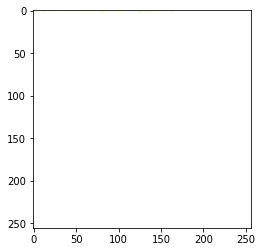

In [46]:
for p in range(0, total_tiles):
    tile = ts.getSingleTile(tile_position=p, **kwargs)['tile']
    unique = np.unique(tile)
    if len(unique) > 1:
        print p
        plt.imshow(tile)